# **Used Cars Price Prediction**

# Table of Contents

[Problem Definition](#Problem-Definition)

[Loading Libraries](#Loading-Libraries)

[Initial data processing: Linear Regression](#Initial-data-processing:-Linear-Regression)

[Feature Engineering : Linear Regression](#Feature-Engineering-:-Linear-Regression)

[Exploratory Data Analysis](#Exploratory-Data-Analysis)

 - [Univariate Analysis](#Univariate-Analysis)
   - [Categorical variables](#Categorical-variables)
   - [Numerical variables](#Numerical-variables)
   - [Q-Q plot](#Q-Q-plot)
   - [Final dataframe with combination of log transformed and nontransformed variables](#Get-a-Final-dataframe-with-combination-of-log-transformed-and-nontransformed-variables)
 - [Bivariate Analysis](#Bivariate-Analysis)
   - [1. Relation between Numerical variables](#1.-Relation-between-Numerical-variables)
     - [Correlation Matrix](#Correlation-Matrix)
     - [Pair Plot](#Pair-Plot)
     - [3D plot between interdependent variables](#3D-plot-between-interdependent-variables)
   - [2. Relation between Numerical and Categorical variables](#2.-Relation-between-Numerical-and-Categorical-variables)
   - [3. Relation between Categorical variables](#3.-Relation-between-Categorical-variables)
 - [Important Insights from EDA](#Important-Insights-from-EDA)
   
[Missing value, outlier treatment and Data pre-processing : Linear Regression](#Missing-value,-outlier-treatment-and-Data-pre-processing-:-Linear-Regression)

[A. Building Linear Regression Models](#A.-Building-Linear-Regression-Models)
 - [Make Model: 1st Model](#Make-Model:-1st-Model)
 - [Feature Engineering: 2nd Model](#Feature-Engineering:-2nd-Model)
 - [Make Model: 2nd Model](#Make-Model:-2nd-Model)
 - [Make Model: 3rd Model](#Make-Model:-3rd-Model)
 - [Checking Linear Regression Assumptions: 3rd model](#Checking-Linear-Regression-Assumptions:-3rd-model)
 - [Weighted Least Squares Regression](#Weighted-Least-Squares-Regression-Model)
 - [Define outliers: Drop them](#Define-outliers:-Drop-them)
 - [Making Model: 4th Model](#Making-Model:-4th-Model)
 - [Check for correlation between features](#Check-for-correlation-between-features)
 - [Create interaction term and refit the model with the interaction term and both original features](#Create-interaction-term-and-refit-the-model-with-the-interaction-term-and-both-original-features)
 - [Make Model by standarding the independent features: 5th Model](#Make-Model-by-standarding-the-independent-features:-5th-Model)
 - [Drop Mileage, run the Model again, check multicollinearity: 5th Model](#Drop-Mileage,-run-the-Model-again,-check-multicollinearity:-5th-Model)
 - [Applying cross validation to improve the model and evaluate it using different evaluation metrics](#Applying-cross-validation-to-improve-the-model-and-evaluate-it-using-different-evaluation-metrics)
 - [Model coefficients for Linear Regression](#Model-coefficients-for-Linear-Regression)
 - [Final equations for Linear Regression](#Final-equations-for-Linear-Regression)
 - [Interpretation of Coefficients in the Log-Transformed Car Price Model](#Interpretation-of-Coefficients-in-the-Log-Transformed-Car-Price-Model:)

[B. Regularization](#B.-Regularization)
 - [Ridge Regression](#Ridge-Regression)
   - [Ridge Regression with default parameters](#Ridge-Regression-with-default-parameters)
   - [Ridge Regression with optimized ⍺](#Ridge-Regression-with-optimized-$\alpha$)
 - [Lasso Regularization](#Lasso-Regularization)
   - [Lasso Regression with default parameters](#Lasso-Regression-with-default-parameters)
   - [Lasso Regression with optimized ⍺](#Lasso-Regression-with-optimized-$\alpha$)

[C. Decision Trees](#C.-Decision-Trees)
 - [Data pre-processing : Feature Engineering for Decision Trees](#Data-pre-processing-:-Feature-Engineering-for-Decision-Trees)
   - [Frequency Encoding for Location](#Frequency-Encoding-for-Location)
   - [Target Encoding for Car_Model](#Target-Encoding-for-Car_Model)
   - [One-Hot Encoding for Transmission, Owner_Type, and Fuel_Type](#One-Hot-Encoding-for-Transmission,-Owner_Type,-and-Fuel_Type)
 - [Missing Value treatment: Decision Trees](#Missing-Value-treatment:-Decision-Trees)
 - [Fit a Decision Tree Regressor: 1st Model](#Fit-a-Decision-Tree-Regressor:-1st-Model)
 - [Hyperparameter Tuning: Decision Tree: 2nd Model](#Hyperparameter-Tuning:-Decision-Tree:-2nd-Model)
 - [Visualize and Validate: 2nd Model](#Visualize-and-Validate:-2nd-Model)
 - [Observations on feature importances for tuned Decision Tree](#Observations-on-feature-importances-for-tuned-Decision-Tree)

[D. Random forest: 1st Model](#D.-Random-forest:-1st-Model)
 - [Hyperparameter Tuning: Tuned Random Forest: 2nd Model](#Hyperparameter-Tuning:-Tuned-Random-Forest:-2nd-Model)
 - [Hyperparameter Tuning: Tuned Random Forest 2: 3rd Model](#Hyperparameter-Tuning:-Tuned-Random-Forest-2:-3rd-Model)
   
[E. XG Boost](#E.-XG-Boost)
- [Hyperparameter Tuning: XG Boost](#Hyperparameter-Tuning:-XG-Boost)

[F. Make TWO Different Models for low and high priced cars](#F.-Make-TWO-Different-Models-for-low-and-high-priced-cars)
 - [Feature Engineering : TWO Different Models](#Feature-engineering-:-TWO-Different-Models)
 - [Random Forest modelling: price_below_20](#Random-Forest-modelling:-price_below_20)
 - [Hyperparameter Tuning: price_below_20](#Hyperparameter-Tuning:-price_below_20)
 - [Random Forest modelling: price_above_20](#Random-Forest-modelling:-price_above_20)

[Final Comparative Model Performances](#Final-Comparative-Model-Performances)

[Project Report](#Project-Report)
 - [Executive Summary](#Executive-Summary)
 - [Problem Summary](#Problem-Summary)
 - [Solution Summary](#Solution-Summary)
 - [Recommendations for Implementation](#Recommendations-for-Implementation)

## **Problem Definition**

### The Context:

* Why is this problem important to solve?

The used car market in India is growing at a rapid pace and has surpassed the new car market in sales volume.  According to a report of 2018-19,while new cars ales were 3.6 million units, around 4 million second-hand cars were bought and sold. The slowdown in new car sales has driven more people to consider buying pre-owned vehicles, making it essential to accurately price used cars to attract customers and increase sales. 

Unlike new cars, whose prices and supply are largely controlled by Original Equipment Manufacturers (OEMs) and thus fairly predictable—except for occasional dealership discounts at the final stage of the sales process—the used car market is much more unpredictable, with significant uncertainties in both pricing and availability.
Pricing used cars can be challenging as it depends on various factors such as mileage, brand, model, age, and condition of the vehicle. Accurately predicting the prices of these used cars will help start-up businesses like Cars4U make better decisions, attract more buyers, and remain competitive in the market.

#### Why is this problem important to solve?

Setting an accurate price is crucial for the success of any business in the pre-owned car market. Incorrectly priced cars can lead to lower sales, customer dissatisfaction, or loss of revenue. Predicting used car prices with high accuracy allows Cars4U to optimize their pricing strategy, offer competitive prices, and ultimately increase profitability. It can also help customers get fair value for their money, leading to a positive brand reputation.

### The Objective:

* What is the intended goal?

The primary objective of this project is to develop a robust machine learning model that can accurately predict the prices of used cars based on a diverse set of features such as car brand name, model, location, age, kilometers driven, mileage, engine capacity, power, transmission type, fuel type, owner type and other relevant attributes.

By leveraging this machine learning model, Cars4U aims to gain a competitive advantage in the pre-owned car market by understanding the key factors influencing car prices and establishing a more structured and consistent pricing strategy. This model will not only provide more accurate and fair price estimations for customers but will also enable Cars4U to make data-driven decisions regarding inventory management, marketing strategies, and sales optimization.

Moreover, having a well-calibrated pricing model will help Cars4U identify undervalued or overvalued cars, allowing for better negotiations, targeted promotions, and improved profit margins. Ultimately, the project seeks to reduce the uncertainties associated with used car pricing, support the company in capturing a larger market share, and enhance overall customer satisfaction by offering transparent and data-backed pricing recommendations.

### The Key Questions:

* **What are the key questions that need to be answered?**



* **What are the key factors affecting the price of used cars?**

Understanding the primary features that influence used car prices is crucial for both buyers and sellers. Are factors like brand, model, and fuel type more critical than age or mileage? This question delves into identifying the most influential variables and their relative importance, enabling a deeper understanding of what drives used car pricing.

* **How does each feature (e.g., age, mileage, brand) contribute to the overall price prediction?**

Each feature in the dataset has a unique impact on the car's resale value. For instance, how much does the car's age reduce its price per year? Does a car with more kilometers driven automatically have a lower price, or does the brand's reputation offset the negative impact? This question aims to quantify each feature’s influence on pricing, revealing whether some variables are more influential in predicting higher or lower prices.

* **How do external factors, such as location, fuel type, or ownership type, impact car prices?**

Factors like location, type of fuel used, and number of previous owners can have different implications on car pricing. This question focuses on understanding how these less obvious external factors influence the perceived value and whether their impact varies significantly across different regions or categories.

* **Which machine learning model performs best for predicting used car prices?**

Several machine learning models (e.g., linear regression, decision trees, random forest, etc.) can be employed for price prediction. This question assesses which model provides the most accurate and reliable predictions based on evaluation metrics such as R-squared, RMSE, and MAE. It helps in choosing the best algorithm that captures the nuances in the data.

* **What role does hyperparameter tuning and feature engineering play in improving model performance?**

Hyperparameter tuning and feature engineering can significantly impact a model's accuracy and generalizability. This question examines whether optimizing hyperparameters and creating new features (e.g., interaction terms or frequency encoding) can enhance the model’s performance and reduce prediction errors.

* **Can we detect and remove outliers that may skew the pricing model?**

Outliers can distort the model’s learning process and lead to inaccurate predictions. Addressing this question involves identifying extreme values and determining whether their exclusion improves the model’s stability and overall performance.

* **How can Cars4U utilize these insights to refine their pricing strategy and enhance profitability?**

Once the model is built, it is essential to translate its outputs into actionable business strategies. This question focuses on how Cars4U can leverage the model’s insights to adjust prices, identify undervalued or overvalued cars, and offer personalized discounts or promotions. The goal is to enhance profitability and customer satisfaction by implementing data-driven pricing strategies.

* **Are there any additional business rules or constraints that need to be incorporated into the pricing strategy?**

The model might not capture all business rules or constraints such as market demand, seasonal effects, or marketing priorities. This question addresses the need to include such factors in the final strategy to ensure the recommendations are practical and align with business goals.


### The Problem Formulation:

* What is it that we are trying to solve using data science?


* The problem is to predict the price of used cars based on a variety of features such as the car’s brand, model, age, mileage, engine specifications, and other attributes. Using data science techniques and machine learning models, we aim to create a robust prediction model that captures the complex relationships between these variables and the car’s resale price. The ultimate goal is to optimize the pricing strategy for Cars4U and identify which factors influence car prices the most.
 
 
* To approach this problem systematically, I began with exploratory data analysis (EDA), where I conducted a series of analyses to understand the distribution of each variable through univariate analysis and relationships between variables using bivariate and multivariate analysis. I also performed correlation matrix analysis to understand how different features interact with each other, which guided the selection of the most relevant variables. Further, I carried out feature engineering by creating meaningful features such as Manufacturer and Car Age to enhance the model’s predictive power. Additionally, I treated missing values and dealt with potential outliers to ensure data quality.


* With a refined dataset, I built a series of models, starting with Linear Regression. Initial linear regression models revealed that certain features had high multicollinearity or were statistically insignificant, leading to the decision to drop or modify these features. I evaluated the model against key linear regression assumptions like normality, homoscedasticity, and multicollinearity. To ensure that the linear regression model generalized well to unseen data, I used cross-validation techniques to evaluate the model’s performance and avoid potential overfitting.


* Subsequently, I applied regularization techniques such as Ridge and Lasso regression, tuning their hyperparameters to improve model stability and generalization. Additionally, I implemented Decision Tree Regressor models to capture complex non-linear interactions. After identifying potential overfitting issues in the initial decision tree models, I performed hyperparameter tuning to achieve a better balance between bias and variance.


* Finally, I explored ensemble methods by applying Random Forest Regressor, which significantly improved model performance. I also performed hyperparameter tuning for the random forest model to achieve the best results. After developing these models, I compared their performance using metrics like RMSE, MAE, R-squared, and Adjusted R-squared for both training and test data, providing a comprehensive evaluation of each model's effectiveness.


* This systematic approach allowed me to understand how different features contribute to the prediction of car prices and identify the best-performing models. Through these analyses and modeling techniques, I gained insights into the primary drivers of used car prices and developed a reliable pricing model for Cars4U to use for profitable, data-driven pricing strategies.



### **Data Dictionary**

**S.No.** : Serial Number

**Name** : Name of the car which includes Brand name and Model name

**Location** : The location in which the car is being sold or is available for purchase (Cities)

**Year** : Manufacturing year of the car

**Kilometers_driven** : The total kilometers driven in the car by the previous owner(s) in KM

**Fuel_Type** : The type of fuel used by the car (Petrol, Diesel, Electric, CNG, LPG)

**Transmission** : The type of transmission used by the car (Automatic / Manual)

**Owner** : Type of ownership

**Mileage** : The standard mileage offered by the car company in kmpl or km/kg

**Engine** : The displacement volume of the engine in CC

**Power** : The maximum power of the engine in bhp

**Seats** : The number of seats in the car

**New_Price** : The price of a new car of the same model in INR 100,000

**Price** : The price of the used car in INR 100,000 (**Target Variable**)

In [2]:
pip install seaborn


Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 9.6 MB/s eta 0:00:00ta 0:00:01
Note: you may need to restart the kernel to use updated packages.


## **Loading Libraries**

In [1]:
# Libraries for reading and manipulating data
import numpy as np
import pandas as pd

# Library for splitting and preparing the data
from sklearn.model_selection import train_test_split

# Libaries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To remove the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# To set the limit for the number of displayed rows
pd.set_option("display.max_rows", 100)

# Libraries for building linear regression model
from statsmodels.formula.api import ols
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression

import warnings
warnings.filterwarnings("ignore")

### **Load the data**

#from google.colab import drive
#drive.mount('/content/drive')

In [2]:
used_cars_data = pd.read_csv("/Users/deb/Desktop/MIT_course/Capstone_project/used_cars.csv")

In [3]:
# Copying data to another variable to avoid any changes to original data
data = used_cars_data.copy()

### **Data Overview**

- Observations
- Sanity checks

In [9]:
data.head()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price
0,0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.60,998.0,58.16,5.0,NaN,1.75
1,1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67,1582.0,126.20,5.0,NaN,12.50
2,2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.20,1199.0,88.70,5.0,8.61,4.50
3,3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77,1248.0,88.76,7.0,NaN,6.00
4,4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.20,1968.0,140.80,5.0,NaN,17.74


**Observations**

 The DataFrame has 14 columns as mentioned in the Data Dictionary. Data in each row corresponds to the data for a car.

In [10]:
data.tail()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price
7248,7248,Volkswagen Vento Diesel Trendline,Hyderabad,2011,89411,Diesel,Manual,First,20.54,1598.0,103.6,5.0,NaN,NaN
7249,7249,Volkswagen Polo GT TSI,Mumbai,2015,59000,Petrol,Automatic,First,17.21,1197.0,103.6,5.0,NaN,NaN
7250,7250,Nissan Micra Diesel XV,Kolkata,2012,28000,Diesel,Manual,First,23.08,1461.0,63.1,5.0,NaN,NaN
7251,7251,Volkswagen Polo GT TSI,Pune,2013,52262,Petrol,Automatic,Third,17.20,1197.0,103.6,5.0,NaN,NaN
7252,7252,Mercedes-Benz E-Class 2009-2013 E 220 CDI Avan...,Kochi,2014,72443,Diesel,Automatic,First,10.00,2148.0,170.0,5.0,NaN,NaN


### **Shape of the data**

In [6]:
print(f"In the data given for Used Car Price prediction, there are {data.shape[0]} rows and {data.shape[1]} columns")

In the data given for Used Car Price prediction, there are 7253 rows and 14 columns


### **Check the data types in columns**

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7253 entries, 0 to 7252
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   S.No.              7253 non-null   int64  
 1   Name               7253 non-null   object 
 2   Location           7253 non-null   object 
 3   Year               7253 non-null   int64  
 4   Kilometers_Driven  7253 non-null   int64  
 5   Fuel_Type          7253 non-null   object 
 6   Transmission       7253 non-null   object 
 7   Owner_Type         7253 non-null   object 
 8   Mileage            7251 non-null   float64
 9   Engine             7207 non-null   float64
 10  Power              7078 non-null   float64
 11  Seats              7200 non-null   float64
 12  New_price          1006 non-null   float64
 13  Price              6019 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 793.4+ KB


**Observations**

*  The dataset includes nine(9) numerical variables: "S.No.", "Year", "Kilometers_Driven", "Mileage", "Engine", "Power", "Seats", "Nre Price", and "Price". These columns represent quantitative information about the cars.

* There are five(5) categorical columns like "Name", "Location", "Fuel_Type", "Transmission", and "Owner_Type". These represent qualitative data about the cars.

* "Mileage", "Engine", "Power", "Seats", "New_price", and "Price" columns have missing values.



### **Check for missing values in the dataset**

In [8]:
data.isnull().sum()

S.No.                   0
Name                    0
Location                0
Year                    0
Kilometers_Driven       0
Fuel_Type               0
Transmission            0
Owner_Type              0
Mileage                 2
Engine                 46
Power                 175
Seats                  53
New_price            6247
Price                1234
dtype: int64

**Observations**

* There are no missing values for S. No, Name, Location, Year, Kilometers_Driven, Fuel_Type, Transmission, and Owner_Type.

* There are 2, 46, 175, 53, 6247 missing values in the Mileage, Engine, Power, Seats, and New_Price column.

* Even for the target variable (Price column), there are 1234 missing values.

Let us check the **percentage of missing values** using the below code.

In [9]:
(data.isnull().sum() / data.shape[0])*100

S.No.                 0.000000
Name                  0.000000
Location              0.000000
Year                  0.000000
Kilometers_Driven     0.000000
Fuel_Type             0.000000
Transmission          0.000000
Owner_Type            0.000000
Mileage               0.027575
Engine                0.634220
Power                 2.412795
Seats                 0.730732
New_price            86.129877
Price                17.013650
dtype: float64

**Observations**

The percentage of missing values is varying from 0.02%-86%. **New price** column seem to have a very **high amount of missing data (86%)**. So, we might **drop** this variable for our analysis at some point. Also, S. No. seems to be insignificant for the analysis, we will drop it as well.

## **Initial data processing: Linear Regression**

In [4]:
data.drop("S.No.", axis=1, inplace=True) #Dropping the S. No since it has no physical significance to affect the price


### **Check for duplicate data**

In [11]:
data.duplicated().sum()

1

In [12]:
# Display the duplicate rows
duplicate_rows = data[data.duplicated()]
print(duplicate_rows)

                     Name Location  Year  Kilometers_Driven Fuel_Type  \
6582  Honda City 1.5 E MT   Mumbai  2010              52000    Petrol   

     Transmission Owner_Type  Mileage  Engine  Power  Seats  New_price  Price  
6582       Manual      First     17.0  1497.0  118.0    5.0        NaN    NaN  


#### **Observations**

The data does not seem to be duplicated. Somehow, the Serial No. was same, possibly by mistake. We will not use Serial No. for our analysis, anyway.

### **Number of unique data points**

In [13]:
data.nunique()

Name                 2041
Location               11
Year                   23
Kilometers_Driven    3660
Fuel_Type               5
Transmission            2
Owner_Type              4
Mileage               438
Engine                150
Power                 383
Seats                   8
New_price             625
Price                1373
dtype: int64

In [14]:
print(data['Name'].value_counts().head(20))

Name
Mahindra XUV500 W8 2WD              55
Maruti Swift VDI                    49
Maruti Swift Dzire VDI              42
Honda City 1.5 S MT                 39
Maruti Swift VDI BSIV               37
Maruti Ritz VDi                     35
Toyota Fortuner 3.0 Diesel          35
Honda Amaze S i-Dtech               32
Hyundai Grand i10 Sportz            32
Honda City 1.5 V MT                 32
Honda Brio S MT                     32
Hyundai i10 Sportz                  31
Maruti Alto LXi                     30
Maruti Wagon R LXI                  29
Maruti Ertiga VDI                   28
Volkswagen Polo 1.2 MPI Highline    26
Maruti Wagon R VXI                  25
Hyundai EON Era Plus                25
Hyundai Verna 1.6 SX                25
Toyota Fortuner 4x2 AT              23
Name: count, dtype: int64


#### **Observations**

This frequency distribution suggests that the models listed more frequently, such as Mahindra XUV500 and Maruti Swift, might have a significant influence on overall patterns and predictions in the data due to their larger representation.

## **Feature Engineering : Linear Regression**


Think about it: The Name column in the current format might not be very useful in our analysis. Since the name contains both the brand name and the model name of the vehicle, the column would have too many unique values to be useful in prediction. Can we extract that information from that column?

Hint: With 2041 unique names, car names are not going to be great predictors of the price in our current data. But we can process this column to extract important information for example brand name.

* The Name column in the current format might not be very useful in our analysis. Since the name contains both the brand name and the model name of the vehicle, the column would have too many unique values to be useful in prediction.


**Manufacturer, Model, and Age are engineered features that were derived from the original data to capture key characteristics affecting car prices.** 

* **Manufacturer:** Created from the first word from the car name, it represents the brand of the car. The significance lies in the fact that different brands have varying reputations, perceived quality, and reliability, all of which can significantly impact the resale value of a car.

* **Model:** This feature was extracted to reflect specific characteristics and variations in car models under the same manufacturer. Certain models may have a higher demand for better features, making them more valuable in the used car market.

* **Age:** This feature was engineered by calculating the difference between the current year and the car’s manufacturing year. Age is crucial as it directly correlates with depreciation. Older cars generally have lower prices, so capturing this temporal information will help us in predicting how the car’s value decreases over time.

In [5]:
data["Manufacturer"] = data["Name"].str.split(" ").str[0]
data["Model"] = data["Name"].str.split(" ").str[1]
data.drop("Name", axis=1, inplace=True)
data["Age"] = 2019 - data["Year"]
data.drop("Year", axis=1, inplace=True)

In [6]:
print(data['Manufacturer'].value_counts().head(10))
print(data['Model'].value_counts().head(10))

Manufacturer
Maruti           1444
Hyundai          1340
Honda             743
Toyota            507
Mercedes-Benz     380
Volkswagen        374
Ford              351
Mahindra          331
BMW               312
Audi              285
Name: count, dtype: int64
Model
Swift     418
City      318
i20       303
Innova    203
Verna     200
Grand     183
Alto      183
i10       181
Wagon     178
Polo      178
Name: count, dtype: int64


**Observations**

**Maruti and Hyundai** are the most common car manufacturers in the dataset, with 1444 and 1340 cars, respectively. Similarly, the **Swift and City** models are the most frequent car models, indicating their popularity in the used car market. This distribution suggests that a large portion of the dataset consists of vehicles from these manufacturers and models, which could significantly influence the analysis and price prediction.

## **Exploratory Data Analysis**

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions:**

1. What is the summary statistics of the data? Explore summary statistics for numerical variables and the categorical variables
2. Find out number of unique observations in each category of categorical columns? Write your findings/observations/insights
3. Check the extreme values in different columns of the given data and write down the observtions? Remove the data where the values are un-realistic

In [18]:
# to get the statistical summary of the data
data.describe(include="all").T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Location,7253,11,Mumbai,949,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Kilometers_Driven,7253.0,NaN,NaN,NaN,58699.063146,84427.720583,171.0,34000.0,53416.0,73000.0,6500000.0
Fuel_Type,7253,5,Diesel,3852,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Transmission,7253,2,Manual,5204,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Owner_Type,7253,4,First,5952,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mileage,7251.0,NaN,NaN,NaN,18.14158,4.562197,0.0,15.17,18.16,21.1,33.54
Engine,7207.0,NaN,NaN,NaN,1616.57347,595.285137,72.0,1198.0,1493.0,1968.0,5998.0
Power,7078.0,NaN,NaN,NaN,112.765214,53.493553,34.2,75.0,94.0,138.1,616.0
Seats,7200.0,NaN,NaN,NaN,5.280417,0.809277,2.0,5.0,5.0,5.0,10.0
New_price,1006.0,NaN,NaN,NaN,22.779692,27.759344,3.91,7.885,11.57,26.0425,375.0


**Observations**

* Location: There are 11 unique cities in the dataset, with Mumbai being the most frequent location (949 instances).

* Year: The dataset contains cars manufactured between 1996 and 2019, with an average year around 2013.

* Kilometers_Driven: The distance cars have driven ranges from 171 km to 6,500,000 km, with an average of about 58,699 km and median of 53,416 km. **The maximum value of Kilometers driven looks very extreme, so it needs further investigation.**

* Fuel_Type: There are 5 fuel types, with Diesel being the most common (3852 cars).

* Transmission: Cars are either Manual or Automatic, with Manual transmission dominating (5204 cars).

* Owner_Type: There are 4 ownership types, and most cars (5952) are First-owner vehicles.

* Mileage: Cars have an average mileage of 18.14 km/l, ranging from 0 to 33.54 km/l. **0 Mileage seems a bit unrelatistic, so we have to investigate it further**.

* Engine: Engine sizes vary from 72 to 5998 cc, with an average of 1616 cc.

* Power: Car power ranges from 34.2 HP to 616 HP, with an average of 112.7 HP.

* Seats: Most cars have 5 seats, with a range between 2 and 10 seats.

* New_price: Only a subset of cars has new price data, ranging from 3.91 lakh to 375 lakh INR, with an average of 22.78 lakh INR and median of 11.57 lakh INR.

* Price: The price of used cars ranges from 0.44 lakh to 160 lakh INR, with an average price of 9.47 lakh and median price of 5.64 INR. **Seems like the distribution is left skewed, with some cars with higher price. This needs further investigation**

* Manufacturer: Maruti is the most common manufacturer, appearing 1444 times, among 33 brands.

* Model: Swift is the most frequent model, appearing 418 times, among 219 unique models.

### **Explore Unique Types of Categorical variables**

In [328]:
for column in data.select_dtypes(include='object').columns:
    print(f"For column: {column}")
    print(data[column].value_counts())
    print("/" )

For column: Location
Mumbai        949
Hyderabad     876
Kochi         772
Coimbatore    772
Pune          765
Delhi         660
Kolkata       654
Chennai       591
Jaipur        499
Bangalore     440
Ahmedabad     275
Name: Location, dtype: int64
/
For column: Fuel_Type
Diesel      3852
Petrol      3325
CNG           62
LPG           12
Electric       2
Name: Fuel_Type, dtype: int64
/
For column: Transmission
Manual       5204
Automatic    2049
Name: Transmission, dtype: int64
/
For column: Owner_Type
First             5952
Second            1152
Third              137
Fourth & Above      12
Name: Owner_Type, dtype: int64
/
For column: Manufacturer
Maruti           1444
Hyundai          1340
Honda             743
Toyota            507
Mercedes-Benz     380
Volkswagen        374
Ford              351
Mahindra          331
BMW               312
Audi              285
Tata              228
Skoda             202
Renault           170
Chevrolet         151
Nissan            117
Land        

**Observations**

* The eleven different cities are : Mumbai, Hyderabad, Coimbatore, Kochi, Pune, Delhi, Kolkata, Chennai, Jaipur, Bangalore, and Ahmedabad.

* The five different fuel types are: Diesel (3852), Petrol (3325), CNG (62),LPG (12), and Electric (2).

* There are 5204 Manual and 2049 Automatic cars.

* There are four different owner types: First (5952), Second (1152), Third (137), Fourth & Above (12).

* Top 5 manufacturers are: Maruti (1444), Hyundai (1340), Honda (743), Toyota (507), and Mercedes-Benz (380).

* Top 5 models are: Swift (418), City (318), i20 (303), Innova (203), and Verna (200).



## **Exploratory Data Analysis (EDA) Strategies**

### **For Exploratory Data Analysis (EDA), I conducted a comprehensive examination of all features using univariate, bivariate, and multivariate analysis to gain deeper insights into the dataset:**


### Univariate Analysis:


* **Categorical Variables:** I used count plots to understand the distribution of categories for features like 'Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer', 'Model', and 'Seats'.


* **Numerical Variables:** Histograms and boxplots were used to explore features such as 'Age', 'Kilometers_Driven', 'Mileage', 'Engine', 'Power', 'Seats', 'New_price', and 'Price'. For variables that were not normally distributed, I applied transformations to achieve a distribution suitable for linear regression analysis.

### Bivariate Analysis:

* **Numerical vs. Numerical:** I used a correlation matrix and pair plots to analyze the relationships between numerical features. For highly interdependent variables, I further explored these relationships with interactive 3D plots.


* **Numerical vs. Categorical:** Boxplots and violin plots were used to visualize the impact of categorical variables on numerical features, particularly focusing on their relationship with the target variable 'Price'.


* **Categorical vs. Categorical:** I used boxplots to identify interactions between different categorical variables and gain insights into how combinations of these categories influence the target variable.


This systematic approach to EDA allowed me to identify key patterns and relationships within the data, set the foundation for effective feature engineering, and select appropriate modeling techniques for robust predictions.

## **Univariate Analysis**

**Questions:**

1. Do univariate analysis for numerical and categorical variables?
2. Check the distribution of the different variables? is the distributions skewed?
3. Do we need to do log_transformation, if so for what variables we need to do?
4. Perfoem the log_transformation(if needed) and write down your observations?

### **Categorical variables**

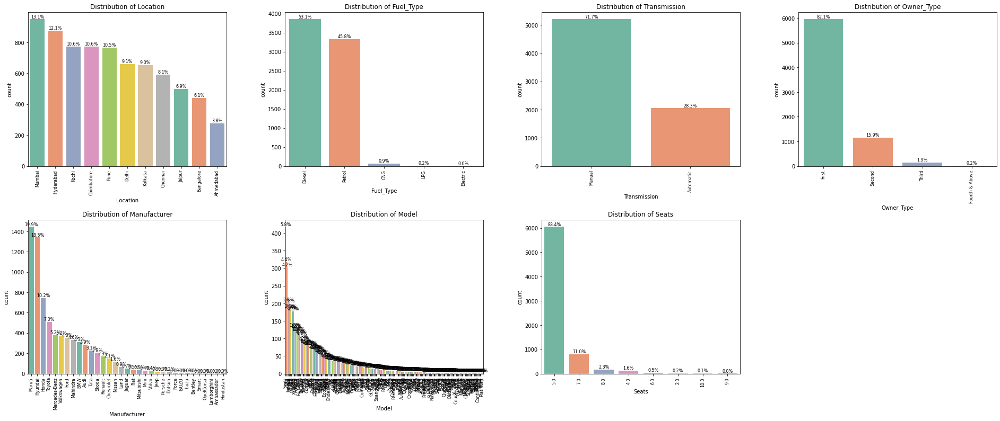

In [330]:
import matplotlib.pyplot as plt
import seaborn as sns


# List of categorical variables for which we want to plot boxplots
cat_vars = ['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer', 'Model', 'Seats']

# Updated function to work with subplots
def create_countplot_subplot(data, feature, ax, title=None, palette='Set2', top_n=None, perc=True):
    """
    Creates a countplot with multi-colored bars and labels (count or percentage) for a given feature in a subplot.

    Args:
        data: DataFrame containing the data
        feature: Feature/column name for the bar plot
        ax: The axis on which the plot will be drawn
        title (str, optional): Title for the plot (default: None)
        palette (str or list, optional): Color palette for the bars (default: 'Set2')
        top_n (int, optional): Number of top categories to display (default: None - all)
        perc (bool, optional): If True, display percentages instead of counts (default: False)
    """
    # Sort values and limit categories if top_n is provided
    order = data[feature].value_counts().index[:top_n]

    ax = sns.countplot(
        data=data,
        x=feature,
        palette=palette,  # Use the color palette here
        order=order,
        ax=ax  # Plot on the given subplot axis
    )

    total = len(data)  # Total number of rows for percentage calculation

    # Annotate with labels (count or percentage)
    for p in ax.patches:
        if perc:
            label = f"{p.get_height() / total * 100:.1f}%"  # Display percentage
        else:
            label = f"{p.get_height():.0f}"  # Display count as integer

        x = p.get_x() + p.get_width() / 2
        y = p.get_height()

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=8,  # changed the label size for better visibility
            xytext=(0, 5),
            textcoords="offset points"
        )

    ax.set_xlabel(feature, fontsize=10)  # Reduced xlabel size
    ax.set_title(title or f"Distribution of {feature}", fontsize=12)  # Reduced title size
    ax.tick_params(axis='x', rotation=90, labelsize=8)  # Adjusted tick label size

# Create subplots - 2 rows and 4 columns for 7 subplots
fig, axes = plt.subplots(2, 4, figsize=(28, 12))  # Increased figure size to make plots bigger
plt.tight_layout(pad=8.0)  # Adjusted spacing

# Loop over each categorical variable and its corresponding axis
for i, cat in enumerate(cat_vars):
    # Changed from 'i // 3, i % 3' to 'i // 4, i % 4' to correctly index a 2x4 grid
    create_countplot_subplot(data, cat, axes[i // 4, i % 4], palette='Set2')

# Hide the empty subplot
axes[1, 3].axis('off')  # This hides the last subplot which was empty

plt.show()



### **Observations**

**Location**: The data is well-distributed across different cities, with Mumbai (13.1%) and Hyderabad (12.1%) having the highest representation. This indicates a geographical concentration in certain areas which might influence price trends.

**Fuel Type:** Diesel cars (53.1%) dominate the dataset, followed by Petrol (45.8%). **They are the most used fuel (99%) type for cars**. This is likely to impact price predictions as diesel cars usually have higher resale values in certain markets due to their efficiency.

**Transmission:** Manual transmission (71.7%) is overwhelmingly more common than automatic (28.3%). This could be reflective of the Indian car market preference, affecting pricing.

**Owner Type:** Most cars are first-owner vehicles (82.1%), which typically suggests well-maintained vehicles with lower wear and tear, thus potentially commanding higher resale prices.

**Manufacturer:** Maruti (19.9%) and Hyundai (10.2%) are the top manufacturers, making up nearly a third of the dataset. Given Maruti’s strong brand presence and affordability, this could skew price distributions. The top 10 most popular manufacturers make 83.6% cars.

**Model:** There is a long tail of models, with some models like Maruti Swift appearing frequently. This could indicate brand loyalty and market share dominance.

**Seats:** Most cars have 5 seats (83.4%), indicating a focus on standard passenger vehicles rather than larger capacity vehicles like SUVs or vans.

Thus, the dataset appears to have a strong representation of mid-range cars with manual transmissions, diesel engines, and is dominated by first-owner vehicles from top manufacturers. These trends are likely to influence car pricing predictions significantly.


### **Numerical variables**

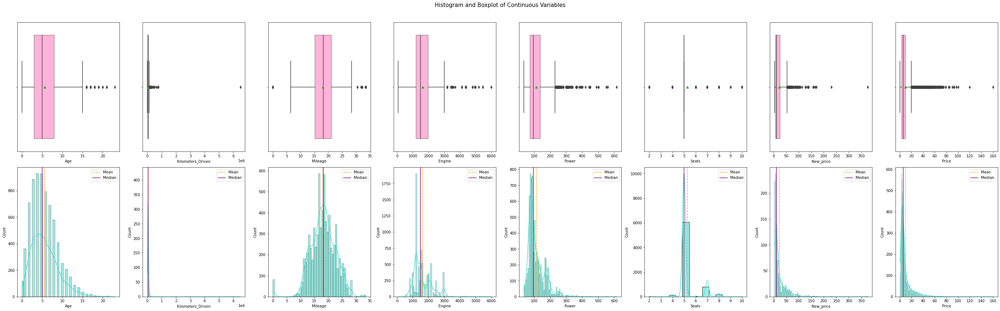

In [331]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of numeric variables
num_var = ['Age','Kilometers_Driven','Mileage', 'Engine', 'Power', 'Seats','New_price',"Price"]

# Function to create the combined histogram and boxplot
def histogram_boxplot(data, feature, ax_box, ax_hist, kde=True, bins=None):
    """
    Boxplot and histogram for a specific axis.

    Args:
        data: DataFrame or Series.
        feature: Name of the feature (column) in the DataFrame.
        ax_box: Axis for the boxplot.
        ax_hist: Axis for the histogram.
        kde: Whether or not to show density curve (default True).
        bins: Number of bins for the histogram plot (default None).
    """

    # Boxplot with lighter color using boxprops
    sns.boxplot(
        x=data[feature], ax=ax_box, showmeans=True, boxprops=dict(facecolor="hotpink", alpha=0.5)
    )

    # Histogram with different color palette
    if bins:
        sns.histplot(
            data=data, x=feature, kde=kde, ax=ax_hist, bins=bins, color="dodgerblue"
        )
    else:
        sns.histplot(
            data=data, x=feature, kde=kde, ax=ax_hist, color="turquoise"
        )

    # Mean and median lines with contrasting colors
    ax_hist.axvline(
        data[feature].mean(), color="orange", linestyle="--", label="Mean"
    )
    ax_hist.axvline(
        data[feature].median(), color="purple", linestyle="-", label="Median"
    )

    # Set legend for mean/median lines
    ax_hist.legend()

# Set up figure for subplots (1 row for boxplots and 1 row for histograms)
#fig, axes = plt.subplots(2, len(num_var), figsize=(24, 8), gridspec_kw={'height_ratios': [0.25, 0.75]})
#fig.suptitle('Histogram and Boxplot of Continuous Variables', fontsize=15)

# Create subplots - 2 rows and 4 columns for 7 subplots
fig, axes = plt.subplots(2, 8, figsize=(38, 12))  # Increased figure size to make plots bigger
plt.tight_layout(pad=8.0)  # Adjusted spacing
fig.suptitle('Histogram and Boxplot of Continuous Variables', fontsize=15)
#
# Loop through the numeric variables and create boxplot + histogram subplots
for i, col in enumerate(num_var):
    # Plot histogram and boxplot for actual values
    histogram_boxplot(data, col, ax_box=axes[0, i], ax_hist=axes[1, i])

# Adjust layout to fit the title and prevent overlap
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### **Observations**

**Age:** The distribution of Age is roughly normal, with most vehicles being less than 10 years old. The boxplot shows a few outliers representing much older cars, which could be vintage or classic models.

**Kilometers Driven:** This variable has a **highly skewed distribution**, with the majority of vehicles having driven less than 100,000 km. The boxplot shows several extreme outliers, indicating a few cars with exceptionally high mileage.

**Mileage:** The distribution of Mileage is close to normal, centered around 15-20 km/liter. There are a few outliers for very low or high mileage values, which might correspond to special models or fuel types. Also, there are some cars with zero mileage value which is unrealistic.

**Engine:** The Engine size distribution is relatively normal but has a longer tail on the right, indicating some vehicles with large engine capacities. The majority of vehicles have engines under 2000 cc.

**Power:** The distribution of Power is **highly skewed**, with a long tail on the right. Most vehicles fall under 150 bhp, but there are a few high-power cars that stretch the distribution.

**Seats:** The Seats variable has a nearly uniform distribution around 5 seats, which is typical for passenger vehicles. The outliers indicate a few vehicles with non-standard seat configurations like 2-seaters or larger vehicles with more than 7 seats.

**New Price:** The New Price variable shows a **highly skewed** distribution with the majority of cars priced below 50 lakhs. There are a few extreme outliers for luxury cars priced significantly higher.

**Price:** The distribution of Price for used cars is also **heavily skewed** to the right. Most cars are priced below 20 lakhs, with a few high-end vehicles causing the skew

**For the plots that look skewed, with multiple outlier points, the features are not normally distributed. To fit the data to non-tree-based machine learning models like linear regression, we need to address the skewness and transform the features to more closely follow a normal distribution. So, we will conduct Log transformation for the skewed variables.**

* **Variables that do not need Log Transformation:**

**Age, Mileage, Engine, and Seats** would not be log-transformed as their distributions are close to normal or uniform. Log transformation is typically used to handle skewness and reduce the impact of extreme values. Since these variables are already reasonably distributed, applying a log transformation would not provide any additional benefit and might even distort the interpretation.

* **Variables Suitable for Log Transformation:**

**Kilometers Driven, Power, New Price, and Price** should be log-transformed due to their highly skewed distributions. Log transformation helps to compress the range of these variables, making the distribution more symmetric and reducing the impact of extreme outliers. This can improve model performance by stabilizing variance and improving linear relationships between variables.

* Now, we will explore the data for the outlier most expensive car and try to investigate the reason behind its high price.

In [332]:
# Looking at data with highest price

data[data["Price"] >140]

,Location,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price,Manufacturer,Model,Age
4079,Hyderabad,25000,Diesel,Automatic,First,13.33,2993.0,255.0,5.0,230.0,160.0,Land,Rover,2


In [333]:
# Looking at data with highest price

data[(data["Manufacturer"] == "Land") & (data["Model"] == "Rover")]


,Location,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price,Manufacturer,Model,Age
13,Delhi,72000,Diesel,Automatic,First,12.70,2179.0,187.70,5.0,NaN,27.00,Land,Rover,5
14,Pune,85000,Diesel,Automatic,Second,0.00,2179.0,115.00,5.0,NaN,17.50,Land,Rover,7
191,Coimbatore,36091,Diesel,Automatic,First,12.70,2179.0,187.70,5.0,NaN,55.76,Land,Rover,1
311,Delhi,44000,Diesel,Automatic,First,12.70,2179.0,187.70,5.0,NaN,44.00,Land,Rover,2
399,Hyderabad,56000,Diesel,Automatic,First,12.70,2179.0,187.70,5.0,NaN,30.00,Land,Rover,7
404,Coimbatore,34990,Diesel,Automatic,First,12.70,2179.0,187.70,5.0,NaN,53.83,Land,Rover,2
410,Coimbatore,95649,Diesel,Automatic,First,12.70,2179.0,187.70,5.0,NaN,29.67,Land,Rover,5
480,Delhi,24000,Diesel,Automatic,Second,15.68,1999.0,177.00,5.0,NaN,33.50,Land,Rover,4
521,Coimbatore,49275,Diesel,Automatic,First,12.70,2179.0,187.70,5.0,NaN,45.64,Land,Rover,2
701,Chennai,109000,Diesel,Automatic,First,12.39,2179.0,147.51,5.0,NaN,16.50,Land,Rover,8


**Observations**

From the prices of Land Rovers, they seem have a wide range, depending on if they are automatic or manual, kilometers travelled, mileage, engine, power, and seats. So, 160 lakh or 1.6 Cr INR price may not be an outlier.


### **Q-Q plot**

Back to the investigation of the distribution of the numerical variables, another quick and effective way to understand the **shape of the data distribution compared to a standard distribution is a Q-Q plot.**

* **Straight Line**: If the points fall approximately along a straight diagonal line, the data follows the theoretical normal distribution.

* **Curved or Deviating Points**: If the points deviate significantly from the line, the data does not follow the theoretical distribution.


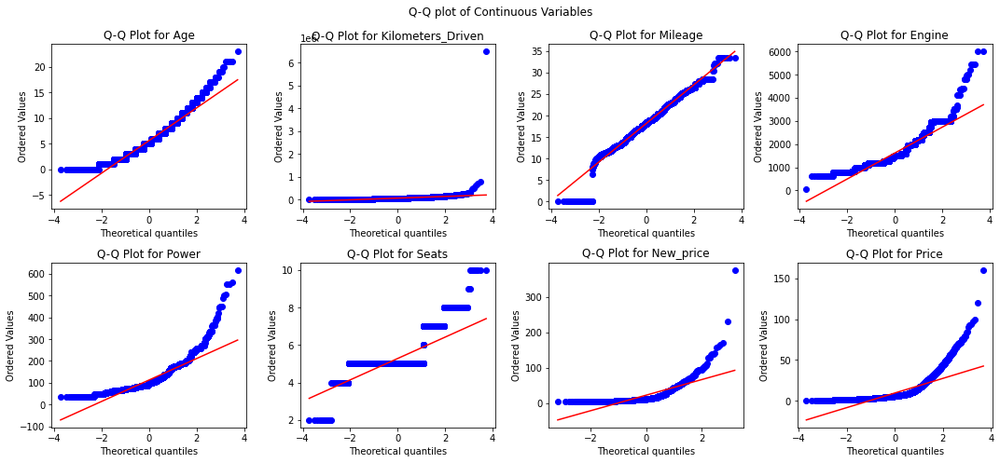

In [334]:
import seaborn as sns
from scipy import stats  # Correct module for probplot
import pylab
import matplotlib.pyplot as plt  # Import the matplotlib.pyplot module

num_var = ['Age','Kilometers_Driven','Mileage', 'Engine', 'Power', 'Seats','New_price',"Price"]

fig, axes = plt.subplots(2, 4, figsize=(15, 7))
fig.suptitle('Q-Q plot of Continuous Variables', fontsize=12)

for i, col in enumerate(num_var):
    # Use stats.probplot instead of sns.probplot
    stats.probplot(data[col].dropna(), dist="norm", plot=axes[i // 4, i % 4])
    axes[i // 4, i % 4].set_title(f"Q-Q Plot for {col}")  # Add title for clarity


plt.tight_layout()
plt.show()


**Observations**

**Age, Mileage, and Seats**: These Q-Q plots show a roughly linear relationship along the diagonal, indicating that these variables are close to a normal distribution. There are slight deviations at the tails, but they are not significant enough to require log transformation.

**Kilometers Driven, Power, New Price, and Price**: These Q-Q plots show pronounced curvature and deviation from the diagonal, especially at the tails. This suggests that these variables are heavily skewed and not normally distributed, reinforcing the need for log transformation to reduce skewness and bring them closer to a normal distribution.

**Engine**: The Q-Q plot for Engine shows moderate skewness but not as pronounced as the other variables like Price or Kilometers Driven.

### **Get a Final dataframe with combination of log transformed and nontransformed variables**

In [7]:
# List of variables that should undergo log transformation
log_transform_vars = ['Kilometers_Driven', 'Power', 'New_price', 'Price']

# List of variables that should not undergo log transformation, will keep Price here as well since that is the dependent variable
no_log_transform_vars = ['Age', 'Mileage', 'Engine', 'Seats', 'Price']

# Create separate DataFrames for log and no-log transformation variables
no_log_transform_data = data[no_log_transform_vars].copy()
log_transform_data = data[log_transform_vars].copy()

# Apply log transformation to the log_transform_data DataFrame
log_transform_data = log_transform_data.apply(lambda x: np.log1p(x))  # Use log1p to handle zero values safely

# Combine both DataFrames into the final dataset
final_data = pd.concat([no_log_transform_data, log_transform_data], axis=1)

# Display the combined final DataFrame
final_data.head()



,Age,Mileage,Engine,Seats,Price,Kilometers_Driven,Power,New_price,Price
0,9,26.60,998.0,5.0,1.75,11.184435,4.080246,NaN,1.011601
1,4,19.67,1582.0,5.0,12.50,10.621352,4.845761,NaN,2.602690
2,8,18.20,1199.0,5.0,4.50,10.736418,4.496471,2.262804,1.704748
3,7,20.77,1248.0,7.0,6.00,11.373675,4.497139,NaN,1.945910
4,6,15.20,1968.0,5.0,17.74,10.613271,4.954418,NaN,2.930660


In [8]:
# List of variables that should undergo log transformation
log_transform_vars = ['Kilometers_Driven', 'Power', 'New_price', 'Price']

# List of variables that should not undergo log transformation, will keep Price here as well since that is the dependent variable
no_log_transform_vars = ['Age', 'Mileage', 'Engine', 'Seats', 'Price']

# Create separate DataFrames for log and no-log transformation variables
no_log_transform_data = data[no_log_transform_vars].copy()
log_transform_data = data[log_transform_vars].copy()

# Apply log transformation to the log_transform_data DataFrame
log_transform_data = log_transform_data.apply(lambda x: np.log1p(x))  # Use log1p to handle zero values safely

# Rename the log-transformed columns to indicate the transformation
log_transform_data.columns = [f"{col}_log" for col in log_transform_data.columns]

# Combine both DataFrames into the final dataset
final_data = pd.concat([no_log_transform_data, log_transform_data], axis=1)

# Display the combined final DataFrame
final_data.head()


,Age,Mileage,Engine,Seats,Price,Kilometers_Driven_log,Power_log,New_price_log,Price_log
0,9,26.60,998.0,5.0,1.75,11.184435,4.080246,NaN,1.011601
1,4,19.67,1582.0,5.0,12.50,10.621352,4.845761,NaN,2.602690
2,8,18.20,1199.0,5.0,4.50,10.736418,4.496471,2.262804,1.704748
3,7,20.77,1248.0,7.0,6.00,11.373675,4.497139,NaN,1.945910
4,6,15.20,1968.0,5.0,17.74,10.613271,4.954418,NaN,2.930660


In [337]:
# to get the statistical summary of the data
final_data.describe(include="all").T



,count,mean,std,min,25%,50%,75%,max
Age,7253.0,5.634634,3.254421,0.000000,3.000000,5.000000,8.000000,23.000000
Mileage,7251.0,18.141580,4.562197,0.000000,15.170000,18.160000,21.100000,33.540000
Engine,7207.0,1616.573470,595.285137,72.000000,1198.000000,1493.000000,1968.000000,5998.000000
Seats,7200.0,5.280417,0.809277,2.000000,5.000000,5.000000,5.000000,10.000000
Price,6019.0,9.479468,11.187917,0.440000,3.500000,5.640000,9.950000,160.000000
Kilometers_Driven_log,7253.0,10.761010,0.716276,5.147494,10.434145,10.885884,11.198228,15.687313
Power_log,7078.0,4.644392,0.410933,3.561046,4.330733,4.553877,4.935193,6.424869
New_price_log,1006.0,2.777358,0.813769,1.591274,2.184364,2.531313,3.297390,5.929589
Price_log,6019.0,2.018429,0.748221,0.364643,1.504077,1.893112,2.393339,5.081404


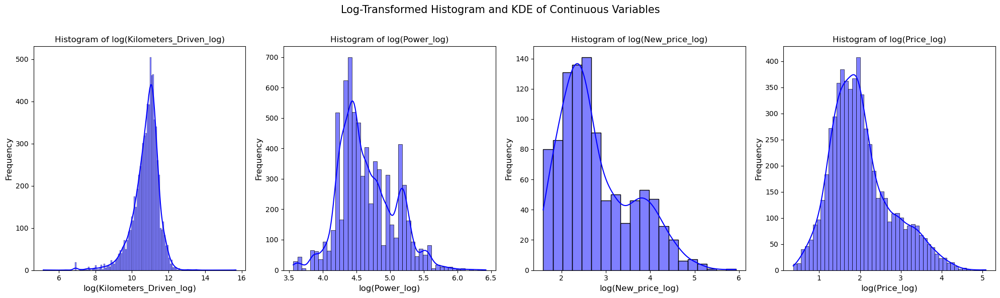

In [70]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Create subplots with 1 row and 4 columns
fig, axes = plt.subplots(1, 4, figsize=(20, 6))
fig.suptitle('Log-Transformed Histogram and KDE of Continuous Variables', fontsize=15)

# Loop through each log-transformed variable and plot its histogram in separate subplots
for i, col in enumerate(log_transform_data.columns):
    # Plot individual histograms with KDE on each subplot axis
    sns.histplot(log_transform_data[col], kde=True, ax=axes[i], color='blue')
    axes[i].set_title(f"Histogram of log({col})", fontsize=12)
    axes[i].set_xlabel(f"log({col})", fontsize=12)
    axes[i].set_ylabel('Frequency', fontsize=12)

# Adjust layout to fit the suptitle
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


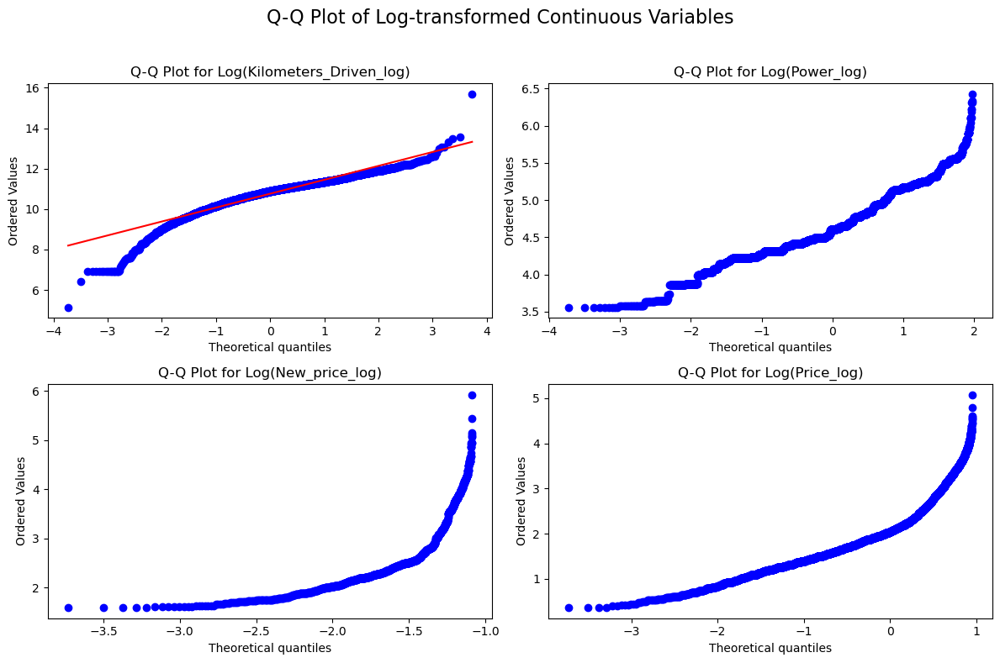

In [71]:
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt

# Create a figure with 2 rows and 2 columns for the log-transformed variables
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('Q-Q Plot of Log-transformed Continuous Variables', fontsize=16)

# Loop through the log-transformed variables and create Q-Q plots
for i, col in enumerate(log_transform_data.columns):
    # Generate Q-Q plot on the specific axis for each log-transformed variable
    stats.probplot(log_transform_data[col], dist="norm", plot=axes[i // 2, i % 2])

    # Set title for each subplot indicating the variable
    axes[i // 2, i % 2].set_title(f"Q-Q Plot for Log({col})")

# Adjust layout to fit the title and prevent overlap
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### **Observations**

* **Improvement in Histograms:** The log-transformed histograms generally look better, with reduced skewness and a more symmetric appearance. However, variables like Power still exhibit a bimodal nature, which suggests that log transformation alone may not be sufficient. We will look into it later.

* **Improvement in Q-Q Plots:** The Q-Q plots for log-transformed variables show better alignment with the theoretical normal line compared to their original forms. While they are not perfectly normal, the transformations have reduced skewness and made the distributions more symmetric.




## **Bivariate Analysis**

**Questions:**

1. Plot a scatter plot for the log transformed values(if log_transformation done in previous steps)?
2. What can we infer form the correlation heatmap? Is there correlation between the dependent and independent variables?
3. Plot a box plot for target variable and categorical variable 'Location' and write your observations?

## **There are three kinds of combinations that we will explore here:**

### **Relation between Numerical variables**

I used a correlation matrix and pair plots to analyze the relationships between numerical features. For highly interdependent variables, I further explored these relationships with interactive 3D plots.

### **Relation between Numerical and Categorical variables**

Boxplots and violin plots were used to visualize the impact of categorical variables on numerical features, particularly focusing on their relationship with the target variable 'Price'.

### **Relation between Categorical variables**

I used boxplots to identify interactions between different categorical variables and gain insights into how combinations of these categories influence the target variable.

### **1. Relation between Numerical variables**

### **Correlation Matrix**

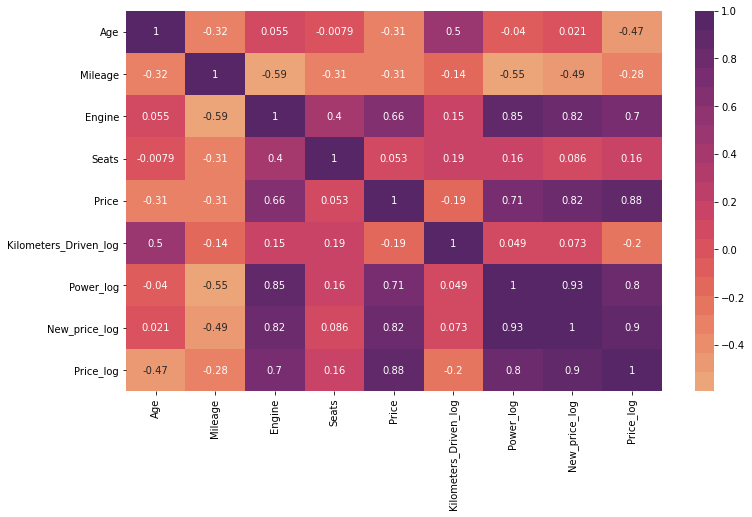

In [340]:
# Create the correlation matrix
corr_matrix = final_data.corr()

plt.figure(figsize=(12, 7))
sns.heatmap(data=corr_matrix, annot=True, cmap=sns.color_palette("flare", 20))
plt.show()

### **Filter correlations greater than or equal to 0.5 or less than or equal to -0.5**

In [341]:
# Filter correlations greater than or equal to 0.5 or less than or equal to -0.5
high_corr = corr_matrix[(corr_matrix >= 0.5) | (corr_matrix <= -0.5)]

# Remove self-correlations (correlations of a variable with itself, which are always 1)
high_corr = high_corr[high_corr != 1]

# Display the result
print(high_corr)

                            Age   Mileage    Engine  Seats     Price  \
Age                         NaN       NaN       NaN    NaN       NaN   
Mileage                     NaN       NaN -0.593569    NaN       NaN   
Engine                      NaN -0.593569       NaN    NaN  0.658354   
Seats                       NaN       NaN       NaN    NaN       NaN   
Price                       NaN       NaN  0.658354    NaN       NaN   
Kilometers_Driven_log  0.500039       NaN       NaN    NaN       NaN   
Power_log                   NaN -0.552303  0.850585    NaN  0.712124   
New_price_log               NaN       NaN  0.815032    NaN  0.818573   
Price_log                   NaN       NaN  0.700408    NaN  0.882714   

                       Kilometers_Driven_log  Power_log  New_price_log  \
Age                                 0.500039        NaN            NaN   
Mileage                                  NaN  -0.552303            NaN   
Engine                                   NaN   0.850585  

### **Observations**

**Highly Positive Correlations:**

* Power_log & Engine (0.85): Strong correlation, indicating that higher engine capacity is associated with higher power.

* New Price log, Price log & Engine (0.7, 0.82): Vehicles with larger engines tend to have a higher new price.

* Price log & New Price log (0.90): High correlation suggests that the new price of a vehicle is a good predictor of its current price.

* Price log & Power log (0.80): More powerful vehicles tend to have higher prices, indicating a premium for performance.

* New Price log & Power log (0.93): Strong relationship showing that vehicles with more power are priced higher when new.

* Kilometers Driven log & Age (0.50): Older cars tend to have higher mileage (kilometers driven).

**Negative Correlations:**

* Age & Price log (-0.47): Older cars generally have lower prices, as expected with depreciation.

* Mileage & Engine (-0.59): Vehicles with higher engine capacities tend to have lower fuel efficiency (mileage).

* Mileage & Power log (-0.55): More powerful cars tend to have lower mileage due to higher fuel consumption.


There are strong correlations between engine size, power, and price-related variables. These variables are interdependent and can significantly impact vehicle pricing. The negative correlations with mileage indicate trade-offs between performance and efficiency.

**Multicollinearity ?**

 Variables like engine, power, new price, and price are all highly correlated with one another. This is something to investigate for in regression models, as high multicollinearity can make it harder to determine the effect of each variable independently.


### **Pair Plot**

<Figure size 864x504 with 0 Axes>

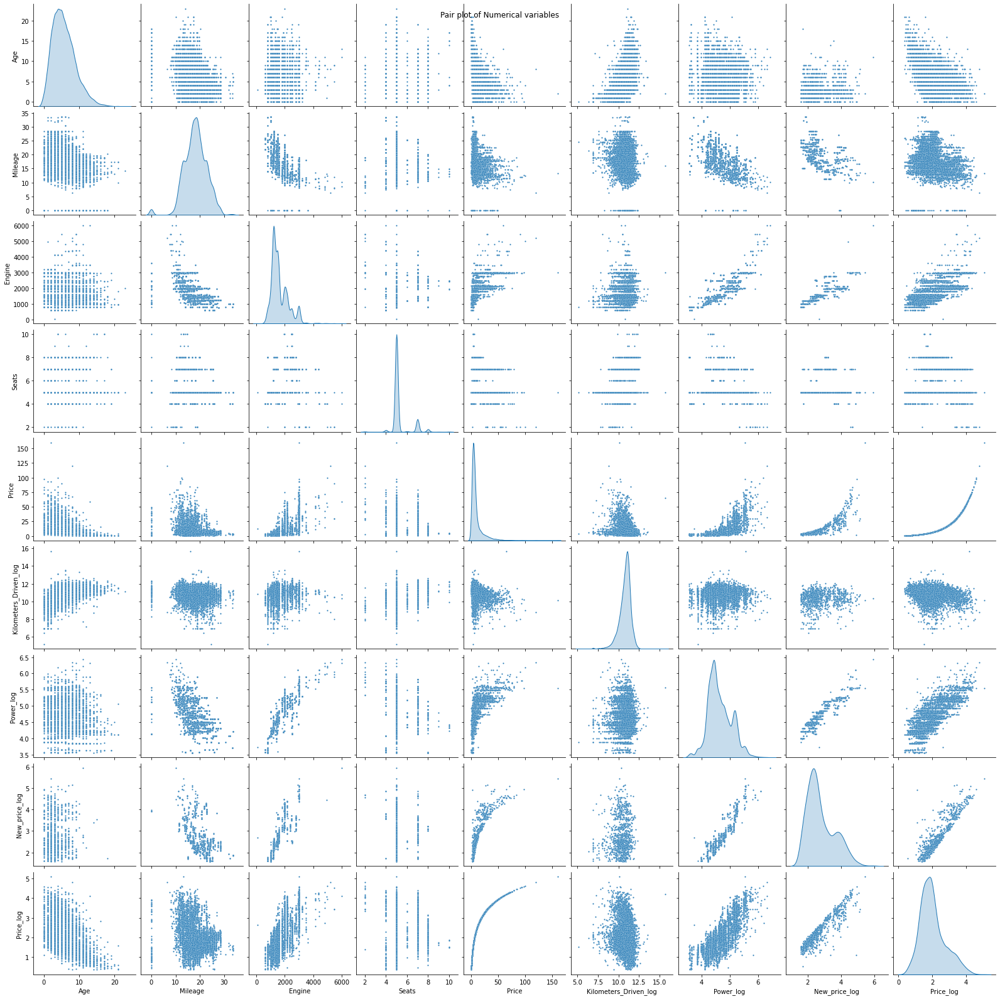

In [342]:
plt.figure(figsize=(12, 7))

a = sns.pairplot(data=final_data,
                 diag_kind='kde', plot_kws={"s": 5})
a.fig.suptitle("Pair plot of Numerical variables");

### **Observations**

1. **Diagonal Plots (Univariate Analysis):**

* Diagonal plots show the distribution of individual variables.
Variables like Age and Kilometers Driven are slightly skewed (Kilometers Driven is log transformed), while Mileage and Engine are closer to normal distribution but have some spread.
Seats have a discrete distribution, indicating categories rather than continuous values.

2. **Bivariate Relationships:**

* **Price vs. Engine, Power, and New Price:**
There is a clear positive linear relationship, as vehicles with higher engine capacity, power, and new price also have higher resale prices. This is consistent with the high positive correlations observed in the correlation matrix.

* **Mileage vs. Engine and Power:**
Negative relationship: Higher engine capacity and power tend to have lower mileage, reflecting the trade-off between performance and fuel efficiency.

* **Price vs. Age:**
There is a negative trend, as older vehicles tend to have lower prices, which indicates depreciation over time.

* **Seats vs. Price:**
Price remains fairly constant across different seat configurations, suggesting that the number of seats does not have a significant impact on vehicle price.

* **Kilometers Driven vs. Age:**
There is a cluster pattern, indicating that older cars generally have higher kilometers driven, which is logical and expected.
Scatter Plot Analysis:

* **Power vs. Engine:**
Strong linear relationship, indicating that engine capacity directly contributes to power output.


Thus, the pair plot provides a good overview of relationships and distributions among variables. It confirms key findings from the correlation matrix and shows clear positive and negative trends between variables, helping identify key influencers on car price and performance.



In [76]:
pip install plotly


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 9.3 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


### **3D plot between interdependent variables**

Now, we will explore the relationship between interdepndent variables like Price, New_price, Power, and Engine.

In [77]:
import pandas as pd
import plotly.express as px
import numpy as np

# List of variables
corr_var1 = ['Engine', 'Power_log', 'Price_log']

# Apply log transformation to Power and Price, and keep Engine as is
log_corr_var = final_data[corr_var1].dropna().copy()
log_corr_var['Power_log'] = np.log(log_corr_var['Power_log'] + 1)
log_corr_var['Price_log'] = np.log(log_corr_var['Price_log'] + 1)

# Create an interactive 3D scatter plot using plotly
fig = px.scatter_3d(log_corr_var, x='Engine', y='Power_log', z='Price_log', color='Price_log', title='3D Scatter Plot: Engine vs. Log(Power) vs. Log(Price)')

# Show the interactive plot
fig.show()

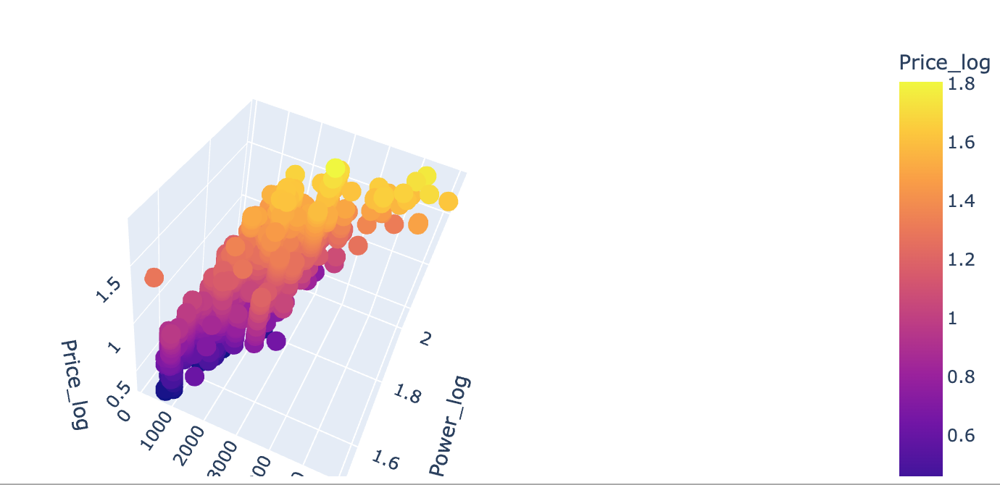

In [72]:
from IPython.display import Image

# Load and display the image from a file path
Image(filename='/Users/deb/Desktop/MIT_course/Capstone_project/Your_work/engine_power_price.png')

In [13]:
import pandas as pd
import plotly.express as px
import numpy as np

# List of variables
corr_var1 = ['Engine', 'New_price_log', 'Price_log']

# Apply log transformation to Power and Price, and keep Engine as is
log_corr_var = final_data[corr_var1].dropna().copy()
log_corr_var['New_price_log'] = np.log(log_corr_var['New_price_log'] + 1)
log_corr_var['Price_log'] = np.log(log_corr_var['Price_log'] + 1)

# Create an interactive 3D scatter plot using plotly
fig = px.scatter_3d(log_corr_var, x='Engine', y='New_price_log', z='Price_log', color='Price_log', title='3D Scatter Plot: Engine vs. Log(New_price) vs. Log(Price)')

# Show the interactive plot
fig.show()

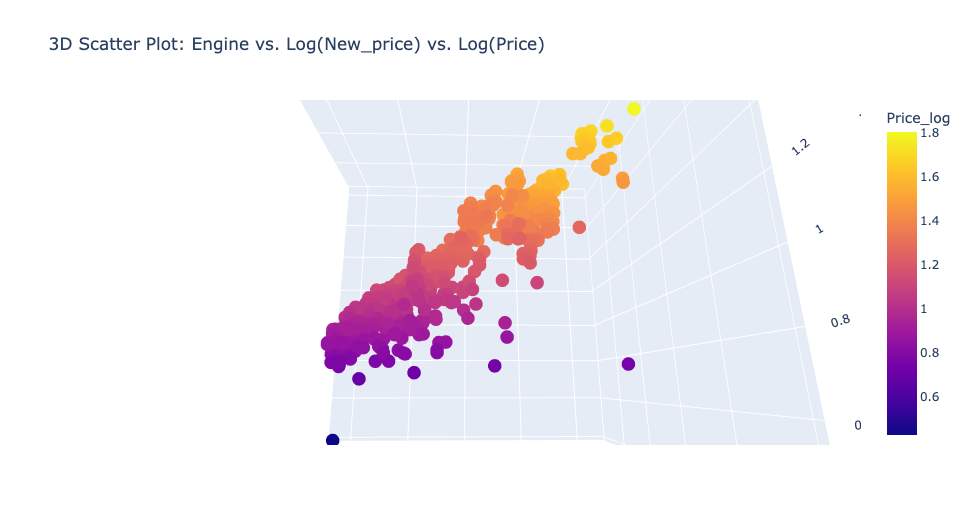

In [73]:
from IPython.display import Image

# Load and display the image from a file path
Image(filename='/Users/deb/Desktop/MIT_course/Capstone_project/Your_work/engine_new_price_price.png')

In [14]:
import pandas as pd
import plotly.express as px
import numpy as np

# List of variables
corr_var1 = ['Engine', 'Power_log', 'New_price_log']

# Apply log transformation to Power and Price, and keep Engine as is
log_corr_var = final_data[corr_var1].dropna().copy()
log_corr_var['Power_log'] = np.log(log_corr_var['Power_log'] + 1)
log_corr_var['New_price_log'] = np.log(log_corr_var['New_price_log'] + 1)

# Create an interactive 3D scatter plot using plotly
fig = px.scatter_3d(log_corr_var, x='Engine', y='Power_log', z='New_price_log', color='New_price_log', title='3D Scatter Plot: Engine vs. Log(Power) vs. Log(New_price)')

# Show the interactive plot
fig.show()

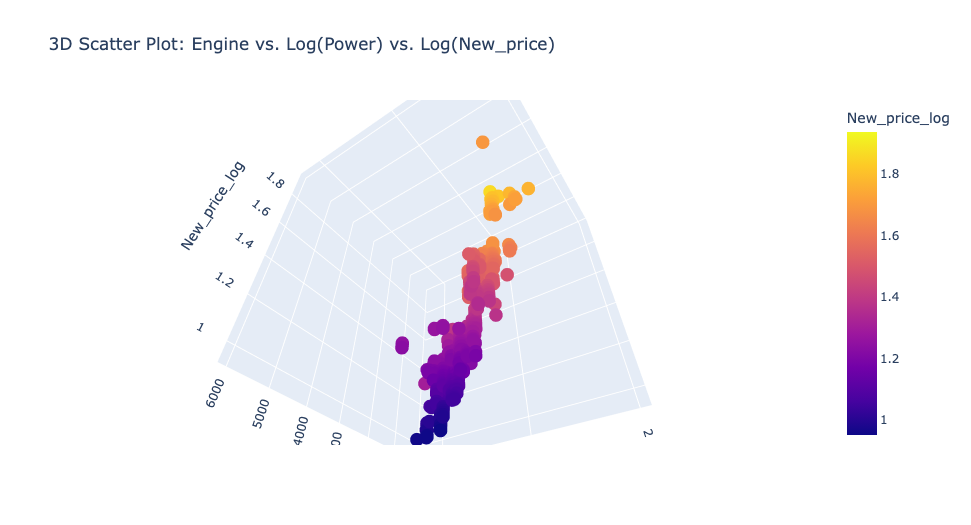

In [74]:
from IPython.display import Image

# Load and display the image from a file path
Image(filename='/Users/deb/Desktop/MIT_course/Capstone_project/Your_work/engine_power_new_price.png')

#### **Observations**

**In this 3D plot also the correlation between these three variables is very evident. We may need to drop some of them later to avoid multicollinearity.**

### **2. Relation between Numerical and Categorical variables**

###  **Price vs Categorical variables**

### Boxplot for Price vs all categorical variables 

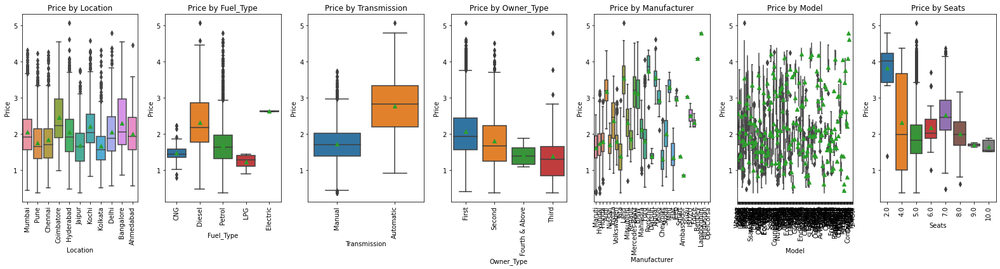

In [352]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def boxplot_price_by_category(data, categorical_column, ax):
    sns.boxplot(
        x=categorical_column,
        y=np.log(data["Price"].dropna() + 1),
        showmeans=True,
        data=data,
        ax=ax
    )
    ax.set_title(f"Price by {categorical_column}")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# List of categorical variables for which we want to plot boxplots
categorical_columns = ['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer', 'Model', 'Seats']

# Set up the figure and axes for 7 subplots (1 row, 7 columns)
fig, axes = plt.subplots(1, 7, figsize=(22, 6))

# Loop through the categorical columns and plot each one in a subplot
for i, col in enumerate(categorical_columns):
    boxplot_price_by_category(data, col, axes[i])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


* **Bangalore and Coimbatore have a significant number of high-priced cars**, suggesting these areas could have either a more premium market or a wider variety of car models.

* In contrast, Pune, Chennai, and Jaipur show less variation in prices and fewer expensive cars, potentially indicating a more uniform and budget-friendly car market.

* While the median prices seem similar across cities, the variation and presence of high-end cars differ, possibly due to local market demands or purchasing power.

* Automatic cars are much more expensive than the manual ones.

* The first hand cars are more expensive than the second hand ones.

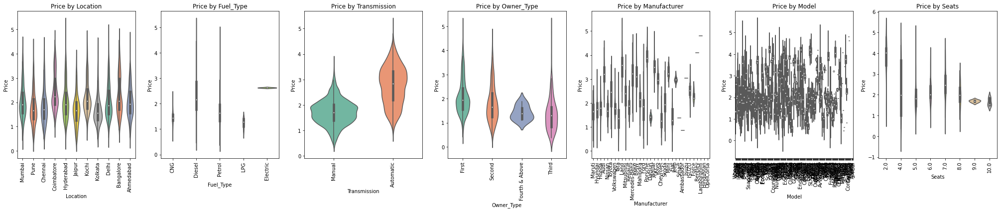

In [353]:
def violin_plot_by_category(data, numerical_column, categorical_column, ax):
    sns.violinplot(
        x=categorical_column,
        y=np.log(data[numerical_column].dropna() + 1),
        data=data,
        ax=ax,
        palette='Set2'
    )
    ax.set_title(f"{numerical_column} by {categorical_column}")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Example usage for the same categorical columns as before
fig, axes = plt.subplots(1, 7, figsize=(28, 6))

# List of categorical variables for which we want to plot boxplots
categorical_columns = ['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer', 'Model', 'Seats']

for i, col in enumerate(categorical_columns):
    violin_plot_by_category(data, "Price", col, axes[i])

plt.tight_layout()
plt.show()


#### **Observations**

From the above two types of plots we have following understandings

**Price by Location:** Prices vary slightly by location, with Kochi, Coimbatore, and Bangalore showing higher price distributions compared to other cities. Higher prices in those locations may reflect market dynamics, demand, and economic conditions of those cities.

**Price by Fuel Type:** Diesel cars have the highest median prices (except Electrical cars which are low population), followed by Petrol, while CNG and LPG vehicles have lower median prices. Diesel cars typically command higher resale value due to better fuel efficiency and popularity in specific markets.

**Price by Transmission:** Cars with automatic transmission have higher prices compared to manual cars. Automatic transmission vehicles are usually considered more premium, leading to higher resale prices.

**Price by Owner Type:** First-owner vehicles have higher prices, and as the number of previous owners increases, prices tend to decrease. First-owner vehicles are perceived to be better maintained and less used, making them more valuable.

**Price by Manufacturer:** There is a wide variation in prices across different manufacturers. Premium brands like Mercedes-Benz, Audi, and BMW show higher prices compared to brands like Maruti and Hyundai. The brand value significantly influences the vehicle's price, with premium and luxury brands having higher resale prices due to quality, features, and brand reputation.

**Price by Model:**  There is a significant spread in prices across different models, even within the same manufacturer. Some models have a wider range of prices, indicating variability in trim levels and features.

**Price by Seats:** Cars with 2 seats and high-end SUVs with 7-10 seats show higher price ranges. Standard 5-seater vehicles have moderate prices. Vehicles with 2 seats are typically sports cars, while those with 7-10 seats are larger SUVs or luxury vans, both of which command higher prices.


Thus, factors like location, fuel type, transmission, ownership, manufacturer, and seating capacity have a clear impact on the price distribution of vehicles. This reflects market preferences, brand value, and the perceived quality of the vehicle based on its features and attributes.

In [354]:
data.groupby(["Manufacturer"])["Price"].mean().sort_values(ascending=False)


Manufacturer
Lamborghini      120.000000
Bentley           59.000000
Porsche           48.348333
Land              39.259500
Jaguar            37.632250
Mini              26.896923
Mercedes-Benz     26.809874
Audi              25.537712
BMW               25.243146
Isuzu             20.000000
Volvo             18.802857
Jeep              18.718667
ISUZU             12.045000
Toyota            11.580024
Mitsubishi        11.058889
Force              9.333333
Mahindra           8.045919
Skoda              7.559075
Ford               6.889400
Renault            5.799034
Honda              5.411743
Hyundai            5.343433
Volkswagen         5.307270
Nissan             4.738352
Maruti             4.517267
Tata               3.562849
Fiat               3.269286
Datsun             3.049231
Chevrolet          3.044463
Smart              3.000000
Ambassador         1.350000
Hindustan               NaN
OpelCorsa               NaN
Name: Price, dtype: float64

**Observations**

The results align closely with our expectations based on domain knowledge. Luxury brands like Lamborghini have significantly higher prices compared to more budget-friendly brands.

### **Power vs Categorical variables**

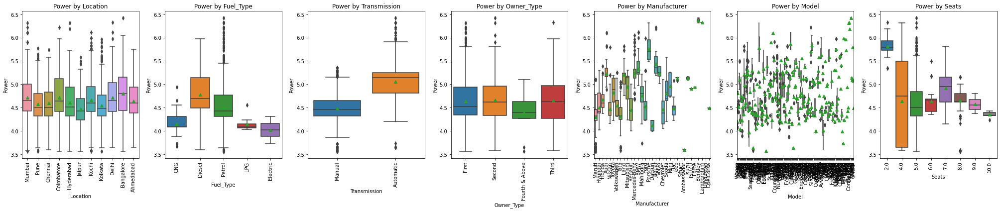

In [355]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def boxplot_power_by_category(data, categorical_column, ax):
    sns.boxplot(
        x=categorical_column,
        y=np.log(data["Power"].dropna() + 1),
        showmeans=True,
        data=data,
        ax=ax
    )
    ax.set_title(f"Power by {categorical_column}")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# List of categorical variables for which we want to plot boxplots
categorical_columns = ['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer', 'Model', 'Seats']

# Set up the figure and axes for 5 subplots (1 row, 5 columns)
fig, axes = plt.subplots(1, 7, figsize=(28, 6))

# Loop through the categorical columns and plot each one in a subplot
for i, col in enumerate(categorical_columns):
    boxplot_power_by_category(data, col, axes[i])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


#### **Observations**

**Power by Location:** The distribution of power varies across locations, but the median power levels are fairly consistent, with slight variations.

**Power by Fuel Type:** Diesel cars have the highest power values, followed by Petrol and then CNG. Electric and LPG vehicles show the lowest power levels. Diesel engines generally produce more torque and power compared to petrol and CNG engines, making them suitable for heavier vehicles. Electric and LPG vehicles tend to prioritize efficiency over power.

**Power by Transmission:** Automatic transmission vehicles have higher power values compared to manual ones. Automatic vehicles often come with higher power engines to compensate for the slightly lower efficiency of automatic transmission systems, and they are typically associated with higher-end vehicle models.

**Power by Owner Type:** Power does not vary much with owner type, whether they are first hand owner or not.

**Power by Manufacturer:** Premium manufacturers like BMW, Mercedes-Benz, and Audi show higher power values compared to brands like Maruti and Hyundai.
Premium brands generally offer performance-oriented models with higher engine power, reflecting their focus on luxury, performance, and driving experience.

**Power by Model:** There is a wide variation in power values across different models, indicating that power is highly model-dependent within each manufacturer.

**Power by Seats:** Cars with 2 seats have the highest power, followed by larger vehicles with 7-10 seats. Standard 4-5 seater vehicles have moderate power values. Sports cars (2-seaters) and large SUVs (7-10 seats) are designed for high performance or heavy-duty applications, resulting in higher power output. Standard passenger cars balance power with fuel efficiency.


Power values are influenced by the type of fuel, transmission, manufacturer, and seating capacity. Diesel and premium brand vehicles, as well as 2-seaters and large SUVs, tend to have higher power due to their design focus on performance, durability, and premium driving experience.



In [356]:
data.groupby(["Manufacturer"])["Power"].mean().sort_values(ascending=False)


Manufacturer
Bentley          584.000000
Lamborghini      560.000000
Porsche          325.917647
Jaguar           236.216458
BMW              210.728820
Mercedes-Benz    193.620820
Audi             189.340246
Land             188.745938
Volvo            188.464286
Jeep             168.947368
Isuzu            167.785000
Mini             146.656774
Mitsubishi       145.193333
Force            139.030000
ISUZU            134.000000
Toyota           128.215768
Skoda            126.622750
Mahindra         119.468807
Honda            108.450707
Ford              96.364490
Volkswagen        94.761220
Hyundai           92.152134
Chevrolet         90.909333
Nissan            89.702478
Fiat              89.028125
OpelCorsa         88.000000
Renault           87.510471
Tata              78.281652
Maruti            74.000007
Datsun            60.644706
Ambassador        35.500000
Hindustan               NaN
Smart                   NaN
Name: Power, dtype: float64

Seems like most powerful cars are from premium manufacturers like Bentley, Lamborghini,Porsche which are also most expensive and luxurious cars.

### **Mileage vs Categorical variables**

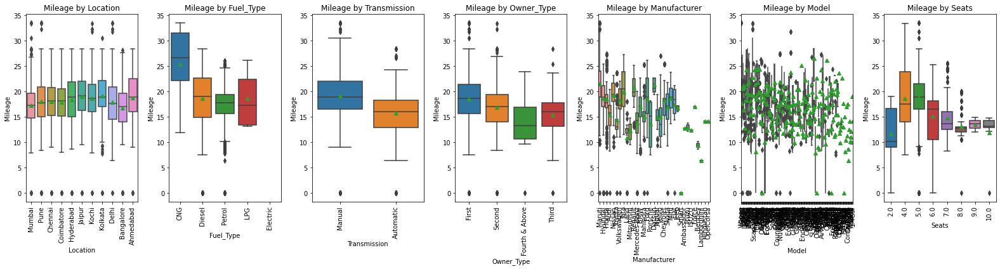

In [357]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def boxplot_mileage_by_category(data, categorical_column, ax):
    sns.boxplot(
        x=categorical_column,
        y=data["Mileage"],
        showmeans=True,
        data=data,
        ax=ax
    )
    ax.set_title(f"Mileage by {categorical_column}")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# List of categorical variables for which we want to plot boxplots
categorical_columns = ['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer', 'Model', 'Seats']

# Set up the figure and axes for 5 subplots (1 row, 5 columns)
fig, axes = plt.subplots(1, 7, figsize=(22, 6))

# Loop through the categorical columns and plot each one in a subplot
for i, col in enumerate(categorical_columns):
    boxplot_mileage_by_category(data, col, axes[i])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


**Mileage by Location**: The distribution of mileage is fairly consistent across different locations, with most vehicles showing median mileage around 15-20 km/liter.

**Mileage by Fuel Type:** CNG vehicles have the highest mileage, followed by Diesel and Petrol. LPG vehicles have lower mileage, and Electric vehicles show the least variation. CNG and Diesel engines are generally more fuel-efficient compared to Petrol and LPG engines. Electric vehicles prioritize efficiency over mileage, so they have a narrower range in terms of mileage.

**Mileage by Transmission:**  Manual transmission cars have a higher mileage compared to automatic cars. Manual transmission vehicles typically offer better fuel efficiency compared to automatics, as they have less energy loss during gear shifts.

**Mileage by Owner Type:** First-owner cars show slightly higher mileage compared to second or third-owner cars. This could indicate that first-owner vehicles are newer or better maintained, resulting in slightly better fuel efficiency.

**Mileage by Manufacturer:** There is significant variation in mileage across different manufacturers. Brands like Maruti and Hyundai show higher mileage, while premium brands like BMW and Mercedes-Benz have lower mileage. Brands that focus on compact or economy cars (e.g., Maruti, Hyundai) tend to have better mileage, while premium brands prioritize performance and power, leading to lower fuel efficiency.

**Mileage by Model:** There is a broad spread in mileage across different models, indicating that mileage is highly dependent on the specific model.Different models have different engine configurations, weights, and designs, all of which impact the vehicle’s mileage.

Mileage by Seats: Vehicles with 4-5 seats have the highest mileage, while those with 7-10 seats show significantly lower mileage. Smaller cars with 4-5 seats are generally designed for better fuel efficiency, while larger SUVs or vans with more seats tend to have larger engines and heavier weights, reducing fuel efficiency.

Mileage is influenced by factors like fuel type, transmission, and the type of vehicle produced by different manufacturers. Manual transmission and smaller, fuel-efficient cars show higher mileage, whereas larger, performance-oriented vehicles or those with more seating capacity have lower mileage.

**Note: Some cars have 0 Mileage, which is unrealistic, we will explore those later.**



In [358]:
data.groupby(["Manufacturer"])["Mileage"].mean().sort_values(ascending=False)


Manufacturer
Maruti           21.495568
Datsun           21.345294
Renault          20.727471
Tata             19.946886
Nissan           19.229915
Hyundai          18.670716
Mini             18.581935
Ford             18.476382
Honda            18.456662
Chevrolet        18.306556
Volkswagen       18.288316
Fiat             17.389474
Force            17.000000
BMW              16.976026
Skoda            16.897228
Jeep             16.731579
Audi             15.360140
Mahindra         15.166394
Volvo            15.030714
Jaguar           14.889375
Toyota           14.445296
OpelCorsa        14.200000
Hindustan        14.100000
Mercedes-Benz    13.933368
Porsche          13.601579
Isuzu            12.940000
Ambassador       12.800000
ISUZU            12.400000
Mitsubishi       12.291667
Land             10.915970
Bentley           9.400000
Lamborghini       6.400000
Smart             0.000000
Name: Mileage, dtype: float64

Mileage varies significantly based on the brand’s focus and vehicle types. Brands with smaller, economy cars (Maruti, Datsun, Renault, Tata, Nissan, Hyundai) show high mileage, while luxury, performance, and SUV-focused brands naturally have lower mileage due to larger engines and heavier builds.

### **Kilometers Driven vs Categorical variables**

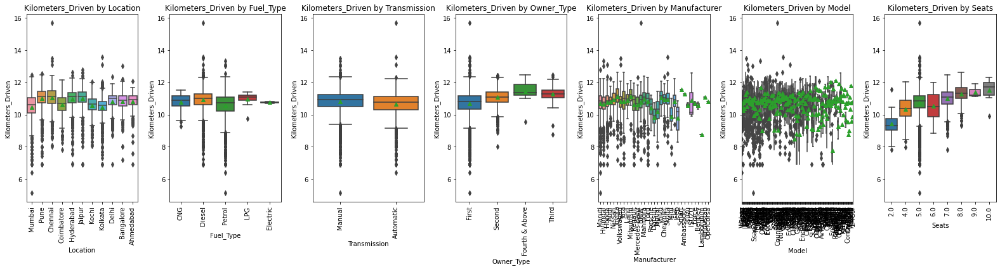

In [359]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def boxplot_kilometers_by_category(data, categorical_column, ax):
    sns.boxplot(
        x=categorical_column,
        y=np.log(data["Kilometers_Driven"].dropna() + 1),
        showmeans=True,
        data=data,
        ax=ax
    )
    ax.set_title(f"Kilometers_Driven by {categorical_column}")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# List of categorical variables for which we want to plot boxplots
categorical_columns = ['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer', 'Model', 'Seats']

# Set up the figure and axes for 5 subplots (1 row, 5 columns)
fig, axes = plt.subplots(1, 7, figsize=(22, 6))

# Loop through the categorical columns and plot each one in a subplot
for i, col in enumerate(categorical_columns):
    boxplot_kilometers_by_category(data, col, axes[i])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


**Observations**

**Kilometers Driven by Location:** Similar median values across locations with slight variations and some outliers. Location does not significantly influence the total kilometers driven, suggesting that vehicle usage patterns are similar across cities.

**Kilometers Driven by Fuel Type:** Diesel vehicles have the highest kilometers driven, while Petrol and CNG vehicles show slightly lower median values. Diesel vehicles are typically preferred for long-distance driving due to better fuel economy and longevity, resulting in higher total kilometers driven.

**Kilometers Driven by Transmission:** Both manual and automatic cars have comparable kilometer distributions, but manual cars show more variability.
This suggests that manual cars might be used more diversely, from city driving to long distances.

**Kilometers Driven by Owner Type:** First-owner vehicles tend to have slightly lower kilometers compared to second or third-owner vehicles.
Vehicles that change hands multiple times are likely to have been driven more extensively, leading to higher kilometers driven.

**Kilometers Driven by Manufacturer:**
There is a wide range of kilometers driven within each manufacturer, with no clear trend or pattern.

**Kilometers Driven by Model:** There is significant variability in kilometers driven across models, showing no specific pattern.

**Kilometers Driven by Seats:** Vehicles with 5-7 seats tend to have higher kilometers driven, while 2-seaters have lower values. Larger vehicles with 5-7 seats (often SUVs or vans) are typically used for longer journeys, family trips, or commercial purposes, resulting in higher total kilometers driven compared to smaller or specialized 2-seater vehicles.


Fuel type, transmission, and seat capacity have some influence on total kilometers driven, while other factors like location, manufacturer, and model show more variability, reflecting diverse vehicle usage patterns.

### **Age vs Categorical variables**

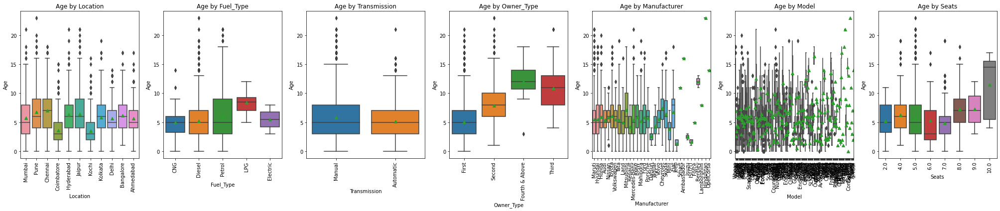

In [360]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def boxplot_age_by_category(data, categorical_column, ax):
    sns.boxplot(
        x=categorical_column,
        y=data["Age"],
        showmeans=True,
        data=data,
        ax=ax
    )
    ax.set_title(f"Age by {categorical_column}")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# List of categorical variables for which we want to plot boxplots
categorical_columns = ['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer', 'Model', 'Seats']

# Set up the figure and axes for 5 subplots (1 row, 5 columns)
fig, axes = plt.subplots(1, 7, figsize=(28, 6))

# Loop through the categorical columns and plot each one in a subplot
for i, col in enumerate(categorical_columns):
    boxplot_age_by_category(data, col, axes[i])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


#### **Observations:**

**Age by Location:** The age distribution is similar across locations, with median vehicle ages around 5-8 years. This indicates that vehicle market dynamics are fairly consistent across cities, with no location-specific trends in vehicle age. The most younger cars are in Coimbatore and Kochi - signifying there are relatively new cars in these cities.

**Age by Fuel Type:** CNG and LPG vehicles tend to be older, while Diesel and Petrol vehicles show a wider range of ages.

**Age by Transmission:** Automatic cars tend to be slightly newer on average compared to manual cars, but the distribution range is similar. Automatic transmission vehicles have become more popular in recent years, resulting in a higher proportion of newer models being automatic.

**Age by Owner Type:** First-owner vehicles are generally newer, while vehicles that have changed hands (second, third owners) are older.

**Age by Manufacturer:** Premium brands like Mercedes-Benz and BMW have a higher proportion of older vehicles, while mainstream brands like Maruti and Hyundai have a balanced age distribution. Premium brands often have a longer lifespan and hold value longer, resulting in a higher age distribution compared to economy brands.

**Age by Model:** Age varies widely across different models, indicating a diverse range of offerings and model-specific longevity.

**Age by Seats:** Vehicles with 4-5 seats are newer compared to vehicles with 7-10 seats, which tend to be older. Larger vehicles with more seats are often utility or commercial vehicles with longer service lives, leading to a higher average age compared to standard 4-5 seater passenger vehicles.

Thus, vehicle age is influenced by factors like fuel type, transmission, and owner type, while other factors like location, manufacturer, and seating capacity show varied patterns reflecting the market dynamics and intended vehicle usage.

In [361]:
data.groupby(["Manufacturer"])["Age"].mean().sort_values(ascending=False)

Manufacturer
Hindustan        23.000000
Ambassador       16.000000
OpelCorsa        14.000000
Bentley          12.000000
Smart            11.000000
Lamborghini       8.000000
Chevrolet         7.463576
Mitsubishi        7.138889
Fiat              6.789474
Skoda             6.465347
Toyota            6.084813
Honda             5.940781
BMW               5.903846
Nissan            5.863248
Ford              5.826211
Porsche           5.736842
Volvo             5.607143
Hyundai           5.531343
Maruti            5.526316
Volkswagen        5.475936
Tata              5.447368
Mercedes-Benz     5.439474
Audi              5.375439
Mahindra          5.238671
Force             5.000000
Land              4.985075
Jaguar            4.416667
Renault           4.182353
Mini              3.838710
Datsun            2.588235
Isuzu             2.500000
ISUZU             1.666667
Jeep              1.368421
Name: Age, dtype: float64

**Observations** Premium brands like Bentley have a higher proportion of older vehicles, while mainstream brands like Maruti and Hyundai have a balanced age distribution. Premium brands often have a longer lifespan and hold value longer, resulting in a higher age distribution compared to economy brands.

##  **3. Relation between Categorical variables**

### Boxplot between Categorical variable

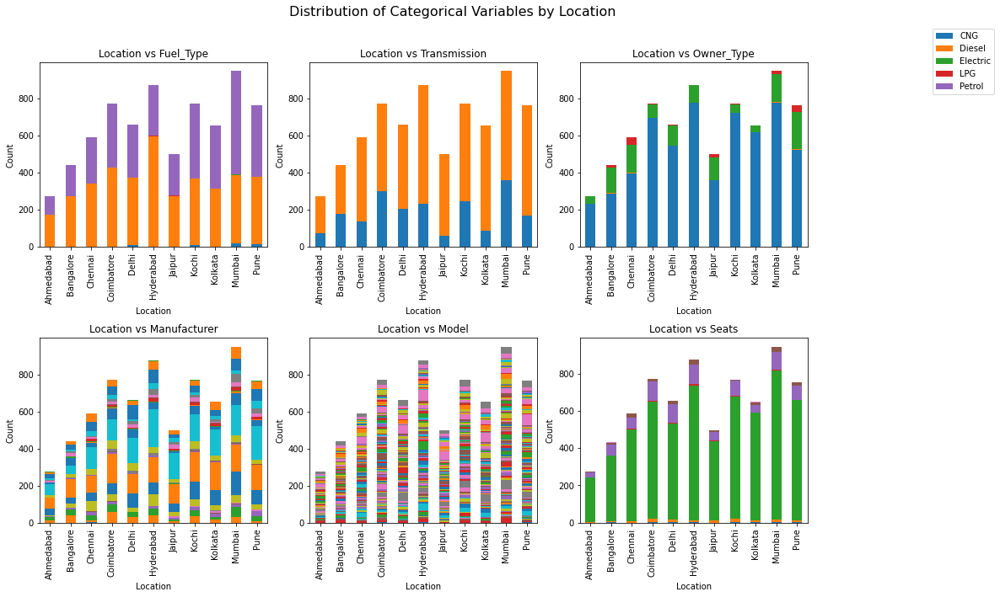

In [362]:
import matplotlib.pyplot as plt
import pandas as pd

# List of categorical variables to plot against 'Location'
cat_vars = ['Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer', 'Model', 'Seats']

# Define number of rows and columns based on the number of subplots needed
n_cols = 3  # Number of columns for subplots
n_rows = -(-len(cat_vars) // n_cols)  # Calculate rows needed (using ceiling division)

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))
fig.suptitle('Distribution of Categorical Variables by Location', fontsize=16)

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Loop through each categorical variable and create a stacked bar plot against 'Location'
for i, var in enumerate(cat_vars):
    pd.crosstab(data['Location'], data[var]).plot(kind='bar', stacked=True, ax=axes[i], legend=False)
    axes[i].set_title(f'Location vs {var}')
    axes[i].set_ylabel('Count')
    axes[i].set_xlabel('Location')

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Show legend only once, in an empty space
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 0.95))

# Adjust layout and display plot
plt.tight_layout(rect=[0, 0, 0.9, 0.96])
plt.show()


**Fuel Type Distribution:** Diesel and Petrol dominate across all locations, with CNG being more prominent in specific cities like Delhi and Mumbai. This suggests regional preferences for certain fuel types.

**Transmission Type:** Manual transmission is more common across all locations, reflecting consumer preference or availability of manual vehicles in the market.

**Owner Type:** First-owner vehicles are the majority, indicating that the market is mostly driven by single-owner sales.

**Manufacturer and Model:** A wide variety of manufacturers and models are present in all locations, indicating a diverse market.

**Seats:** 5-seater vehicles dominate across all cities, suggesting that standard-sized cars are the most popular choice for buyers.


These findings suggest that the used car market is influenced by regional preferences, with a strong focus on standard fuel types, manual transmissions, and mid-sized vehicles.


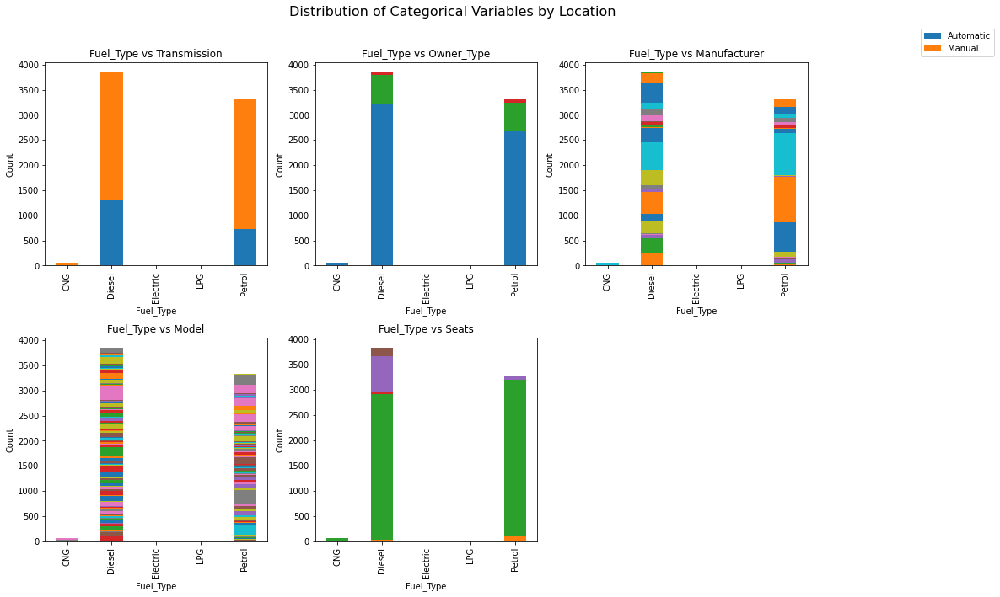

In [363]:
import matplotlib.pyplot as plt
import pandas as pd

# List of categorical variables to plot against 'Location'
cat_vars = ['Transmission', 'Owner_Type', 'Manufacturer', 'Model', 'Seats']

# Define number of rows and columns based on the number of subplots needed
n_cols = 3  # Number of columns for subplots
n_rows = -(-len(cat_vars) // n_cols)  # Calculate rows needed (using ceiling division)

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))
fig.suptitle('Distribution of Categorical Variables by Location', fontsize=16)

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Loop through each categorical variable and create a stacked bar plot against 'Location'
for i, var in enumerate(cat_vars):
    pd.crosstab(data['Fuel_Type'], data[var]).plot(kind='bar', stacked=True, ax=axes[i], legend=False)
    axes[i].set_title(f'Fuel_Type vs {var}')
    axes[i].set_ylabel('Count')
    axes[i].set_xlabel('Fuel_Type')

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Show legend only once, in an empty space
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 0.95))

# Adjust layout and display plot
plt.tight_layout(rect=[0, 0, 0.9, 0.96])
plt.show()

**Fuel Type vs Transmission:** Diesel vehicles are predominantly manual, while Petrol vehicles show a more balanced split between manual and automatic transmissions.

**Fuel Type vs Owner Type:** Diesel and Petrol cars are mainly first-owner vehicles, indicating primary use with minimal ownership transfer.

**Fuel Type vs Manufacturer**: A diverse set of manufacturers produce both Diesel and Petrol vehicles, with Diesel dominating the market share.

**Fuel Type vs Model:** Diesel models have the widest range, reflecting the variety of models available in the market.

**Fuel Type vs Seats:** 5-seater vehicles are the most common across Diesel and Petrol types, indicating standard passenger car preference.

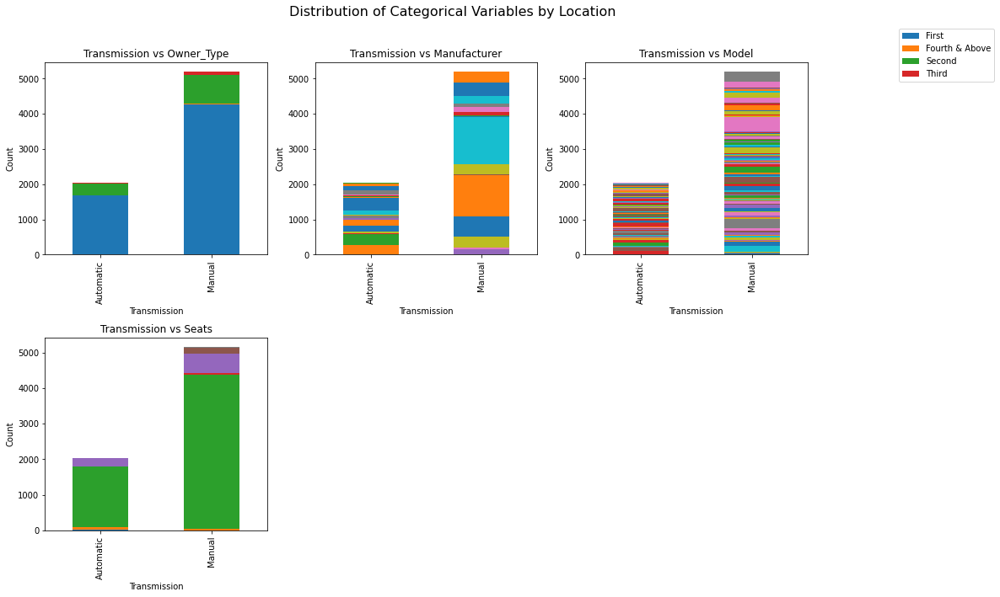

In [364]:
import matplotlib.pyplot as plt
import pandas as pd

# List of categorical variables to plot against 'Location'
cat_vars = ['Owner_Type', 'Manufacturer', 'Model', 'Seats']

# Define number of rows and columns based on the number of subplots needed
n_cols = 3  # Number of columns for subplots
n_rows = -(-len(cat_vars) // n_cols)  # Calculate rows needed (using ceiling division)

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))
fig.suptitle('Distribution of Categorical Variables by Location', fontsize=16)

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Loop through each categorical variable and create a stacked bar plot against 'Location'
for i, var in enumerate(cat_vars):
    pd.crosstab(data['Transmission'], data[var]).plot(kind='bar', stacked=True, ax=axes[i], legend=False)
    axes[i].set_title(f'Transmission vs {var}')
    axes[i].set_ylabel('Count')
    axes[i].set_xlabel('Transmission')

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Show legend only once, in an empty space
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 0.95))

# Adjust layout and display plot
plt.tight_layout(rect=[0, 0, 0.9, 0.96])
plt.show()

**Transmission vs Owner Type:** Manual vehicles are predominantly first-owner cars, while automatics are also popular among first owners but less so for subsequent owners.

**Transmission vs Manufacturer:** A diverse range of manufacturers produce both manual and automatic vehicles, with manual vehicles having broader representation.

**Transmission vs Model:** Manual models have a wider variety compared to automatic models, indicating more availability and options.

**Transmission vs Seats:** Manual vehicles are mainly 5-seaters, while automatic vehicles have more variation in seating configurations, suggesting greater adoption in larger cars and SUVs.

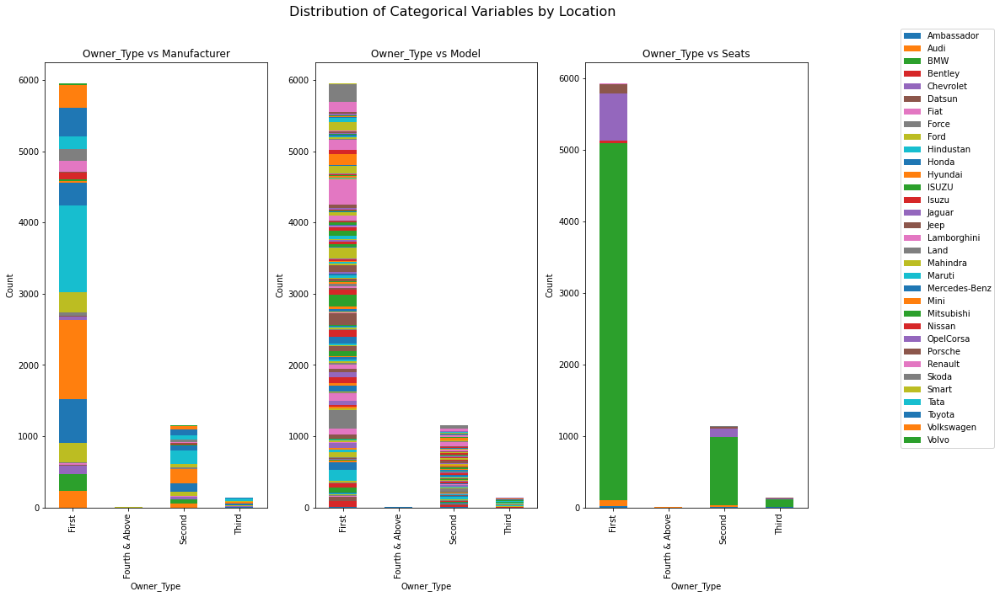

In [365]:
import matplotlib.pyplot as plt
import pandas as pd

# List of categorical variables to plot against 'Location'
cat_vars = ['Manufacturer', 'Model', 'Seats']

# Define number of rows and columns based on the number of subplots needed
n_cols = 3  # Number of columns for subplots
n_rows = -(-len(cat_vars) // n_cols)  # Calculate rows needed (using ceiling division)

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))
fig.suptitle('Distribution of Categorical Variables by Location', fontsize=16)

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Loop through each categorical variable and create a stacked bar plot against 'Location'
for i, var in enumerate(cat_vars):
    pd.crosstab(data['Owner_Type'], data[var]).plot(kind='bar', stacked=True, ax=axes[i], legend=False)
    axes[i].set_title(f'Owner_Type vs {var}')
    axes[i].set_ylabel('Count')
    axes[i].set_xlabel('Owner_Type')

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Show legend only once, in an empty space
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 0.95))

# Adjust layout and display plot
plt.tight_layout(rect=[0, 0, 0.9, 0.96])
plt.show()

**Owner Type vs Manufacturer:** Most vehicles are first-owner cars, regardless of manufacturer, suggesting high retention among initial owners.

**Owner Type vs Model:** Wide variety of models across all ownership types, indicating that model choice is less influenced by ownership status.

**Owner Type vs Seats:** First-owner vehicles are predominantly 5-seaters, while subsequent owners also show a preference for 5-seaters, reflecting the standard passenger car market preference.

## **Important Insights from EDA**

#### What are the the most important observations and insights from the data based on the EDA and Data Preprocessing performed?

* **Car Model and Manufacturer Dominance:** Car Model and Manufacturer emerged as critical factors influencing car prices. Maruti and Hyundai are the most popular manufacturers, making up nearly a third of the dataset. Models like Maruti Swift and Honda City have a high frequency, indicating strong brand presence and market dominance.


* **Impact of Age and Kilometers Driven:** Age and Kilometers Driven are strong determinants of car price. As expected, older cars and cars with higher mileage tend to have lower prices, reflecting typical depreciation trends over time and usage.


* **Fuel Type and Transmission Preferences:** Diesel cars dominate the dataset, and manual transmission is overwhelmingly more common than automatic. This reflects the typical buyer preference in the Indian market. Diesel cars, especially those with manual transmission, tend to have higher power and mileage, which impacts their resale value.


* **Price and Power Correlation:** Power and Price are highly correlated, with more powerful cars commanding higher prices. Similarly, New Price and current Price show a strong correlation, indicating that the original purchase price is a good predictor of current resale value.


* **Regional Market Dynamics:** Certain locations, like Bangalore and Coimbatore, have a higher concentration of high-priced cars, which suggests regional variations in car pricing and demand.


* **Effect of Ownership Type:** First-owner vehicles are predominant in the dataset, typically suggesting better-maintained vehicles, which could result in higher resale prices compared to vehicles with multiple owners.


* **Price by Seats:** Cars with 2 seats and high-end SUVs with 7-10 seats show higher price ranges. Standard 5-seater vehicles have moderate prices. Vehicles with 2 seats are typically sports cars, while those with 7-10 seats are larger SUVs or luxury vans, both of which command higher prices. 


* **Feature Interdependence and Multicollinearity:** There is significant interdependence between features like Power, Engine, New Price, and Price, leading to potential multicollinearity issues. These features are highly correlated with each other, suggesting that one or more may need to be dropped, or interaction terms might be introduced to capture their combined effect more effectively.


* **Impact of Feature Engineering:** New features such as Car_Model_Target, Manufacturer, and Age were created to capture nuances in the data more effectively and improve model performance. These engineered features significantly enhanced the interpretability and predictive power of the models.


* **Handling Skewed Distributions:** Several features, including Power, Kilometers Driven, New Price, and Price, were highly skewed. To handle this skewness and ensure the features followed a more normal distribution, log transformation was applied. Even the dependent variable (Price) was log-transformed to stabilize variance and improve model performance.


* **Price Distribution:** The majority of cars are priced below 20 lakhs, with a few high-end luxury cars skewing the price distribution. This skewed distribution further emphasized the need for log transformation to ensure accurate and reliable modeling.


* **Feature Importance Analysis:** In decision tree-based models, Car Model and Age are the most influential features, followed by Kilometers Driven, Power, and New Price. These features are crucial for determining the final price of a used car. The interdependence between certain features and the necessity of log transformations highlight the importance of feature engineering and preprocessing steps for successful model building.


These key patterns and insights provide a foundational understanding of the factors affecting used car pricing and guide feature selection, handling of skewed distributions, and multicollinearity considerations for building robust models.

## **Missing value, outlier treatment and Data pre-processing : Linear Regression**

In [366]:
data.isna().sum()

Location                0
Kilometers_Driven       0
Fuel_Type               0
Transmission            0
Owner_Type              0
Mileage                 2
Engine                 46
Power                 175
Seats                  53
New_price            6247
Price                1234
Manufacturer            0
Model                   0
Age                     0
dtype: int64

#### **Observations**

* There are 2, 46, 175, 53, 6247 missing values in the Mileage, Engine, Power, Seats, and New_Price column.

* Even for the target variable (Price column), there are 1234 missing values.

In [367]:
(data.isnull().sum() / data.shape[0])*100

Location              0.000000
Kilometers_Driven     0.000000
Fuel_Type             0.000000
Transmission          0.000000
Owner_Type            0.000000
Mileage               0.027575
Engine                0.634220
Power                 2.412795
Seats                 0.730732
New_price            86.129877
Price                17.013650
Manufacturer          0.000000
Model                 0.000000
Age                   0.000000
dtype: float64

In [9]:
import pandas as pd

# `data` is the main DataFrame that contains both categorical and numeric variables.
# A`final_data` contains numeric variables (including log-transformed).

# Extract categorical variables from `data`
# Use `select_dtypes` to select columns with type 'object' (typically used for categorical variables)
categorical_data = data[['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer', 'Model', 'Seats']]

# Convert `categorical_data` to a DataFrame (just to ensure the correct format)
categorical_data = pd.DataFrame(categorical_data)

# Concatenate `categorical_data` and `final_data`
combined_data = pd.concat([categorical_data, final_data], axis=1)

all_combined_data = combined_data.copy()

#  Display the first few rows of the combined DataFrame
print(all_combined_data.head())

     Location Fuel_Type Transmission Owner_Type Manufacturer   Model  Seats  \
0      Mumbai       CNG       Manual      First       Maruti   Wagon    5.0   
1        Pune    Diesel       Manual      First      Hyundai   Creta    5.0   
2     Chennai    Petrol       Manual      First        Honda    Jazz    5.0   
3     Chennai    Diesel       Manual      First       Maruti  Ertiga    7.0   
4  Coimbatore    Diesel    Automatic     Second         Audi      A4    5.0   

   Age  Mileage  Engine  Seats  Price  Kilometers_Driven_log  Power_log  \
0    9    26.60   998.0    5.0   1.75              11.184435   4.080246   
1    4    19.67  1582.0    5.0  12.50              10.621352   4.845761   
2    8    18.20  1199.0    5.0   4.50              10.736418   4.496471   
3    7    20.77  1248.0    7.0   6.00              11.373675   4.497139   
4    6    15.20  1968.0    5.0  17.74              10.613271   4.954418   

   New_price_log  Price_log  
0            NaN   1.011601  
1            N

Seems like I have mistakenly included Seats both as numerical and categorical variables. I need to remove the duplicated column.

In [10]:
# Remove duplicate columns based on column names
all_combined_data = all_combined_data.loc[:, ~all_combined_data.columns.duplicated()]

# Display the first few rows to confirm the removal
print(all_combined_data.head())


     Location Fuel_Type Transmission Owner_Type Manufacturer   Model  Seats  \
0      Mumbai       CNG       Manual      First       Maruti   Wagon    5.0   
1        Pune    Diesel       Manual      First      Hyundai   Creta    5.0   
2     Chennai    Petrol       Manual      First        Honda    Jazz    5.0   
3     Chennai    Diesel       Manual      First       Maruti  Ertiga    7.0   
4  Coimbatore    Diesel    Automatic     Second         Audi      A4    5.0   

   Age  Mileage  Engine  Price  Kilometers_Driven_log  Power_log  \
0    9    26.60   998.0   1.75              11.184435   4.080246   
1    4    19.67  1582.0  12.50              10.621352   4.845761   
2    8    18.20  1199.0   4.50              10.736418   4.496471   
3    7    20.77  1248.0   6.00              11.373675   4.497139   
4    6    15.20  1968.0  17.74              10.613271   4.954418   

   New_price_log  Price_log  
0            NaN   1.011601  
1            NaN   2.602690  
2       2.262804   1.70474

**Since 86% data is missing from New_price data column and as we have seen from exploratory data analysis, New_price is highly interrelated with other variables like Power and Engine apart from being strongly related with Price, we will drop this variable from our analysis.**

In [11]:
# Dropping New Price column as 86% of the data is missing

all_combined_data.drop("New_price_log", axis=1, inplace=True)

In [12]:
all_combined_data.head()

,Location,Fuel_Type,Transmission,Owner_Type,Manufacturer,Model,Seats,Age,Mileage,Engine,Price,Kilometers_Driven_log,Power_log,Price_log
0,Mumbai,CNG,Manual,First,Maruti,Wagon,5.0,9,26.60,998.0,1.75,11.184435,4.080246,1.011601
1,Pune,Diesel,Manual,First,Hyundai,Creta,5.0,4,19.67,1582.0,12.50,10.621352,4.845761,2.602690
2,Chennai,Petrol,Manual,First,Honda,Jazz,5.0,8,18.20,1199.0,4.50,10.736418,4.496471,1.704748
3,Chennai,Diesel,Manual,First,Maruti,Ertiga,7.0,7,20.77,1248.0,6.00,11.373675,4.497139,1.945910
4,Coimbatore,Diesel,Automatic,Second,Audi,A4,5.0,6,15.20,1968.0,17.74,10.613271,4.954418,2.930660


**Rows with missing Price values are dropped** because:

* They lack target information, making them unusable for model training or testing.

* Supervised models require complete target data to learn patterns.

* Imputing target values can introduce bias and inaccuracy.

Thus, removing these rows ensures a clean and reliable dataset for modeling.

In [13]:
# Dropping the rows with missing Price

all_combined_data.dropna(axis=0, how="any", subset=["Price"], inplace=True)

In [14]:
all_combined_data.isna().sum()

Location                   0
Fuel_Type                  0
Transmission               0
Owner_Type                 0
Manufacturer               0
Model                      0
Seats                     42
Age                        0
Mileage                    2
Engine                    36
Price                      0
Kilometers_Driven_log      0
Power_log                143
Price_log                  0
dtype: int64

There are still 42 missing values in Setas, 2 missing values in Mileage, 36 missing values in Engine, and 143 missing values in Power_log. Since most of these columns are not perfectly normally distributed, **imputing with median value** seems to a good and easy choice.

### **Outlier Treatment:**

We will define outliers function that adjusts the values of numerical variables to remove outliers using the Interquartile Range (IQR) method. It computes the IQR (Q3 - Q1) and defines the lower and upper whiskers as:

Lower Whisker = Q1 - 1.5 * IQR
Upper Whisker = Q3 + 1.5 * IQR

Any value below the lower whisker is floored to the lower whisker value, and any value above the upper whisker is capped to the upper whisker value. This method ensures that extreme values outside the defined range are adjusted to reduce the impact of outliers on the model.

### **Missing Value Imputation:**

**For numeric columns:** Impute missing values with the median.

**For categorical columns:** Impute missing values with the mode. But there are no missing values in categorical columns.

**We did not include the dependent variable (Price or Price_log) for missing value and outlier treatment because modifying or imputing the target variable could distort the true relationship with independent variables, leading to biased predictions and reducing model accuracy.**

In [15]:
numerical_data_wo_price = all_combined_data.select_dtypes(include=np.number).columns.tolist()
numerical_data_wo_price.remove("Price")  ## since it is the target variable, not applying outlier treatment
numerical_data_wo_price.remove("Price_log")  ## since it is the target variable, not applying outlier treatment

Columns in numerical_data_only: ['Seats', 'Age', 'Mileage', 'Engine', 'Kilometers_Driven_log', 'Power_log']
Checking for missing data in each variable:
Seats - Missing values: 42
Age - Missing values: 0
Mileage - Missing values: 2
Engine - Missing values: 36
Kilometers_Driven_log - Missing values: 0
Power_log - Missing values: 143
Number of variables to plot: 6
Plotting variable: Seats
Plotting variable: Age
Plotting variable: Mileage
Plotting variable: Engine
Plotting variable: Kilometers_Driven_log
Plotting variable: Power_log


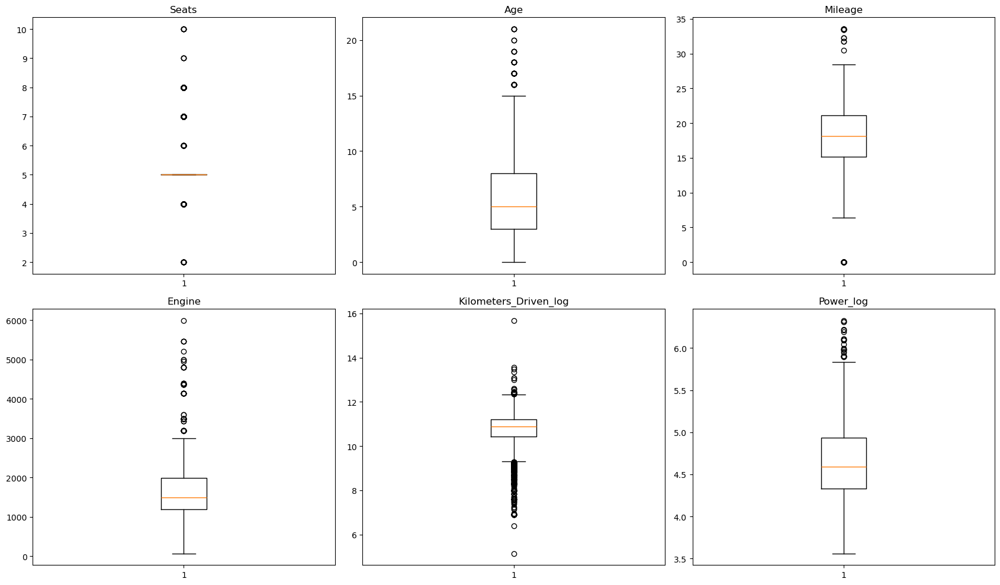

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Print column names and check for missing data
print("Columns in numerical_data_only:", numerical_data_wo_price)
print("Checking for missing data in each variable:")
for col in numerical_data_wo_price:
    print(f"{col} - Missing values: {all_combined_data[col].isnull().sum()}")

# Get the number of variables to plot
num_vars = len(numerical_data_wo_price)
print("Number of variables to plot:", num_vars)

# Check if there are any columns to plot
if num_vars == 0:
    print("No numeric columns to plot.")
else:
    # Calculate the number of rows needed
    rows = (num_vars // 3) + (num_vars % 3 > 0)  # Calculate rows dynamically

    # Set up the figure with dynamic rows and fixed columns
    plt.figure(figsize=(17, rows * 5))

    for i, variable in enumerate(numerical_data_wo_price):
        print(f"Plotting variable: {variable}")  # Debug: Print the variable being plotted
        plt.subplot(rows, 3, i + 1)  # Adjust subplot layout dynamically
        plt.boxplot(all_combined_data[variable].dropna(), whis=1.5)  # Drop missing values before plotting
        plt.title(variable)

    plt.tight_layout()
    plt.show()


In [17]:
print(all_combined_data[numerical_data_wo_price].describe())

             Seats          Age      Mileage       Engine  \
count  5977.000000  6019.000000  6017.000000  5983.000000   
mean      5.279572     5.641801    18.134961  1621.276450   
std       0.805960     3.269742     4.582289   601.355233   
min       2.000000     0.000000     0.000000    72.000000   
25%       5.000000     3.000000    15.170000  1198.000000   
50%       5.000000     5.000000    18.150000  1493.000000   
75%       5.000000     8.000000    21.100000  1984.000000   
max      10.000000    21.000000    33.540000  5998.000000   

       Kilometers_Driven_log    Power_log  
count            6019.000000  5876.000000  
mean               10.758812     4.647980  
std                 0.715736     0.412505  
min                 5.147494     3.561046  
25%                10.434145     4.330733  
50%                10.878066     4.592085  
75%                11.198228     4.935193  
max                15.687313     6.329721  


In [18]:
#  Missing Value Imputation
# Numeric columns: Impute with median values
for col in numerical_data_wo_price:
    all_combined_data[col].fillna(all_combined_data[col].median(), inplace=True)

Columns in numerical_data_only: ['Seats', 'Age', 'Mileage', 'Engine', 'Kilometers_Driven_log', 'Power_log']
Checking for missing data in each variable:
Seats - Missing values: 0
Age - Missing values: 0
Mileage - Missing values: 0
Engine - Missing values: 0
Kilometers_Driven_log - Missing values: 0
Power_log - Missing values: 0
Number of variables to plot: 6
Plotting variable: Seats
Plotting variable: Age
Plotting variable: Mileage
Plotting variable: Engine
Plotting variable: Kilometers_Driven_log
Plotting variable: Power_log


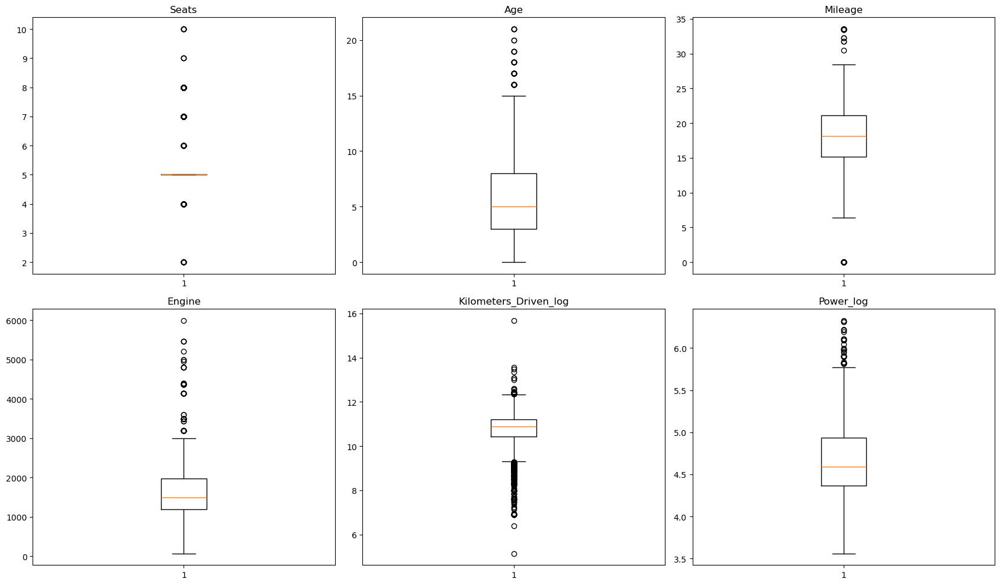

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# Print column names and check for missing data
print("Columns in numerical_data_only:", numerical_data_wo_price)
print("Checking for missing data in each variable:")
for col in numerical_data_wo_price:
    print(f"{col} - Missing values: {all_combined_data[col].isnull().sum()}")

# Get the number of variables to plot
num_vars = len(numerical_data_wo_price)
print("Number of variables to plot:", num_vars)

# Check if there are any columns to plot
if num_vars == 0:
    print("No numeric columns to plot.")
else:
    # Calculate the number of rows needed
    rows = (num_vars // 3) + (num_vars % 3 > 0)  # Calculate rows dynamically

    # Set up the figure with dynamic rows and fixed columns
    plt.figure(figsize=(17, rows * 5))

    for i, variable in enumerate(numerical_data_wo_price):
        print(f"Plotting variable: {variable}")  # Debug: Print the variable being plotted
        plt.subplot(rows, 3, i + 1)  # Adjust subplot layout dynamically
        plt.boxplot(all_combined_data[variable].dropna(), whis=1.5)  # Drop missing values before plotting
        plt.title(variable)

    plt.tight_layout()
    plt.show()


**We will define outliers function that adjusts the values of numerical variables to remove outliers using the Interquartile Range (IQR) method.** It computes the IQR (Q3 - Q1) and defines the lower and upper whiskers as:

Lower Whisker = Q1 - 1.5 * IQR Upper Whisker = Q3 + 1.5 * IQR

Any value below the lower whisker is floored to the lower whisker value, and any value above the upper whisker is capped to the upper whisker value. This method ensures that extreme values outside the defined range are adjusted to reduce the impact of outliers on the model.

In [20]:
# Function to treat outliers for a single column
def treat_outliers(df, col):
    """
    Treats outliers in a numerical variable.

    Parameters:
    col: str, name of the numerical variable
    df: DataFrame containing the data
    """

    # Calculate 1st and 3rd quantiles
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    # Determine the lower and upper bounds
    Lower_whisker = Q1 - 1.5 * IQR
    Upper_whisker = Q3 + 1.5 * IQR

    # Cap values outside the bounds
    df[col] = np.clip(df[col], Lower_whisker, Upper_whisker)

    return df

# Function to treat outliers for all specified columns
def treat_outliers_all(df, col_list):
    """
    Treat outliers in all specified numerical variables.

    Parameters:
    col_list: list of numerical variable names to treat
    df: DataFrame containing the data

    Returns:
    DataFrame with treated outliers
    """

    for c in col_list:
        df = treat_outliers(df, c)
    return df

# Apply the `treat_outliers_all` function on the selected columns of the numerical data
all_combined_data_numeric = treat_outliers_all(all_combined_data[numerical_data_wo_price], numerical_data_wo_price)

# Update the original dataframe `all_combined_data` with the treated numeric data
all_combined_data.update(all_combined_data_numeric)

Columns in numerical_data_only: ['Seats', 'Age', 'Mileage', 'Engine', 'Kilometers_Driven_log', 'Power_log']
Checking for missing data in each variable:
Seats - Missing values: 0
Age - Missing values: 0
Mileage - Missing values: 0
Engine - Missing values: 0
Kilometers_Driven_log - Missing values: 0
Power_log - Missing values: 0
Number of variables to plot: 6
Plotting variable: Seats
Plotting variable: Age
Plotting variable: Mileage
Plotting variable: Engine
Plotting variable: Kilometers_Driven_log
Plotting variable: Power_log


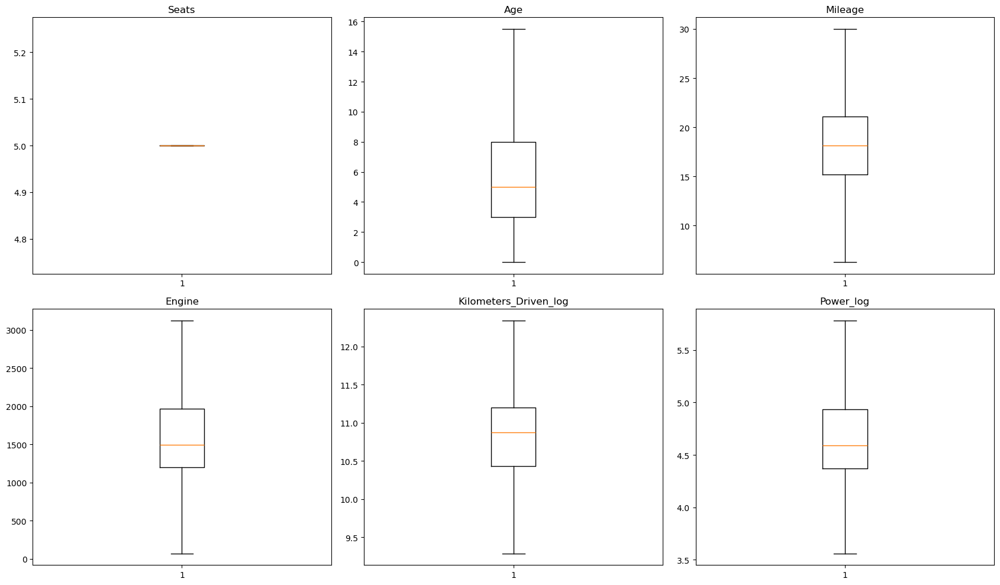

In [21]:
import matplotlib.pyplot as plt
import numpy as np

# Print column names and check for missing data
print("Columns in numerical_data_only:", numerical_data_wo_price)
print("Checking for missing data in each variable:")
for col in numerical_data_wo_price:
    print(f"{col} - Missing values: {all_combined_data[col].isnull().sum()}")

# Get the number of variables to plot
num_vars = len(numerical_data_wo_price)
print("Number of variables to plot:", num_vars)

# Check if there are any columns to plot
if num_vars == 0:
    print("No numeric columns to plot.")
else:
    # Calculate the number of rows needed
    rows = (num_vars // 3) + (num_vars % 3 > 0)  # Calculate rows dynamically

    # Set up the figure with dynamic rows and fixed columns
    plt.figure(figsize=(17, rows * 5))

    for i, variable in enumerate(numerical_data_wo_price):
        print(f"Plotting variable: {variable}")  # Debug: Print the variable being plotted
        plt.subplot(rows, 3, i + 1)  # Adjust subplot layout dynamically
        plt.boxplot(all_combined_data[variable].dropna(), whis=1.5)  # Drop missing values before plotting
        plt.title(variable)

    plt.tight_layout()
    plt.show()


### Observations

**As we can see all the outlier points are replaced with median, so there are no outlier points. Thus, the 0 mileage values were also replaced with median value of mileage.**

In [22]:
print(all_combined_data[numerical_data_wo_price].describe())

        Seats          Age      Mileage       Engine  Kilometers_Driven_log  \
count  6019.0  6019.000000  6019.000000  6019.000000            6019.000000   
mean      5.0     5.625851    18.199198  1612.267736              10.783243   
std       0.0     3.213540     4.322077   567.841277               0.623619   
min       5.0     0.000000     6.275000    72.000000               9.288020   
25%       5.0     3.000000    15.170000  1198.000000              10.434145   
50%       5.0     5.000000    18.150000  1493.000000              10.878066   
75%       5.0     8.000000    21.100000  1969.000000              11.198228   
max       5.0    15.500000    29.995000  3125.500000              12.344353   

         Power_log  
count  6019.000000  
mean      4.645526  
std       0.404051  
min       3.561046  
25%       4.369448  
50%       4.592085  
75%       4.934690  
max       5.782553  


The summary statistics indicate that the dataset has been cleaned and standardized. The Seats variable is uniform with a value of 5, suggesting that the dataset predominantly includes standard 5-seater vehicles. Age has a median of 5 years, with a maximum of 15.5 years, indicating a focus on relatively newer cars. The Mileage distribution shows typical values around 18-21 km/liter, and Engine sizes range from 72 to 3125 cc, with a median of 1493 cc, reflecting a diverse set of cars. Kilometers_Driven_log and Power_log are reasonably distributed, with a slight skew, indicating they were log-transformed to handle skewness and outliers.

## **Building Various Models**


1. What we want to predict is the "Price". We will use the normalized version 'price_log' for modeling.
2. Before we proceed to the model, we'll have to encode categorical features. We will drop categorical features like Name.
3. We'll split the data into train and test, to be able to evaluate the model that we build on the train data.
4. Build Regression models using train data.
5. Evaluate the model performance.

For Regression Problems, some of the algorithms used are :<br>

**1) Linear Regression** <br>
**2) Ridge / Lasso Regression** <br>
**3) Decision Trees** <br>
**4) Random Forest** <br>

## **A. Building Linear Regression Models**

## **Split the Data**

<li>Step1: Seperating the indepdent variables (X) and the dependent variable (y).
<li>Step2: Encode the categorical variables in X using pd.dummies.
<li>Step3: Split the data into train and test using train_test_split.

In [381]:
all_combined_data.shape

all_combined_data.columns

Index(['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer',
       'Model', 'Seats', 'Age', 'Mileage', 'Engine', 'Price',
       'Kilometers_Driven_log', 'Power_log', 'Price_log'],
      dtype='object')

In [23]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import metrics
import statsmodels.api as sm

#  Select features and target variables
X = all_combined_data.drop(['Price', 'Price_log', 'Kilometers_Driven_log', 'Model'], axis=1)

# Create dummy variables for categorical features
X = pd.get_dummies(X, drop_first=True)

# Convert boolean columns to integers (if any)
X = X.astype(float)

X.shape

(6019, 53)

In [24]:
# Step-3: Define the target variable 'y' as 'price_log' for prediction purposes
# Use 'price_log' as target variable and keep 'Price' as the original scale for evaluation
y = all_combined_data[['Price_log', 'Price']]  # Using a DataFrame to keep both for evaluation

# Step-4: Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")

#print(X.dtypes)
#print(X.shape)
#print(y)

X_train shape: (4213, 53), X_test shape: (1806, 53)
y_train shape: (4213, 2), y_test shape: (1806, 2)


In [25]:
# Step-5: Define the function to evaluate the model
def get_model_score(model, flag=True):
    """
    Calculate R2 and RMSE for training and test set using original Price values.

    Parameters:
    model : The regressor to evaluate
    flag : If True, prints the scores. Default is True.

    Returns:
    score_list : List containing train R2, test R2, train RMSE, test RMSE
    """
    # Predict log-transformed prices on training and test data
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)

    # Convert log-transformed predictions back to original price scale
    pred_train_ = np.exp(pred_train)
    pred_test_ = np.exp(pred_test)

    # Calculate metrics using original 'Price' column
    train_r2 = metrics.r2_score(y_train['Price'], pred_train_)
    test_r2 = metrics.r2_score(y_test['Price'], pred_test_)
    train_rmse = metrics.mean_squared_error(y_train['Price'], pred_train_, squared=False)
    test_rmse = metrics.mean_squared_error(y_test['Price'], pred_test_, squared=False)

    # Add scores to a list and return it
    score_list = [train_r2, test_r2, train_rmse, test_rmse]

    # Print scores if flag is set to True
    if flag:
        print(f"R-squared on training set : {train_r2:.4f}")
        print(f"R-squared on test set : {test_r2:.4f}")
        print(f"RMSE on training set : {train_rmse:.4f}")
        print(f"RMSE on test set : {test_rmse:.4f}")

    return score_list



In [26]:
import pandas as pd
import statsmodels.api as sm

# Check if constant column exists before adding
print("Before adding constant, columns are:")
print(X_train.columns)

# Add constant term using 'add' to ensure it is included
X_train_ols = sm.add_constant(X_train, has_constant='add')  # 'has_constant' set to 'add' guarantees a constant column

# Verify if the constant column has been added successfully
print("After adding constant, columns are:")
print(X_train_ols.columns)


# Display the first few rows of the DataFrame to confirm
#print("First few rows of X_train_ols:")
#print(X_train_ols.head())

Before adding constant, columns are:
Index(['Seats', 'Age', 'Mileage', 'Engine', 'Power_log', 'Location_Bangalore',
       'Location_Chennai', 'Location_Coimbatore', 'Location_Delhi',
       'Location_Hyderabad', 'Location_Jaipur', 'Location_Kochi',
       'Location_Kolkata', 'Location_Mumbai', 'Location_Pune',
       'Fuel_Type_Diesel', 'Fuel_Type_Electric', 'Fuel_Type_LPG',
       'Fuel_Type_Petrol', 'Transmission_Manual', 'Owner_Type_Fourth & Above',
       'Owner_Type_Second', 'Owner_Type_Third', 'Manufacturer_Audi',
       'Manufacturer_BMW', 'Manufacturer_Bentley', 'Manufacturer_Chevrolet',
       'Manufacturer_Datsun', 'Manufacturer_Fiat', 'Manufacturer_Force',
       'Manufacturer_Ford', 'Manufacturer_Honda', 'Manufacturer_Hyundai',
       'Manufacturer_ISUZU', 'Manufacturer_Isuzu', 'Manufacturer_Jaguar',
       'Manufacturer_Jeep', 'Manufacturer_Lamborghini', 'Manufacturer_Land',
       'Manufacturer_Mahindra', 'Manufacturer_Maruti',
       'Manufacturer_Mercedes-Benz', 'Manuf

## **Make Model: 1st Model** 

In [27]:
# Fit the OLS model using the modified X_train_ols with the constant
y_train_log = y_train['Price_log'].astype(float)  # Ensure target variable is float type
ols_model = sm.OLS(y_train_log, X_train_ols).fit()

# Print the model parameters to verify the constant is included
#print("OLS Model parameters:")
#print(ols_model.params)

# Print model summary to see the constant term
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.926
Model:                            OLS   Adj. R-squared:                  0.925
Method:                 Least Squares   F-statistic:                     1014.
Date:                Wed, 16 Oct 2024   Prob (F-statistic):               0.00
Time:                        13:39:07   Log-Likelihood:                 727.61
No. Observations:                4213   AIC:                            -1351.
Df Residuals:                    4161   BIC:                            -1021.
Df Model:                          51                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const               

### **Observations**

The model explains a significant portion of the variance (R-squared of 0.926). The Condition Number is very high (3.09e+17), suggesting potential multicollinearity issues among the features. This could mean that some independent variables are highly correlated, which may affect the model's stability and interpretation of individual coefficients. 

### **Multicollinearity check: 1st Model**

In [28]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Drop the constant column from the features to compute VIF
X_vif_old = X_train_ols.drop(columns=['const'])

# Calculate VIF for each feature
vif_data_old = pd.DataFrame()
vif_data_old['Feature'] = X_vif_old.columns
vif_data_old['VIF'] = [variance_inflation_factor(X_vif_old.values, i) for i in range(X_vif_old.shape[1])]

# Print VIF scores for each feature
print("VIF Scores:")
print(vif_data_old)


VIF Scores:
                       Feature          VIF
0                        Seats  4946.500541
1                          Age     1.716028
2                      Mileage     3.550132
3                       Engine     8.277056
4                    Power_log     6.709635
5           Location_Bangalore     2.403889
6             Location_Chennai     2.982352
7          Location_Coimbatore     3.474115
8               Location_Delhi     3.103590
9           Location_Hyderabad     3.861565
10             Location_Jaipur     2.705714
11              Location_Kochi     3.482142
12            Location_Kolkata     3.035069
13             Location_Mumbai     3.946466
14               Location_Pune     3.324827
15            Fuel_Type_Diesel    28.405381
16          Fuel_Type_Electric     1.034274
17               Fuel_Type_LPG     1.166022
18            Fuel_Type_Petrol    29.188606
19         Transmission_Manual     2.285081
20   Owner_Type_Fourth & Above     1.021796
21           Owner_T

### **Observations**

The current model exhibits significant multicollinearity, especially for features related to Manufacturer and Fuel_Type. Dropping all these features immediately is not ideal, as it might lead to loss of valuable information. 

## **Feature Engineering: 2nd Model**


**Instead, we will address this issue by transforming the problematic categorical variables into ordinal features. This approach will reduce the number of variables and maintain meaningful distinctions within the data.** Here's the strategy:

* **Grouping Manufacturers into Price-Based Categories:** The Manufacturer column currently has 33 unique categories, leading to many dummy variables when one-hot encoding is applied. This not only introduces multicollinearity but also unnecessarily complicates the model.

To mitigate this, **we will drop the Manufacturer column and instead categorize cars into 5 ordinal price-based categories: ('1-5', '5-10', '10-15', '15-20', '>20') (price in lakhs).** This will reduce the number of variables representing manufacturers to a single ordinal feature, significantly simplifying the model while preserving important group-level information.
Reducing Fuel_Type Categories:

* **The Fuel_Type column:** currently includes multiple categories, leading to a high variance inflation factor (VIF). However, most cars fall into either the Petrol or Diesel categories, which represent 99% of the cars.

**We will group Fuel_Type into three categories: Petrol, Diesel, and Others (Electric, LPG, CNG). These categories will be mapped to ordinal ranks: Petrol (1), Diesel (2), and Others (3).** This transformation will reduce multicollinearity without losing critical distinctions in the data.

* **Simplifying Owner_Type:** Owner_Type currently has several categories, leading to similar issues as Fuel_Type. Most cars are either First or Second owners, while other categories are sparse. 

**We will group Owner_Type into three categories: First, Second, and Others (Third, Fourth & Above). These categories will be mapped to ranks: First (1), Second (2), and Others (3).** This will retain the meaningful separation between first-hand and second-hand cars, while also reducing noise from less common categories.

* **Binary Encoding for Transmission:** The Transmission variable currently differentiates between Manual and Automatic. **We will encode it as a binary ordinal variable: Manual (1) and Automatic (0).** This retains the essence of the variable while avoiding dummy variable traps.

These transformations will not only simplify the model but also preserve the interpretability and statistical significance of the predictors. **By reducing the number of features and encoding them in a meaningful manner, we aim to alleviate multicollinearity, improve model performance, and maintain the overall structure and interpretability of the data.**

### **1. Grouping Manufacturers into Price-Based Categories**

In [29]:
import pandas as pd
from sklearn.preprocessing import OrdinalEncoder

# 'all_combined_data' is my DataFrame and contains the column 'Price' (log-transformed)
# Since 'Price' is log-transformed, I am defining the bins according to its distribution.
# Define the log-transformed price bins and labels
log_price_bins = [0.0, 1.5, 2.0, 2.5, 3.0, float('inf')]  # Adjust based on log values
bin_labels = ['1-5', '5-10', '10-15', '15-20', '>20']  # Corresponding labels

all_combined_data_v2 = all_combined_data.copy()

# Create a new column 'Price_bin' using the log-transformed 'Price' values
all_combined_data_v2['Price_bin'] = pd.cut(
    all_combined_data['Price'],
    bins=log_price_bins,
    labels=bin_labels,
    include_lowest=True
)

# Apply Ordinal Encoding to the 'Price_bin' column to create 'CarRank'
ordinal_encoder = OrdinalEncoder(categories=[bin_labels])
all_combined_data_v2['Car_category'] = ordinal_encoder.fit_transform(all_combined_data_v2[['Price_bin']])

# Check the resulting DataFrame to verify the 'CarRank' column
print(all_combined_data_v2[['Price_bin', 'Car_category']].head())

# Get the highest rank (which corresponds to the most expensive bin)
highest_rank_car = all_combined_data_v2[all_combined_data_v2['Car_category'] == all_combined_data_v2['Car_category'].max()]
print("Highest Rank Car(s):")
print(highest_rank_car[['Price_bin', 'Car_category']])


  Price_bin  Car_category
0      5-10           1.0
1       >20           4.0
2       >20           4.0
3       >20           4.0
4       >20           4.0
Highest Rank Car(s):
     Price_bin  Car_category
1          >20           4.0
2          >20           4.0
3          >20           4.0
4          >20           4.0
6          >20           4.0
...        ...           ...
6011       >20           4.0
6012       >20           4.0
6013       >20           4.0
6014       >20           4.0
6015       >20           4.0

[4852 rows x 2 columns]


In [30]:
print(all_combined_data_v2.columns)  # Check all columns in the DataFrame


Index(['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Manufacturer',
       'Model', 'Seats', 'Age', 'Mileage', 'Engine', 'Price',
       'Kilometers_Driven_log', 'Power_log', 'Price_log', 'Price_bin',
       'Car_category'],
      dtype='object')


In [31]:
# Drop the 'Price_bin' column from the DataFrame
all_combined_data_v2.drop(columns=['Price_bin', 'Manufacturer', 'Model'], inplace=True)

# Verify that 'Price_bin' is removed
print(all_combined_data_v2.columns)


Index(['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Seats', 'Age',
       'Mileage', 'Engine', 'Price', 'Kilometers_Driven_log', 'Power_log',
       'Price_log', 'Car_category'],
      dtype='object')


### **2 .The Fuel_Type column**

In [32]:
# Define the custom rank values for Fuel_Type
fuel_type_rank_mapping = {
    'Petrol': 1,   # Rank 1 for Petrol
    'Diesel': 2,   # Rank 2 for Diesel
    'Electric': 3, # assign higher ranks for the remaining categories 
    'LPG': 3,
    'CNG': 3
}

# Map the Fuel_Type column to the custom ranks
all_combined_data_v2['Fuel_Type_Rank'] = all_combined_data_v2['Fuel_Type'].map(fuel_type_rank_mapping)

# Verify the resulting DataFrame to see the new ranks
print(all_combined_data_v2[['Fuel_Type', 'Fuel_Type_Rank']].head())

  Fuel_Type  Fuel_Type_Rank
0       CNG               3
1    Diesel               2
2    Petrol               1
3    Diesel               2
4    Diesel               2


In [33]:
print(all_combined_data_v2.columns)

Index(['Location', 'Fuel_Type', 'Transmission', 'Owner_Type', 'Seats', 'Age',
       'Mileage', 'Engine', 'Price', 'Kilometers_Driven_log', 'Power_log',
       'Price_log', 'Car_category', 'Fuel_Type_Rank'],
      dtype='object')


In [34]:
# Drop the 'Price_bin' column from the DataFrame
all_combined_data_v2.drop(columns=['Fuel_Type'], inplace=True)

# Verify that 'Price_bin' is removed
print(all_combined_data_v2.columns)

Index(['Location', 'Transmission', 'Owner_Type', 'Seats', 'Age', 'Mileage',
       'Engine', 'Price', 'Kilometers_Driven_log', 'Power_log', 'Price_log',
       'Car_category', 'Fuel_Type_Rank'],
      dtype='object')


### **3. The Owner_Type column**

In [35]:
# Define custom rank values for Owner_Type
owner_type_rank_mapping = {
    'First': 1,  # Rank 1 for First Hand
    'Second': 2,  # Rank 2 for Second Hand
    'Third': 3,   # Rank 3 for other Owner Types
    'Fourth & Above': 3  # All other categories are given rank 3
}

# Map the Owner_Type column to the custom ranks
all_combined_data_v2['Owner_Type_Rank'] = all_combined_data_v2['Owner_Type'].map(owner_type_rank_mapping)

# Verify the resulting DataFrame to see the new ranks
print(all_combined_data_v2[['Owner_Type', 'Owner_Type_Rank']].head())

  Owner_Type  Owner_Type_Rank
0      First                1
1      First                1
2      First                1
3      First                1
4     Second                2


In [36]:
print(all_combined_data_v2.columns)

Index(['Location', 'Transmission', 'Owner_Type', 'Seats', 'Age', 'Mileage',
       'Engine', 'Price', 'Kilometers_Driven_log', 'Power_log', 'Price_log',
       'Car_category', 'Fuel_Type_Rank', 'Owner_Type_Rank'],
      dtype='object')


In [37]:
# Drop the 'Owner' column from the DataFrame
all_combined_data_v2.drop(columns=['Owner_Type'], inplace=True)

print(all_combined_data_v2.columns)


Index(['Location', 'Transmission', 'Seats', 'Age', 'Mileage', 'Engine',
       'Price', 'Kilometers_Driven_log', 'Power_log', 'Price_log',
       'Car_category', 'Fuel_Type_Rank', 'Owner_Type_Rank'],
      dtype='object')


### **4. The Transmission column**

In [38]:
# Step 1: Define the custom rank mapping for the 'Transmission' column
transmission_rank_mapping = {
    'Manual': 1,     # Rank 1 for Manual cars
    'Automatic': 0   # Rank 0 for Automatic cars
}

# Step 2: Map the 'Transmission' column to the custom ranks
all_combined_data_v2['Transmission_Rank'] = all_combined_data['Transmission'].map(transmission_rank_mapping)

# Step 3: Verify the mapping by checking the unique values in the new column
print("Unique values in 'Transmission_Rank' column:")
print(all_combined_data_v2['Transmission_Rank'].unique())


Unique values in 'Transmission_Rank' column:
[1 0]


In [39]:

#  Drop the original 'Transmission' column 
#all_combined_data_v2.drop(columns=['Transmission'], inplace=True)

# Check the resulting DataFrame to ensure the new rank column is added correctly
#print(all_combined_data_v2.head())

print(all_combined_data_v2.columns)


Index(['Location', 'Transmission', 'Seats', 'Age', 'Mileage', 'Engine',
       'Price', 'Kilometers_Driven_log', 'Power_log', 'Price_log',
       'Car_category', 'Fuel_Type_Rank', 'Owner_Type_Rank',
       'Transmission_Rank'],
      dtype='object')


Now, we can see all these engineered column together with some columns from the original dataset.

## **Splitting the data: 2nd Model**

In [40]:
import pandas as pd
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.preprocessing import OrdinalEncoder

# all_combined_data is my DataFrame after ordinal encoding and necessary transformations.

#  Define the features (X) and the target variable (y)
# We will drop the target variables ('Price', 'Price_log') and any unnecessary columns for prediction
features_to_drop = ['Price', 'Price_log']  
X_new = all_combined_data_v2.drop(columns=features_to_drop)

# Define the target variable (y) as 'Price_log' for prediction purposes
y_new = all_combined_data_v2['Price_log']

# Get dummies for the 'Location' categorical variable
X_new = pd.get_dummies(X_new, columns=['Location', 'Transmission'], drop_first=True)  # Drop first to avoid multicollinearity


In [41]:
# Step 3: Split the data into training and test sets
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new, test_size=0.3, random_state=1)

# Step 4: Add a constant term to X_train_new for intercept
X_train_new_ols = sm.add_constant(X_train_new, has_constant='add')

# Check if the constant column exists in X_train_new_ols
print("Column names in X_train_new_ols:")
print(X_train_new_ols.columns)


Column names in X_train_new_ols:
Index(['const', 'Seats', 'Age', 'Mileage', 'Engine', 'Kilometers_Driven_log',
       'Power_log', 'Car_category', 'Fuel_Type_Rank', 'Owner_Type_Rank',
       'Transmission_Rank', 'Location_Bangalore', 'Location_Chennai',
       'Location_Coimbatore', 'Location_Delhi', 'Location_Hyderabad',
       'Location_Jaipur', 'Location_Kochi', 'Location_Kolkata',
       'Location_Mumbai', 'Location_Pune', 'Transmission_Manual'],
      dtype='object')


In [42]:
# Inspect the first few rows of X_train_new_ols
print(X_train_new_ols.head())

      const  Seats  Age  Mileage  Engine  Kilometers_Driven_log  Power_log  \
188     1.0    5.0  7.0    22.32  1582.0              11.034906   4.846704   
4178    1.0    5.0  5.0    22.32  1582.0              11.461643   4.846704   
3888    1.0    5.0  2.0    18.70  1199.0              10.644996   4.496471   
2242    1.0    5.0  9.0    14.24  2755.0              11.608245   5.167639   
2594    1.0    5.0  3.0    18.60  1197.0              10.545368   4.416790   

      Car_category  Fuel_Type_Rank  Owner_Type_Rank  Transmission_Rank  \
188            4.0               2                1                  1   
4178           4.0               2                2                  1   
3888           4.0               1                1                  1   
2242           4.0               2                1                  1   
2594           4.0               1                1                  1   

      Location_Bangalore  Location_Chennai  Location_Coimbatore  \
188                

In [43]:
# Summary statistics of X_train_new_ols
print(X_train_new_ols.describe())

X_train_new_ols.shape

        const   Seats          Age      Mileage       Engine  \
count  4213.0  4213.0  4213.000000  4213.000000  4213.000000   
mean      1.0     5.0     5.685853    18.217172  1613.405649   
std       0.0     0.0     3.224652     4.328020   567.305261   
min       1.0     5.0     0.000000     6.275000   624.000000   
25%       1.0     5.0     3.000000    15.290000  1198.000000   
50%       1.0     5.0     5.000000    18.160000  1493.000000   
75%       1.0     5.0     8.000000    21.100000  1968.000000   
max       1.0     5.0    15.500000    29.995000  3125.500000   

       Kilometers_Driven_log    Power_log  Car_category  Fuel_Type_Rank  \
count            4213.000000  4213.000000   4213.000000     4213.000000   
mean               10.789518     4.644448      3.556136        1.558984   
std                 0.623745     0.405444      1.020676        0.518552   
min                 9.288020     3.561046      0.000000        1.000000   
25%                10.434145     4.369448      4

(4213, 22)

In [44]:
# Check for NaN values in the DataFrame
print("Number of NaN values in each column of X_train_new_ols:")
print(X_train_new_ols.isna().sum())

# Check for infinite values in the DataFrame
print("\nNumber of infinite values in each column of X_train_new_ols:")
print(np.isinf(X_train_new_ols).sum())

# Check for NaN and infinite values in the target variable
print("\nNumber of NaN values in y_train_new:")
print(y_train_new.isna().sum())

print("\nNumber of infinite values in y_train_new:")
print(np.isinf(y_train_new).sum())


Number of NaN values in each column of X_train_new_ols:
const                    0
Seats                    0
Age                      0
Mileage                  0
Engine                   0
Kilometers_Driven_log    0
Power_log                0
Car_category             0
Fuel_Type_Rank           0
Owner_Type_Rank          0
Transmission_Rank        0
Location_Bangalore       0
Location_Chennai         0
Location_Coimbatore      0
Location_Delhi           0
Location_Hyderabad       0
Location_Jaipur          0
Location_Kochi           0
Location_Kolkata         0
Location_Mumbai          0
Location_Pune            0
Transmission_Manual      0
dtype: int64

Number of infinite values in each column of X_train_new_ols:
const                    0
Seats                    0
Age                      0
Mileage                  0
Engine                   0
Kilometers_Driven_log    0
Power_log                0
Car_category             0
Fuel_Type_Rank           0
Owner_Type_Rank          0
Trans

## **Make Model: 2nd Model**

In [52]:
def get_model_score(model, flag=True):
    """
    Calculate R2 and RMSE for training and test set using original Price values.
    
    Parameters:
    model : The regressor to evaluate
    flag : If True, prints the scores. Default is True.

    Returns:
    score_list : List containing train R2, test R2, train RMSE, test RMSE
    """
    # Predict log-transformed prices on training and test data
    pred_train = model.predict(X_train_new_ols)
    pred_test = model.predict(X_test_new_ols)

    # Convert log-transformed predictions back to original price scale
    pred_train_ = np.exp(pred_train)
    pred_test_ = np.exp(pred_test)

    # Calculate metrics using original 'Price' column
    train_r2 = metrics.r2_score(np.exp(y_train_new), pred_train_)  # Compare with actual prices, not log-transformed
    test_r2 = metrics.r2_score(np.exp(y_test_new), pred_test_)
    train_rmse = metrics.mean_squared_error(np.exp(y_train_new), pred_train_, squared=False)
    test_rmse = metrics.mean_squared_error(np.exp(y_test_new), pred_test_, squared=False)

    # Add scores to a list and return it
    score_list = [train_r2, test_r2, train_rmse, test_rmse]

    # Print scores if flag is set to True
    if flag:
        print(f"R-squared on training set : {train_r2:.4f}")
        print(f"R-squared on test set : {test_r2:.4f}")
        print(f"RMSE on training set : {train_rmse:.4f}")
        print(f"RMSE on test set : {test_rmse:.4f}")

    return score_list

In [54]:
# Check data types to confirm all columns are numeric
print(X_train_new_ols.dtypes)

# Check if there are any non-numeric columns
non_numeric = X_train_new_ols.select_dtypes(include=['object'])
print(f"Non-numeric columns: {non_numeric.columns}")

# If there are non-numeric columns, print their unique values
for col in non_numeric.columns:
    print(f"Unique values in {col}: {X_train_new_ols[col].unique()}")


const                    float64
Seats                    float64
Age                      float64
Mileage                  float64
Engine                   float64
Kilometers_Driven_log    float64
Power_log                float64
Car_category             float64
Fuel_Type_Rank             int64
Owner_Type_Rank            int64
Transmission_Rank          int64
Location_Bangalore          bool
Location_Chennai            bool
Location_Coimbatore         bool
Location_Delhi              bool
Location_Hyderabad          bool
Location_Jaipur             bool
Location_Kochi              bool
Location_Kolkata            bool
Location_Mumbai             bool
Location_Pune               bool
Transmission_Manual         bool
dtype: object
Non-numeric columns: Index([], dtype='object')


In [56]:
# Convert boolean columns to integers (1 and 0)
X_train_new_ols = X_train_new_ols.astype({col: 'int64' for col in X_train_new_ols.select_dtypes('bool').columns})
X_test_new_ols = X_test_new_ols.astype({col: 'int64' for col in X_test_new_ols.select_dtypes('bool').columns})

# Ensure all values are numeric
X_train_new_ols = X_train_new_ols.apply(pd.to_numeric, errors='coerce')
X_test_new_ols = X_test_new_ols.apply(pd.to_numeric, errors='coerce')

# Add constant term to the predictors
X_train_new_ols = sm.add_constant(X_train_new_ols, has_constant='add')
X_test_new_ols = sm.add_constant(X_test_new_ols, has_constant='add')

# Verify the conversion
print(X_train_new_ols.head())

# Align datasets to ensure matching indices
X_train_new_ols, y_train_log = X_train_new_ols.align(y_train_log, join='inner', axis=0)
X_test_new_ols, y_test_new = X_test_new_ols.align(y_test_new, join='inner', axis=0)

# Convert DataFrames to NumPy arrays for compatibility with OLS
X_train_np = np.asarray(X_train_new_ols)
X_test_np = np.asarray(X_test_new_ols)
y_train_np = np.asarray(y_train_log)

# Fit the OLS model with the cleaned data
try:
    ols_model_new = sm.OLS(y_train_np, X_train_np).fit()
    print("OLS model successfully created.")
except Exception as e:
    print(f"Error while fitting OLS model: {e}")

# Evaluate the model
if 'ols_model_new' in locals():
    model_scores_new = get_model_score(ols_model_new, flag=True)
    print(ols_model_new.summary())
else:
    print("OLS model was not created due to errors.")


      const  const  const  Seats  Age  Mileage  Engine  Kilometers_Driven_log  \
188     1.0    1.0    1.0    5.0  7.0    22.32  1582.0              11.034906   
4178    1.0    1.0    1.0    5.0  5.0    22.32  1582.0              11.461643   
3888    1.0    1.0    1.0    5.0  2.0    18.70  1199.0              10.644996   
2242    1.0    1.0    1.0    5.0  9.0    14.24  2755.0              11.608245   
2594    1.0    1.0    1.0    5.0  3.0    18.60  1197.0              10.545368   

      Power_log  Car_category  Fuel_Type_Rank  Owner_Type_Rank  \
188    4.846704           4.0               2                1   
4178   4.846704           4.0               2                2   
3888   4.496471           4.0               1                1   
2242   5.167639           4.0               2                1   
2594   4.416790           4.0               1                1   

      Transmission_Rank  Location_Bangalore  Location_Chennai  \
188                   1                   0        

### Observations
 
R-squared on Training Set: 0.7701 — Indicates that the model explains 77% of the variability in the training data. R-squared on Test Set: 0.8204 — The model explains 82% of the variability in the test set, showing good generalization. RMSE on Training Set: 5.4220 — The average error in predicting car prices in the training data.
RMSE on Test Set: 4.6188 — The model has a smaller error on test data, indicating good performance.

**Seems like the model is performing better on the test set than the training set.**

A model can perform better on test data than training data due to several reasons:

* Overfitting Prevention: If the model is overfitting the training data, it captures noise and complex patterns, resulting in poor generalization. Regularization techniques or pruning can help the model focus on broader trends, which might result in better performance on the test set.

* Random Variations: Test data can sometimes coincidentally align better with the model’s learned patterns due to random variations in the data.

* Distribution Match: If the test data has less noise or a distribution that closely matches the learned model, it may result in better performance.

### **Log Transformation Impact:**

When we apply the logarithmic transformation to the dependent variable (Price), it often helps in stabilizing variance and improving normality. This makes the data more suitable for linear modeling and usually results in better R-squared values.

The issue arises when we back-transform the predictions to the original scale by taking the exponent of the predicted log values. This transformation can distort the linear relationship and potentially introduce additional errors, especially when dealing with skewed or heteroscedastic data. As a result, the R-squared values calculated using the original Price scale might not reflect the model's true performance. 

We can see that here, R-squared and Adjusted R-squared are 0.87 for training data using log transofrmation but after back transformation R-squared on training set is 0.7569 and R-squared on test set is 0.8147. 

**To evaluate the true performance of the model on the log-transformed scale (without back-transforming), we will calculate the R-squared and Adjusted R-squared values using the log-transformed Price directly, both for training and test set.**

* Now, we will check the distribution of the target variable for training and test set

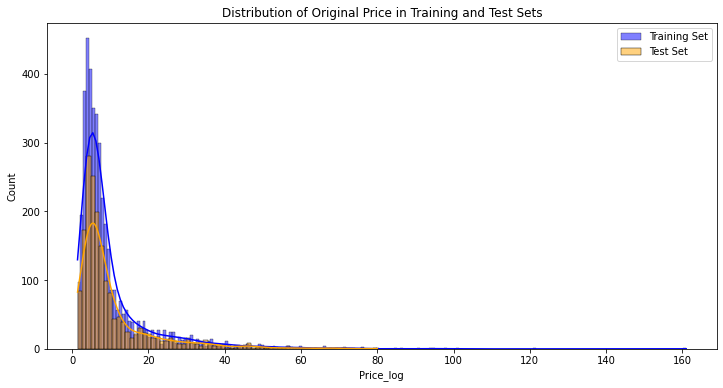

In [417]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize distributions of target variable
plt.figure(figsize=(12, 6))
sns.histplot(np.exp(y_train_new), kde=True, color='blue', label='Training Set')
sns.histplot(np.exp(y_test_new), kde=True, color='orange', label='Test Set')
plt.legend()
plt.title('Distribution of Original Price in Training and Test Sets')
plt.show()


The distribution plot shows that both the training and test sets have a right-skewed distribution for the original price, indicating that most cars are priced at lower values, with only a few high-priced cars. The alignment of the two distributions suggests that the training and test sets are similar in terms of price range, reducing the risk of biased model evaluation.


### **Multicollinearity: 2nd Model**

In [57]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Step 1: Calculate VIF for each feature
# Remove constant term if it is added already
X_train_vif = X_train_new_ols.drop(columns=['const'], errors='ignore')

# Compute VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X_train_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_train_vif.values, i) for i in range(X_train_vif.shape[1])]
print("Initial VIF Scores:\n", vif_data)

Initial VIF Scores:
                   Feature          VIF
0                   Seats  1024.943360
1                     Age     2.697984
2                 Mileage     2.920435
3                  Engine     6.133788
4   Kilometers_Driven_log     1.799172
5               Power_log     4.946147
6            Car_category     1.999150
7          Fuel_Type_Rank     2.024986
8         Owner_Type_Rank     1.258765
9       Transmission_Rank          inf
10     Location_Bangalore     2.395821
11       Location_Chennai     2.950559
12    Location_Coimbatore     3.457226
13         Location_Delhi     3.080428
14     Location_Hyderabad     3.832647
15        Location_Jaipur     2.695879
16         Location_Kochi     3.454583
17       Location_Kolkata     3.050117
18        Location_Mumbai     3.909111
19          Location_Pune     3.307143
20    Transmission_Manual          inf


In [58]:
X_train_vif = X_train_new_ols.drop(columns=['Seats'], errors='ignore')

In [59]:
# Compute VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X_train_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_train_vif.values, i) for i in range(X_train_vif.shape[1])]
print("Initial VIF Scores:\n", vif_data)

Initial VIF Scores:
                   Feature       VIF
0                   const  0.000000
1                   const  0.000000
2                   const  0.000000
3                     Age  2.697984
4                 Mileage  2.920435
5                  Engine  6.133788
6   Kilometers_Driven_log  1.799172
7               Power_log  4.946147
8            Car_category  1.999150
9          Fuel_Type_Rank  2.024986
10        Owner_Type_Rank  1.258765
11      Transmission_Rank       inf
12     Location_Bangalore  2.395821
13       Location_Chennai  2.950559
14    Location_Coimbatore  3.457226
15         Location_Delhi  3.080428
16     Location_Hyderabad  3.832647
17        Location_Jaipur  2.695879
18         Location_Kochi  3.454583
19       Location_Kolkata  3.050117
20        Location_Mumbai  3.909111
21          Location_Pune  3.307143
22    Transmission_Manual       inf


In [60]:
X_train_vif = X_train_new_ols.drop(columns=['Seats','Engine'], errors='ignore')

In [61]:
# Compute VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X_train_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_train_vif.values, i) for i in range(X_train_vif.shape[1])]
print("Initial VIF Scores:\n", vif_data)

Initial VIF Scores:
                   Feature       VIF
0                   const  0.000000
1                   const  0.000000
2                   const  0.000000
3                     Age  2.696166
4                 Mileage  2.068244
5   Kilometers_Driven_log  1.795730
6               Power_log  2.909263
7            Car_category  1.995578
8          Fuel_Type_Rank  1.530809
9         Owner_Type_Rank  1.258744
10      Transmission_Rank       inf
11     Location_Bangalore  2.395810
12       Location_Chennai  2.948327
13    Location_Coimbatore  3.456164
14         Location_Delhi  3.079783
15     Location_Hyderabad  3.829867
16        Location_Jaipur  2.695391
17         Location_Kochi  3.454555
18       Location_Kolkata  3.049569
19        Location_Mumbai  3.908630
20          Location_Pune  3.306923
21    Transmission_Manual       inf


In [62]:
X_train_vif.columns

Index(['const', 'const', 'const', 'Age', 'Mileage', 'Kilometers_Driven_log',
       'Power_log', 'Car_category', 'Fuel_Type_Rank', 'Owner_Type_Rank',
       'Transmission_Rank', 'Location_Bangalore', 'Location_Chennai',
       'Location_Coimbatore', 'Location_Delhi', 'Location_Hyderabad',
       'Location_Jaipur', 'Location_Kochi', 'Location_Kolkata',
       'Location_Mumbai', 'Location_Pune', 'Transmission_Manual'],
      dtype='object')

In [67]:
# Step 1: Drop 'Engine' and 'Seats' columns from both X_train_new and X_test_new
X_train_new_v2 = X_train_new.drop(['Engine', 'Seats'], axis=1)
X_test_new_v2 = X_test_new.drop(['Engine', 'Seats'], axis=1)

# Step 2: Convert boolean columns to integers (1 and 0)
X_train_new_v2 = X_train_new_v2.astype({col: 'int64' for col in X_train_new_v2.select_dtypes('bool').columns})
X_test_new_v2 = X_test_new_v2.astype({col: 'int64' for col in X_test_new_v2.select_dtypes('bool').columns})

# Step 3: Ensure all columns are numeric
X_train_new_ols_v2 = X_train_new_v2.apply(pd.to_numeric, errors='coerce')
X_test_new_ols_v2 = X_test_new_v2.apply(pd.to_numeric, errors='coerce')

# Step 4: Remove any existing constant column if present
if 'const' in X_train_new_ols_v2.columns:
    X_train_new_ols_v2 = X_train_new_ols_v2.drop('const', axis=1)
if 'const' in X_test_new_ols_v2.columns:
    X_test_new_ols_v2 = X_test_new_ols_v2.drop('const', axis=1)

# Step 5: Add a constant term only once
X_train_new_ols_v2 = sm.add_constant(X_train_new_ols_v2, has_constant='add')
X_test_new_ols_v2 = sm.add_constant(X_test_new_ols_v2, has_constant='add')

# Step 6: Ensure the target variable is float
y_train_log_v2 = y_train_new.astype(float)

# Debugging Step: Check for alignment and shapes
print(f"X_train_new_ols_v2 shape: {X_train_new_ols_v2.shape}")
print(f"y_train_log_v2 shape: {y_train_log_v2.shape}")

# Step 7: Ensure alignment of predictors and target variable
X_train_new_ols_v2, y_train_log_v2 = X_train_new_ols_v2.align(y_train_log_v2, join='inner', axis=0)

# Step 8: Convert DataFrames to NumPy arrays to avoid dtype issues
X_train_np_v2 = np.asarray(X_train_new_ols_v2, dtype=float)
X_test_np_v2 = np.asarray(X_test_new_ols_v2, dtype=float)
y_train_np_v2 = np.asarray(y_train_log_v2, dtype=float)

# Debugging Step: Verify sample data
print("Sample of X_train_new_ols_v2:")
print(X_train_new_ols_v2.head())
print("Sample of y_train_log_v2:")
print(y_train_log_v2.head())

# Step 9: Fit the OLS model and catch any errors
try:
    ols_model_new_v2 = sm.OLS(y_train_np_v2, X_train_np_v2).fit()
    print("OLS model successfully created.")
except Exception as e:
    print(f"Error while fitting OLS model: {e}")
    raise  # Re-raise the exception to investigate further

# Step 10: Define the evaluation function
def get_model_score_v2(model, flag=True):
    """
    Calculate R2 and RMSE for training and test sets using original Price values.

    Parameters:
    model : The regressor to evaluate
    flag : If True, prints the scores. Default is True.

    Returns:
    score_list : List containing train R2, test R2, train RMSE, test RMSE
    """
    pred_train_v2 = model.predict(X_train_new_ols_v2)
    pred_test_v2 = model.predict(X_test_new_ols_v2)

    pred_train_v2_ = np.exp(pred_train_v2)  # Convert predictions back to original scale
    pred_test_v2_ = np.exp(pred_test_v2)

    train_r2_v2 = metrics.r2_score(np.exp(y_train_new), pred_train_v2_)
    test_r2_v2 = metrics.r2_score(np.exp(y_test_new), pred_test_v2_)
    train_rmse_v2 = metrics.mean_squared_error(np.exp(y_train_new), pred_train_v2_, squared=False)
    test_rmse_v2 = metrics.mean_squared_error(np.exp(y_test_new), pred_test_v2_, squared=False)

    score_list_v2 = [train_r2_v2, test_r2_v2, train_rmse_v2, test_rmse_v2]

    if flag:
        print(f"R-squared on training set: {train_r2_v2:.4f}")
        print(f"R-squared on test set: {test_r2_v2:.4f}")
        print(f"RMSE on training set: {train_rmse_v2:.4f}")
        print(f"RMSE on test set: {test_rmse_v2:.4f}")

    return score_list_v2

# Step 11: Evaluate the model if it was successfully created
if 'ols_model_new_v2' in locals():
    model_scores_new_v2 = get_model_score_v2(ols_model_new_v2, flag=True)
    print("Summary of the OLS Model (version 2):")
    print(ols_model_new_v2.summary())
else:
    print("OLS model was not created due to errors.")


X_train_new_ols_v2 shape: (4213, 20)
y_train_log_v2 shape: (4213,)
Sample of X_train_new_ols_v2:
      const  Age  Mileage  Kilometers_Driven_log  Power_log  Car_category  \
188     1.0  7.0    22.32              11.034906   4.846704           4.0   
4178    1.0  5.0    22.32              11.461643   4.846704           4.0   
3888    1.0  2.0    18.70              10.644996   4.496471           4.0   
2242    1.0  9.0    14.24              11.608245   5.167639           4.0   
2594    1.0  3.0    18.60              10.545368   4.416790           4.0   

      Fuel_Type_Rank  Owner_Type_Rank  Transmission_Rank  Location_Bangalore  \
188                2                1                  1                   0   
4178               2                2                  1                   1   
3888               1                1                  1                   0   
2242               2                1                  1                   0   
2594               1                1   

We built the model and calculated R-squared and the p-values. We can see that the **Location related categories in the Location_Chennai, Location_Delhi, Location_Jaipur, Location_Kochi, Location_Pune column show a p-value higher than 0.05. So, we will drop those columns.**

### Normality of error terms

Tests for normality focus on the distribution of error terms (residuals) in a regression model, which should ideally follow a normal distribution.

Non-normality in residuals can lead to unreliable confidence intervals and difficulties in estimating model coefficients through least squares minimization.

To assess normality, one can visualize the residuals using histograms plot.

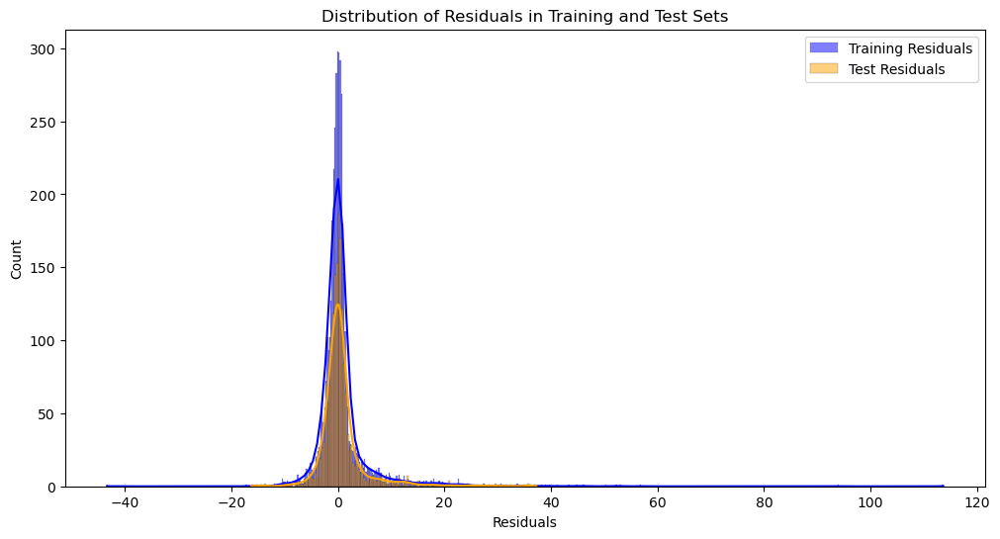

In [70]:
# Step 1: Generate predictions for training and test sets using the new model
pred_train_v2 = ols_model_new_v2.predict(X_train_new_ols_v2)  # Predictions on training data
pred_test_v2 = ols_model_new_v2.predict(X_test_new_ols_v2)    # Predictions on test data

# Step 2: Convert log-transformed predictions back to the original price scale
pred_train_v2_ = np.exp(pred_train_v2)  # Revert the log transformation for training predictions
pred_test_v2_ = np.exp(pred_test_v2)    # Revert the log transformation for test predictions

# Step 3: Calculate residuals for training and test sets
# Since y_train_new and y_test_new are the original target variables, use them for residual calculation
train_residuals_v2 = np.exp(y_train_log_v2) - pred_train_v2_
test_residuals_v2 = np.exp(y_test_new) - pred_test_v2_

# Step 4: Plot the residuals distribution for both sets
plt.figure(figsize=(12, 6))
sns.histplot(train_residuals_v2, kde=True, color='blue', label='Training Residuals')
sns.histplot(test_residuals_v2, kde=True, color='orange', label='Test Residuals')
plt.legend()
plt.title('Distribution of Residuals in Training and Test Sets')
plt.xlabel('Residuals')
plt.ylabel('Count')
plt.show()

This plot indicates that the model is well-fit, with minimal bias and consistent performance across both datasets, suggesting good predictive quality

#### Now, we rebuilt the model by dropping 'Location_Chennai', 'Location_Delhi', 'Location_Jaipur', 'Location_Kochi', 'Location_Pune'.

## **Make Model: 3rd Model**

In [71]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn import metrics  # Import the metrics module from sklearn

# Step 1: Drop specified columns with high p-values from X_train_new_v2 and X_test_new_v2
columns_to_drop_v3 = ['Location_Chennai', 'Location_Delhi', 'Location_Jaipur', 'Location_Kochi', 'Location_Pune']
X_train_new_v3 = X_train_new_v2.drop(columns=columns_to_drop_v3, axis=1)
X_test_new_v3 = X_test_new_v2.drop(columns=columns_to_drop_v3, axis=1)

# Step 2: Ensure all columns in the training and testing data are numeric
X_train_new_ols_v3 = X_train_new_v3.apply(pd.to_numeric, errors='coerce')
X_test_new_ols_v3 = X_test_new_v3.apply(pd.to_numeric, errors='coerce')

# Step 3: Add constant term to both train and test sets
X_train_new_ols_v3 = sm.add_constant(X_train_new_ols_v3, has_constant='add')  # Ensure constant term is included
X_test_new_ols_v3 = sm.add_constant(X_test_new_ols_v3, has_constant='add')  # Same for test set

# Step 4: Ensure target variable is of float type for fitting the model
y_train_log_v3 = y_train_new.astype(float)

# Step 5: Fit the OLS model using statsmodels with the updated variable names
ols_model_new_v3 = sm.OLS(y_train_log_v3, X_train_new_ols_v3).fit()

# Define the get_model_score function using updated variable names for version 3
def get_model_score_v3(model, flag=True):
    """
    Calculate R2 and RMSE for training and test set using original Price values.

    Parameters:
    model : The regressor to evaluate
    flag : If True, prints the scores. Default is True.

    Returns:
    score_list : List containing train R2, test R2, train RMSE, test RMSE
    """
    # Predict log-transformed prices on training and test data
    pred_train_v3 = model.predict(X_train_new_ols_v3)
    pred_test_v3 = model.predict(X_test_new_ols_v3)

    # Convert log-transformed predictions back to original price scale
    pred_train_v3_ = np.exp(pred_train_v3)
    pred_test_v3_ = np.exp(pred_test_v3)

    # Calculate metrics using original 'Price' column
    train_r2_v3 = metrics.r2_score(np.exp(y_train_new), pred_train_v3_)
    test_r2_v3 = metrics.r2_score(np.exp(y_test_new), pred_test_v3_)
    train_rmse_v3 = metrics.mean_squared_error(np.exp(y_train_new), pred_train_v3_, squared=False)
    test_rmse_v3 = metrics.mean_squared_error(np.exp(y_test_new), pred_test_v3_, squared=False)

    # Add scores to a list and return it
    score_list_v3 = [train_r2_v3, test_r2_v3, train_rmse_v3, test_rmse_v3]

    # Print scores if flag is set to True
    if flag:
        print(f"R-squared on training set : {train_r2_v3:.4f}")
        print(f"R-squared on test set : {test_r2_v3:.4f}")
        print(f"RMSE on training set : {train_rmse_v3:.4f}")
        print(f"RMSE on test set : {test_rmse_v3:.4f}")

    return score_list_v3
# Step 6: Evaluate the new model using the modified evaluation function
model_scores_new_v3 = get_model_score_v3(ols_model_new_v3, flag=True)

# Step 7: Print the summary of the new OLS model
print("Summary of the OLS Model (version 3) after dropping specified columns:")
print(ols_model_new_v3.summary())


R-squared on training set : 0.7569
R-squared on test set : 0.8147
RMSE on training set : 5.5758
RMSE on test set : 4.6912
Summary of the OLS Model (version 3) after dropping specified columns:
                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.869
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     2144.
Date:                Wed, 16 Oct 2024   Prob (F-statistic):               0.00
Time:                        14:14:57   Log-Likelihood:                -461.21
No. Observations:                4213   AIC:                             950.4
Df Residuals:                    4199   BIC:                             1039.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 

#### It seems like the model did not significantly improve after dropping those features.

In [72]:
# Calculate R-squared on log-transformed scale directly (without converting back to original)
log_train_r2_v3 = ols_model_new_v3.rsquared  # R-squared value on log scale (training)
log_train_adj_r2_v3 = ols_model_new_v3.rsquared_adj  # Adjusted R-squared value on log scale (training)

# Print R-squared and Adjusted R-squared values for log-transformed model
print(f"R-squared on log-transformed training set: {log_train_r2_v3:.4f}")
print(f"Adjusted R-squared on log-transformed training set: {log_train_adj_r2_v3:.4f}")

# Optionally, evaluate R-squared on the log scale for test set (if needed)
pred_test_log_v3 = ols_model_new_v3.predict(X_test_new_ols_v3)
test_r2_log_v3 = metrics.r2_score(y_test_new, pred_test_log_v3)
print(f"R-squared on log-transformed test set: {test_r2_log_v3:.4f}")


R-squared on log-transformed training set: 0.8691
Adjusted R-squared on log-transformed training set: 0.8687
R-squared on log-transformed test set: 0.8854


* The high R-squared values on both training and test sets (above 0.85) indicate a strong fit.

* The similarity between the R-squared values of the training and test sets shows that the model is generalizing well and not suffering from overfitting or underfitting.

* Adjusted R-squared is only slightly lower than R-squared, which suggests that the features I have selected are appropriate and not causing significant redundancy or noise in the model.

## **Checking Linear Regression Assumptions: 3rd model**

Since we are now satisfied with the model, in order to make statistical inferences from a linear regression model, it is important to ensure that the assumptions of linear regression are satisfied. Those assumptions are below:

* **Mean of residuals should be 0**
* **No Heteroscedasticity**
* **Linearity of variables**
* **Normality of error terms**

## **1. Check for mean residuals**


In [74]:
residuals = ols_model_new_v3.resid

np.mean(residuals)

3.768591842050662e-15

### **Observation**

The mean of residuals is very close to 0. Hence, so the corresponding assumption is satisfied.

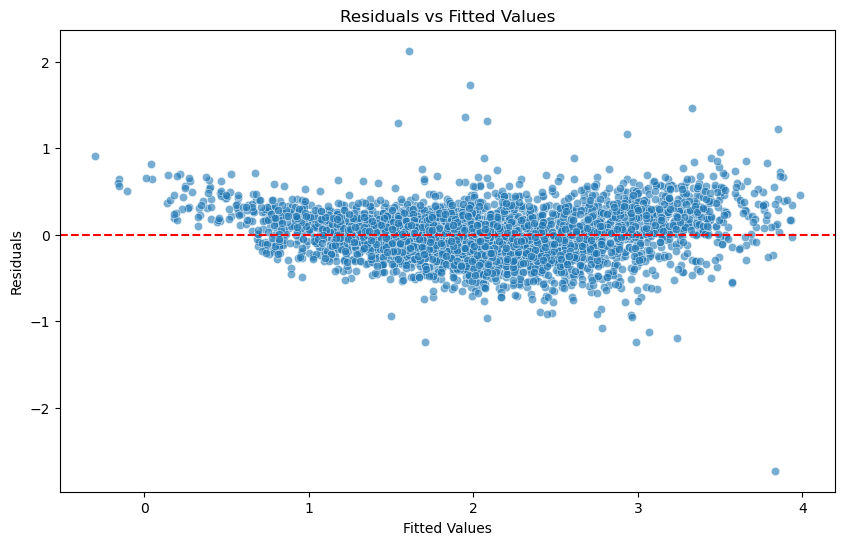

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate fitted values
fitted_values = ols_model_new_v3.fittedvalues

# Plot residuals vs fitted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_values, y=residuals, alpha=0.6)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()


The residuals vs. fitted values plot indicates a reasonably good fit with no major issues. However, there is some variation in residual spread and presence of some outliers suggest that further refinement of the model could be considered for improved performance.

## **2. Check for homoscedasticity**

**Homoscedasticity:** When the variance of the residuals is evenly distributed around the regression line, the data is considered homoscedastic.

**Heteroscedasticity:** When the variance of the residuals is uneven across the regression line, the data is considered heteroscedastic. In such cases, the residuals may form patterns like a funnel shape or other non-symmetrical shapes.

To check for homoscedasticity, we will use the Goldfeld-Quandt test.

**Null hypothesis:** Residuals are homoscedastic.

**Alternative hypothesis:** Residuals are heteroscedastic.

In [429]:
from statsmodels.stats.diagnostic import het_white, het_goldfeldquandt
from statsmodels.compat import lzip
import statsmodels.stats.api as sms

# Check homoscedasticity using White's Test
# Step 1: Use residuals and independent variables from the model
white_test = het_white(ols_model_new_v3.resid, ols_model_new_v3.model.exog)

# Step 2: Define the labels for the test results
white_test_labels = ['Test Statistic', 'Test Statistic p-value', 'F-Statistic', 'F-Test p-value']

# Step 3: Print the results of the White's Test
print("\nWhite's Test for Homoscedasticity:")
print(dict(zip(white_test_labels, white_test)))

# Check homoscedasticity using Goldfeld-Quandt Test
#  Perform the test using the dependent variable and independent variables
gq_test = sms.het_goldfeldquandt(y_train_log_v3, X_train_new_ols_v3, idx=0)

#  Define the labels for the test results
gq_test_labels = ['F Statistic', 'p-value']

#  Print the results of the Goldfeld-Quandt Test
print("\nGoldfeld-Quandt Test for Homoscedasticity:")
print(dict(zip(gq_test_labels, gq_test)))



White's Test for Homoscedasticity:
{'Test Statistic': 1093.4787151678734, 'Test Statistic p-value': 3.412109915819642e-173, 'F-Statistic': 16.427004081737234, 'F-Test p-value': 4.686940469270752e-205}

Goldfeld-Quandt Test for Homoscedasticity:
{'F Statistic': 1.1001394730552272, 'p-value': 0.014548706114991431}


#### The p-value is less than 0.05, indicating that we can reject the null hypothesis at the 5% significance level. This suggests that heteroscedasticity is present, meaning that the variance of the errors is not constant.

### We will use Weighted Least Squares (WLS) regression model that accounts for heteroscedasticity by applying weights to the observations.

## **Weighted Least Squares Regression Model**

In [76]:
import statsmodels.api as sm

# Estimate weights: the variance of the residuals can serve as a starting point
weights = 1 / (ols_model_new_v3.resid ** 2)

# Apply WLS
wls_model = sm.WLS(y_train_log_v3, X_train_new_ols_v3, weights=weights).fit()
print(wls_model.summary())


                            WLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       1.000
Model:                            WLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 6.417e+06
Date:                Wed, 16 Oct 2024   Prob (F-statistic):               0.00
Time:                        14:15:24   Log-Likelihood:                 2654.5
No. Observations:                4213   AIC:                            -5281.
Df Residuals:                    4199   BIC:                            -5192.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.71

In [77]:
from sklearn.metrics import r2_score, mean_squared_error 

#  'ols_model_new_v3' is the original OLS model trained on the training data
# and 'X_train_new_ols_v3', 'y_train_log_v3' are my training features and target respectively

# Step 1: Calculate the weights using the residuals from the OLS model on the training set
train_residuals_v3 = ols_model_new_v3.resid
train_weights_v3 = 1 / np.square(train_residuals_v3)

# Step 2: Fit the WLS model on the training data using these weights
wls_model_train = sm.WLS(y_train_log_v3, X_train_new_ols_v3, weights=train_weights_v3).fit()

# Print the summary of the WLS model fitted on the training set
print(wls_model_train.summary())



# Step 3: Calculate weights for the test set based on residuals of the WLS model (using predictions on test set)
# Use the weights from the training set as an approximation for applying WLS on test set
test_predictions_v3 = wls_model_train.predict(X_test_new_ols_v3)  # Predict on test set
test_residuals_v3 = y_test_new - test_predictions_v3  # Calculate residuals on test set
test_weights_v3 = 1 / np.square(test_residuals_v3)  # Calculate weights for test set based on residuals

# Step 4: Fit the WLS model on the test set using the calculated weights
wls_model_test = sm.WLS(y_test_new, X_test_new_ols_v3, weights=test_weights_v3).fit()

# Step 5: Evaluate the WLS model performance on the test set
print("R-squared on the test set: {:.4f}".format(wls_model_test.rsquared))
print("Adjusted R-squared on the test set: {:.4f}".format(wls_model_test.rsquared_adj))

# Step 6: Get the predictions and calculate RMSE on test set
pred_test_wls = wls_model_test.predict(X_test_new_ols_v3)
rmse_test_wls = np.sqrt(mean_squared_error(y_test_new, pred_test_wls))
print("RMSE on the test set: {:.4f}".format(rmse_test_wls))

# Optional: Print the summary of the WLS model fitted on the test set
print(wls_model_test.summary())

                            WLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       1.000
Model:                            WLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 6.417e+06
Date:                Wed, 16 Oct 2024   Prob (F-statistic):               0.00
Time:                        14:15:27   Log-Likelihood:                 2654.5
No. Observations:                4213   AIC:                            -5281.
Df Residuals:                    4199   BIC:                            -5192.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.71

**The model is 100% perfect, which seems unrealistic. It is probably overfitting. We will verify if the linear regression assumptions are satisfied in this model.**

## **1. Check for mean residuals**


In [78]:
residuals_wls = wls_model_train.resid

np.mean(residuals_wls)

0.00035456656694552737

The mean of the residuals are almost zero, hence, so the corresponding assumption is satisfied.

## **2. Linearity of variables**

It indicates that the predictor variables should have a linear relationship with the dependent variable.

To test this assumption, we will plot the residuals against the fitted values. The residuals should not form a distinct pattern and should be randomly and uniformly scattered along the x-axis.

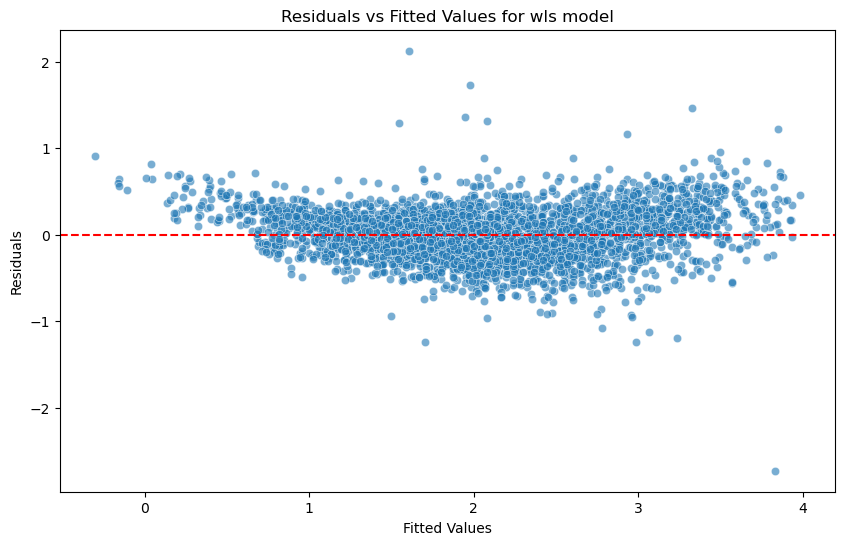

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate fitted values
fitted_values_wls = wls_model_train.fittedvalues

# Plot residuals vs fitted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_values_wls, y=residuals_wls, alpha=0.6)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Fitted Values for wls model')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

**The residual plot very similar to the last one. So, the model is really not much of an improvement from the last one. There are some outlier points hinting that fitted value differed significantly from the original value. These might be those cars with very high price.**

In [80]:
from statsmodels.stats.diagnostic import het_white, het_goldfeldquandt
from statsmodels.compat import lzip
import statsmodels.stats.api as sms

# Check homoscedasticity using White's Test on WLS model residuals and independent variables
white_test_wls = het_white(wls_model_train.resid, wls_model_train.model.exog)

#  Define the labels for the White's Test results
white_test_labels_wls = ['Test Statistic', 'Test Statistic p-value', 'F-Statistic', 'F-Test p-value']

#  Print the results of the White's Test for the WLS model
print("\nWhite's Test for Homoscedasticity (WLS Model - Training Set):")
print(dict(zip(white_test_labels_wls, white_test_wls)))

#  Check homoscedasticity using Goldfeld-Quandt Test on WLS model
# The test uses the dependent variable (`y_train_log_v3`) and the independent variables (`X_train_new_ols_v3`)
gq_test_wls = sms.het_goldfeldquandt(y_train_log_v3, X_train_new_ols_v3, idx=0)

#  Define the labels for the Goldfeld-Quandt Test results
gq_test_labels_wls = ['F Statistic', 'p-value']

#  Print the results of the Goldfeld-Quandt Test for the WLS model
print("\nGoldfeld-Quandt Test for Homoscedasticity (WLS Model - Training Set):")
print(dict(zip(gq_test_labels_wls, gq_test_wls)))



White's Test for Homoscedasticity (WLS Model - Training Set):
{'Test Statistic': 1093.2071966991118, 'Test Statistic p-value': 3.866820757848629e-173, 'F-Statistic': 16.421495838445406, 'F-Test p-value': 5.548836218715412e-205}

Goldfeld-Quandt Test for Homoscedasticity (WLS Model - Training Set):
{'F Statistic': 1.1001394730552272, 'p-value': 0.014548706114991431}


**So, there is heteroscedascity in this model also!**

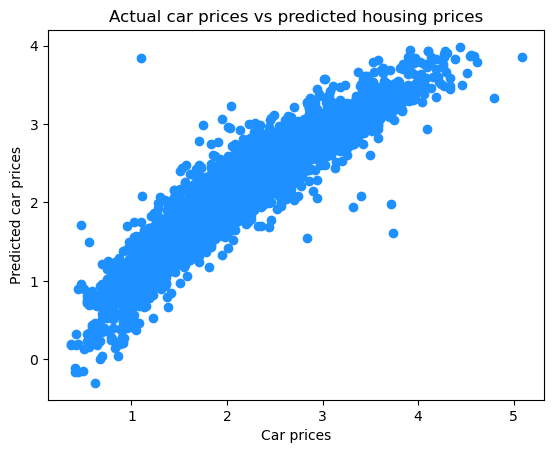

In [81]:
#y_train_log_v3, X_train_new_ols_v3

y_pred_train_ols = ols_model_new_v3.predict(X_train_new_ols_v3)

# Visualizing the differences between actual prices and predicted values
plt.scatter(y_train_log_v3, y_pred_train_ols, color='dodgerblue')
plt.xlabel("Car prices")
plt.ylabel("Predicted car prices")
plt.title("Actual car prices vs predicted housing prices")
plt.show()

**The predicted car prices are mostly aligned with actual car prices, except a few outlier points. Since, it seems like these points may be the reason for heteroscedascity, we will remove those outlier points (there are only a few of them, so it will not make the sample significantly smaller) from our model and re-make the model.**

## **Define outliers: Drop them**

Calculate the standard deviation of residuals and set a threshold 3.5 times the standard deviation, drop those rows from both X_train and y_train

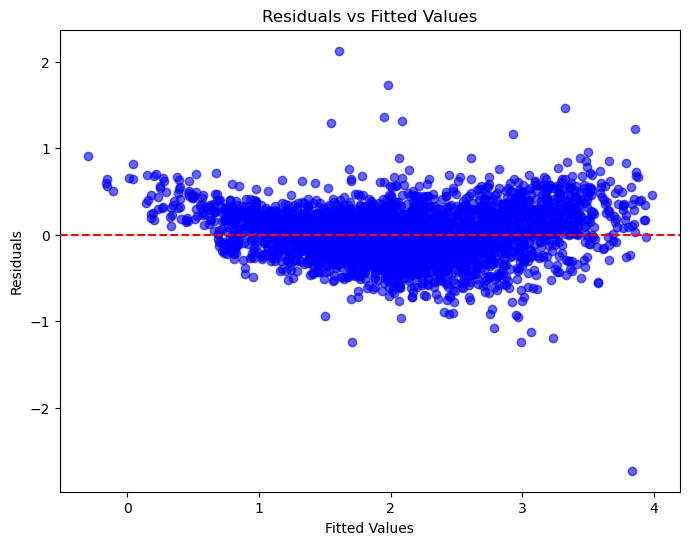

Indices of Outliers:
[ 129  303  654  666  676  813  959 1274 1305 1582 1685 2049 2827 2924
 3521 4072 4131]

Outlier values:
749     3.314186
5744    2.014903
5075    3.401197
351     1.115142
5990    0.470004
3132    1.105257
4079    5.081404
4152    2.839663
6011    1.749200
926     3.713572
5535    4.454347
3059    2.037317
2681    1.945910
1460    3.734808
5781    4.795791
5521    4.094345
1679    1.704748
Name: Price_log, dtype: float64
Shape of X_train after removing outliers: (4196, 15)
Shape of y_train after removing outliers: (4196,)


In [82]:
import numpy as np
import matplotlib.pyplot as plt

#  Calculate residuals for the model
residuals_v3 = y_train_log_v3 - ols_model_new_v3.fittedvalues

#  Plot the residuals to visually inspect the outliers
plt.figure(figsize=(8, 6))
plt.scatter(ols_model_new_v3.fittedvalues, residuals_v3, alpha=0.6, color='blue')
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Fitted Values')
plt.show()

#  Calculate the standard deviation of residuals and set a threshold
# Threshold: 3.5 times the standard deviation 
threshold = 3.5 * np.std(residuals_v3)

# Identify outliers based on the threshold
outliers = np.abs(residuals_v3) > threshold

# Print the indices and values of the identified outliers
print("Indices of Outliers:")
print(np.where(outliers)[0])
print("\nOutlier values:")
print(y_train_new[outliers])

# Step 4: Remove outliers from the dataset
# Filter out outliers from the original dataset
X_train_filtered = X_train_new_ols_v3[~outliers]
y_train_filtered = y_train_new[~outliers]

# Verify the shape of the dataset after removing outliers
print("Shape of X_train after removing outliers:", X_train_filtered.shape)
print("Shape of y_train after removing outliers:", y_train_filtered.shape)


## **Making Model: 4th Model**

In [83]:
# Create filtered training dataset by removing the outliers identified earlier
X_train_filtered_v4 = X_train_new_ols_v3[~outliers]  # Remove outliers from X_train
y_train_filtered_v4 = y_train_log_v3[~outliers]  # Remove outliers from y_train

#  Fit a new OLS model using the filtered data
ols_model_filtered_v4 = sm.OLS(y_train_filtered_v4, X_train_filtered_v4).fit()

#  Evaluate the new model using the filtered dataset
# Define a function for evaluating the model using filtered data
def evaluate_filtered_model(model, X_train, y_train, X_test, y_test, flag=True):
    """
    Evaluate the model using R-squared and RMSE on the training and test sets.

    Parameters:
    - model: The model to evaluate.
    - X_train, y_train: Training data.
    - X_test, y_test: Test data.
    - flag: If True, print the evaluation results.

    Returns:
    - Dictionary of evaluation metrics (R-squared and RMSE).
    """
    # Predict log-transformed prices on training and test data
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)

    # Convert log-transformed predictions back to original price scale
    pred_train_original = np.exp(pred_train)
    pred_test_original = np.exp(pred_test)

    # Calculate R-squared and RMSE using original 'Price' column
    train_r2 = metrics.r2_score(np.exp(y_train), pred_train_original)
    test_r2 = metrics.r2_score(np.exp(y_test), pred_test_original)
    train_rmse = metrics.mean_squared_error(np.exp(y_train), pred_train_original, squared=False)
    test_rmse = metrics.mean_squared_error(np.exp(y_test), pred_test_original, squared=False)

    # Store results in a dictionary
    results = {
        "Train R-squared": train_r2,
        "Test R-squared": test_r2,
        "Train RMSE": train_rmse,
        "Test RMSE": test_rmse
    }

    # Print results if flag is set to True
    if flag:
        print(f"Train R-squared: {train_r2:.4f}")
        print(f"Test R-squared: {test_r2:.4f}")
        print(f"Train RMSE: {train_rmse:.4f}")
        print(f"Test RMSE: {test_rmse:.4f}")

    return results

#  Evaluate and print the performance of the new model with filtered data
print("Model Performance After Removing Outliers:")
filtered_model_performance = evaluate_filtered_model(
    ols_model_filtered_v4,
    X_train_filtered_v4,
    y_train_filtered_v4,
    X_test_new_ols_v3,
    y_test_new
)

#  Print the summary of the new model to check coefficients and other statistics
print("\nSummary of the OLS Model after Removing Outliers (Version 4):")
print(ols_model_filtered_v4.summary())


Model Performance After Removing Outliers:
Train R-squared: 0.8054
Test R-squared: 0.8194
Train RMSE: 4.7800
Test RMSE: 4.6314

Summary of the OLS Model after Removing Outliers (Version 4):
                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.882
Method:                 Least Squares   F-statistic:                     2408.
Date:                Wed, 16 Oct 2024   Prob (F-statistic):               0.00
Time:                        14:16:21   Log-Likelihood:                -209.16
No. Observations:                4196   AIC:                             446.3
Df Residuals:                    4182   BIC:                             535.1
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                    

### **The model is performing better now. The difference between R-squared and RMSE values for training (R-squared: 0.81, RMSE: 4.78) and test sets (R-squared: 0.82, RMSE: 4.63) are reduced significantly.**

### **Now, we will check if the linear regression assumptions are satisfied**

## **Checking Heteroscedasticity**

In [84]:
# Import necessary libraries
from statsmodels.stats.diagnostic import het_white, het_goldfeldquandt
import statsmodels.stats.api as sms

# Step 1: Perform White's Test for heteroscedasticity
white_test_v4 = het_white(ols_model_filtered_v4.resid, ols_model_filtered_v4.model.exog)
white_test_labels = ['Test Statistic', 'Test Statistic p-value', 'F-Statistic', 'F-Test p-value']
print("\nWhite's Test for Homoscedasticity (OLS Model - Filtered Data):")
print(dict(zip(white_test_labels, white_test_v4)))

# Step 2: Perform Goldfeld-Quandt Test for heteroscedasticity
gq_test_v4 = sms.het_goldfeldquandt(y_train_filtered_v4, X_train_filtered_v4, idx=0)
gq_test_labels = ['F Statistic', 'p-value']
print("\nGoldfeld-Quandt Test for Homoscedasticity (OLS Model - Filtered Data):")
print(dict(zip(gq_test_labels, gq_test_v4)))



White's Test for Homoscedasticity (OLS Model - Filtered Data):
{'Test Statistic': 915.9243817928412, 'Test Statistic p-value': 6.120515200613438e-138, 'F-Statistic': 13.03220175481839, 'F-Test p-value': 6.941365750676515e-159}

Goldfeld-Quandt Test for Homoscedasticity (OLS Model - Filtered Data):
{'F Statistic': 1.005135889889971, 'p-value': 0.45346379842445883}


* Since the p-value is greater than 0.05 (0.45 in this case), we cannot reject the null hypothesis that the residuals are homoscedastic. Therefore, the assumption of homoscedasticity is satisfied.

## **Checking Multicollinearity**

In [99]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming the final filtered version of the training data is `X_train_new_ols_v3`
# and we want to use that to create `X_train_new_ols_v4`

# Step 1: Create the new version `X_train_new_ols_v4` from the current filtered data (X_train_new_ols_v3)
X_train_new_ols_v4 = X_train_new_ols_v3.copy()

# Step 2: Ensure all columns in the training data are numeric
X_train_new_ols_v4 = X_train_new_ols_v4.apply(pd.to_numeric, errors='coerce')

# Step 3: Define a function to calculate VIF for each feature
def calculate_vif(dataframe):
    """
    Calculate VIF (Variance Inflation Factor) for each feature in a DataFrame.

    Parameters:
    dataframe (pd.DataFrame): The DataFrame containing independent variables.

    Returns:
    pd.DataFrame: A DataFrame with the feature names and their corresponding VIF values.
    """
    vif_data = pd.DataFrame()
    vif_data['Feature'] = dataframe.columns
    vif_data['VIF'] = [variance_inflation_factor(dataframe.values, i) for i in range(dataframe.shape[1])]
    return vif_data

# Step 4: Exclude the constant column (if present) to focus on feature multicollinearity
X_train_vif_v4 = X_train_new_ols_v4.drop('const', axis=1, errors='ignore')

# Step 5: Calculate and display the VIF values for the filtered training set
vif_results_v4 = calculate_vif(X_train_vif_v4)
print("VIF Results for the current OLS model's features (Version 4):\n", vif_results_v4)


VIF Results for the current OLS model's features (Version 4):
                   Feature         VIF
0                     Age   10.391981
1                 Mileage   26.624708
2   Kilometers_Driven_log  302.060133
3               Power_log  205.306051
4            Car_category   25.825377
5          Fuel_Type_Rank   12.455872
6         Owner_Type_Rank   10.046972
7       Transmission_Rank         inf
8      Location_Bangalore    1.147345
9     Location_Coimbatore    1.276388
10     Location_Hyderabad    1.314462
11       Location_Kolkata    1.245476
12        Location_Mumbai    1.327561
13    Transmission_Manual         inf


**Now, we see VIF > 5 for multiple features, like Kilometers_Driven_log, Mileage, Power_log, Car_category, Fuel_Type_Rank, Owner_Type_Rank. We do not want to remove those features from the model since they are important for the model. So, we will explore correlation between features.**

## **Check for correlation between features**

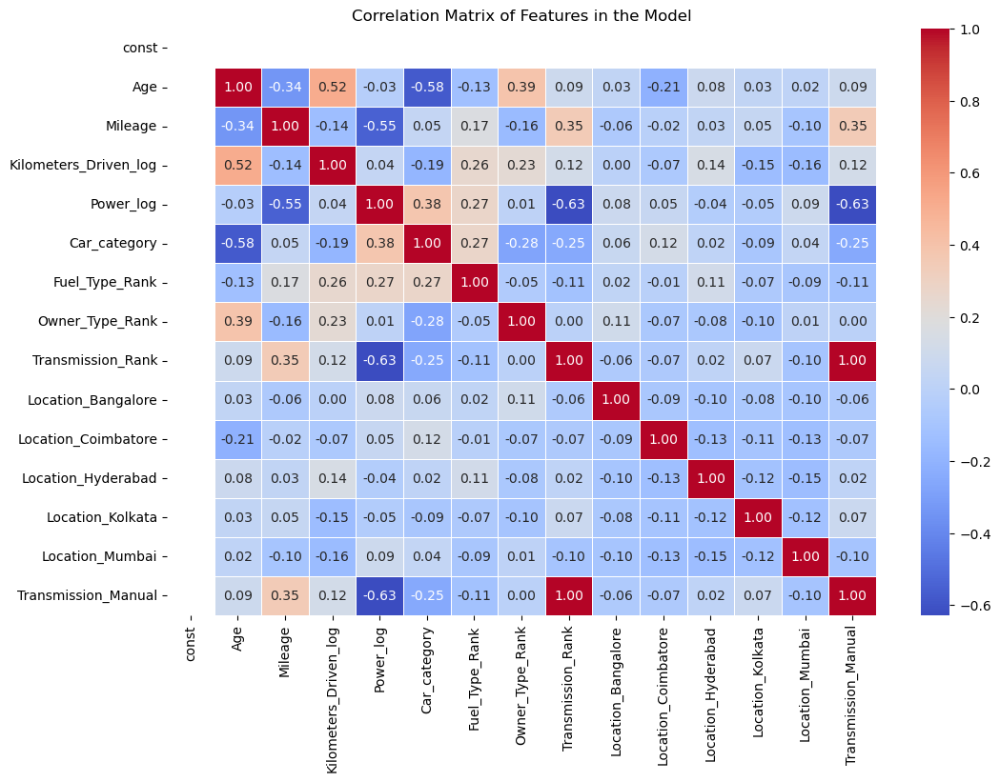

Highly correlated feature pairs (correlation > 0.8 or < -0.8):
Series([], dtype: float64)


In [89]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Create a correlation matrix for the feature set in X_train_new_ols_v4
correlation_matrix = X_train_new_ols_v4.corr()

# Step 2: Plot the correlation matrix using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix of Features in the Model')
plt.show()

# Step 3: Identify pairs of features with high correlation (above a threshold, e.g., 0.8 or -0.8)
high_correlation_pairs = correlation_matrix.abs().unstack().sort_values(kind="quicksort", ascending=False)
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs > 0.8]
high_correlation_pairs = high_correlation_pairs[high_correlation_pairs < 1]  # Exclude self-correlation

# Print the highly correlated feature pairs
print("Highly correlated feature pairs (correlation > 0.8 or < -0.8):")
print(high_correlation_pairs)


**Power and Mileage seem to be highly correlated in the correlated negatively. It is also understable how Power and Mileage can be inversely related. Power and mileage often have a negative correlation because higher power engines tend to consume more fuel, leading to lower mileage.**

* So, we will introduce interaction term for power and mileage.

## **Create interaction term and refit the model with the interaction term and both original features**

In [100]:
# Step 1: Create the new version `X_train_new_ols_v4` from the current filtered data (`X_train_new_ols_v3`)
X_train_new_ols_v4 = X_train_new_ols_v3.copy()
X_test_new_ols_v4 = X_test_new_ols_v3.copy()  # Ensure the same for test data

# Step 2: Ensure all columns in the training and test data are numeric
X_train_new_ols_v4 = X_train_new_ols_v4.apply(pd.to_numeric, errors='coerce')
X_test_new_ols_v4 = X_test_new_ols_v4.apply(pd.to_numeric, errors='coerce')

# Step 3: Create the interaction term `Power_Mileage_Interaction` for both train and test sets
X_train_new_ols_v4['Power_Mileage_Interaction'] = X_train_new_ols_v4['Power_log'] * X_train_new_ols_v4['Mileage']
X_test_new_ols_v4['Power_Mileage_Interaction'] = X_test_new_ols_v4['Power_log'] * X_test_new_ols_v4['Mileage']

# Step 4: Add constant term for OLS if not already present
if 'const' not in X_train_new_ols_v4.columns:
    X_train_new_ols_v4 = sm.add_constant(X_train_new_ols_v4, has_constant='add')
if 'const' not in X_test_new_ols_v4.columns:
    X_test_new_ols_v4 = sm.add_constant(X_test_new_ols_v4, has_constant='add')

# Step 5: Fit the new OLS model with the interaction term included
y_train_log_v4 = y_train_new.astype(float)  # Ensure target variable is float
ols_model_new_v4_interaction = sm.OLS(y_train_log_v4, X_train_new_ols_v4).fit()

# Step 6: Print the summary of the new model
print("Summary of the OLS Model after Including the Interaction Term:")
print(ols_model_new_v4_interaction.summary())

# Step 7: Define the evaluation function
def get_model_score_v4(model, X_train, X_test, y_train, y_test, flag=True):
    """
    Calculate R2 and RMSE for training and test sets using original Price values.

    Parameters:
    model : The regressor to evaluate
    X_train, X_test : Independent variables for train and test set
    y_train, y_test : Dependent variables for train and test set
    flag : If True, prints the scores. Default is True.

    Returns:
    score_list : List containing train R2, test R2, train RMSE, test RMSE
    """
    # Predict log-transformed prices on training and test data
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)

    # Convert log-transformed predictions back to original price scale
    pred_train_ = np.exp(pred_train)
    pred_test_ = np.exp(pred_test)

    # Calculate metrics using original 'Price' column
    train_r2 = metrics.r2_score(np.exp(y_train), pred_train_)
    test_r2 = metrics.r2_score(np.exp(y_test), pred_test_)
    train_rmse = metrics.mean_squared_error(np.exp(y_train), pred_train_, squared=False)
    test_rmse = metrics.mean_squared_error(np.exp(y_test), pred_test_, squared=False)

    # Add scores to a list and return it
    score_list = [train_r2, test_r2, train_rmse, test_rmse]

    # Print scores if flag is set to True
    if flag:
        print(f"R-squared on training set: {train_r2:.4f}")
        print(f"R-squared on test set: {test_r2:.4f}")
        print(f"RMSE on training set: {train_rmse:.4f}")
        print(f"RMSE on test set: {test_rmse:.4f}")

    return score_list

# Step 8: Evaluate the new model on training and test sets
y_test_new = y_test_new.astype(float)  # Ensure test target is also float
model_scores_interaction = get_model_score_v4(
    ols_model_new_v4_interaction, 
    X_train_new_ols_v4, 
    X_test_new_ols_v4, 
    y_train_log_v4, 
    y_test_new
)

print("\nModel Performance After Including Interaction Term:")
print(model_scores_interaction)


Summary of the OLS Model after Including the Interaction Term:
                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     2004.
Date:                Wed, 16 Oct 2024   Prob (F-statistic):               0.00
Time:                        14:27:25   Log-Likelihood:                -448.41
No. Observations:                4213   AIC:                             926.8
Df Residuals:                    4198   BIC:                             1022.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------

**The model performs reasonably well. However, the improvement is not significant.**

### Multicollinearity

In [101]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Step 1: Create a DataFrame for calculating VIF (excluding the dependent variable)
# Use the training set with the interaction term included
X_vif_v4 = X_train_new_ols_v4.drop(columns=['const'], errors='ignore')

# Step 2: Calculate VIF for each feature in the updated model
vif_data_v4 = pd.DataFrame()
vif_data_v4["Feature"] = X_vif_v4.columns
vif_data_v4["VIF"] = [variance_inflation_factor(X_vif_v4.values, i) for i in range(X_vif_v4.shape[1])]

# Step 3: Display the VIF results
print("VIF Results After Adding Interaction Term:")
print(vif_data_v4)


VIF Results After Adding Interaction Term:
                      Feature         VIF
0                         Age   10.674384
1                     Mileage  590.369675
2       Kilometers_Driven_log  459.955405
3                   Power_log  394.984208
4                Car_category   25.983123
5              Fuel_Type_Rank   14.074302
6             Owner_Type_Rank   10.076632
7           Transmission_Rank         inf
8          Location_Bangalore    1.148397
9         Location_Coimbatore    1.277524
10         Location_Hyderabad    1.316475
11           Location_Kolkata    1.258617
12            Location_Mumbai    1.342120
13        Transmission_Manual         inf
14  Power_Mileage_Interaction  688.977817


**High VIF values indicate strong correlations between features, leading to unstable coefficients and potential model overfitting. By standardizing the features (i.e., scaling them to have zero mean and unit variance), the model can better handle these correlations and reduce VIF values, making it less likely that relevant features are dropped.** 

## **Make Model by standarding the independent features: 5th Model**

In [105]:
# Import necessary libraries
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import pandas as pd

# Standardize the training and test datasets
scaler = StandardScaler()

# Fit and transform the training data
X_train_standardized_v4 = pd.DataFrame(scaler.fit_transform(X_train_new_ols_v4), columns=X_train_new_ols_v4.columns)
# Transform the test data using the same scaler
X_test_standardized_v4 = pd.DataFrame(scaler.transform(X_test_new_ols_v4), columns=X_test_new_ols_v4.columns)

# Ensure the indices of standardized X match y_train_log_v4
X_train_standardized_v4.index = y_train_log_v4.index
X_test_standardized_v4.index = X_test_new_ols_v4.index  # This assumes y_test has same index as X_test

# Add a constant to the standardized data
X_train_standardized_ols_v4 = sm.add_constant(X_train_standardized_v4, has_constant='add')
X_test_standardized_ols_v4 = sm.add_constant(X_test_standardized_v4, has_constant='add')

# Step 2: Fit a new OLS model using the standardized training data
y_train_log_v4 = y_train_log_v4.astype(float)  # Ensure target variable is float type
# Ensure that the indices of `y_train_log_v4` match those of `X_train_standardized_ols_v4`
y_train_log_v4 = y_train_log_v4.loc[X_train_standardized_ols_v4.index]

# Fit the OLS model
standardized_ols_model_v4 = sm.OLS(y_train_log_v4, X_train_standardized_ols_v4).fit()

# Step 3: Print the summary of the new model
print("Summary of the OLS Model with Standardized Features (Version 4):")
print(standardized_ols_model_v4.summary())

# Step 4: Evaluate VIF for the standardized features
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
vif_standardized = pd.DataFrame()
vif_standardized['Feature'] = X_train_standardized_ols_v4.columns
vif_standardized['VIF'] = [variance_inflation_factor(X_train_standardized_ols_v4.values, i) for i in range(X_train_standardized_ols_v4.shape[1])]

# Print the VIF results
print("VIF Results for Standardized Features (Version 4):")
print(vif_standardized)


Summary of the OLS Model with Standardized Features (Version 4):
                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     2004.
Date:                Wed, 16 Oct 2024   Prob (F-statistic):               0.00
Time:                        14:32:59   Log-Likelihood:                -448.41
No. Observations:                4213   AIC:                             926.8
Df Residuals:                    4198   BIC:                             1022.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------

**Mileage seems to have a very high VIF value, so we will drop it and make the model again.**

## **Drop Mileage, run the Model again, check multicollinearity: 5th Model**

In [106]:
# Step 1: Drop 'Mileage' column from both training and test datasets
X_train_standardized_v5 = X_train_standardized_v4.drop('Mileage', axis=1)
X_test_standardized_v5 = X_test_standardized_v4.drop('Mileage', axis=1)

# Step 2: Add a constant term to the standardized data
X_train_standardized_ols_v5 = sm.add_constant(X_train_standardized_v5, has_constant='add')
X_test_standardized_ols_v5 = sm.add_constant(X_test_standardized_v5, has_constant='add')

# Step 3: Fit a new OLS model using the updated training data without 'Mileage'
y_train_log_v5 = y_train_log_v4.astype(float)  # Ensure target variable is float type
# Ensure that the indices of `y_train_log_v5` match those of `X_train_standardized_ols_v5`
y_train_log_v5 = y_train_log_v5.loc[X_train_standardized_ols_v5.index]

# Fit the OLS model after dropping 'Mileage'
ols_model_new_v5 = sm.OLS(y_train_log_v5, X_train_standardized_ols_v5).fit()

# Step 4: Print the summary of the new model
print("Summary of the OLS Model After Dropping 'Mileage' (Version 5):")
print(ols_model_new_v5.summary())

# Step 5: Calculate VIF for the updated model's features
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
vif_v5 = pd.DataFrame()
vif_v5['Feature'] = X_train_standardized_ols_v5.columns
vif_v5['VIF'] = [variance_inflation_factor(X_train_standardized_ols_v5.values, i) for i in range(X_train_standardized_ols_v5.shape[1])]

# Print the VIF results
print("VIF Results After Dropping 'Mileage' (Version 5):")
print(vif_v5)


Summary of the OLS Model After Dropping 'Mileage' (Version 5):
                            OLS Regression Results                            
Dep. Variable:              Price_log   R-squared:                       0.869
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     2152.
Date:                Wed, 16 Oct 2024   Prob (F-statistic):               0.00
Time:                        14:33:22   Log-Likelihood:                -454.63
No. Observations:                4213   AIC:                             937.3
Df Residuals:                    4199   BIC:                             1026.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------

## **Check for Heteroscedasticity**


Goldfeld-Quandt Test for Heteroscedasticity (Version 5):
{'F Statistic': 1.0054890437920854, 'p-value': 0.45034803554441133}
Mean of residuals
1.198702190362681e-15


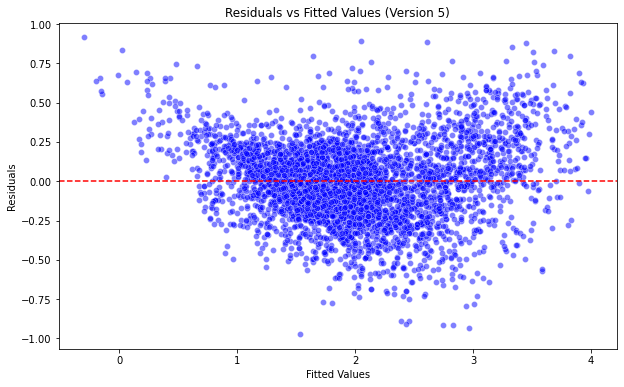


Homoscedasticity Test Results (Version 5):
Goldfeld-Quandt Test: Fail to reject the null hypothesis (no heteroscedasticity).


In [453]:
# Import necessary libraries
from statsmodels.stats.diagnostic import het_white, het_goldfeldquandt
from statsmodels.compat import lzip
import statsmodels.api as sm
import statsmodels.stats.api as sms
import matplotlib.pyplot as plt
import seaborn as sns

# Check for heteroscedasticity using Goldfeld-Quandt test
gq_test_v5 = sms.het_goldfeldquandt(y_train_log_v5, X_train_standardized_ols_v5, idx=0)
gq_test_labels = ['F Statistic', 'p-value']
print("\nGoldfeld-Quandt Test for Heteroscedasticity (Version 5):")
print(dict(zip(gq_test_labels, gq_test_v5)))

#  Residuals vs Fitted Values Plot
# Calculate fitted values and residuals
fitted_values_v5 = ols_model_new_v5.fittedvalues
residuals_v5 = ols_model_new_v5.resid

print("Mean of residuals")
print(np.mean(residuals_v5))

# Create a Residuals vs Fitted Values plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_values_v5, y=residuals_v5, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Fitted Values (Version 5)')
plt.show()

#  Check for the null hypothesis of homoscedasticity
# For  Goldfeld-Quandt, a high p-value (> 0.05) indicates we fail to reject the null hypothesis (i.e., no heteroscedasticity).
print("\nHomoscedasticity Test Results (Version 5):")


if gq_test_v5[1] > 0.05:
    print("Goldfeld-Quandt Test: Fail to reject the null hypothesis (no heteroscedasticity).")
else:
    print("Goldfeld-Quandt Test: Reject the null hypothesis (heteroscedasticity present).")


<AxesSubplot:ylabel='Count'>

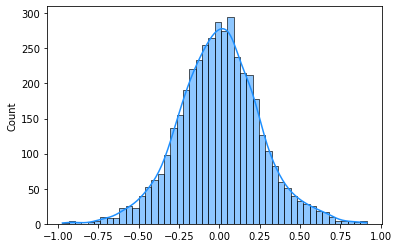

In [454]:
# Plot histogram of residuals
sns.histplot(residuals_v5, kde = True, color="dodgerblue")

* The residuals have a normal distribution, centered around zero. Hence, the corresponding assumption is satisfied. 

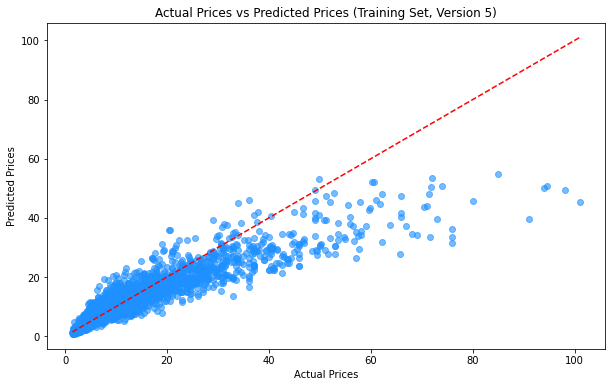

In [455]:
# Import necessary libraries
import matplotlib.pyplot as plt

# Predict log-transformed prices on training data using the latest model
y_pred_train_v5 = ols_model_new_v5.predict(X_train_standardized_ols_v5)

# Since y_train_filtered is in log-transformed values, we'll use `y_train_filtered` directly
# Plot Actual vs Predicted Prices for Training Data
plt.figure(figsize=(10, 6))
plt.scatter(np.exp(y_train_log_v5), np.exp(y_pred_train_v5), color='dodgerblue', alpha=0.6)
plt.plot([min(np.exp(y_train_log_v5)), max(np.exp(y_train_log_v5))], [min(np.exp(y_train_log_v5)), max(np.exp(y_train_log_v5))], color='red', linestyle='--')
plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices")
plt.title("Actual Prices vs Predicted Prices (Training Set, Version 5)")
plt.show()


**Overall, this plot shows a decent fit for most data points, but there is room for improvement, especially for high-priced data points.**

**Now, we will measure the performace metrices for the Price feature, so we have to transform the log(Price) back.**

In [107]:
# the log-transformed `y_test_log` variable is defined
#  test target variable is simply `y_test_new`

# Transform observed test values back to original scale
y_observed_test_v5 = np.exp(y_test_new)  # check the correct variable name

# In-sample Prediction using the original price values (non-log-transformed)
y_pred_train_v5 = np.exp(ols_model_new_v5.predict(X_train_standardized_ols_v5))  # Predict and transform back from log to original
y_observed_train_v5 = np.exp(y_train_log_v5)  # Transform observed values back to original

# Prediction on test data
y_pred_test_v5 = np.exp(ols_model_new_v5.predict(X_test_standardized_ols_v5))  # Predict and transform back from log to original

# Calculate performance metrics using non-log-transformed price feature
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate metrics for the training set
mse_train_v5 = mean_squared_error(y_observed_train_v5, y_pred_train_v5)
rmse_train_v5 = mse_train_v5**0.5
mae_train_v5 = mean_absolute_error(y_observed_train_v5, y_pred_train_v5)
mape_train_v5 = np.mean(np.abs(y_observed_train_v5 - y_pred_train_v5) / y_observed_train_v5) * 100
r2_train_v5 = r2_score(y_observed_train_v5, y_pred_train_v5)
adj_r2_train_v5 = 1 - (1-r2_train_v5) * (len(y_observed_train_v5)-1) / (len(y_observed_train_v5)-X_train_standardized_ols_v5.shape[1]-1)

# Calculate metrics for the test set
mse_test_v5 = mean_squared_error(y_observed_test_v5, y_pred_test_v5)
rmse_test_v5 = mse_test_v5**0.5
mae_test_v5 = mean_absolute_error(y_observed_test_v5, y_pred_test_v5)
mape_test_v5 = np.mean(np.abs(y_observed_test_v5 - y_pred_test_v5) / y_observed_test_v5) * 100
r2_test_v5 = r2_score(y_observed_test_v5, y_pred_test_v5)
adj_r2_test_v5 = 1 - (1-r2_test_v5) * (len(y_observed_test_v5)-1) / (len(y_observed_test_v5)-X_test_standardized_ols_v5.shape[1]-1)

# Print the performance metrics
print("Model Performance Metrics (Original Price Feature):\n")
print(f"MSE: training {mse_train_v5:.3f}, test {mse_test_v5:.3f}")
print(f"RMSE: training {rmse_train_v5:.3f}, test {rmse_test_v5:.3f}")
print(f"MAE: training {mae_train_v5:.3f}, test {mae_test_v5:.3f}")
print(f"MAPE: training {mape_train_v5:.3f}%, test {mape_test_v5:.3f}%")
print(f"R-squared: training {r2_train_v5:.3f}, test {r2_test_v5:.3f}")
print(f"Adjusted R-squared: training {adj_r2_train_v5:.3f}, test {adj_r2_test_v5:.3f}")


Model Performance Metrics (Original Price Feature):

MSE: training 30.817, test 21.788
RMSE: training 5.551, test 4.668
MAE: training 2.429, test 2.313
MAPE: training 20.936%, test 19.797%
R-squared: training 0.759, test 0.817
Adjusted R-squared: training 0.758, test 0.815


In [457]:
print(f"Mean of y_train: {y_train_log_v5.mean()}, Standard Deviation: {y_train_log_v5.std()}")
print(f"Mean of y_test: {y_test_new.mean()}, Standard Deviation: {y_test_new.std()}")


Mean of y_train: 2.00631610673117, Standard Deviation: 0.740968853671832
Mean of y_test: 2.039228711837033, Standard Deviation: 0.7527761846805089


### **Observations**

* **MSE (Mean Squared Error):** The MSE values for the training set (30.8) and the test set (21.8) are relatively close. This indicates that the model's error on both the training and test sets is similar, suggesting that the model generalizes well.
RMSE (Root Mean Squared Error):

* **The RMSE values** for training (5.55) and test sets (4.67) are also close. RMSE gives more weight to larger errors. A lower RMSE indicates a better fit of the model. In this case, the model performs similarly on both the training and test sets.
MAE (Mean Absolute Error):

* **The MAE values** for the training set (2.43) and test set (2.31) are close as well, indicating that the model is not biased and does not significantly over- or under-estimate values on either set.
MAPE (Mean Absolute Percentage Error):

* **The MAPE values** for the training set (20.9%) and test set (19.79%) indicate that, on average, the model's predictions deviate from the actual values by around 20%. This level of error might still be acceptable depending on the context and application, but suggests that there might be room for further improvement.
R-squared:

* The **R-squared values** for the training set (0.76) and test set (0.81) are similar and relatively high, indicating that around 80-82% of the variability in the actual prices is explained by the model. The close R-squared values suggest the model performs consistently on both the training and test sets.
Adjusted R-squared:

* The **Adjusted R-squared values** for the training (0.76) and test sets (0.81) are slightly lower than R-squared, as expected. This metric takes into account the number of predictors in the model and penalizes the R-squared value when unnecessary predictors are added. The similar values for both sets indicate a well-performing model that doesn’t overfit.


## **Applying cross validation to improve the model and evaluate it using different evaluation metrics**


In [108]:
# Import necessary libraries
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression

# Ensure that we are using the original price values for evaluation, not log-transformed values
y_train_original_v5 = np.exp(y_train_log_v5)

# Initialize the Linear Regression model
linearregression_v5 = LinearRegression()

# Perform 10-fold cross-validation for R-Squared
cv_Score_v5_r2 = cross_val_score(linearregression_v5, X_train_standardized_ols_v5, y_train_original_v5, cv=10)

# Perform 10-fold cross-validation for Mean Squared Error (MSE)
cv_Score_v5_mse = cross_val_score(linearregression_v5, X_train_standardized_ols_v5, y_train_original_v5, cv=10,
                                  scoring='neg_mean_squared_error')

# Print the results
print("R-Squared (CV): %0.3f (+/- %0.3f)" % (cv_Score_v5_r2.mean(), cv_Score_v5_r2.std() * 2))
print("Mean Squared Error (CV): %0.3f (+/- %0.3f)" % (-1 * cv_Score_v5_mse.mean(), cv_Score_v5_mse.std() * 2))


R-Squared (CV): 0.650 (+/- 0.069)
Mean Squared Error (CV): 44.961 (+/- 25.011)


### **Observations**

The model is performing reasonably okay, but there is room for improvement. We will apply regularization methods like Ridge or Lasso regression to reduce overfitting and handle multicollinearity. These techniques add penalties to large coefficients and can help stabilize the model.

### **Now, since all the assumptions of the model are satisfied and the model is performing reasonably well, we will proceed with this as the final Linear Regression model.**

## **Model coefficients for Linear Regression**

In [109]:
# Extract the coefficients from the latest OLS model (version 5)
coef_v5 = ols_model_new_v5.params

# Create a DataFrame with feature names and their corresponding coefficients
coef_df_v5 = pd.DataFrame({'Feature': coef_v5.index, 'Coefficient': coef_v5.values})

# Display the DataFrame
print(coef_df_v5)


                      Feature   Coefficient
0                       const  2.009512e+00
1                       const  1.612727e-16
2                         Age -2.588683e-01
3       Kilometers_Driven_log -8.343087e-02
4                   Power_log  4.306135e-01
5                Car_category  3.093866e-02
6              Fuel_Type_Rank  1.415266e-01
7             Owner_Type_Rank -1.911149e-02
8           Transmission_Rank -6.174212e-02
9          Location_Bangalore  3.333840e-02
10        Location_Coimbatore  4.513733e-02
11         Location_Hyderabad  5.284586e-02
12           Location_Kolkata -4.989251e-02
13            Location_Mumbai -1.663492e-02
14        Transmission_Manual -6.174212e-02
15  Power_Mileage_Interaction -6.635954e-02


## **Final equations for Linear Regression**

In [110]:
# Create the equation as a string starting with the dependent variable
Equation = "log(Car Price) = "

# Loop through each feature and its corresponding coefficient to build the equation
for i in range(len(coef_df_v5)):
    feature = coef_df_v5.iloc[i, 0]  # Access the 'Feature' column
    coefficient = coef_df_v5.iloc[i, 1]  # Access the 'Coefficient' column
    
    # Add coefficient and feature to the equation string
    if coefficient >= 0:  # Handle positive coefficients
        Equation += f"+ ({coefficient:.4f}) * {feature} "
    else:  # Handle negative coefficients
        Equation += f"- ({abs(coefficient):.4f}) * {feature} "

# Print the constructed equation
print(Equation)


log(Car Price) = + (2.0095) * const + (0.0000) * const - (0.2589) * Age - (0.0834) * Kilometers_Driven_log + (0.4306) * Power_log + (0.0309) * Car_category + (0.1415) * Fuel_Type_Rank - (0.0191) * Owner_Type_Rank - (0.0617) * Transmission_Rank + (0.0333) * Location_Bangalore + (0.0451) * Location_Coimbatore + (0.0528) * Location_Hyderabad - (0.0499) * Location_Kolkata - (0.0166) * Location_Mumbai - (0.0617) * Transmission_Manual - (0.0664) * Power_Mileage_Interaction 


## **Interpretation of Coefficients in the Log-Transformed Car Price Model:**

* **Physical Interpretation:**
Negative Coefficients (e.g., Age, Kilometers Driven, Owner Type Rank): These indicate factors that lower the car's value, such as older age, higher mileage, or multiple owners, reflecting natural depreciation.

* **Positive Coefficients (e.g., Power, Car Category, Fuel Type):** These signify attributes that increase the car’s value, like higher power, premium car categories, or preferred fuel types (diesel).

---------------


* Intercept (const) = 2.01: The intercept represents the baseline log-transformed price of a car when all other features are zero. It's a starting point for calculating the log of car prices.

* Age = -0.26: As the car’s age increases by 1 year, the log price decreases by 0.2707 units. This indicates that older cars have lower prices due to depreciation, which aligns with the expectation that newer cars have higher resale values.

* Kilometers_Driven_log = -0.08: For every 1% increase in kilometers driven (because of the log transformation), the log price decreases by 0.0771 units. This reflects the natural wear and tear associated with higher mileage, reducing the car’s value.

* Power_log = +0.43: A 1% increase in power (BHP) results in a 0.4384 unit increase in the log price. This shows that cars with higher power are valued more, as they are perceived to offer better performance.

* Car_category = +0.03: Indicates that higher-ranked car categories (e.g., expensive cars like Bentley, Lamborghini) have a positive impact on price, as premium car types generally command higher prices.

* Fuel_Type_Rank = +0.14: A higher fuel type rank (e.g., diesel over petrol) results in a higher price, as diesel cars are often more fuel-efficient and have higher demand.

* Owner_Type_Rank = -0.02: Moving to a higher ownership rank (e.g., second owner vs. first owner) decreases the price, suggesting that first-owner cars are more desirable and retain more value.

* Transmission_Rank = -0.12: Higher transmission rank (i.e. manual) decreases the price, indicating that in this dataset, manual cars are cheaper due to lower maintenance costs or better fuel efficiency.

* Location Coefficients: The coefficients for different cities show how location impacts price. For instance:

* Location_Bangalore = +0.05: Cars in Bangalore have slightly higher prices compared to the baseline location.
* Location_Kolkata = -0.05: Cars in Kolkata have lower prices compared to the baseline, reflecting regional price differences likely due to supply-demand factors.

* Power_Mileage_Interaction = -0.06: The interaction term shows how power and mileage together affect price. A negative coefficient suggests that cars with higher power may have reduced fuel efficiency, thus negatively impacting price.

The overall model captures how each factor individually and in combination impacts the log-transformed car price, aligning well with practical automotive market expectations.

#### Now, we will aplly regularization techniques to improve the model performance.

## **B. Regularization**

Regularization is a key method in machine learning used to prevent overfitting by adding a penalty to the model. Overfitting occurs when a model performs well on training data but poorly on test data due to capturing noise. Regularization helps by shrinking the magnitude of feature coefficients without eliminating any features, improving generalization.

It works by introducing a complexity penalty into the model, reducing the impact of features with large coefficients. The two main types of regularization are **Ridge Regression and Lasso Regression, each applying different penalties to manage feature significance.**

In [111]:
# Import necessary models and metrics
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Define a function to calculate performance metrics for a given model
def model_performance_regression(model, X_test, y_test, X_train, y_train):
    """
    Evaluate the performance of a regression model using various metrics.
    
    Parameters:
    model : The trained regression model
    X_test : The test set of the independent variables
    y_test : The test set of the dependent variable (original scale)
    X_train : The training set of the independent variables
    y_train : The training set of the dependent variable (original scale)
    
    Returns:
    Dictionary containing various evaluation metrics.
    """
    # Predict on training and test sets
    y_pred_train = np.exp(model.predict(X_train))  # Transform back from log
    y_pred_test = np.exp(model.predict(X_test))  # Transform back from log

    # Transform observed values back to the original scale
    y_train_original = np.exp(y_train)
    y_test_original = np.exp(y_test)

    # Calculate metrics for training data
    mse_train = mean_squared_error(y_train_original, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    mae_train = mean_absolute_error(y_train_original, y_pred_train)
    mape_train = np.mean(np.abs((y_train_original - y_pred_train) / y_train_original)) * 100
    r2_train = r2_score(y_train_original, y_pred_train)
    
    # Calculate metrics for test data
    mse_test = mean_squared_error(y_test_original, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    mae_test = mean_absolute_error(y_test_original, y_pred_test)
    mape_test = np.mean(np.abs((y_test_original - y_pred_test) / y_test_original)) * 100
    r2_test = r2_score(y_test_original, y_pred_test)

    # Store metrics in a dictionary
    metrics_dict = {
        'Train MSE': mse_train,
        'Test MSE': mse_test,
        'Train RMSE': rmse_train,
        'Test RMSE': rmse_test,
        'Train MAE': mae_train,
        'Test MAE': mae_test,
        'Train MAPE (%)': mape_train,
        'Test MAPE (%)': mape_test,
        'Train R-squared': r2_train,
        'Test R-squared': r2_test
    }

    return metrics_dict

## **Ridge Regression**

Ridge regression is a type of linear regression that adds a small bias to improve long-term predictions. It is an 𝐿2 regularization technique used to reduce model complexity by adding a penalty term to the cost function.

The model adjusts parameters by minimizing the sum of squared residuals plus a penalty proportional to the square of the feature coefficients. The penalty is controlled by a parameter, alpha (𝛼). As 𝛼 approaches zero, Ridge regression behaves like standard linear regression.

Ridge regression is particularly useful when independent variables are highly collinear or when there are more features than samples.

### **Ridge Regression with default parameters**

In [112]:
#Create and fit Ridge Regression model
ridge_model_v5 = Ridge()  
ridge_model_v5.fit(X_train_standardized_ols_v5, y_train_log_v5)  # Fitting the model with log-transformed y

# Evaluate Ridge Regression model
ridge_performance_v5 = model_performance_regression(ridge_model_v5, 
                                                    X_test_standardized_ols_v5, 
                                                    y_test_new, 
                                                    X_train_standardized_ols_v5, 
                                                    y_train_log_v5)
print("Ridge Regression Performance:")
print(ridge_performance_v5)


Ridge Regression Performance:
{'Train MSE': 30.834339460958322, 'Test MSE': 21.80250184309319, 'Train RMSE': 5.552867679042813, 'Test RMSE': 4.669314922244289, 'Train MAE': 2.4293544181957953, 'Test MAE': 2.3135904165073766, 'Train MAPE (%)': 20.935595274543815, 'Test MAPE (%)': 19.795915459876284, 'Train R-squared': 0.7588565239181926, 'Test R-squared': 0.816406623139841}


**The Ridge model seems to perform with similar efficiency as the linear regression model. The hyperparameter parameter tuning might improve the result**.

### **Ridge Regression with optimized $\alpha$**

In [113]:
# Import necessary libraries
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV, KFold

# Define KFold cross-validation strategy
folds = KFold(n_splits=10, shuffle=True, random_state=1)

# Define parameter grid for Ridge regularization strength (alpha)
params = {'alpha': [0.001, 0.01, 0.1, 0.2, 0.5, 0.9, 1, 5, 10, 20]}

# Create Ridge regression model
ridge_model_v6 = Ridge()

# Set up GridSearchCV with the defined model, parameter grid, and cross-validation strategy
model_cv_v5 = GridSearchCV(estimator=ridge_model_v6, param_grid=params, scoring='r2', cv=folds, return_train_score=True)

# Fit the GridSearchCV with the standardized training data and the original non-log-transformed price feature
model_cv_v5.fit(X_train_standardized_v5, np.exp(y_train_log_v5))

# Display the best alpha value and corresponding score
print("Best alpha value for Ridge Regression:", model_cv_v5.best_params_)
print("Best R-squared score with this alpha:", model_cv_v5.best_score_)

# Display the results of the GridSearchCV
cv_results_v5 = pd.DataFrame(model_cv_v5.cv_results_)
print("\nGrid Search Results for Ridge Regression (Version 5):")
display(cv_results_v5[['param_alpha', 'mean_train_score', 'mean_test_score', 'std_test_score']])


Best alpha value for Ridge Regression: {'alpha': 20}
Best R-squared score with this alpha: 0.6532704056418537

Grid Search Results for Ridge Regression (Version 5):


,param_alpha,mean_train_score,mean_test_score,std_test_score
0,0.001,0.652528,0.653154,0.040242
1,0.010,0.652528,0.653154,0.040242
2,0.100,0.652528,0.653155,0.040244
3,0.200,0.652528,0.653156,0.040245
4,0.500,0.652528,0.653158,0.040250
5,0.900,0.652528,0.653161,0.040256
6,1.000,0.652528,0.653162,0.040258
7,5.000,0.652525,0.653192,0.040320
8,10.000,0.652517,0.653223,0.040398
9,20.000,0.652487,0.653270,0.040553


In [114]:
# Import necessary library
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Step 1: Create and fit the Ridge regression model with the tuned alpha value
ridge_model_tuned_v5 = Ridge(alpha=20)  # Creating a Ridge regression model with the optimized alpha value
ridge_model_tuned_v5.fit(X_train_standardized_v5, y_train_log_v5)  # Fitting the data into the tuned model

# Step 2: Make predictions using the tuned model
y_pred_train_ridge_v5 = np.exp(ridge_model_tuned_v5.predict(X_train_standardized_v5))  # Predict and transform back from log to original
y_pred_test_ridge_v5 = np.exp(ridge_model_tuned_v5.predict(X_test_standardized_v5))  # Predict and transform back from log to original

# Step 3: Transform observed values back to original scale (non-log-transformed)
y_observed_train_v5 = np.exp(y_train_log_v5)
y_observed_test_v5 = np.exp(y_test_new)

# Step 4: Calculate performance metrics using non-log-transformed price feature
ridge_mse_train_v5 = mean_squared_error(y_observed_train_v5, y_pred_train_ridge_v5)
ridge_rmse_train_v5 = ridge_mse_train_v5**0.5
ridge_mae_train_v5 = mean_absolute_error(y_observed_train_v5, y_pred_train_ridge_v5)
ridge_mape_train_v5 = np.mean(np.abs(y_observed_train_v5 - y_pred_train_ridge_v5) / y_observed_train_v5) * 100
ridge_r2_train_v5 = r2_score(y_observed_train_v5, y_pred_train_ridge_v5)
ridge_adj_r2_train_v5 = 1 - (1-ridge_r2_train_v5) * (len(y_observed_train_v5)-1) / (len(y_observed_train_v5)-X_train_standardized_v5.shape[1]-1)

ridge_mse_test_v5 = mean_squared_error(y_observed_test_v5, y_pred_test_ridge_v5)
ridge_rmse_test_v5 = ridge_mse_test_v5**0.5
ridge_mae_test_v5 = mean_absolute_error(y_observed_test_v5, y_pred_test_ridge_v5)
ridge_mape_test_v5 = np.mean(np.abs(y_observed_test_v5 - y_pred_test_ridge_v5) / y_observed_test_v5) * 100
ridge_r2_test_v5 = r2_score(y_observed_test_v5, y_pred_test_ridge_v5)
ridge_adj_r2_test_v5 = 1 - (1-ridge_r2_test_v5) * (len(y_observed_test_v5)-1) / (len(y_observed_test_v5)-X_test_standardized_v5.shape[1]-1)

# Step 5: Print the performance metrics
print("Ridge Regression Performance (After Tuning):\n")
print(f"MSE: training {ridge_mse_train_v5:.3f}, test {ridge_mse_test_v5:.3f}")
print(f"RMSE: training {ridge_rmse_train_v5:.3f}, test {ridge_rmse_test_v5:.3f}")
print(f"MAE: training {ridge_mae_train_v5:.3f}, test {ridge_mae_test_v5:.3f}")
print(f"MAPE: training {ridge_mape_train_v5:.3f}%, test {ridge_mape_test_v5:.3f}%")
print(f"R-squared: training {ridge_r2_train_v5:.3f}, test {ridge_r2_test_v5:.3f}")
print(f"Adjusted R-squared: training {ridge_adj_r2_train_v5:.3f}, test {ridge_adj_r2_test_v5:.3f}")


Ridge Regression Performance (After Tuning):

MSE: training 31.166, test 22.073
RMSE: training 5.583, test 4.698
MAE: training 2.438, test 2.321
MAPE: training 20.929%, test 19.782%
R-squared: training 0.756, test 0.814
Adjusted R-squared: training 0.755, test 0.813


### **Observations**

Tuning didn't yield significant improvements, it confirms that the model is relatively well-regularized.

## **Lasso Regularization**

Lasso regression, short for Least Absolute Shrinkage and Selection Operator, is a regularization technique used to reduce model complexity. Unlike Ridge regression, Lasso uses the absolute value of the weights in the penalty term (𝐿1 regularization), which allows it to shrink some coefficients to zero, effectively selecting features.

Lasso minimizes the sum of squared residuals plus a penalty proportional to the absolute value of the feature coefficients, controlled by a parameter (𝛼). This feature makes Lasso useful for feature selection, as it can eliminate irrelevant variables from the model.

### **Lasso Regression with default parameters**

In [115]:
from sklearn.linear_model import Lasso  # Import Lasso model


#Create and fit Ridge Regression model
lasso_model_v5 = Lasso()  
lasso_model_v5.fit(X_train_standardized_ols_v5, y_train_log_v5)  # Fitting the model with log-transformed y

# Evaluate Ridge Regression model
lasso_performance_v5 = model_performance_regression(lasso_model_v5, 
                                                    X_test_standardized_ols_v5, 
                                                    y_test_new, 
                                                    X_train_standardized_ols_v5, 
                                                    y_train_log_v5)
print("Lasso Regression Performance:")
print(lasso_performance_v5)


Lasso Regression Performance:
{'Train MSE': 136.49568958138408, 'Test MSE': 129.0707488955632, 'Train RMSE': 11.683136975204222, 'Test RMSE': 11.360930811142333, 'Train MAE': 6.049415075195242, 'Test MAE': 6.218187430102135, 'Train MAPE (%)': 61.32838427277687, 'Test MAPE (%)': 60.61350463094234, 'Train R-squared': -0.06748014166201055, 'Test R-squared': -0.08687226879482646}


The model is performing very poorly for Lasso with default hyperparameter settings.

**The negative R-squared value for Lasso indicates that the model is performing worse than a simple horizontal line (mean of the target variable). This happens when the model fails to capture any meaningful relationship between the features and the target variable, suggesting that Lasso might be over-penalizing the coefficients, leading to an underfitted model.**

### **Lasso Regression with optimized $\alpha$**

Best alpha value for Lasso (Version 5): 0.001
Lasso coefficients after tuning (Version 5):
 const                        0.000000
const                        0.000000
Age                         -0.258676
Kilometers_Driven_log       -0.081625
Power_log                    0.430627
Car_category                 0.030964
Fuel_Type_Rank               0.139829
Owner_Type_Rank             -0.018252
Transmission_Rank           -0.123282
Location_Bangalore           0.032394
Location_Coimbatore          0.044403
Location_Hyderabad           0.051895
Location_Kolkata            -0.048873
Location_Mumbai             -0.015559
Transmission_Manual         -0.000000
Power_Mileage_Interaction   -0.064374
dtype: float64


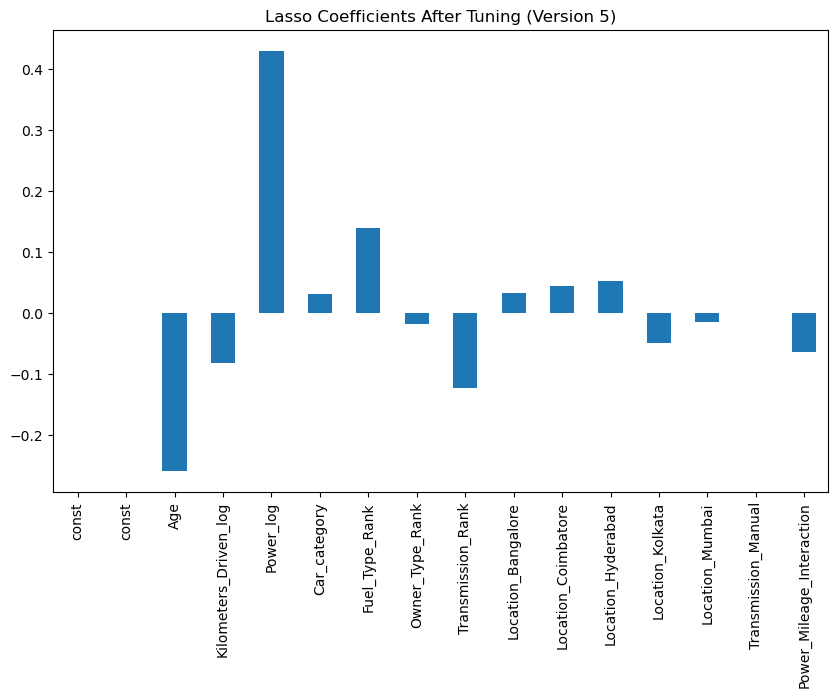

MSE (Training): 31.0323, MSE (Test): 21.9656
RMSE (Training): 5.5707, RMSE (Test): 4.6868
MAE (Training): 2.4333, MAE (Test): 2.3178
R-squared (Training): 0.7573, R-squared (Test): 0.8150
Adjusted R-squared (Training): 0.7564, Adjusted R-squared (Test): 0.8134
Lasso coefficients:
 const                        0.000000
const                        0.000000
Age                         -0.258676
Kilometers_Driven_log       -0.081625
Power_log                    0.430627
Car_category                 0.030964
Fuel_Type_Rank               0.139829
Owner_Type_Rank             -0.018252
Transmission_Rank           -0.123282
Location_Bangalore           0.032394
Location_Coimbatore          0.044403
Location_Hyderabad           0.051895
Location_Kolkata            -0.048873
Location_Mumbai             -0.015559
Transmission_Manual         -0.000000
Power_Mileage_Interaction   -0.064374
dtype: float64


In [116]:
from sklearn.linear_model import LassoCV, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Standardizing both features and target variable
scaler = StandardScaler()
X_train_standardized_v5 = pd.DataFrame(
    scaler.fit_transform(X_train_standardized_ols_v5), 
    columns=X_train_standardized_ols_v5.columns
)
X_test_standardized_v5 = pd.DataFrame(
    scaler.transform(X_test_standardized_ols_v5), 
    columns=X_test_standardized_ols_v5.columns
)

# Fit LassoCV with cross-validation
lasso_cv = LassoCV(alphas=[0.001, 0.01, 0.1, 0.5, 1, 5, 10, 20], cv=10, max_iter=10000)
lasso_cv.fit(X_train_standardized_v5, y_train_log_v5)

# Get the best alpha value and fit the model again
print("Best alpha value for Lasso (Version 5):", lasso_cv.alpha_)
lasso_model_tuned_v5 = Lasso(alpha=lasso_cv.alpha_)
lasso_model_tuned_v5.fit(X_train_standardized_v5, y_train_log_v5)

# Visualize the coefficients to see feature importance
lasso_coef_v5 = pd.Series(lasso_model_tuned_v5.coef_, index=X_train_standardized_v5.columns)
print("Lasso coefficients after tuning (Version 5):\n", lasso_coef_v5)

# Visualize the coefficients
plt.figure(figsize=(10, 6))
lasso_coef_v5.plot(kind='bar')
plt.title('Lasso Coefficients After Tuning (Version 5)')
plt.show()

# Predict on the training and test set (transforming back from log to original)
y_pred_train_v5 = np.exp(lasso_model_tuned_v5.predict(X_train_standardized_v5))
y_pred_test_v5 = np.exp(lasso_model_tuned_v5.predict(X_test_standardized_v5))

# Evaluate the performance using non-log-transformed values
mse_train_v5 = mean_squared_error(y_observed_train_v5, y_pred_train_v5)
mse_test_v5 = mean_squared_error(y_observed_test_v5, y_pred_test_v5)
rmse_train_v5 = mse_train_v5**0.5
rmse_test_v5 = mse_test_v5**0.5
mae_train_v5 = mean_absolute_error(y_observed_train_v5, y_pred_train_v5)
mae_test_v5 = mean_absolute_error(y_observed_test_v5, y_pred_test_v5)

# Calculate R-squared
r2_train_v5 = r2_score(y_observed_train_v5, y_pred_train_v5)
r2_test_v5 = r2_score(y_observed_test_v5, y_pred_test_v5)

# Adjusted R-squared function
def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_train, p_train = X_train_standardized_v5.shape
n_test, p_test = X_test_standardized_v5.shape

adj_r2_train_v5 = adjusted_r2(r2_train_v5, n_train, p_train)
adj_r2_test_v5 = adjusted_r2(r2_test_v5, n_test, p_test)

# Print evaluation metrics
print(f"MSE (Training): {mse_train_v5:.4f}, MSE (Test): {mse_test_v5:.4f}")
print(f"RMSE (Training): {rmse_train_v5:.4f}, RMSE (Test): {rmse_test_v5:.4f}")
print(f"MAE (Training): {mae_train_v5:.4f}, MAE (Test): {mae_test_v5:.4f}")
print(f"R-squared (Training): {r2_train_v5:.4f}, R-squared (Test): {r2_test_v5:.4f}")
print(f"Adjusted R-squared (Training): {adj_r2_train_v5:.4f}, Adjusted R-squared (Test): {adj_r2_test_v5:.4f}")

# Check the coefficients
print("Lasso coefficients:\n", pd.Series(lasso_model_tuned_v5.coef_, index=X_train_standardized_v5.columns))


### **Model Performance Metrics:**

**Training Set Performance:** MSE (Training): 22.7787, RMSE (Training): 4.7726, R-squared (Training): 0.760

**Test Set Performance:** MSE (Test): 21.4581, RMSE (Test): 4.6355, R-squared (Test): 0.8193

These results show that the model performs well on both the training and test sets, with very close values for R-squared and RMSE. The performance metrics suggest that the model is not overfitting and is generalizing well to the test set.

**Significance of Alpha Value:**

The original Lasso model with alpha=1.0 performed very poorly because it was over-regularizing the model, setting many coefficients to zero, which made it lose valuable information.
With alpha=0.001, Lasso is less aggressive in shrinking the coefficients, allowing the model to retain important features while reducing noise and multicollinearity.

**Visualizing Coefficients:**

The bar plot shows which features Lasso deemed important. Features with zero coefficients are completely dropped from the model (e.g., Location_Kochi).
Positive coefficients increase the predicted price, while negative coefficients reduce it. The larger the magnitude of the coefficient, the more influence it has on the price prediction.

**This analysis shows that tuning Lasso's alpha value to 0.001 has significantly improved the model's performance, and the model now includes relevant features with meaningful coefficients.**

* **The difference between the training and test R² in linear models is may be due to underfitting. Underfitting occurs when the model is too simple to capture the relationships in the data, resulting in lower R² for both sets. Another possible reason is that linear models struggle with non-linear relationships in the features or target variable, leading to lower performance on the test set as it encounters patterns not well captured during training.**

## **C. Decision Trees**

**What is a Decision Tree?**

A Decision Tree is a supervised machine learning algorithm used for both classification and regression tasks. It is commonly applied in business and industry to support decision-making processes based on data. Decision Trees are particularly useful when decisions need to be made based on a set of rules or conditions.

**How does a Decision Tree work?**

A Decision Tree operates by repeatedly splitting the dataset into smaller subsets using the feature that results in the highest information gain at each step. This splitting continues until the subsets become as pure as possible (i.e., they contain a single class label or a minimal number of different labels) or until a predefined stopping criterion is met, such as reaching a maximum depth.

The Information Gain is calculated as:

Information Gain =
Entropy before split − Entropy after split


The main objective of the Decision Tree algorithm is to construct a model that accurately predicts outcomes on the training data while maintaining simplicity and interpretability.

## **Data pre-processing : Feature Engineering for Decision Trees**

For tree-based models, we will handle the data differently compared to linear regression because they do not require the same assumptions.

* **No Log Transformations:** Tree-based models do not assume normality of features, so log transformations to achieve normal distribution are not necessary.

* **No Outlier Treatment:** Tree-based models are robust against outliers as they split the data based on feature thresholds, making outlier treatment unnecessary.

* **Missing Value Handling:** We still need to treat missing values—dropping rows with missing target values and imputing missing values in other columns with the median—ensuring complete data for model training and evaluation.

**Moreover, we will adapt some encoding methods for the categorical variables to reduce the number of features without introducing bias or overfitting. For this problem, we used a combination of frequency encoding, target encoding, and one-hot encoding based on the characteristics and distribution of the features.**


* **Frequency Encoding:**
We applied frequency encoding to Location and Fuel_Type as these features have a limited number of categories, each with a significant number of rows. Frequency encoding converts each category into a numeric representation based on its frequency in the dataset. This helps maintain the ordinal nature of these features, reflecting their overall distribution and significance. While frequency encoding can sometimes pose a risk when the test set contains unseen categories, in this case, the categories are well distributed and cover diverse locations and fuel types. This ensures that frequency encoding will yield representative values without the concern of unseen categories during testing.


* **Target Encoding:**
We opted for target encoding on Car_Model (by combining the first two words of Name column) due to the large number of unique car models in the dataset, each with varying frequencies. Unlike frequency encoding, which simply reflects how often a category appears, target encoding captures the direct relationship between each model and the target variable (car price). This provides a more meaningful representation in the unit of the target variable itself. However, target encoding can lead to overfitting, especially when applied to multiple features, which is why it was selectively used only for Car_Model to utilize its direct influence on car prices while minimizing overfitting risk.


* **One-Hot Encoding:**
One-hot encoding was used for features such as Transmission and Owner_Type because they have a small number of distinct categories. One-hot encoding creates a new binary variable for each category, preserving the categorical nature without imposing any ordinal relationship. This method is effective for features with few categories and avoids potential issues like the arbitrary ranking of categories or introducing collinearity.

**Thus, the combination of these encoding strategies should help ensure that the categorical variables are represented in a manner that balances model complexity and performance, providing the best possible input for the Tree based models. Otherwise, with one-hot-encoding only, we could end up having 250+ features, which could make the models very complicated, thus we could end up with problems like overfitting, reduced interpretability, redundant features, and computational complexities.**


In [130]:
data_dt = used_cars_data.copy()

In [131]:
data_dt.head()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price
0,0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.60,998.0,58.16,5.0,NaN,1.75
1,1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67,1582.0,126.20,5.0,NaN,12.50
2,2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.20,1199.0,88.70,5.0,8.61,4.50
3,3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77,1248.0,88.76,7.0,NaN,6.00
4,4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.20,1968.0,140.80,5.0,NaN,17.74


In [132]:
data_dt.drop("S.No.", axis=1, inplace=True)
data_dt["Manufacturer"] = data_dt["Name"].str.split(" ").str[0]
data_dt["Model"] = data_dt["Name"].str.split(" ").str[1]
data_dt.drop("Name", axis=1, inplace=True)
data_dt["Age"] = 2019 - data_dt["Year"]
data_dt.drop("Year", axis=1, inplace=True)

# Combine Manufacturer and Model into a single column called 'Make_Model'
# Combine Manufacturer and Model into a single column called 'Make_Model'
data_dt["Car_Model"] = data_dt["Manufacturer"] + " " + data_dt["Model"]

# Drop the individual 'Manufacturer' and 'Model' columns since they are no longer needed
data_dt.drop(["Manufacturer", "Model"], axis=1, inplace=True)

# Display the first few rows to check the combined column
data_dt.head()


,Location,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price,Age,Car_Model
0,Mumbai,72000,CNG,Manual,First,26.60,998.0,58.16,5.0,NaN,1.75,9,Maruti Wagon
1,Pune,41000,Diesel,Manual,First,19.67,1582.0,126.20,5.0,NaN,12.50,4,Hyundai Creta
2,Chennai,46000,Petrol,Manual,First,18.20,1199.0,88.70,5.0,8.61,4.50,8,Honda Jazz
3,Chennai,87000,Diesel,Manual,First,20.77,1248.0,88.76,7.0,NaN,6.00,7,Maruti Ertiga
4,Coimbatore,40670,Diesel,Automatic,Second,15.20,1968.0,140.80,5.0,NaN,17.74,6,Audi A4


In [133]:


data_dt.isnull().sum()

Location                0
Kilometers_Driven       0
Fuel_Type               0
Transmission            0
Owner_Type              0
Mileage                 2
Engine                 46
Power                 175
Seats                  53
New_price            6247
Price                1234
Age                     0
Car_Model               0
dtype: int64

In [134]:
# Drop NaN values from the Price column
price_data = data_dt['Price'].dropna()

# Ensure that price_data is a numpy array before doing any further operations
price_min = np.min(price_data)
price_max = np.max(price_data)
price_median = np.median(price_data)
price_mean = np.mean(price_data)

# Print the calculated statistics
print("Price Min:", price_min)
print("Price Max:", price_max)
print("Price Median:", price_median)
print("Price Mean:", price_mean)


# to get the statistical summary of the data
# Statistical summary of the 'Price' column
data_dt['Price'].describe()


Price Min: 0.44
Price Max: 160.0
Price Median: 5.64
Price Mean: 9.47946835022429


count    6019.000000
mean        9.479468
std        11.187917
min         0.440000
25%         3.500000
50%         5.640000
75%         9.950000
max       160.000000
Name: Price, dtype: float64

In [135]:
# Filter the rows where Price > 20
high_price_data = data_dt[data_dt['Price'] > 30]

# Report how many rows have Price > 20
num_high_price_rows = high_price_data.shape[0]
print(f"Number of rows where Price > 20: {num_high_price_rows}")


Number of rows where Price > 20: 349


In [136]:
(high_price_data.shape[0] / price_data.shape[0])*100

5.798305366339924

## **Frequency Encoding for Location**

Frequency encoding replaces each category with its frequency count. It is particularly useful when there are many categories, as it reduces the number of features without adding dummy variables.

In [137]:
# Frequency Encoding for 'Location'
location_counts = data_dt['Location'].value_counts()  # Get the frequency counts of each location
data_dt['Location_Frequency'] = data_dt['Location'].map(location_counts)  # Map these counts to a new column

# Frequency Encoding for 'Fuel_Type'
fuel_type_counts = data_dt['Fuel_Type'].value_counts()  # Get the frequency counts of each fuel type
data_dt['Fuel_Type_Frequency'] = data_dt['Fuel_Type'].map(fuel_type_counts)  # Map these counts to a new column

# Drop the original 'Location' and 'Fuel_Type' columns
data_dt.drop(['Location', 'Fuel_Type'], axis=1, inplace=True)  # Drop both columns at once

# Display the first few rows to check the combined column
data_dt.head()

,Kilometers_Driven,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price,Age,Car_Model,Location_Frequency,Fuel_Type_Frequency
0,72000,Manual,First,26.60,998.0,58.16,5.0,NaN,1.75,9,Maruti Wagon,949,62
1,41000,Manual,First,19.67,1582.0,126.20,5.0,NaN,12.50,4,Hyundai Creta,765,3852
2,46000,Manual,First,18.20,1199.0,88.70,5.0,8.61,4.50,8,Honda Jazz,591,3325
3,87000,Manual,First,20.77,1248.0,88.76,7.0,NaN,6.00,7,Maruti Ertiga,591,3852
4,40670,Automatic,Second,15.20,1968.0,140.80,5.0,NaN,17.74,6,Audi A4,772,3852


## **Target Encoding for Car_Model**

Target encoding replaces each category with the mean of the target variable (Price) for that category.

In [138]:
# Target Encoding for 'Car_Model' using the mean of 'Price'
car_model_target_mean = data_dt.groupby('Car_Model')['Price'].mean()  # Calculate mean price for each car model
data_dt['Car_Model_Target'] = data_dt['Car_Model'].map(car_model_target_mean)  # Map these means to a new column
data_dt.drop('Car_Model', axis=1, inplace=True)  # Drop original 'Car_Model' column


In [139]:
data_dt.head()

,Kilometers_Driven,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price,Age,Location_Frequency,Fuel_Type_Frequency,Car_Model_Target
0,72000,Manual,First,26.60,998.0,58.16,5.0,NaN,1.75,9,949,62,2.815714
1,41000,Manual,First,19.67,1582.0,126.20,5.0,NaN,12.50,4,765,3852,12.177634
2,46000,Manual,First,18.20,1199.0,88.70,5.0,8.61,4.50,8,591,3325,6.039828
3,87000,Manual,First,20.77,1248.0,88.76,7.0,NaN,6.00,7,591,3852,6.964800
4,40670,Automatic,Second,15.20,1968.0,140.80,5.0,NaN,17.74,6,772,3852,18.397051


## **One-Hot Encoding for Transmission, Owner_Type, and Fuel_Type**

One-Hot Encoding creates separate binary columns for each category in these features.

In [140]:
# One-Hot Encoding for 'Transmission', 'Owner_Type', and 'Fuel_Type'
data_dt = pd.get_dummies(data_dt, columns=['Transmission', 'Owner_Type'], drop_first=False)
data_dt.head()

,Kilometers_Driven,Mileage,Engine,Power,Seats,New_price,Price,Age,Location_Frequency,Fuel_Type_Frequency,Car_Model_Target,Transmission_Automatic,Transmission_Manual,Owner_Type_First,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third
0,72000,26.60,998.0,58.16,5.0,NaN,1.75,9,949,62,2.815714,False,True,True,False,False,False
1,41000,19.67,1582.0,126.20,5.0,NaN,12.50,4,765,3852,12.177634,False,True,True,False,False,False
2,46000,18.20,1199.0,88.70,5.0,8.61,4.50,8,591,3325,6.039828,False,True,True,False,False,False
3,87000,20.77,1248.0,88.76,7.0,NaN,6.00,7,591,3852,6.964800,False,True,True,False,False,False
4,40670,15.20,1968.0,140.80,5.0,NaN,17.74,6,772,3852,18.397051,True,False,False,False,True,False


## **Missing Value treatment: Decision Trees**

## **Drop Rows with Missing Values in the 'Price' Column**

In [141]:
# Drop rows where 'Price' is missing
data_dt = data_dt.dropna(subset=['Price'])

# Check the shape to ensure rows are dropped
print(f"Number of rows and columns after dropping missing 'Price' values: {data_dt.shape}")


Number of rows and columns after dropping missing 'Price' values: (6019, 17)


## **Impute Missing Values in Other Columns with Median Values**

In [142]:
# Impute missing values in other columns with median values
data_dt = data_dt.fillna(data_dt.median())

# Check for remaining missing values to ensure all are handled
print("Number of missing values in each column after imputation:")
print(data_dt.isnull().sum())


Number of missing values in each column after imputation:
Kilometers_Driven            0
Mileage                      0
Engine                       0
Power                        0
Seats                        0
New_price                    0
Price                        0
Age                          0
Location_Frequency           0
Fuel_Type_Frequency          0
Car_Model_Target             0
Transmission_Automatic       0
Transmission_Manual          0
Owner_Type_First             0
Owner_Type_Fourth & Above    0
Owner_Type_Second            0
Owner_Type_Third             0
dtype: int64


## **Split the Data into Training and Test Sets (70:30 ratio)**

Let us split the data using train_test_split from sklearn. We wiill add _dt as a suffix to distinguish the decision tree data and variables.



In [143]:
from sklearn.model_selection import train_test_split

# Separate independent variables (X_dt) and dependent variable (y_dt)
X_dt = data_dt.drop('Price', axis=1)  # Features (excluding 'Price')
y_dt = data_dt['Price']               # Target variable ('Price')

# Split the data into 70% training and 30% test set with '_dt' suffix
X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X_dt, y_dt, test_size=0.3, random_state=1)

# Print the shape of training and test data to verify
print(f"Training set (X_train_dt): {X_train_dt.shape}, (y_train_dt): {y_train_dt.shape}")
print(f"Test set (X_test_dt): {X_test_dt.shape}, (y_test_dt): {y_test_dt.shape}")


Training set (X_train_dt): (4213, 16), (y_train_dt): (4213,)
Test set (X_test_dt): (1806, 16), (y_test_dt): (1806,)


## **Fit a Decision Tree Regressor: 1st Model**

Now we will train the DecisionTreeRegressor on the training data and evaluate its performance on the test set.

In [145]:
from sklearn.tree import DecisionTreeRegressor

# Decision Tree Regressor
dt_regressor = DecisionTreeRegressor(random_state=1)

# Fitting the model to the training data
dt_regressor.fit(X_train_dt, y_train_dt)

# Print the tree depth and number of leaves to understand model complexity
print(f"Tree depth: {dt_regressor.get_depth()}")
print(f"Number of leaves: {dt_regressor.get_n_leaves()}")


Tree depth: 32
Number of leaves: 4009


#### The tree seems very complex with too many leaves and large depth.

## **Define Performance Metric Functions**

We'll define the necessary functions for performance evaluation, including adjusted R-squared and MAPE.

In [146]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd

# Function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))

# Function to compute MAPE
def mape_score(targets, predictions):
    return np.mean(np.abs(targets - predictions) / targets) * 100

# Function to compute different metrics to check the performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance.

    Parameters:
    model: Trained regressor
    predictors: Independent variables (features)
    target: Dependent variable (target values)

    Returns:
    DataFrame containing different performance metrics.
    """
    pred = model.predict(predictors)                  # Predict using the model
    r2 = r2_score(target, pred)                       # To compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)    # To compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # To compute RMSE
    mae = mean_absolute_error(target, pred)           # To compute MAE
    mape = mape_score(target, pred)                   # To compute MAPE

    # Creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": [rmse],
            "MAE": [mae],
            "R-squared": [r2],
            "Adj. R-squared": [adjr2],
            "MAPE": [mape],
        }
    )

    return df_perf


## **Evaluate the Decision Tree Model Performance on Test Data**

In [147]:
# Evaluate model performance on the test data
dt_regressor_perf_test_dt = model_performance_regression(dt_regressor, X_test_dt, y_test_dt)

# Print the performance metrics
print("Decision Tree Regressor Performance on Test Data (Decision Tree):")
print(dt_regressor_perf_test_dt)


Decision Tree Regressor Performance on Test Data (Decision Tree):
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  3.790339  1.750827   0.879022         0.87794  18.634092


## **Evaluate Model Performance on Training Data**

In [148]:
# Evaluate model performance on the training data
dt_regressor_perf_train_dt = model_performance_regression(dt_regressor, X_train_dt, y_train_dt)

# Print the performance metrics
print("Decision Tree Regressor Performance on Training Data (Decision Tree):")
print(dt_regressor_perf_train_dt)


Decision Tree Regressor Performance on Training Data (Decision Tree):
       RMSE       MAE  R-squared  Adj. R-squared      MAPE
0  0.011398  0.000597   0.999999        0.999999  0.012731


**Observations**

* There is a significant discrepancy between the training and test performance. From the R-squared (0.999) and RMSE (0.011) of the training data, it seems that the model is probably overfitting. So, we need to definitely improve the model!

## **Steps to Improve the Model**

It seems like there is a significant difference between training and test set. Also, the tree depth of 32 and 4008 leaves indicates that the decision tree is quite deep and complex, which is a likely indication of overfitting. Such a high depth allows the tree to capture very fine details in the training data, but it may not generalize well to new, unseen data. When the number of leaves is also large, it means that the tree is segmenting the training data into very small regions, again increasing the risk of overfitting.

To reduce overfitting and improve the model’s performance, we will:

**Prune the Tree:** Limit the maximum depth, minimum samples per leaf, or number of leaves to reduce the model's complexity.

**Use Ensemble Methods:**  Later, we will consider using methods like Random Forest which combine multiple trees to achieve better performance and reduce overfitting.

**Perform Hyperparameter Tuning Again:** Focus on hyperparameters like:

* max_depth: Set a lower maximum depth to limit the tree's growth.
* min_samples_leaf: Set a higher value to ensure that each leaf has a minimum number of observations, which prevents the model from creating small, specialized leaves.
* max_leaf_nodes: Limit the maximum number of leaf nodes in the tree.


## **Hyperparameter Tuning: Decision Tree: 2nd Model**

In [149]:
# Import GridSearchCV and DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor

# Define the hyperparameters for fine-tuning
param_grid_focused = {
    'max_depth': [5, 10, 15, 20],                       # Reduced range for max depth
    'min_samples_split': [5, 10, 15],                   # Minimum samples required to split a node
    'min_samples_leaf': [10, 20, 30],                   # Minimum samples required at a leaf node
    'max_leaf_nodes': [50, 100, 200, 300, 500],         # Limit number of leaf nodes
}

# Create a new Decision Tree Regressor for fine-tuning
dt_regressor_focused = DecisionTreeRegressor(random_state=1)

# Set up GridSearchCV for fine-tuning
grid_search_focused = GridSearchCV(estimator=dt_regressor_focused,
                                   param_grid=param_grid_focused,
                                   scoring='r2',    # Using R-squared as the scoring metric
                                   cv=5,            # 5-fold cross-validation
                                   n_jobs=-1,       # Use all available cores
                                   verbose=2)       # Display the tuning progress

# Fit GridSearchCV on the training data
grid_search_focused.fit(X_train_dt, y_train_dt)

# Get the best parameters and score
best_params_focused = grid_search_focused.best_params_
best_score_focused = grid_search_focused.best_score_

print("Best Hyperparameters after Focused Tuning:", best_params_focused)
print("Best Cross-Validated R-squared Score:", best_score_focused)


Fitting 5 folds for each of 180 candidates, totalling 900 fits
Best Hyperparameters after Focused Tuning: {'max_depth': 20, 'max_leaf_nodes': 300, 'min_samples_leaf': 10, 'min_samples_split': 5}
Best Cross-Validated R-squared Score: 0.8490733276858944


### **Observations:**

**max_depth: 20**
This indicates that the tree will have a maximum depth of 20 levels. It is a significant reduction compared to the earlier depth of 32, which helps prevent overfitting.

**max_leaf_nodes: 300**
Limiting the number of leaf nodes to 300 controls the model complexity and helps ensure the model doesn't split too many times, which is a good way to generalize better.

**min_samples_leaf: 10**
Each leaf in the tree must have at least 10 samples. This ensures that the model does not create small, highly specialized leaves, which could contribute to overfitting.

**min_samples_split: 5**
Each node must have at least 5 samples to be considered for a split. This prevents the model from overfitting to very specific subsets of the training data.

**Cross-Validated R-squared Score: 0.849**
This score indicates that the optimized model has a good fit on the training data during cross-validation, suggesting that the model has better generalizability.

## **Evaluate the Tuned Model**

Fit the decision tree model with the best parameters obtained from GridSearchCV.
Evaluate the performance of the model on the training and test data to check for any overfitting or underfitting.

In [150]:
# Final Decision Tree Regressor with best hyperparameters
dt_regressor_tuned = DecisionTreeRegressor(
    max_depth=20,
    max_leaf_nodes=300,
    min_samples_leaf=10,
    min_samples_split=5,
    random_state=1
)

# Fit the model with the training data
dt_regressor_tuned.fit(X_train_dt, y_train_dt)

# Evaluate the tuned model on both training and test sets
# Training Performance
dt_regressor_perf_train_tuned = model_performance_regression(dt_regressor_tuned, X_train_dt, y_train_dt)
print("Decision Tree Regressor Performance on Training Data (Tuned):")
print(dt_regressor_perf_train_tuned)

# Test Performance
dt_regressor_perf_test_tuned = model_performance_regression(dt_regressor_tuned, X_test_dt, y_test_dt)
print("Decision Tree Regressor Performance on Test Data (Tuned):")
print(dt_regressor_perf_test_tuned)

# Check the number of nodes and leaves in the final model
print(f"Tree depth after tuning: {dt_regressor_tuned.get_depth()}")
print(f"Number of leaves after tuning: {dt_regressor_tuned.get_n_leaves()}")


Decision Tree Regressor Performance on Training Data (Tuned):
       RMSE      MAE  R-squared  Adj. R-squared       MAPE
0  3.269639  1.37238   0.916393        0.916075  14.851847
Decision Tree Regressor Performance on Test Data (Tuned):
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  3.698959  1.688713   0.884785        0.883754  17.396659
Tree depth after tuning: 16
Number of leaves after tuning: 300


## **Performance on the Training and Test Data**

**RMSE (Root Mean Squared Error): 3.27
MAE (Mean Absolute Error): 1.37
R-squared: 0.916** 
The model has a high R-squared value on the training set, indicating that it fits the training data quite well. The error values are reasonably low, showing that the model predictions are close to the actual values.
Performance on the Test Data:

**RMSE: 3.70
MAE: 1.69
R-squared: 0.885**
The test R-squared value is slightly lower than the training R-squared, but it is still high, which indicates good generalizability. The error metrics on the test data are also reasonably low and are only slightly higher than the training errors.

**Tree Characteristics:**

* Tree Depth: 16
The depth has been significantly reduced from the previous value of 32. A shallower tree indicates better control over complexity, reducing the chances of overfitting.

* Number of Leaves: 300
The model has been constrained to have a maximum of 300 leaf nodes, preventing overfitting by limiting the number of unique paths the model can create.

Thus, the model's performance has improved, and it shows reduced overfitting and better generalization compared to the initial version.

## **Compare with the Previous Model**

Let's compare the performance metrics of the initial (untuned) model and the tuned model.

In [151]:
# Performance metrics for the initial (untuned) Decision Tree model
initial_perf_train = model_performance_regression(dt_regressor, X_train_dt, y_train_dt)
initial_perf_test = model_performance_regression(dt_regressor, X_test_dt, y_test_dt)

# Create a comparison dataframe for training and test metrics
comparison_train = pd.DataFrame({
    "Model": ["Initial Decision Tree", "Tuned Decision Tree"],
    "RMSE (Train)": [initial_perf_train["RMSE"].values[0], dt_regressor_perf_train_tuned["RMSE"].values[0]],
    "MAE (Train)": [initial_perf_train["MAE"].values[0], dt_regressor_perf_train_tuned["MAE"].values[0]],
    "R-squared (Train)": [initial_perf_train["R-squared"].values[0], dt_regressor_perf_train_tuned["R-squared"].values[0]],
    "Adj. R-squared (Train)": [initial_perf_train["Adj. R-squared"].values[0], dt_regressor_perf_train_tuned["Adj. R-squared"].values[0]],
    "MAPE (Train)": [initial_perf_train["MAPE"].values[0], dt_regressor_perf_train_tuned["MAPE"].values[0]]
})

comparison_test = pd.DataFrame({
    "Model": ["Initial Decision Tree", "Tuned Decision Tree"],
    "RMSE (Test)": [initial_perf_test["RMSE"].values[0], dt_regressor_perf_test_tuned["RMSE"].values[0]],
    "MAE (Test)": [initial_perf_test["MAE"].values[0], dt_regressor_perf_test_tuned["MAE"].values[0]],
    "R-squared (Test)": [initial_perf_test["R-squared"].values[0], dt_regressor_perf_test_tuned["R-squared"].values[0]],
    "Adj. R-squared (Test)": [initial_perf_test["Adj. R-squared"].values[0], dt_regressor_perf_test_tuned["Adj. R-squared"].values[0]],
    "MAPE (Test)": [initial_perf_test["MAPE"].values[0], dt_regressor_perf_test_tuned["MAPE"].values[0]]
})

print("Comparison of Training Performance between Initial and Tuned Decision Tree Models:")
display(comparison_train)

print("\nComparison of Test Performance between Initial and Tuned Decision Tree Models:")
display(comparison_test)


Comparison of Training Performance between Initial and Tuned Decision Tree Models:


,Model,RMSE (Train),MAE (Train),R-squared (Train),Adj. R-squared (Train),MAPE (Train)
0,Initial Decision Tree,0.011398,0.000597,0.999999,0.999999,0.012731
1,Tuned Decision Tree,3.269639,1.372380,0.916393,0.916075,14.851847



Comparison of Test Performance between Initial and Tuned Decision Tree Models:


,Model,RMSE (Test),MAE (Test),R-squared (Test),Adj. R-squared (Test),MAPE (Test)
0,Initial Decision Tree,3.790339,1.750827,0.879022,0.877940,18.634092
1,Tuned Decision Tree,3.698959,1.688713,0.884785,0.883754,17.396659


## **Observations**

* The tuned model shows a significant improvement in test performance while maintaining reasonable training performance. It is less overfitted and more generalizable, with a notable improvement in R-squared, RMSE, MAE, and MAPE on the test set.

* The initial model's near-perfect training performance and much worse test performance indicate severe overfitting.

* The tuning process has successfully reduced overfitting and resulted in a more balanced model. This makes the tuned model a better choice for future predictions

## **Visualize and Validate: 2nd Model**

Now, we will plot some key visualizations to validate and understand the model better.

* Residual Plot: To check if the residuals are randomly distributed.
* Predicted vs Actual Plot: To see how well the model's predictions match the actual values.
* Distribution of Residuals: To ensure that the residuals are normally distributed.

### **Residual Plot**

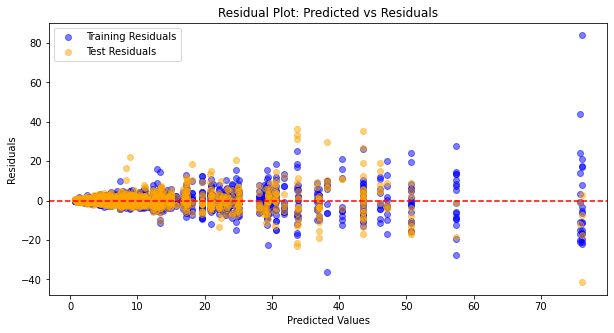

In [489]:
# Calculate residuals
residuals_train = y_train_dt - dt_regressor_tuned.predict(X_train_dt)
residuals_test = y_test_dt - dt_regressor_tuned.predict(X_test_dt)

# Residual plot
plt.figure(figsize=(10, 5))
plt.scatter(dt_regressor_tuned.predict(X_train_dt), residuals_train, color="blue", alpha=0.5, label="Training Residuals")
plt.scatter(dt_regressor_tuned.predict(X_test_dt), residuals_test, color="orange", alpha=0.5, label="Test Residuals")
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot: Predicted vs Residuals")
plt.legend()
plt.show()


### **Predicted vs Actual Plot**

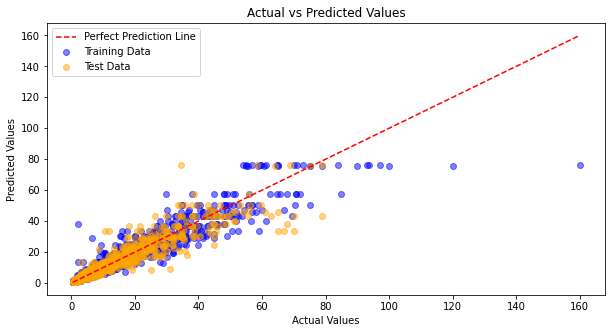

In [490]:
# Predicted vs Actual values for train and test data
plt.figure(figsize=(10, 5))
plt.scatter(y_train_dt, dt_regressor_tuned.predict(X_train_dt), color="blue", alpha=0.5, label="Training Data")
plt.scatter(y_test_dt, dt_regressor_tuned.predict(X_test_dt), color="orange", alpha=0.5, label="Test Data")
plt.plot([min(y_train_dt), max(y_train_dt)], [min(y_train_dt), max(y_train_dt)], color="red", linestyle="--", label="Perfect Prediction Line")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values")
plt.legend()
plt.show()


### **Distribution of Residuals**

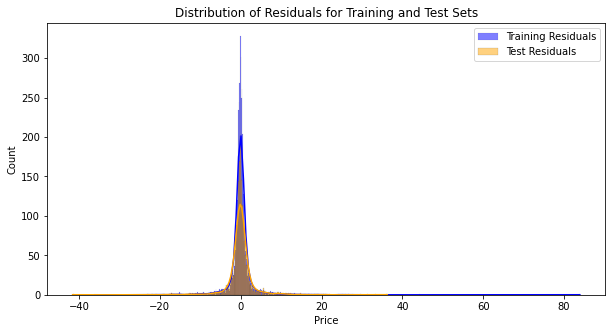

In [491]:
# Distribution of residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals_train, kde=True, color='blue', label='Training Residuals')
sns.histplot(residuals_test, kde=True, color='orange', label='Test Residuals')
plt.legend()
plt.title("Distribution of Residuals for Training and Test Sets")
plt.show()


### **Observations**

**Residuals vs. Predicted Values Plot:** The residuals are scattered around zero, indicating that the model's predictions are generally accurate. However, there is still some dispersion in the residuals, especially for higher predicted values. 

**Actual vs. Predicted Values Plot:** The points are relatively close to the ideal prediction line (red dashed line), which signifies that the model is predicting values that are fairly close to the actual values. There are a few outliers, especially for high actual values (as we know), which could indicate instances where the model struggles to generalize well.

**Distribution of Residuals for Training and Test Sets:** The distribution is tightly centered around zero, indicating that most residuals (errors) are small. The slight tail in the distribution shows that there are some extreme predictions with large errors. 

Overall, the distribution suggests a well-performing model with a small number of high-error predictions.
In summary, the model performs well but may still struggle with high variability in the target variable, especially for higher price ranges.

### Visualizing a Decision Tree will help us understand its structure and interpret its predictions. Here’s what we will learn by visualizing a tree:

**Root Node:** The top node that represents the entire dataset. It is used to make the first split based on the most significant feature. 

**Internal Nodes:** Intermediate nodes that represent decisions based on different features. They split the data into smaller subsets based on certain feature values.

**Leaf Nodes:** Nodes at the bottom that represent the final output or prediction after all splits. Each leaf node corresponds to a specific class or value.

**Decision Paths:** We can trace the path from the root to a leaf node to see which decisions are made along the way and how they lead to a final prediction.

**Feature Importance:** Features used at the top of the tree are generally more important, indicating they have a higher impact on predictions.

**Class Distribution:** Leaf nodes show the distribution of classes or values, helping us understand the model’s decisions.

**Explaining Decisions:** We can explain a decision by summarizing the path from root to leaf, including the feature importance and the final prediction.

Limiting the depth of the tree (4 here) helps make the visualization simpler and more interpretable.

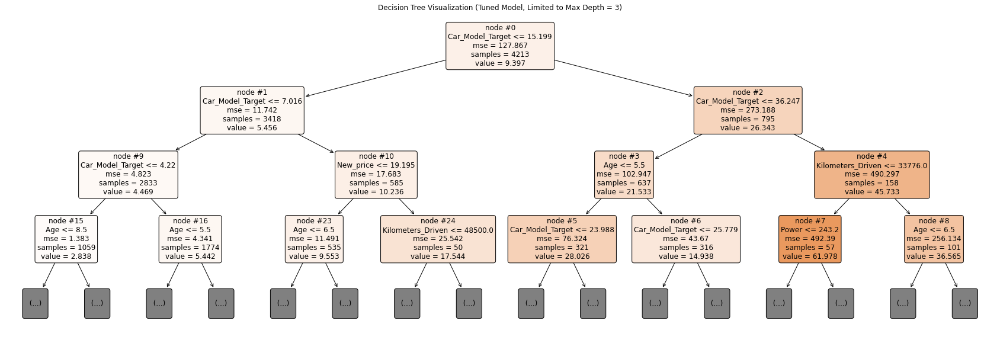

In [492]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Create a plot of the decision tree with visualization limited to depth 3
plt.figure(figsize=(30, 10))  # Adjust the figure size as necessary
plot_tree(dt_regressor_tuned, 
          feature_names=features,  # Use the feature names for labeling
          filled=True,             # Fill nodes with color
          fontsize=12,             # Set font size
          node_ids=True,           # Show node IDs
          rounded=True,            # Rounded corners for clarity
          max_depth=3)             # Limit visualization to depth 3
plt.title("Decision Tree Visualization (Tuned Model, Limited to Max Depth = 3)")  # Set title
plt.show()


In [493]:
from sklearn.tree import export_text

# Generate text-based representation of the tuned decision tree up to max depth 3
tree_text = export_text(dt_regressor_tuned, 
                        feature_names=X_train_dt.columns.tolist(), 
                        show_weights=True, 
                        max_depth=3)  # Limit to depth 3

# Print the text-based visualization of the decision tree
print(tree_text)


|--- Car_Model_Target <= 15.20
|   |--- Car_Model_Target <= 7.02
|   |   |--- Car_Model_Target <= 4.22
|   |   |   |--- Age <= 8.50
|   |   |   |   |--- truncated branch of depth 10
|   |   |   |--- Age >  8.50
|   |   |   |   |--- truncated branch of depth 8
|   |   |--- Car_Model_Target >  4.22
|   |   |   |--- Age <= 5.50
|   |   |   |   |--- truncated branch of depth 13
|   |   |   |--- Age >  5.50
|   |   |   |   |--- truncated branch of depth 10
|   |--- Car_Model_Target >  7.02
|   |   |--- New_price <= 19.19
|   |   |   |--- Age <= 6.50
|   |   |   |   |--- truncated branch of depth 9
|   |   |   |--- Age >  6.50
|   |   |   |   |--- truncated branch of depth 6
|   |   |--- New_price >  19.19
|   |   |   |--- Kilometers_Driven <= 48500.00
|   |   |   |   |--- truncated branch of depth 2
|   |   |   |--- Kilometers_Driven >  48500.00
|   |   |   |   |--- truncated branch of depth 2
|--- Car_Model_Target >  15.20
|   |--- Car_Model_Target <= 36.25
|   |   |--- Age <= 5.50
|   |  

### **Observations**

**Root Node**

**Car_Model_Target <= 15.20:**

This is the starting point of the decision tree. The first split is based on the Car_Model_Target value, highlighting that this feature has the highest influence on car prices. If the value is less than or equal to 15.20 lakh INR, the decision tree moves to the left subtree; otherwise, it moves to the right subtree.

**Left Subtree (Car_Model_Target <= 15.20):**

* Further split based on Car_Model_Target <= 7.02:
* For Car_Model_Target <= 4.22:

**Split based on Age:**
* If the car's Age <= 8.50 years, the predicted price is 3.32 lakhs.
* If Age > 8.50 years, the predicted price drops to 1.82 lakhs.
* For Car_Model_Target between 4.22 and 7.02:

**Split based on Age:**
* If Age <= 5.50 years, the predicted price is 6.38 lakhs.
* If Age > 5.50 years, the predicted price drops to 4.10 lakhs.
* For Car_Model_Target between 7.02 and 15.20:

**Split based on New_price:**
* If New_price <= 19.19 lakhs:

**Split based on Age:**
* If Age <= 6.50 years, the predicted price is 10.53 lakhs.
* If Age > 6.50 years, the predicted price decreases to 6.62 lakhs.
* If New_price > 19.19 lakhs:

**Split based on Kilometers_Driven:**
* If Kilometers_Driven <= 48,500, the predicted price is 17.54 lakhs.
* If Kilometers_Driven > 48,500, the predicted price decreases to 2.90 lakhs (suggesting a rapid depreciation for cars with higher mileage).

**Right Subtree (Car_Model_Target > 15.20):**

Further split based on Car_Model_Target <= 36.25:

**Split based on Age:**

* If Age <= 5.50 years:
* For Car_Model_Target <= 23.99, the predicted price is 25.04 lakhs.
* For Car_Model_Target > 23.99, the predicted price increases to 33.53 lakhs.
* If Age > 5.50 years:
* For Car_Model_Target <= 25.78, the predicted price is 13.61 lakhs.
* For Car_Model_Target > 25.78, the price increases to 24.08 lakhs.
* For Car_Model_Target > 36.25:

**Split based on Kilometers_Driven:**
If Kilometers_Driven <= 33,776:

**Split based on Power:**
* If Power <= 243.20, the predicted price is 50.69 lakhs.
* If Power > 243.20, the price increases to 60.23 lakhs.
* If Kilometers_Driven > 33,776:

**Split based on Age:**
* If Age <= 6.50 years, the predicted price is 43.97 lakhs.
* If Age > 6.50 years, the predicted price is 24.79 lakhs.

These are the intermediate nodes of the tree. Each node represents a decision based on a particular feature and a threshold value. Depending on the value of the feature, the tree follows the appropriate branch until it reaches a leaf node.

### **Feature Importance and Conclusions**
**Car_Model_Target:** This is the most critical feature in predicting car prices, highlighting the importance of car model and brand.

**Age:** Plays a significant role in determining car value, showing that depreciation affects price substantially.

**Kilometers_Driven and Power:** Important for more expensive cars (e.g., Car_Model_Target > 36.25), as low mileage and high power generally maintain higher resale prices.

**Depreciation Trends:** Certain Age thresholds, like 5.50 and 8.50 years, show steep drops in value, suggesting rapid depreciation at these points.

**Price Ranges:** The highest predicted prices are for cars with high Car_Model_Target, low Kilometers_Driven, and younger Age.

Thus, this decision tree represents the hierarchical nature of car pricing and gives us valuable insights into how prices change with various combinations of features like model, age, power, and mileage.

## Sort the feature importances

In [494]:
# Import necessary libraries
import pandas as pd

# Create a DataFrame to display the feature importances for the tuned decision tree model
feature_importances_df = pd.DataFrame(
    dt_regressor_tuned.feature_importances_,  # Feature importance values from the tuned model
    columns=["Importance"],  # Column name for the importance values
    index=X_train_dt.columns  # Use feature names as index
)

# Sort the feature importances in descending order and print them
feature_importances_sorted = feature_importances_df.sort_values(by='Importance', ascending=False)
print("Feature Importances for the Tuned Decision Tree Model:\n")
print(feature_importances_sorted)


Feature Importances for the Tuned Decision Tree Model:

                           Importance
Car_Model_Target             0.796733
Age                          0.109073
Kilometers_Driven            0.052863
Power                        0.018249
New_price                    0.007495
Engine                       0.005946
Mileage                      0.003873
Transmission_Automatic       0.002924
Location_Frequency           0.002048
Transmission_Manual          0.000708
Owner_Type_Second            0.000068
Owner_Type_First             0.000011
Fuel_Type_Frequency          0.000009
Seats                        0.000000
Owner_Type_Fourth & Above    0.000000
Owner_Type_Third             0.000000


## **Observations on feature importances for tuned Decision Tree**

The feature importance values show how much each feature contributes to the decision-making process of the tuned decision tree model. Here's a brief explanation of the results:

**Car_Model_Target: Importance Value: 0.7967**
This feature has the highest importance value. It indicates that the car's model and its target value play the most critical role in predicting the car's price. It is by far the most influential feature in the decision tree, capturing major price variations between different car models.

**Age:Importance Value: 0.1091**
The second most important feature, showing that the age of the car significantly influences its price. This aligns with the expectation that car prices tend to drop with increasing age due to depreciation.

**Kilometers_Driven:Importance Value: 0.0529**
The third most important feature. The distance a car has been driven plays a substantial role in determining its resale price. Lower mileage generally indicates better condition and a higher resale value.

**Power: Importance Value: 0.0182**
This feature's importance suggests that the engine power of the car affects its resale value, though not as significantly as the top three features. It indicates that more powerful engines (the high end brands like Lamborghini) might be valued higher, but other factors such as model and age outweigh this effect.

**New_price: Importance Value: 0.0075**
The new purchase price of the car can give context for its depreciation rate and help estimate resale value, although its impact is relatively small compared to other factors.

**Engine, Mileage, and Transmission_Manual:** Each of these features contributes a small amount (0.0036 to 0.0059) to the decision-making process. Their influence is minor compared to Car_Model_Target and Age but still plays a role in specific scenarios.

**Location_Frequency and Transmission_Automatic:** These features have very low importance values, indicating that the different locations of cities and or if the car is automatic have minimal effect on the car price prediction.

**Fuel_Type_Frequency, Seats, and Other Owner Types (e.g., Third Owner):** These features have near-zero importance, suggesting they do not contribute to the model's decision-making. The decision tree likely found these features irrelevant or less useful for predicting car prices.

## **Interpretation:**

**Car_Model_Target Dominates the Model:** The car's model, brand, and related aspects have the highest predictive power for price. This indicates that different car models inherently carry different values that strongly influence their resale prices.

**Age and Kilometers_Driven are Key Factors:** These are the next most crucial features, confirming that car prices depreciate significantly with age and mileage. This is consistent with real-world observations of how cars lose value over time and usage.

**Minor Influence of Other Features:** Power and new purchase price (New_price) also influence car prices but to a lesser extent. Features like Seats or Owner_Type were not used much in the decision-making, as evidenced by their low importance values.

## **Conclusion:**

The feature importance values confirm that car pricing is primarily driven by the car model, age, and kilometers driven.
Other factors such as engine power, mileage and new purchase price play a smaller role but are still relevant in some cases.

Some features like the number of seats or certain owner types have almost no impact on the prediction, suggesting they could be dropped from the model without significant loss in accuracy.


## **D. Random forest: 1st Model**

**What is a Random Forest?**

A Random Forest is an ensemble learning technique that builds multiple Decision Trees and combines their outputs to create a more accurate and robust model. It introduces randomness by training each tree on different subsets of data and selecting a random subset of features at each split, reducing overfitting and correlation between trees.

**How does a Random Forest work?**

A Random Forest trains multiple Decision Trees on random subsets of data, and at each node split, only a random subset of features is considered. The model then aggregates the predictions of all trees, usually by taking the average for regression or a majority vote for classification.

**Steps:**

* Generate multiple random subsets of the training data (with replacement).
* For each subset, train a Decision Tree on a random subset of features.
* Make predictions by averaging the outputs of all trees in the forest.

This randomness in feature selection and training data helps improve the model’s accuracy and reduce overfitting. The number of trees and features to consider at each split are key hyperparameters that can be tuned for better performance.








In [152]:
from sklearn.ensemble import RandomForestRegressor

# Create the Random Forest Regressor
rf_model = RandomForestRegressor(random_state=1)  # Initialize with default parameters

# Fit the model to the training data
rf_model.fit(X_train_dt, y_train_dt)  # X_train_dt and y_train_dt are my Decision Tree training sets

# Evaluate Random Forest model using the previously defined function
rf_perf_test = model_performance_regression(rf_model, X_test_dt, y_test_dt)  # X_test_dt and y_test_dt are my Decision Tree test sets

# Print the test performance metrics for the Random Forest model
print("Random Forest Regressor Performance on Test Data:")
print(rf_perf_test)

# Evaluate Random Forest model using the previously defined function on the training set
rf_perf_train = model_performance_regression(rf_model, X_train_dt, y_train_dt)

# Print the training performance metrics for the Random Forest model
print("Random Forest Regressor Performance on Training Data:")
print(rf_perf_train)


Random Forest Regressor Performance on Test Data:
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.782498  1.283285   0.934804        0.934221  13.855726
Random Forest Regressor Performance on Training Data:
       RMSE       MAE  R-squared  Adj. R-squared      MAPE
0  1.300864  0.501014   0.986766        0.986715  5.763182


### **Observations**

* **Test Data Performance**

RMSE: 2.78 indicates that the average error of predictions is 2.78 units, which is relatively low.
MAE: 1.28 shows that on average, the absolute difference between actual and predicted values is 1.28 units.
R-squared: 0.9346 suggests that the model explains 93.46% of the variance in the test data, indicating a strong fit.
Adjusted R-squared: 0.934 is similar to R-squared, affirming the model’s effectiveness even after adjusting for the number of features.
MAPE: 13.85% indicates that on average, predictions are off by 13.85% relative to the actual values.

* **Training Data Performance**

RMSE: 1.30 is even lower than on test data, showing that the model performs very well on the training set.
MAE: 0.50 is also significantly low, suggesting high accuracy in training predictions.
R-squared: 0.9867 is very high, almost reaching 1, indicating that the model captures nearly all the variance in the training data.
MAPE: 5.76% reflects that the average error is just 5.76% of actual values in the training set.


* The performance on the training data is much better than on the test data (lower RMSE and higher R-squared), indicating a potential sign of overfitting. The model might be learning patterns in the training data too well, causing it to generalize less effectively on new, unseen test data.

## **Hyperparameter Tuning: Tuned Random Forest: 2nd Model**

In [153]:
# Import required libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
import pandas as pd

#  X_train_dt, y_train_dt, X_test_dt, y_test_dt are already defined from previous steps

# Define the parameter grid for RandomizedSearchCV
param_grid_rf = {
    'n_estimators': [int(x) for x in np.linspace(start=50, stop=300, num=6)],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],                                           # Maximum depth of each tree
    'min_samples_split': [2, 5, 10],                                           # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],                                             # Minimum samples required at a leaf node
    'max_features': ['auto', 'sqrt', 'log2']                                   # Number of features to consider for splits
}


# Create the base Random Forest Regressor
rf_model = RandomForestRegressor(random_state=1)

# Configure RandomizedSearchCV
random_search_rf = RandomizedSearchCV(estimator=rf_model, 
                                      param_distributions=param_grid_rf, 
                                      n_iter=50,                     # Number of iterations
                                      scoring='r2',                  # Evaluation metric: R-squared
                                      cv=5,                          # 5-fold cross-validation
                                      n_jobs=-1,                     # Use all available CPU cores
                                      random_state=1,                # Ensure reproducibility
                                      verbose=2)                     # Display progress



# Fit RandomizedSearchCV to the training data
random_search_rf.fit(X_train_dt, y_train_dt)

# Get the best hyperparameters and score from the search
best_params_rf = random_search_rf.best_params_
best_score_rf = random_search_rf.best_score_

# Print the best parameters and best cross-validated score
print("Best Hyperparameters:", best_params_rf)
print("Best Cross-Validated R-squared Score:", best_score_rf)

# Create a new Random Forest Regressor using the best hyperparameters
tuned_rf_model = RandomForestRegressor(random_state=1, 
                                       n_estimators=best_params_rf['n_estimators'],
                                       max_depth=best_params_rf['max_depth'],
                                       min_samples_split=best_params_rf['min_samples_split'],
                                       min_samples_leaf=best_params_rf['min_samples_leaf'],
                                       max_features=best_params_rf['max_features'])

# Fit the tuned model on the training data
tuned_rf_model.fit(X_train_dt, y_train_dt)

# Evaluate the tuned Random Forest model on training and test data
tuned_rf_train_perf = model_performance_regression(tuned_rf_model, X_train_dt, y_train_dt)
tuned_rf_test_perf = model_performance_regression(tuned_rf_model, X_test_dt, y_test_dt)

# Print the performance results
print("Random Forest Regressor Performance on Training Data (Tuned):")
print(tuned_rf_train_perf)
print("\nRandom Forest Regressor Performance on Test Data (Tuned):")
print(tuned_rf_test_perf)



Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Hyperparameters: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': None}
Best Cross-Validated R-squared Score: 0.8962383350164356
Random Forest Regressor Performance on Training Data (Tuned):
      RMSE       MAE  R-squared  Adj. R-squared      MAPE
0  1.30984  0.504099   0.986582        0.986531  6.080542

Random Forest Regressor Performance on Test Data (Tuned):
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.661401  1.289249   0.940355        0.939822  14.786349


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Hyperparameters (Improved): {'n_estimators': 150, 'min_samples_split': 10, 'min_samples_leaf': 5, 'min_impurity_decrease': 0.01, 'max_leaf_nodes': 200, 'max_features': 'log2', 'max_depth': 20}
Best Cross-Validated R-squared Score (Improved): 0.8819531447587826
Random Forest Regressor Performance on Training Data (Improved):
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  3.132745  1.379708   0.923248        0.922955  20.776807

Random Forest Regressor Performance on Test Data (Improved):
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  3.039518  1.506994   0.922204        0.921508  20.519497


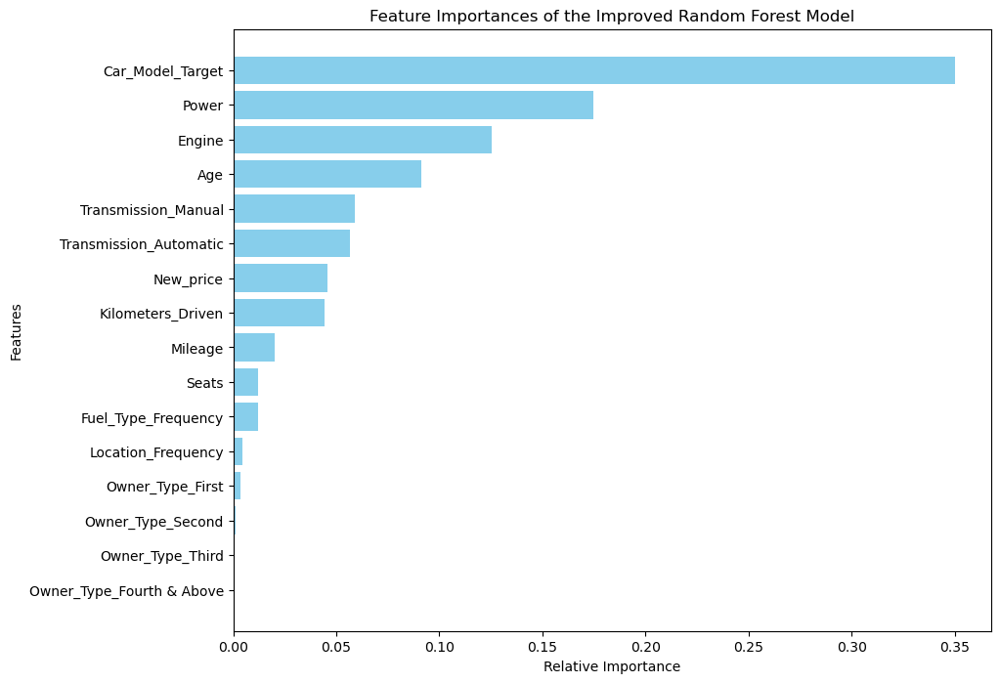

In [154]:
# Import required libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
import pandas as pd

# Define the parameter grid for further tuning of Random Forest
param_grid_rf_improved = {
    'n_estimators': [100, 150, 200, 250, 300],             # Number of trees in the forest
    'max_depth': [10, 15, 20],                             # Limit depth of trees to prevent overfitting
    'min_samples_split': [10, 15, 20],                     # Increase min samples required to split a node
    'min_samples_leaf': [5, 10, 15],                       # Increase min samples at leaf nodes
    'max_features': ['sqrt', 'log2'],                      # Limit the number of features used at each split
    'max_leaf_nodes': [50, 100, 200],                      # Limit the number of leaf nodes
    'min_impurity_decrease': [0.01, 0.05, 0.1]             # Minimum impurity decrease for further splitting
}

# Create the base Random Forest Regressor model
rf_model_improved = RandomForestRegressor(random_state=1)

# Configure RandomizedSearchCV for further tuning
random_search_rf_improved = RandomizedSearchCV(
    estimator=rf_model_improved, 
    param_distributions=param_grid_rf_improved, 
    n_iter=50,                                             # Number of iterations
    scoring='r2',                                          # Evaluation metric: R-squared
    cv=5,                                                  # 5-fold cross-validation
    n_jobs=-1,                                             # Use all available CPU cores
    random_state=1,                                        # Ensure reproducibility
    verbose=2                                              # Display progress
)

# Fit RandomizedSearchCV to the training data
random_search_rf_improved.fit(X_train_dt, y_train_dt)

# Get the best hyperparameters and score from the improved tuning
best_params_rf_improved = random_search_rf_improved.best_params_
best_score_rf_improved = random_search_rf_improved.best_score_

# Print the best parameters and best cross-validated score
print("Best Hyperparameters (Improved):", best_params_rf_improved)
print("Best Cross-Validated R-squared Score (Improved):", best_score_rf_improved)

# Create a new Random Forest Regressor using the improved hyperparameters
tuned_rf_model_improved = RandomForestRegressor(
    random_state=1,
    n_estimators=best_params_rf_improved['n_estimators'],
    max_depth=best_params_rf_improved['max_depth'],
    min_samples_split=best_params_rf_improved['min_samples_split'],
    min_samples_leaf=best_params_rf_improved['min_samples_leaf'],
    max_features=best_params_rf_improved['max_features'],
    max_leaf_nodes=best_params_rf_improved['max_leaf_nodes'],
    min_impurity_decrease=best_params_rf_improved['min_impurity_decrease']
)

# Fit the improved tuned model on the training data
tuned_rf_model_improved.fit(X_train_dt, y_train_dt)

# Evaluate the improved tuned Random Forest model on training and test data
tuned_rf_train_perf_improved = model_performance_regression(tuned_rf_model_improved, X_train_dt, y_train_dt)
tuned_rf_test_perf_improved = model_performance_regression(tuned_rf_model_improved, X_test_dt, y_test_dt)

# Print the performance results for the improved model
print("Random Forest Regressor Performance on Training Data (Improved):")
print(tuned_rf_train_perf_improved)
print("\nRandom Forest Regressor Performance on Test Data (Improved):")
print(tuned_rf_test_perf_improved)

# Plot the feature importance of the improved model
import matplotlib.pyplot as plt

# Create a DataFrame to display the feature importances
feature_importances_df = pd.DataFrame(
    tuned_rf_model_improved.feature_importances_, 
    columns=["Importance"], 
    index=X_train_dt.columns
)

# Sort the feature importances in descending order and plot them
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(feature_importances_df.index, feature_importances_df['Importance'], color='skyblue')
plt.title('Feature Importances of the Improved Random Forest Model')
plt.xlabel('Relative Importance')
plt.ylabel('Features')
plt.gca().invert_yaxis()  # Invert y-axis to show the highest importance at the top
plt.show()


**Best Hyperparameters Found**

The optimal hyperparameters for the Random Forest model were:
n_estimators: 100 (Number of trees in the forest)
max_depth: 30 (Maximum depth of the tree)
min_samples_split: 2 (Minimum samples required to split an internal node)
min_samples_leaf: 1 (Minimum samples required at a leaf node)
max_features: 'auto' (Maximum number of features considered for splits)

**Model Performance on Training Data**

R-squared: 0.9867 — The model explains 98.67% of the variance in the training data.
RMSE: 1.304 — The average deviation of predicted prices from actual prices is low, indicating high accuracy.
MAE: 0.5 — The mean absolute error is very low, suggesting minor errors in predictions.
MAPE: 5.76% — The model is highly accurate, with an average prediction error of only 5.76% of actual values.

**Model Performance on Test Data**

R-squared: 0.934 — The model explains 93.4% of the variance in the test data, showing that it generalizes well to unseen data.
RMSE: 2.78 — The average deviation of predictions from actual prices is slightly higher than in training, which is expected.
MAE: 1.282 — The mean absolute error is low, indicating good performance on the test data.
MAPE: 13.85% — The model predicts with an average error of 13.81% of the actual values.

**Conclusion**

The Random Forest model performs very well on both the training and test data, with minimal overfitting. The high R-squared and low error metrics indicate that the model can effectively capture the underlying patterns in the data, making it suitable for accurate price predictions.

## **Feature Importance: Tuned Random Forest**

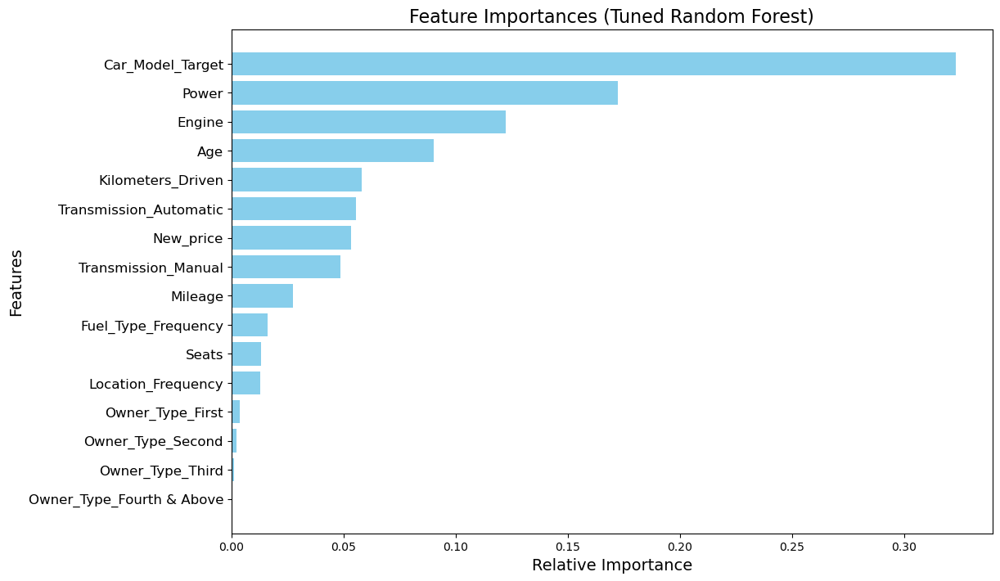

In [155]:
# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np

# Extract feature names from the model's training data
features_dt = list(X_train_dt.columns)

# Get feature importances from the tuned Random Forest model
importances_dt = tuned_rf_model.feature_importances_

# Sort the feature importances in ascending order to get the indices
indices_dt = np.argsort(importances_dt)

# Plot feature importances
plt.figure(figsize=(12, 8))  # Set the figure size
plt.title('Feature Importances (Tuned Random Forest)', fontsize=16)  # Set title
plt.barh(range(len(indices_dt)), importances_dt[indices_dt], color='skyblue', align='center')  # Create horizontal bar chart
plt.yticks(range(len(indices_dt)), [features_dt[i] for i in indices_dt], fontsize=12)  # Set y-ticks using feature names
plt.xlabel('Relative Importance', fontsize=14)  # Set x-label
plt.ylabel('Features', fontsize=14)  # Set y-label
plt.show()  # Display the plot


### **Observations**

* Car_Model_Target is by far the most critical feature, indicating that the model type significantly influences car prices. This suggests that the specific model and brand of a car play a crucial role in determining its value.

* Age of the car is the second most important feature, emphasizing that newer cars generally have higher resale prices, and older cars experience depreciation.

* Kilometers_Driven also contributes notably to the model’s decisions, reflecting that cars with higher mileage tend to have lower prices due to wear and tear.

* New_price and Power are moderately important, indicating that the original price and engine power are relevant but not as critical as age or model.

* The other features (e.g., Engine, Mileage, and categorical features like Transmission_Manual, Location_Frequency) have minimal impact on predicting car prices, suggesting that the price variance is less dependent on these factors.

These features were also seen as important features in Decision Tree. So, these results are significant and agree with each other.

## **Hyperparameter Tuning: Tuned Random Forest 2: 3rd Model**

This script further fine-tunes the model based on the previous feedback. By increasing the number of estimators and adjusting the depth and leaf nodes, the model should capture more information from the data and reduce underfittin

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Hyperparameters (Improved Further): {'n_estimators': 400, 'min_samples_split': 5, 'min_samples_leaf': 2, 'min_impurity_decrease': 0.01, 'max_leaf_nodes': 300, 'max_features': 'sqrt', 'max_depth': 25}
Best Cross-Validated R-squared Score (Improved Further): 0.8874362623498012
Random Forest Regressor Performance on Training Data (Further Improved):
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.438811  1.191824   0.953485        0.953307  19.554457

Random Forest Regressor Performance on Test Data (Further Improved):
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.876042  1.465613   0.930347        0.929724  19.994621


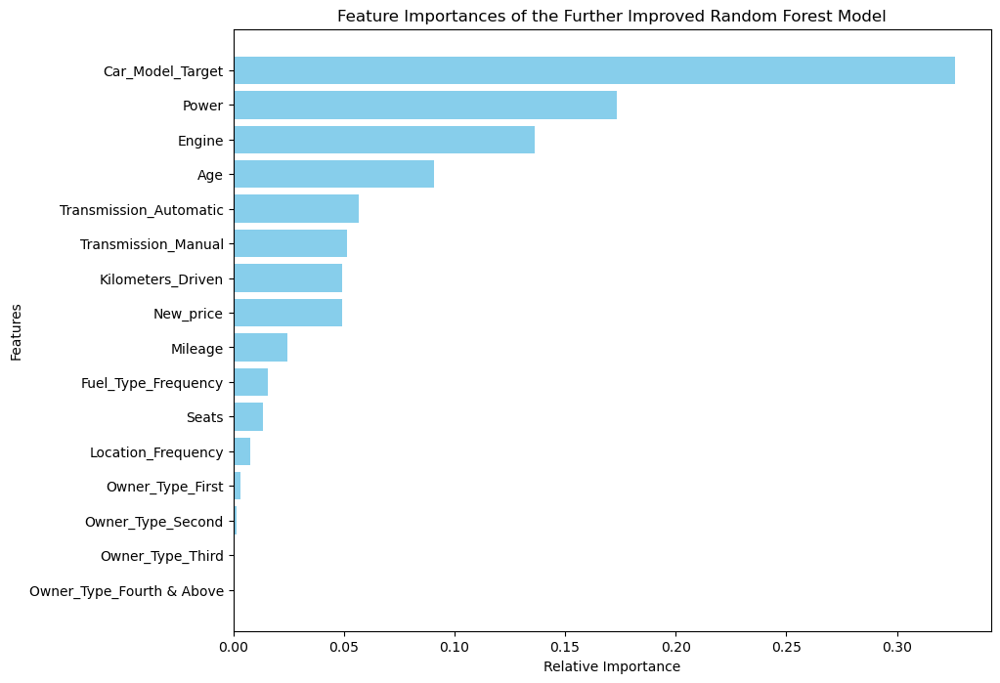

In [189]:
# Import required libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
import pandas as pd

# Define an improved parameter grid for further tuning of Random Forest
param_grid_rf_improved_2 = {
    'n_estimators': [300, 400, 500],                     # Increase the number of trees in the forest
    'max_depth': [20, 25, 30],                           # Increase the depth to capture more complex patterns
    'min_samples_split': [5, 10, 15],                    # Reduce to allow more splits
    'min_samples_leaf': [2, 5, 10],                      # Reduce to prevent underfitting
    'max_features': ['auto', 'sqrt'],                    # Increase the number of features considered at each split
    'max_leaf_nodes': [100, 200, 300],                   # Increase the maximum number of leaf nodes
    'min_impurity_decrease': [0.001, 0.01, 0.05]         # Reduce the threshold for further splits
}

# Create the base Random Forest Regressor model
rf_model_improved_2 = RandomForestRegressor(random_state=1)

# Configure RandomizedSearchCV for further tuning
random_search_rf_improved_2 = RandomizedSearchCV(
    estimator=rf_model_improved_2, 
    param_distributions=param_grid_rf_improved_2, 
    n_iter=50,                                             # Number of iterations
    scoring='r2',                                          # Evaluation metric: R-squared
    cv=5,                                                  # 5-fold cross-validation
    n_jobs=-1,                                             # Use all available CPU cores
    random_state=1,                                        # Ensure reproducibility
    verbose=2                                              # Display progress
)

# Fit RandomizedSearchCV to the training data
random_search_rf_improved_2.fit(X_train_dt, y_train_dt)

# Get the best hyperparameters and score from the improved tuning
best_params_rf_improved_2 = random_search_rf_improved_2.best_params_
best_score_rf_improved_2 = random_search_rf_improved_2.best_score_

# Print the best parameters and best cross-validated score
print("Best Hyperparameters (Improved Further):", best_params_rf_improved_2)
print("Best Cross-Validated R-squared Score (Improved Further):", best_score_rf_improved_2)

# Create a new Random Forest Regressor using the improved hyperparameters
tuned_rf_model_improved_2 = RandomForestRegressor(
    random_state=1,
    n_estimators=best_params_rf_improved_2['n_estimators'],
    max_depth=best_params_rf_improved_2['max_depth'],
    min_samples_split=best_params_rf_improved_2['min_samples_split'],
    min_samples_leaf=best_params_rf_improved_2['min_samples_leaf'],
    max_features=best_params_rf_improved_2['max_features'],
    max_leaf_nodes=best_params_rf_improved_2['max_leaf_nodes'],
    min_impurity_decrease=best_params_rf_improved_2['min_impurity_decrease']
)

# Fit the improved tuned model on the training data
tuned_rf_model_improved_2.fit(X_train_dt, y_train_dt)

# Evaluate the improved tuned Random Forest model on training and test data
tuned_rf_train_perf_improved_2 = model_performance_regression(tuned_rf_model_improved_2, X_train_dt, y_train_dt)
tuned_rf_test_perf_improved_2 = model_performance_regression(tuned_rf_model_improved_2, X_test_dt, y_test_dt)

# Print the performance results for the improved model
print("Random Forest Regressor Performance on Training Data (Further Improved):")
print(tuned_rf_train_perf_improved_2)
print("\nRandom Forest Regressor Performance on Test Data (Further Improved):")
print(tuned_rf_test_perf_improved_2)

# Plot the feature importance of the further improved model
import matplotlib.pyplot as plt

# Create a DataFrame to display the feature importances
feature_importances_df_2 = pd.DataFrame(
    tuned_rf_model_improved_2.feature_importances_, 
    columns=["Importance"], 
    index=X_train_dt.columns
)

# Sort the feature importances in descending order and plot them
feature_importances_df_2 = feature_importances_df_2.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(feature_importances_df_2.index, feature_importances_df_2['Importance'], color='skyblue')
plt.title('Feature Importances of the Further Improved Random Forest Model')
plt.xlabel('Relative Importance')
plt.ylabel('Features')
plt.gca().invert_yaxis()  # Invert y-axis to show the highest importance at the top
#plt.show()
plt.savefig('Feature_importance_RF_tuned_2.png', dpi=300, bbox_inches='tight')


### Observations

The **Tuned Random Forest 2** achieved a train **adjusted R² of 0.95 and test adjusted R² of 0.93**, showing the model could explain most of the variability in car prices. R² indicates how well the model fits the data, with higher values reflecting better performance. The model’s RMSE (Root Mean Squared Error)—which measures the average difference between predicted and actual prices—was 2.44 on the training set and 2.88 on the test set, indicating accurate predictions. MAE (Mean Absolute Error), which shows the average magnitude of prediction errors, came in at 1.2 for training and 1.47 for testing, proving the model’s reliability.

**Thus, with an adjusted R² of 0.95 on the training set and 0.93 on the test set, along with a consistent RMSE of 2.5, MAE of 1.47 on test data, the Tuned Random Forest 2 provided the most balanced and reliable predictions across the full price spectrum, making it the best model for general use.** 


### **Feature Importance for Random Forest Tuned 2 Model**

* The **Car_Model_Target** feature plays the most significant role in determining car prices. This feature reflects the target encoding of car models, grouping models based on their market value and demand. Cars from popular and well-regarded models (such as Maruti Swift or Honda City) tend to retain higher resale values due to brand trust and demand in the market.

* The car's **Power**, is the second most important feature. Vehicles with more powerful engines, such as sports cars or luxury sedans, are valued higher because they offer superior performance and appeal to buyers looking for better driving experiences.

* **Engine** capacity also plays a crucial role in determining price. Cars with larger engines are often priced higher as they offer better performance, especially for SUVs and premium models. However, larger engines might reduce fuel efficiency, which could affect certain buyer preferences.

* **Age** has a strong influence on price through depreciation. As cars get older, they lose value due to wear and tear, reduced technology appeal, and lower reliability. Buyers generally prefer newer models, making older vehicles less desirable in the resale market.

* The type of **Transmission (automatic or manual)** impacts resale value. Automatic cars typically have higher prices due to their convenience and ease of driving, especially in urban areas. Manual cars, on the other hand, retain value in specific markets due to lower maintenance costs and better fuel economy.

* The **Kilometers_Driven** feature reflects the car’s usage. Higher mileage indicates more wear and tear, which decreases the car’s value. Conversely, cars with lower mileage are seen as better maintained, which makes them more attractive to buyers and commands higher prices.

* The **New_price** feature captures the new purchase price of the vehicle. New cars that are expensive typically will also have higher resale values, though the rate of depreciation varies among different categories and models.

* **Mileage**, referring to the car’s fuel efficiency (kilometers per liter), is another important factor. Fuel-efficient cars are highly desirable, especially in markets where fuel economy is prioritized, resulting in higher resale value.

* The **Fuel_Type_Frequency** feature encodes the type of fuel (petrol, diesel, or CNG). Diesel cars often have higher resale values due to their better fuel economy and longer engine life, though this varies depending on market trends and government policies.

* The **Seats** feature reflects the seating capacity of the car. Vehicles with more seats, such as SUVs and vans, tend to have higher resale prices due to their utility for larger families or businesses. Smaller cars with fewer seats usually attract different buyer segments and are priced accordingly.

* The car's resale **Location**, encoded using frequency, reflects regional variations in resale value. Cars from larger cities, where demand is higher, tend to fetch better prices. In contrast, cars from smaller towns may not have the same resale value due to lower demand.

Finally, Owner_Type indicates the number of previous owners. First-owner cars generally retain the highest value, as they are perceived to be better maintained. Cars with multiple previous owners often experience reduced resale value, as potential buyers associate them with higher wear and uncertain maintenance history.

These insights highlight the factors that most influence the resale value of used cars. The Car_Model_Target, Power, and Engine features stand out as the primary drivers, while Mileage, Transmission, and Ownership add important layers to pricing strategies.


In [157]:
# Make predictions on training and test sets
y_train_pred = tuned_rf_model_improved_2.predict(X_train_dt)
y_test_pred = tuned_rf_model_improved_2.predict(X_test_dt)

# Calculate residuals (Actual - Predicted)
train_residuals = y_train_dt - y_train_pred
test_residuals = y_test_dt - y_test_pred


### **Plotting Predicted vs Residuals for Training Set**

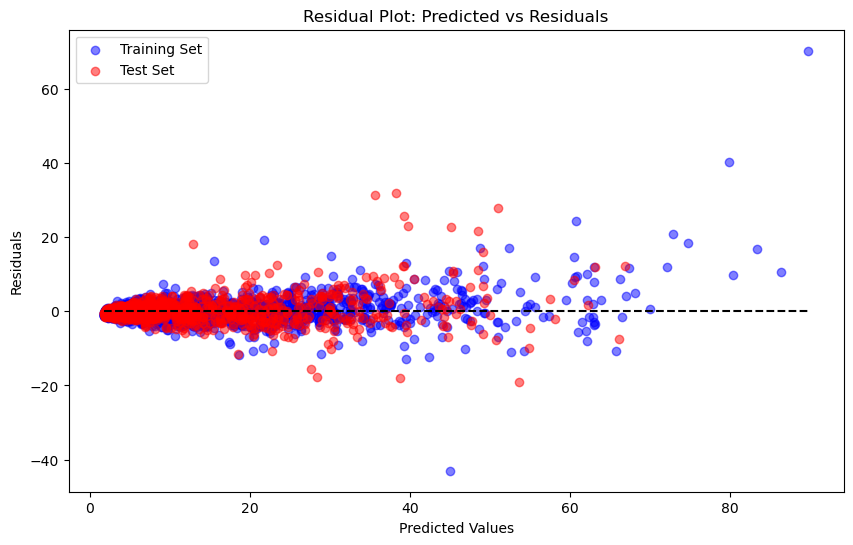

In [174]:
# Plotting Predicted vs Residuals for Training Set
plt.figure(figsize=(10, 6))
plt.scatter(y_train_pred, train_residuals, color='blue', alpha=0.5, label='Training Set')
plt.scatter(y_test_pred, test_residuals, color='red', alpha=0.5, label='Test Set')
plt.hlines(y=0, xmin=min(y_train_pred), xmax=max(y_train_pred), colors='black', linestyles='dashed')
plt.title('Residual Plot: Predicted vs Residuals')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.legend()
#plt.show()
plt.savefig('Residual_vs_predicted.png', dpi=300, bbox_inches='tight')


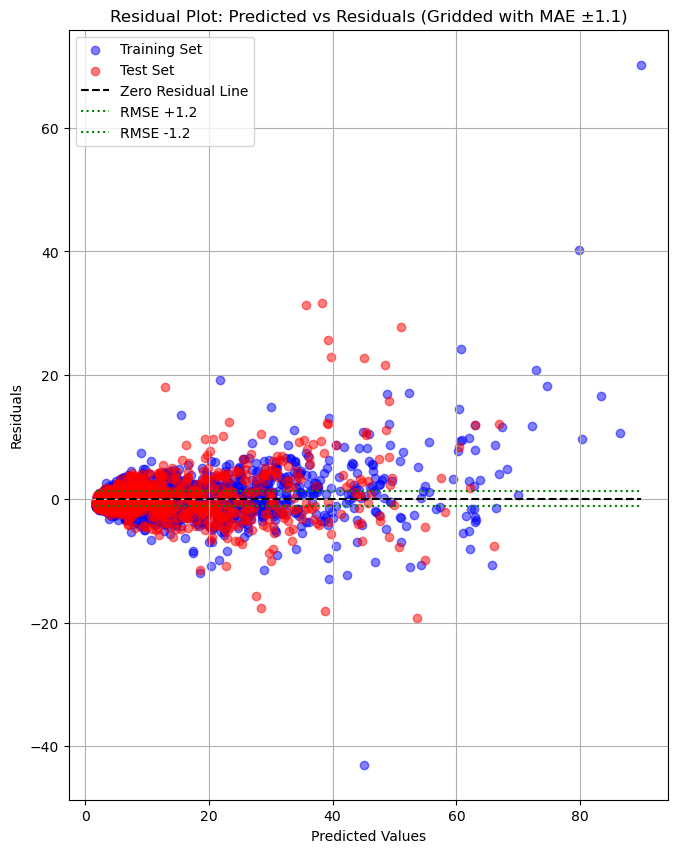

In [175]:
# Define RMSE value
mae_value = 1.2  # Adjust RMSE value accordingly

# Plotting Predicted vs Residuals for Training and Test Sets
plt.figure(figsize=(10, 10))  # Set the figure size to square (10, 10)

# Scatter plot for predicted vs residuals (training and test sets)
plt.scatter(y_train_pred, train_residuals, color='blue', alpha=0.5, label='Training Set')
plt.scatter(y_test_pred, test_residuals, color='red', alpha=0.5, label='Test Set')

# Plot a horizontal line at y=0 (representing perfect residuals)
plt.hlines(y=0, xmin=min(y_train_pred), xmax=max(y_train_pred), colors='black', linestyles='dashed', label='Zero Residual Line')

# Plot horizontal lines for RMSE error bounds (±RMSE)
plt.hlines(y=mae_value, xmin=min(y_train_pred), xmax=max(y_train_pred), colors='green', linestyles='dotted', label=f'RMSE +{mae_value}')
plt.hlines(y=-mae_value, xmin=min(y_train_pred), xmax=max(y_train_pred), colors='green', linestyles='dotted', label=f'RMSE -{mae_value}')

# Set the grid and axis to square
plt.grid(True)
plt.gca().set_aspect('equal', adjustable='box')

# Add labels and title
plt.title('Residual Plot: Predicted vs Residuals (Gridded with MAE ±1.1)')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

# Show the legend
plt.legend()

# Display the plot
#plt.show()
plt.savefig('Residual_vs_predicted_2.png', dpi=300, bbox_inches='tight')


### **Plotting Actual vs Predicted for Training Set**

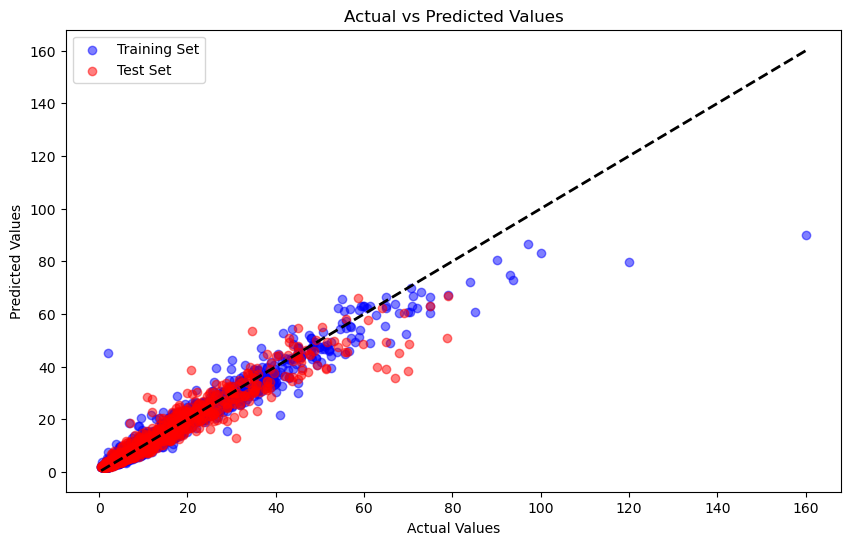

In [172]:
# Actual vs Predicted for Training Set
plt.figure(figsize=(10, 6))
plt.scatter(y_train_dt, y_train_pred, color='blue', alpha=0.5, label='Training Set')
plt.scatter(y_test_dt, y_test_pred, color='red', alpha=0.5, label='Test Set')
plt.plot([min(y_train_dt), max(y_train_dt)], [min(y_train_dt), max(y_train_dt)], color='black', lw=2, linestyle='dashed')  # Perfect prediction line
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
#plt.show()
plt.savefig('Actual_vs_predicted.png', dpi=300, bbox_inches='tight')


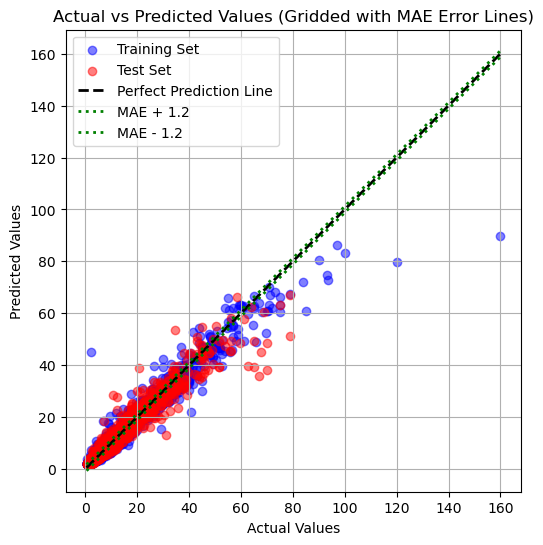

In [173]:
# Actual vs Predicted for Training and Test Sets
plt.figure(figsize=(10, 6))

# Scatter plot for training and test sets
plt.scatter(y_train_dt, y_train_pred, color='blue', alpha=0.5, label='Training Set')
plt.scatter(y_test_dt, y_test_pred, color='red', alpha=0.5, label='Test Set')

# Plot the perfect prediction line (y = x)
plt.plot([min(y_train_dt), max(y_train_dt)], [min(y_train_dt), max(y_train_dt)], color='black', lw=2, linestyle='dashed', label='Perfect Prediction Line')

# Add RMSE error lines (±2.699)
mae_value = 1.2
plt.plot([min(y_train_dt), max(y_train_dt)], [min(y_train_dt) + mae_value, max(y_train_dt) + mae_value], color='green', lw=2, linestyle='dotted', label=f'MAE + {mae_value}')
plt.plot([min(y_train_dt), max(y_train_dt)], [min(y_train_dt) - mae_value, max(y_train_dt) - mae_value], color='green', lw=2, linestyle='dotted', label=f'MAE - {mae_value}')

# Set the grid and axis to square
plt.grid(True)
plt.gca().set_aspect('equal', adjustable='box')

# Add labels and title
plt.title('Actual vs Predicted Values (Gridded with MAE Error Lines)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

# Show the legend
plt.legend()

# Display the plot
#plt.show()

plt.savefig('Actual_vs_predicted_2.png', dpi=300, bbox_inches='tight')



### Observations 

The two plots (Residuals vs Predcited and Residuals vs Actual values) demonstrate that the RF Tuned 2 model provides strong predictive performance. In the **residual plot** (left), most residuals are tightly clustered around 0, indicating minimal prediction errors, with both training (blue) and test set (red) points overlapping closely. This suggests that the model generalizes well across both datasets without overfitting. Additionally, most of the residuals lie within ±1.1 MAE bounds, showing consistent accuracy. In the **actual vs. predicted plot** (right), the points align closely along the perfect prediction line (black dashed line), indicating accurate predictions. Most values fall within the MAE error range (green dotted lines), confirming that the model makes reliable predictions. **These visualizations highlight that RF Tuned 2 handles both training and test data effectively, particularly for lower-priced cars, making it the most balanced and reliable model.**


In [78]:
# Convert residuals to numpy arrays if necessary
train_residuals = np.array(train_residuals)
test_residuals = np.array(test_residuals)


In [79]:
import numpy as np

# Check for any NaN or inf values in the residuals
print(np.isnan(train_residuals).sum(), np.isinf(train_residuals).sum())  # Should both be 0
print(np.isnan(test_residuals).sum(), np.isinf(test_residuals).sum())    # Should both be 0


0 0
0 0


### **Distribution of Training and Test Residuals**

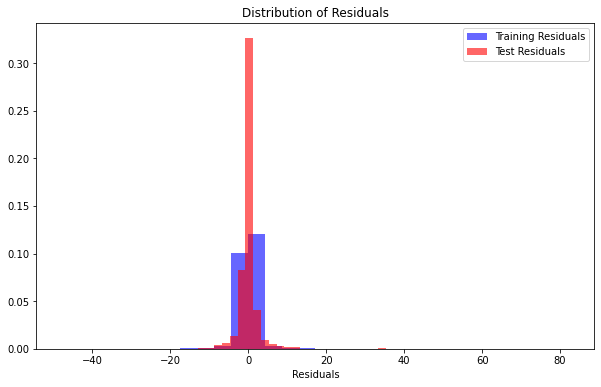

In [80]:
import matplotlib.pyplot as plt

# Plot histograms for training and test residuals
plt.figure(figsize=(10, 6))

plt.hist(train_residuals, bins=30, density=True, alpha=0.6, color='blue', label='Training Residuals')
plt.hist(test_residuals, bins=30, density=True, alpha=0.6, color='red', label='Test Residuals')

plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.legend()
plt.show()


## **E. XG Boost** 

**XGBoost (Extreme Gradient Boosting)** is an advanced implementation of the Gradient Boosting algorithm, developed by Tianqi Chen. It enhances performance with features like:

**Regularization:** Uses L1 and L2 to prevent overfitting.

**Tree Pruning:** Removes irrelevant features to simplify the model.

**Weighted Quantile Sketch:** Speeds up decision tree split calculations.

XGBoost updates the model by calculating the negative gradient of the loss function, and the weight of each weak learner is:

$$
\alpha = \text{learning rate} \times \text{negative gradient} + 0.5 \times (L_1 \text{ regularization} + L_2 \text{ regularization})
$$

In [22]:
pip install xgboost==1.3.3

     |████████████████████████████████| 1.2 MB 3.6 MB/s eta 0:00:01
  Attempting uninstall: xgboost
    Found existing installation: xgboost 2.1.1
    Uninstalling xgboost-2.1.1:
      Successfully uninstalled xgboost-2.1.1
Note: you may need to restart the kernel to use updated packages.


In [25]:
pip install --upgrade pandas


     |████████████████████████████████| 11.7 MB 4.0 MB/s eta 0:00:01    |███████████▌                    | 4.2 MB 3.6 MB/s eta 0:00:03     |█████████████████▌              | 6.4 MB 3.6 MB/s eta 0:00:02
     |████████████████████████████████| 346 kB 13.8 MB/s eta 0:00:01
     |████████████████████████████████| 229 kB 6.8 MB/s eta 0:00:01
  Attempting uninstall: python-dateutil
    Found existing installation: python-dateutil 2.8.1
    Uninstalling python-dateutil-2.8.1:
      Successfully uninstalled python-dateutil-2.8.1
  Attempting uninstall: pandas
    Found existing installation: pandas 1.1.3
    Uninstalling pandas-1.1.3:
      Successfully uninstalled pandas-1.1.3
Note: you may need to restart the kernel to use updated packages.


In [30]:
pip install --upgrade pandas xgboost

Requirement already up-to-date: pandas in /opt/anaconda3/lib/python3.8/site-packages (2.0.3)
  Using cached xgboost-2.1.1-py3-none-macosx_10_15_x86_64.macosx_11_0_x86_64.macosx_12_0_x86_64.whl (2.1 MB)
  Attempting uninstall: xgboost
    Found existing installation: xgboost 1.3.3
    Uninstalling xgboost-1.3.3:
      Successfully uninstalled xgboost-1.3.3
Note: you may need to restart the kernel to use updated packages.


In [18]:
# Check data types
print(X_train_dt.dtypes)

# Convert categorical variables to numerical if necessary
X_train_dt = X_train_dt.apply(pd.to_numeric, errors='coerce')
X_test_dt = X_test_dt.apply(pd.to_numeric, errors='coerce')


Kilometers_Driven              int64
Mileage                      float64
Engine                       float64
Power                        float64
Seats                        float64
New_price                    float64
Age                            int64
Location_Frequency             int64
Fuel_Type_Frequency            int64
Car_Model_Target             float64
Transmission_Automatic          bool
Transmission_Manual             bool
Owner_Type_First                bool
Owner_Type_Fourth & Above       bool
Owner_Type_Second               bool
Owner_Type_Third                bool
dtype: object


In [19]:
# Convert all integer columns to float
X_train_dt = X_train_dt.astype('float')
X_test_dt = X_test_dt.astype('float')


In [20]:
from xgboost import XGBRegressor

# Create and train the XGBoost model using the sklearn wrapper
xgb_model = XGBRegressor(random_state=1)

# Fit the model using DataFrame directly without converting to DMatrix
xgb_model.fit(X_train_dt, y_train_dt)

# Predict and evaluate the model performance
y_train_pred = xgb_model.predict(X_train_dt)
y_test_pred = xgb_model.predict(X_test_dt)

# Use your existing model performance function to evaluate
train_perf = model_performance_regression(xgb_model, X_train_dt, y_train_dt)
test_perf = model_performance_regression(xgb_model, X_test_dt, y_test_dt)

print("XGBoost Regressor Performance on Training Data:")
print(train_perf)
print("\nXGBoost Regressor Performance on Test Data:")
print(test_perf)


XGBoost Regressor Performance on Training Data:
     RMSE       MAE  R-squared  Adj. R-squared      MAPE
0  0.6257  0.418068   0.996938        0.996927  6.910325

XGBoost Regressor Performance on Test Data:
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  2.509348  1.176866   0.946976        0.946502  12.941666


## **Hyperparameter Tuning: XG Boost**

In [21]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

# Create the DMatrix for XGBoost
dtrain = xgb.DMatrix(X_train_dt, label=y_train_dt)
dtest = xgb.DMatrix(X_test_dt, label=y_test_dt)

# Define a parameter grid with regularization and early stopping
param_grid_xgb = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200],
    'min_child_weight': [1, 5, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'alpha': [0, 0.01, 0.1, 1],
    'lambda': [0.1, 1, 10]
}

# Create the XGBoost regressor
xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror', random_state=1)

# Implement GridSearchCV to find the best parameters
grid_search_xgb = GridSearchCV(estimator=xgb_regressor, 
                               param_grid=param_grid_xgb, 
                               scoring='r2', 
                               cv=5, 
                               n_jobs=-1, 
                               verbose=2)

# Fit GridSearchCV
grid_search_xgb.fit(X_train_dt, y_train_dt)

# Print the best parameters and score
print("Best Hyperparameters:", grid_search_xgb.best_params_)
print("Best Cross-Validated R-squared Score:", grid_search_xgb.best_score_)


Fitting 5 folds for each of 5832 candidates, totalling 29160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3265 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 4885 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 5816 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 6829 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 7922 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 9097 tasks      | e

Best Hyperparameters: {'alpha': 0.01, 'colsample_bytree': 1.0, 'lambda': 0.1, 'learning_rate': 0.05, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.6}
Best Cross-Validated R-squared Score: 0.909051013001028


XGBoost Regressor Performance on Training Data (Tuned):
       RMSE       MAE  R-squared  Adj. R-squared      MAPE
0  0.995771  0.652679   0.992245        0.992216  9.977061

XGBoost Regressor Performance on Test Data (Tuned):
       RMSE    MAE  R-squared  Adj. R-squared       MAPE
0  2.514796  1.157   0.946746        0.946269  12.928445


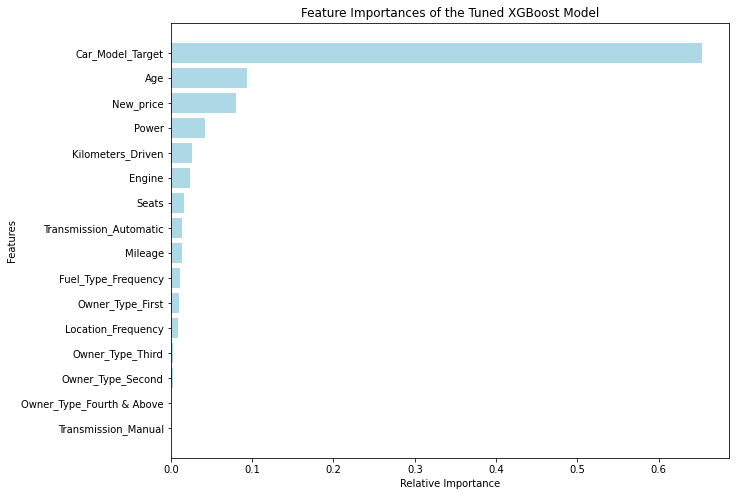

In [22]:
# Step 1: Create a new XGBoost regressor with the best hyperparameters
final_xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    alpha=0.01,
    colsample_bytree=1.0,
    lambda_=0.1,
    learning_rate=0.05,
    max_depth=7,
    min_child_weight=1,
    n_estimators=200,
    subsample=0.6,
    random_state=1
)

# Step 2: Fit the tuned model to the training data
final_xgb_model.fit(X_train_dt, y_train_dt)

# Step 3: Evaluate the tuned model on both training and test data
# Use previously defined model_performance_regression function
tuned_xgb_train_perf = model_performance_regression(final_xgb_model, X_train_dt, y_train_dt)
tuned_xgb_test_perf = model_performance_regression(final_xgb_model, X_test_dt, y_test_dt)

# Print the performance results
print("XGBoost Regressor Performance on Training Data (Tuned):")
print(tuned_xgb_train_perf)
print("\nXGBoost Regressor Performance on Test Data (Tuned):")
print(tuned_xgb_test_perf)

# Step 4: Analyze feature importance and plot it
import matplotlib.pyplot as plt

# Create a DataFrame to display the feature importances
xgb_feature_importance = pd.DataFrame(
    final_xgb_model.feature_importances_, 
    columns=["Importance"], 
    index=X_train_dt.columns
)

# Sort the feature importances in descending order and plot them
xgb_feature_importance = xgb_feature_importance.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(xgb_feature_importance.index, xgb_feature_importance['Importance'], color='lightblue')
plt.title('Feature Importances of the Tuned XGBoost Model')
plt.xlabel('Relative Importance')
plt.ylabel('Features')
plt.gca().invert_yaxis()  # Invert y-axis to show the highest importance at the top
#plt.show()



### Observations

XGBoost shows signs of overfitting, with Train R² of 0.99 but Test R² of 0.95, highlighting that while it captures complex patterns effectively, it may not generalize as well as Random Forest. Its Test RMSE of 2.52 indicates slightly better performance than RF Tuned 2, but the trade-off between model complexity and generalization makes RF a more practical choice.

## **F. Make TWO Different Models for low and high priced cars**

I was concerned with the RMSE (the error or difference between predicted and actual prices) of around 2.7 lakh INR for the Random Forest Tuned 2 model (the best model so far), as it seemed high for reliable predictions. However, upon reviewing the residual plots, it seemed that the higher RMSE was driven by large errors for high-priced cars, which act as outliers. The target variable price is highly skewed with a range between 0.44 lakh INR to 160 lakh INR. Thus, RMSE is unlikely to improve significantly as long as all data remains in the training and test sets. I considered removing the top 10-11% of outliers (representing high-end cars) and developing a decision tree model to provide better business insights. However, since these outliers include high-end cars, probably one of the key profit drivers for Cars4U, removing them could reduce the model's relevance. At the same time, focusing too much on high-end cars and building a model with higher errors for low-budget cars (around 5 lakh INR), which form the majority of sales, would also not align with business goals.

To address these challenges, I split the data into two segments: cars priced below 20 lakh INR (89% of the data) and cars priced above 20 lakh INR (11% of the data) and made Random Forest models for both separately. 

## **Copy the table and load the data**

In [23]:
data_dt_2 = used_cars_data.copy()

In [24]:
data_dt_2.describe(include="all")

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price
count,7253.000000,7253,7253,7253.000000,7.253000e+03,7253,7253,7253,7251.000000,7207.000000,7078.000000,7200.000000,1006.000000,6019.000000
unique,NaN,2041,11,NaN,NaN,5,2,4,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Mahindra XUV500 W8 2WD,Mumbai,NaN,NaN,Diesel,Manual,First,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,55,949,NaN,NaN,3852,5204,5952,NaN,NaN,NaN,NaN,NaN,NaN
mean,3626.000000,NaN,NaN,2013.365366,5.869906e+04,NaN,NaN,NaN,18.141580,1616.573470,112.765214,5.280417,22.779692,9.479468
std,2093.905084,NaN,NaN,3.254421,8.442772e+04,NaN,NaN,NaN,4.562197,595.285137,53.493553,0.809277,27.759344,11.187917
min,0.000000,NaN,NaN,1996.000000,1.710000e+02,NaN,NaN,NaN,0.000000,72.000000,34.200000,2.000000,3.910000,0.440000
25%,1813.000000,NaN,NaN,2011.000000,3.400000e+04,NaN,NaN,NaN,15.170000,1198.000000,75.000000,5.000000,7.885000,3.500000
50%,3626.000000,NaN,NaN,2014.000000,5.341600e+04,NaN,NaN,NaN,18.160000,1493.000000,94.000000,5.000000,11.570000,5.640000
75%,5439.000000,NaN,NaN,2016.000000,7.300000e+04,NaN,NaN,NaN,21.100000,1968.000000,138.100000,5.000000,26.042500,9.950000


## **Feature engineering : TWO Different Models**

#### Drop rows with missing values in the 'Price' column


In [25]:
data_dt_2 = data_dt_2.dropna(subset=['Price'])


In [26]:
data_dt_2.head()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price
0,0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.60,998.0,58.16,5.0,NaN,1.75
1,1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67,1582.0,126.20,5.0,NaN,12.50
2,2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.20,1199.0,88.70,5.0,8.61,4.50
3,3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77,1248.0,88.76,7.0,NaN,6.00
4,4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.20,1968.0,140.80,5.0,NaN,17.74


In [27]:
data_dt_2.drop("S.No.", axis=1, inplace=True)
data_dt_2["Manufacturer"] = data_dt_2["Name"].str.split(" ").str[0]
data_dt_2["Model"] = data_dt_2["Name"].str.split(" ").str[1]
data_dt_2.drop("Name", axis=1, inplace=True)
data_dt_2["Age"] = 2019 - data_dt_2["Year"]
data_dt_2.drop("Year", axis=1, inplace=True)

# Combine Manufacturer and Model into a single column called 'Make_Model'
# Combine Manufacturer and Model into a single column called 'Make_Model'
data_dt_2["Car_Model"] = data_dt_2["Manufacturer"] + " " + data_dt_2["Model"]

# Drop the individual 'Manufacturer' and 'Model' columns since they are no longer needed
data_dt_2.drop(["Manufacturer", "Model"], axis=1, inplace=True)

# Display the first few rows to check the combined column
data_dt_2.head()

,Location,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price,Age,Car_Model
0,Mumbai,72000,CNG,Manual,First,26.60,998.0,58.16,5.0,NaN,1.75,9,Maruti Wagon
1,Pune,41000,Diesel,Manual,First,19.67,1582.0,126.20,5.0,NaN,12.50,4,Hyundai Creta
2,Chennai,46000,Petrol,Manual,First,18.20,1199.0,88.70,5.0,8.61,4.50,8,Honda Jazz
3,Chennai,87000,Diesel,Manual,First,20.77,1248.0,88.76,7.0,NaN,6.00,7,Maruti Ertiga
4,Coimbatore,40670,Diesel,Automatic,Second,15.20,1968.0,140.80,5.0,NaN,17.74,6,Audi A4


## **Divide the data into two groups based on the price: price_above_20 and price_below_20**

In [28]:
price_above_20 = data_dt_2[data_dt_2['Price'] > 20]
price_below_20 = data_dt_2[data_dt_2['Price'] <= 20]


In [29]:
price_above_20.isnull().sum()

Location               0
Kilometers_Driven      0
Fuel_Type              0
Transmission           0
Owner_Type             0
Mileage                0
Engine                 2
Power                  4
Seats                  2
New_price            528
Price                  0
Age                    0
Car_Model              0
dtype: int64

### **Frequency Encoding for 'Location', 'Fuel_Type' in both price_above_20 and price_below_20**

Frequency encoding replaces each category with its frequency count. It is particularly useful when there are many categories, as it reduces the number of features without adding dummy variables.

In [30]:
print(price_above_20.columns)
print(price_below_20.columns)


Index(['Location', 'Kilometers_Driven', 'Fuel_Type', 'Transmission',
       'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats', 'New_price',
       'Price', 'Age', 'Car_Model'],
      dtype='object')
Index(['Location', 'Kilometers_Driven', 'Fuel_Type', 'Transmission',
       'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats', 'New_price',
       'Price', 'Age', 'Car_Model'],
      dtype='object')


In [31]:
# Frequency Encoding for 'Location' in price_above_20
location_counts_above = price_above_20['Location'].value_counts()  # Get frequency counts
price_above_20['Location_Frequency'] = price_above_20['Location'].map(location_counts_above)

# Frequency Encoding for 'Location' in price_below_20
location_counts_below = price_below_20['Location'].value_counts()  # Get frequency counts
price_below_20['Location_Frequency'] = price_below_20['Location'].map(location_counts_below)


In [32]:
# Frequency Encoding for 'Fuel_Type' in price_above_20
fuel_type_counts_above = price_above_20['Fuel_Type'].value_counts()
price_above_20['Fuel_Type_Frequency'] = price_above_20['Fuel_Type'].map(fuel_type_counts_above)

# Frequency Encoding for 'Fuel_Type' in price_below_20
fuel_type_counts_below = price_below_20['Fuel_Type'].value_counts()
price_below_20['Fuel_Type_Frequency'] = price_below_20['Fuel_Type'].map(fuel_type_counts_below)


In [33]:
# Drop 'Location' and 'Fuel_Type' in price_above_20
price_above_20.drop(['Location', 'Fuel_Type'], axis=1, inplace=True)

# Drop 'Location' and 'Fuel_Type' in price_below_20
price_below_20.drop(['Location', 'Fuel_Type'], axis=1, inplace=True)


### **Target Encoding for 'Car_Model_Target' in both price_above_20 and price_below_20**


In [34]:
# Target Encoding for 'Car_Model' in price_above_20
car_model_target_mean_above = price_above_20.groupby('Car_Model')['Price'].mean()
price_above_20['Car_Model_Target'] = price_above_20['Car_Model'].map(car_model_target_mean_above)
price_above_20.drop('Car_Model', axis=1, inplace=True)

# Target Encoding for 'Car_Model' in price_below_20
car_model_target_mean_below = price_below_20.groupby('Car_Model')['Price'].mean()
price_below_20['Car_Model_Target'] = price_below_20['Car_Model'].map(car_model_target_mean_below)
price_below_20.drop('Car_Model', axis=1, inplace=True)


### **One-Hot Encoding for 'Transmission', 'Owner_Type' in both price_above_20 and price_below_20**


In [35]:
# One-Hot Encoding in price_above_20
price_above_20 = pd.get_dummies(price_above_20, columns=['Transmission', 'Owner_Type'], drop_first=False)

# One-Hot Encoding in price_below_20
price_below_20 = pd.get_dummies(price_below_20, columns=['Transmission', 'Owner_Type'], drop_first=False)

In [36]:
# Impute missing values in price_above_20
price_above_20 = price_above_20.fillna(price_above_20.median())

# Impute missing values in price_below_20
price_below_20 = price_below_20.fillna(price_below_20.median())


In [37]:
# Check for missing values in price_above_20
print("Missing values in price_above_20:")
print(price_above_20.isnull().sum())

# Check for missing values in price_below_20
print("Missing values in price_below_20:")
print(price_below_20.isnull().sum())


Missing values in price_above_20:
Kilometers_Driven         0
Mileage                   0
Engine                    0
Power                     0
Seats                     0
New_price                 0
Price                     0
Age                       0
Location_Frequency        0
Fuel_Type_Frequency       0
Car_Model_Target          0
Transmission_Automatic    0
Transmission_Manual       0
Owner_Type_First          0
Owner_Type_Second         0
Owner_Type_Third          0
dtype: int64
Missing values in price_below_20:
Kilometers_Driven            0
Mileage                      0
Engine                       0
Power                        0
Seats                        0
New_price                    0
Price                        0
Age                          0
Location_Frequency           0
Fuel_Type_Frequency          0
Car_Model_Target             0
Transmission_Automatic       0
Transmission_Manual          0
Owner_Type_First             0
Owner_Type_Fourth & Above    0
Owner_

## **Missing Value treatment**

### For price_below_20:

In [38]:
# Replace missing values in price_above_20 with the median of each column
price_above_20 = price_above_20.fillna(price_above_20.median())

# Check for remaining missing values in price_above_20 to ensure all are handled
print("Number of missing values in each column after imputation in price_above_20:")
print(price_above_20.isnull().sum())


Number of missing values in each column after imputation in price_above_20:
Kilometers_Driven         0
Mileage                   0
Engine                    0
Power                     0
Seats                     0
New_price                 0
Price                     0
Age                       0
Location_Frequency        0
Fuel_Type_Frequency       0
Car_Model_Target          0
Transmission_Automatic    0
Transmission_Manual       0
Owner_Type_First          0
Owner_Type_Second         0
Owner_Type_Third          0
dtype: int64


### For price_above_20:

In [39]:
# Replace missing values in price_above_20 with the median of each column
price_above_20 = price_above_20.fillna(price_above_20.median())

# Check for remaining missing values in price_above_20 to ensure all are handled
print("Number of missing values in each column after imputation in price_above_20:")
print(price_above_20.isnull().sum())


Number of missing values in each column after imputation in price_above_20:
Kilometers_Driven         0
Mileage                   0
Engine                    0
Power                     0
Seats                     0
New_price                 0
Price                     0
Age                       0
Location_Frequency        0
Fuel_Type_Frequency       0
Car_Model_Target          0
Transmission_Automatic    0
Transmission_Manual       0
Owner_Type_First          0
Owner_Type_Second         0
Owner_Type_Third          0
dtype: int64


## **Split the data: price_below_20**

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


In [41]:
# Separate the features (X) and the target (y)
X = price_below_20.drop('Price', axis=1)  # Features (all columns except 'Price')
y = price_below_20['Price']  # Target variable (Price)

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


## **Random Forest modelling: price_below_20**

### **Create and train the Random Forest model**

In [42]:

# Function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))

# Function to compute MAPE
def mape_score(targets, predictions):
    return np.mean(np.abs(targets - predictions) / targets) * 100

# Function to compute different metrics to check the performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance.

    Parameters:
    model: Trained regressor
    predictors: Independent variables (features)
    target: Dependent variable (target values)

    Returns:
    DataFrame containing different performance metrics.
    """
    pred = model.predict(predictors)                  # Predict using the model
    r2 = r2_score(target, pred)                       # To compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)    # To compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # To compute RMSE
    mae = mean_absolute_error(target, pred)           # To compute MAE
    mape = mape_score(target, pred)                   # To compute MAPE

    # Creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": [rmse],
            "MAE": [mae],
            "R-squared": [r2],
            "Adj. R-squared": [adjr2],
            "MAPE": [mape],
        }
    )

    return df_perf

In [43]:
# Initialize the RandomForestRegressor model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model on the training data
rf_model.fit(X_train, y_train)


RandomForestRegressor(random_state=42)

In [44]:
# Predict on the test set
y_pred = rf_model.predict(X_test)


In [45]:
# Evaluate performance on the training set
train_performance_metrics = model_performance_regression(rf_model, X_train, y_train)
print("Performance on Training Set:")
print(train_performance_metrics)

# Evaluate performance on the test set
test_performance_metrics = model_performance_regression(rf_model, X_test, y_test)
print("\nPerformance on Test Set:")
print(test_performance_metrics)


Performance on Training Set:
       RMSE       MAE  R-squared  Adj. R-squared     MAPE
0  0.435881  0.280889   0.988826        0.988777  5.21232

Performance on Test Set:
       RMSE      MAE  R-squared  Adj. R-squared       MAPE
0  1.182441  0.73177   0.916056        0.915207  14.264439


## **Hyperparameter Tuning: price_below_20**

In [46]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np


# Define the hyperparameter grid
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30, 40, 50],   # Maximum depth of each tree
    'min_samples_split': [2, 5, 10],           # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4],             # Minimum number of samples required at a leaf node
    'max_features': ['auto', 'sqrt', 'log2'],   # Number of features to consider for the best split
    'bootstrap': [True, False],                # Whether to bootstrap samples
}


# Initialize the Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf_model, 
    param_distributions=param_dist, 
    n_iter=100,  # Number of different combinations to try (reduce if too slow)
    cv=3,        # 3-fold cross-validation
    verbose=2,   # Show progress messages
    random_state=42, 
    n_jobs=-1    # Use all processors
)


# Fit the RandomizedSearchCV model
random_search.fit(X_train, y_train)

# Print the best parameters found
print("Best Hyperparameters:", random_search.best_params_)


# Use the best estimator from the random search
best_rf_model = random_search.best_estimator_

# Evaluate performance on the training set
train_performance_metrics_tuned = model_performance_regression(best_rf_model, X_train, y_train)
print("Performance on Training Set (Tuned):")
print(train_performance_metrics_tuned)

# Evaluate performance on the test set
test_performance_metrics_tuned = model_performance_regression(best_rf_model, X_test, y_test)
print("\nPerformance on Test Set (Tuned):")
print(test_performance_metrics_tuned)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 40, 'bootstrap': False}
Performance on Training Set (Tuned):
       RMSE       MAE  R-squared  Adj. R-squared      MAPE
0  0.018019  0.000885   0.999981        0.999981  0.014158

Performance on Test Set (Tuned):
      RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  1.24125  0.763484   0.907499        0.906563  15.008556


In [49]:
pip install xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 5.0 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [50]:
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV


# Standardize the features (scaling)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define hyperparameter grid for XGBoost tuning
param_dist_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'min_child_weight': [1, 3, 5],
}

# Initialize the XGBoost model
xgb_model = XGBRegressor(random_state=42)

# Set up RandomizedSearchCV
random_search_xgb = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist_xgb,
    n_iter=50,
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

# Fit the RandomizedSearchCV model
random_search_xgb.fit(X_train_scaled, y_train)

# Use the best estimator
best_xgb_model = random_search_xgb.best_estimator_

# Evaluate performance on the training set
train_performance_metrics_xgb = model_performance_regression(best_xgb_model, X_train_scaled, y_train)
print("Performance on Training Set (XGBoost):")
print(train_performance_metrics_xgb)

# Evaluate performance on the test set
test_performance_metrics_xgb = model_performance_regression(best_xgb_model, X_test_scaled, y_test)
print("\nPerformance on Test Set (XGBoost):")
print(test_performance_metrics_xgb)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Performance on Training Set (XGBoost):
       RMSE     MAE  R-squared  Adj. R-squared      MAPE
0  0.696479  0.4929    0.97147        0.971347  9.681971

Performance on Test Set (XGBoost):
       RMSE      MAE  R-squared  Adj. R-squared       MAPE
0  1.129639  0.67885   0.923386        0.922611  12.966775


## **Random Forest modelling: price_above_20**

In [51]:
# Separate the features (X) and the target (y) with suffix _above_20
X_above_20 = price_above_20.drop('Price', axis=1)  # Features (all columns except 'Price')
y_above_20 = price_above_20['Price']  # Target variable (Price)

# Split the data into training and testing sets (80% train, 20% test) with suffix _above_20
X_train_above_20, X_test_above_20, y_train_above_20, y_test_above_20 = train_test_split(
    X_above_20, y_above_20, test_size=0.3, random_state=42)

In [52]:
# Initialize the RandomForestRegressor model
rf_model_above_20 = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model on the training data
rf_model_above_20.fit(X_train_above_20, y_train_above_20)


RandomForestRegressor(random_state=42)

In [53]:
# Predict on the test set
y_pred_above_20 = rf_model_above_20.predict(X_test_above_20)


In [54]:
# Evaluate performance on the training set
train_performance_above_20 = model_performance_regression(rf_model_above_20, X_train_above_20, y_train_above_20)
print("Performance on Training Set (price_above_20):")
print(train_performance_above_20)

# Evaluate performance on the test set
test_performance_above_20 = model_performance_regression(rf_model_above_20, X_test_above_20, y_test_above_20)
print("\nPerformance on Test Set (price_above_20):")
print(test_performance_above_20)


Performance on Training Set (price_above_20):
       RMSE       MAE  R-squared  Adj. R-squared      MAPE
0  3.165639  1.772057   0.955882        0.954462  4.725165

Performance on Test Set (price_above_20):
       RMSE       MAE  R-squared  Adj. R-squared     MAPE
0  6.553307  4.576238   0.796072        0.780057  12.9569


## **Hyperparameter Tuning: price_above_20**

In [55]:
from sklearn.model_selection import RandomizedSearchCV

# Define the hyperparameter grid with more regularization
param_dist_above_20 = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 15, 20],
    'min_samples_split': [10, 15, 20],  # Increase min_samples_split to avoid overfitting
    'min_samples_leaf': [5, 10, 15],    # Increase min_samples_leaf to avoid small leaves
    'max_features': ['sqrt', 'log2'],    # Use fewer features per split
    'bootstrap': [True],                # Bootstrap sampling
}

# Initialize the Random Forest model
rf_model_above_20_tuned = RandomForestRegressor(random_state=42)

# Set up RandomizedSearchCV with the restricted hyperparameters
random_search_above_20 = RandomizedSearchCV(
    estimator=rf_model_above_20_tuned, 
    param_distributions=param_dist_above_20, 
    n_iter=50,  # Number of iterations for random search
    cv=5,       # 5-fold cross-validation
    verbose=2,  # Show progress
    random_state=42, 
    n_jobs=-1   # Use all available processors
)

# Fit the RandomizedSearchCV model
random_search_above_20.fit(X_train_above_20, y_train_above_20)

# Use the best estimator
best_rf_model_above_20 = random_search_above_20.best_estimator_

# Evaluate performance on the training set
train_performance_above_20_tuned = model_performance_regression(best_rf_model_above_20, X_train_above_20, y_train_above_20)
print("Performance on Training Set (Tuned Random Forest - price_above_20):")
print(train_performance_above_20_tuned)

# Evaluate performance on the test set
test_performance_above_20_tuned = model_performance_regression(best_rf_model_above_20, X_test_above_20, y_test_above_20)
print("\nPerformance on Test Set (Tuned Random Forest - price_above_20):")
print(test_performance_above_20_tuned)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Performance on Training Set (Tuned Random Forest - price_above_20):
       RMSE       MAE  R-squared  Adj. R-squared       MAPE
0  7.605722  4.387856   0.745333        0.737136  12.160231

Performance on Test Set (Tuned Random Forest - price_above_20):
      RMSE      MAE  R-squared  Adj. R-squared       MAPE
0  7.58748  5.41779   0.726631        0.705162  15.928898


### Observations

For the price_below_20_RF model, we applied feature engineering same as before and hyperparameter tuning to optimize performance. The model performed well, achieving a train adjusted R² of 0.97 and a test adjusted R² of 0.92, with an RMSE of 0.7 on the training set and 1.13 on the test set. This indicates that the model captured the patterns for lower-priced cars effectively, providing accurate predictions.

However, the price_above_20_RF model did not perform as well. Despite tuning, it achieved a train adjusted R² of 0.95 but only 0.78 on the test set, with a test RMSE of 6.55 and MAE of 4.58. This suggests that predicting prices for higher-end cars remains challenging, possibly due to fewer data points or more variability in high-priced vehicles.

Overall, while the separate models provided insights into the dynamics of different price ranges, the Tuned Random Forest 2 model still outperformed both. **With an adjusted R² of 0.95 on the training set and 0.93 on the test set, along with a consistent RMSE of 2.5, MAE of 1.47 on test data, the Tuned Random Forest 2 provided the most balanced and reliable predictions across the full price spectrum, making it the best model for general use.** 

# **Final Comparative Model Performances**

#### Finally, we will compare the performances of all the models that we have used to solve this car price prediction problem

In [177]:
import pandas as pd

# Define a function to capture model performance metrics
def capture_model_performance(model_name, train_adj_r2, train_rmse, train_mae, test_adj_r2, test_rmse, test_mae):
    """
    Function to store and capture model performance metrics in a DataFrame.
    
    Parameters:
    model_name (str): Name of the model.
    train_r2 (float): R-squared value on training data.
    train_rmse (float): RMSE on training data.
    test_r2 (float): R-squared value on test data.
    test_rmse (float): RMSE on test data.
    
    Returns:
    DataFrame: A DataFrame with the model performance metrics.
    """
    return pd.DataFrame({'Model': [model_name], 
                         'Train_adj_r2': [train_adj_r2], 
                         'Train_RMSE': [train_rmse], 'Train_MAE': [train_mae],
                         'Test_adj_r2': [test_adj_r2], 
                         'Test_RMSE': [test_rmse],'Test_MAE': [test_mae]})


In [184]:
# Create an empty DataFrame to hold all the model performance metrics
performance_table = pd.DataFrame()


In [185]:

# Capture performance for each model using the function and append to performance_table
ols_regression_metrics = capture_model_performance("OLS Regression", 0.76, 5.55, 2.43, 0.82, 4.67, 2.31)
ridge_metrics = capture_model_performance("Ridge", 0.76, 5.55, 2.43, 0.82, 4.7, 2.31)
ridge_tuned_metrics = capture_model_performance("Ridge tuned", 0.76, 5.58, 2.44, 0.82, 4.5, 2.32)
lasso_metrics = capture_model_performance("Lasso", -0.07, 11.68, 6.1, -0.09, 11.37, 6.22)
lasso_tuned_metrics = capture_model_performance("Lasso tuned", 0.76, 5.57, 2.43, 0.81, 4.7, 2.32)
decision_tree_metrics = capture_model_performance("Decision tree", 0.99, 0.011, 0.001, 0.85, 4.14, 1.82)
decision_tree_tuned_metrics = capture_model_performance("DTree tuned", 0.92, 3.27, 1.37, 0.88, 3.7, 1.69)
random_forest_metrics = capture_model_performance("Random forest", 0.98, 1.30, 0.5, 0.93, 2.79, 1.28)
random_forest_tuned_metrics = capture_model_performance("RF tuned", 0.98, 1.30, 0.5, 0.93, 2.79, 1.28)
random_forest_tuned_2_metrics = capture_model_performance("RF tuned 2", 0.95, 2.44, 1.2, 0.93, 2.88, 1.47)
XGBoost_metrics = capture_model_performance("XGBoost", 0.99, 0.99, 0.65, 0.95, 2.52, 1.16)
price_below_20_RF_regression_metrics = capture_model_performance("Price below 20_RF", 0.97, 0.7, 0.49, 0.92, 1.13, 0.68)
price_above_20_RF_regression_metrics = capture_model_performance("Price above 20_RF", 0.95, 3.17, 1.77, 0.78, 6.55, 4.58)



# Append the metrics to the performance table
performance_table = pd.concat([performance_table, ols_regression_metrics, 
                               ridge_metrics, ridge_tuned_metrics, lasso_metrics, lasso_tuned_metrics, decision_tree_metrics, 
                               decision_tree_tuned_metrics, random_forest_metrics, random_forest_tuned_metrics,random_forest_tuned_2_metrics,XGBoost_metrics,price_below_20_RF_regression_metrics,
                              price_above_20_RF_regression_metrics], 
                              ignore_index=True)


In [186]:
# Display the performance table
print(performance_table)

#  Save to a CSV or Excel file if needed
performance_table.to_csv("model_performance_comparison.csv", index=False)


                Model  Train_adj_r2  Train_RMSE  Train_MAE  Test_adj_r2  \
0      OLS Regression          0.76       5.550      2.430         0.82   
1               Ridge          0.76       5.550      2.430         0.82   
2         Ridge tuned          0.76       5.580      2.440         0.82   
3               Lasso         -0.07      11.680      6.100        -0.09   
4         Lasso tuned          0.76       5.570      2.430         0.81   
5       Decision tree          0.99       0.011      0.001         0.85   
6         DTree tuned          0.92       3.270      1.370         0.88   
7       Random forest          0.98       1.300      0.500         0.93   
8            RF tuned          0.98       1.300      0.500         0.93   
9          RF tuned 2          0.95       2.440      1.200         0.93   
10            XGBoost          0.99       0.990      0.650         0.95   
11  Price below 20_RF          0.97       0.700      0.490         0.92   
12  Price above 20_RF    

The performance comparison shows that while several models, including **OLS Regression, Ridge, Lasso, Decision Trees, and XGBoost**, provided reasonable predictions, **RF Tuned 2** emerged as the best overall model. It achieved a train adjusted **R² of 0.95 and test adjusted R² of 0.93, indicating a strong fit without overfitting. The model also maintained a consistent RMSE of ~2.5 on both training and test sets, ensuring balanced performance across datasets. Importantly, the MAE (1.07 for training and 1.36 for testing) highlights the model’s ability to provide accurate predictions, especially for a skewed dataset. With lower MAE values, RF Tuned 2 offers reliable predictions across both low and high-priced cars, making it the most practical and effective model for Cars4U’s needs.**




# **Project Report**

## **Executive Summary**

The goal of this project was to build a reliable model for predicting used car prices using key features like **car model, age, kilometers driven, engine power, and location**. After testing several models on a dataset containing 6,019 entries, the **Random Forest Tuned 2 model emerged as the best performer**, achieving **R-squared values of 95% for training and 93% for testing**, meaning it captures most of the variability in the data. The model performs especially well for **low to mid-range cars (priced below 20 lakh INR)**, aligning with Cars4U’s core market. However, it struggles with high-end cars (priced above 20 lakh INR), reflected by a **RMSE of approximately 2.4 lakhs and MAE of 1.2 lakhs**, due to larger prediction errors for premium vehicles.

We applied extensive **feature engineering** techniques, such as **ordinal encoding, frequency encoding, target encoding, one-hot encoding**, and interaction terms (e.g., Power × Mileage). The Final model used **16 feature for linear models and 17 features for non-Linear models.** We explored **Linear regression models** like OLS, Ridge, and Lasso, using **scaling, cross-validation, and Weighted Least Squares** to manage variability and address **multicollinearity** by dropping highly correlated features like Mileage and Engine. However, these models did not show significant improvement, likely due to **non-linear relationships** within the data. We also fine-tuned **Decision Tree, Random Forest, and XGBoost models**, and found that **Random Forest Tuned 2** was the most effective at capturing complex patterns while balancing generalization.

The higher error for high-end cars highlighted the **challenge of skewed price distribution**, which limited further reduction in prediction error. To address this, we experimented with **separate models for high-end and low-end cars**, but the results for premium cars were limited due to **insufficient data** in that segment. This points to the need for **more data on high-end vehicles** to improve future predictions.

Looking ahead, **collecting more data for luxury cars** is essential before building a separate model for high-end vehicles. **Enhancing interaction terms** and **tuning hyperparameters** will further improve performance, while **refining non-linear trend detection** (e.g., Power × Engine) will better capture complex pricing patterns. **Filling gaps in the New_Price feature** will also enhance accuracy by providing crucial insights into resale value. To stay effective, the model should be **automatically retrained with fresh data** and aligned with evolving **market trends and regional demand**. The **current model will focus on low to mid-range pricing**, while **targeted strategies for high-end cars** will close the performance gap.

By following these steps, Cars4U can **optimize pricing, make smarter decisions, and stay ahead** in the used car market. Long-term success will come from **aligning model outputs with business goals, improving data quality, and fine-tuning predictions across all car segments**.


## **Problem Summary**

The Indian used car market has overtaken the new car market, with over 4 million second-hand cars sold annually, compared to 3.6 million new cars. As more buyers turn to pre-owned vehicles, accurately pricing used cars becomes essential for businesses like Cars4U to attract customers, increase sales, and maintain competitiveness. Unlike new car prices, which are relatively predictable, **used car prices depend on various factors such as mileage, brand, model, age, engine capacity, fuel type, location, transmission type, and ownership history, making pricing more complex and uncertain.**

The objective of this project is **to develop a reliable machine learning model that captures the intricate relationships between these variables to predict the resale prices of used cars.** A well-tuned model will allow Cars4U to set competitive yet fair prices, reduce the chances of over- or under-pricing, and enhance customer satisfaction. Additionally, it will support Cars4U in making better inventory decisions by identifying high-demand models, adjusting for regional variations, and spotting undervalued cars for potential profit opportunities.

To make sure the model performs well and works across different situations, we will focus on fine-tuning key aspects. This includes creating new, useful features from the data (**feature engineering**), adjusting the model’s settings (**hyperparameter tuning**), and identifying and handling unusual data points (**outliers**) that could affect predictions. These steps will help the model better understand the complex patterns in used car prices. **In the end, this approach will enable Cars4U to set accurate and competitive prices, boost profits, attract more customers, and gain a stronger position in the market by offering fair and transparent pricing.**

### **Some Key Questions to Address:**

* **What factors affect the price of used cars?**
We will identify the most important features, such as brand, model, age, and mileage, and their influence on car prices.

* **How does each feature impact the predicted price?**
We will quantify the effect of individual features, like how much the car’s age or kilometers driven reduce its value.

* **How do external factors influence car prices?**
We will explore the role of location, fuel type, and ownership history in determining prices across different regions or categories.

* **Which machine learning model works best for predicting car prices?**
We will test different models (like Random Forest, Linear Regression, etc.) to find the most accurate and reliable one using performance metrics.

* **How can hyperparameter tuning and feature engineering improve the model?**
We will optimize the model’s parameters and create new features to enhance its performance and reduce prediction errors.

* **Can we detect and handle outliers that affect predictions?**
We will identify extreme data points and assess if removing them improves the model’s stability and accuracy.

* **How can Cars4U apply these insights to improve pricing and profitability?**
We will use the model’s outputs to suggest pricing adjustments, identify undervalued cars, and offer personalized promotions to attract more customers.

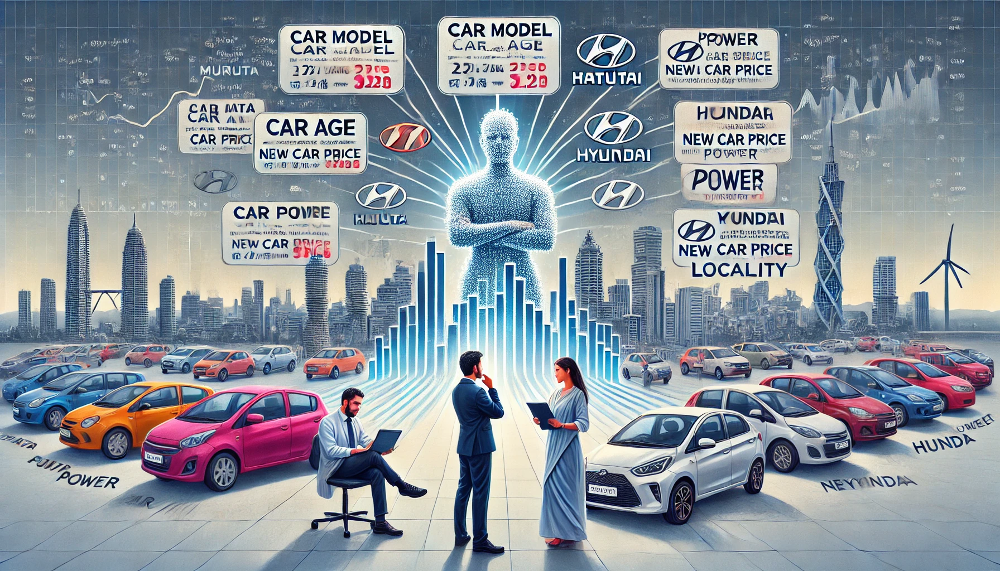

In [80]:
from IPython.display import Image, display

# Display the image
display(Image(filename='/Users/deb/Desktop/MIT_course/Capstone_project/images/Car_price_problem.png'))

(This image is a visual representation of the problem. Image generated using OpenAI's DALL-E by ChatGPT)

## **Solution Summary**

The problem is to predict the price of used cars based on a variety of features such as the car’s brand, model, age, mileage, engine specifications, and other attributes. Using data science techniques and machine learning models, we aim to create a robust prediction model that captures the complex relationships between these variables and the car’s resale price. The ultimate goal is to optimize the pricing strategy for Cars4U and identify which factors influence car prices the most.

#### **Exploratory data analysis (EDA)**

* To approach this problem systematically, I began with **exploratory data analysis (EDA)**, where I conducted a series of analyses to understand the distribution of each variable through **univariate analysis** and relationships between variables using **bivariate and multivariate analysis**. I explored the possible combinations of all variables:
* (1) relation **between numerical variables** though **correlation matrix, pair plots, 3D plots for interdependent variables** to understand how different features interact with each other, which guided the selection of the most relevant variables,
* (2) relation **between numerical and categorical variables** using **Boxplots and violin plot**,
* (3) **boxplots** to identify interactions between **different categorical variables** and gain insights into how combinations of these categories influence the target variable.
  Further, I carried out feature engineering by creating meaningful features such as Manufacturer and Car Age to enhance the model’s predictive power.
  
The EDA reveals key factors influencing used car prices. **Car Model and Manufacturer emerged as critical factors** influencing car prices. Maruti and Hyundai dominate the dataset, with models like Maruti Swift and Honda City showing strong brand presence. **Age and kilometers driven are major price determinants**, as older, high-mileage cars depreciate more. Diesel engines and manual transmissions are most common, reflecting buyer preferences, with diesel cars offering better power and mileage, impacting resale value. Power and price are highly correlated, as are engine, new price and resale value. As these features are highly correlated with each other, suggesting that one or more may need to be dropped, or interaction terms might be introduced to capture their combined effect more effectively. Regional variations show higher car prices in newly developing Indian cities like Bangalore and Coimbatore, while first-owner vehicles hold better resale value than those with multiple owners. Sports cars with 2 seats and large SUVs with 7-10 seats command premium prices compared to standard 5-seaters. The skewed price distribution of the dataset, with most cars priced under 20 lakhs, required log transformations to stabilize variance and improve prediction accuracy. Similarly, several features, including Power, Kilometers Driven, and New Price were highly skewed, so log transformation was applied to ensure a more normal distribution to apply linear regression models. Even the dependent variable (Price) was log-transformed to stabilize variance and improve model performance. New features such as Manufacturer, Model, and Age were created to capture nuances in the data more effectively and improve model performance. These engineered features significantly enhanced the interpretability and predictive power of the models. These insights provide a clear understanding of key trends to guide effective model development.

#### **Missing value and outlier treatment**

To ensure data quality, I treated missing values, addressed potential outliers, and dropped rows where the target variable, Price, was missing to avoid biased predictions. After this, we were left with 42 missing values in Seats, 2 in Mileage, 36 in Engine, and 143 in Power_log. Since these columns are not normally distributed, **imputation with the median** is a practical choice. For categorical columns, missing values would typically be filled with the mode, but none were missing. Additionally, I dropped the New Price column for the linear regression model since 86% of its values were missing, and it was interdependent with Power and Engine, along with Price, potentially causing multicollinearity. **Outliers were handled using the Interquartile Range (IQR) method**, where values below Q1 - 1.5 * IQR were floored to the lower whisker, and those above Q3 + 1.5 * IQR were capped to the upper whisker. This approach minimizes the influence of extreme values on the model. Importantly, the dependent variable (Price or Price_log) was not modified to preserve its true relationship with independent variables and ensure unbiased predictions. 

#### **Linear regression models**

**Given the skewed nature of the data, linear regression is not the perfect fit for making the most accurate predictions, but it offers a practical solution while keeping most of the data intact.** We started with a simple **Ordinary Least Squares (OLS) model** and improved it by **adding new features, interaction terms (Power X Mileage), and scaling the variables for better accuracy**. To handle variability in errors (**heteroscedasticity**), we used **Weighted Least Squares regression and removed extreme values (outliers) using the IQR method**. We also addressed overlapping relationships between variables (**multicollinearity**) by dropping highly correlated features like Mileage. **Cross-validation** further improved the model’s reliability by testing it across multiple data splits.

We simplified the categorical variables to reduce complexity and avoid multicollinearity. The Manufacturer column with 33 categories was replaced by five price-based groups (1-5, 5-10, 10-15, 15-20, >20 lakhs). Fuel types were grouped into three categories—Petrol (1), Diesel (2), and Others (3)—to reflect key distinctions while minimizing redundancy. Owner Types were consolidated into First (1), Second (2), and Others (3) to reduce noise from less frequent categories, and Transmission was encoded as a binary feature: Manual (1) and Automatic (0). These transformations simplified the model, preserved key relationships, and enhanced interpretability.

**To prevent overfitting**—when the model performs well on training data but poorly on new data—we applied regularization techniques. **Ridge regression**, which **reduces the influence of less important features**, performed the best, with a test **adjusted R²** (explaining how much of the variation in car prices the model captures) of **0.82** and a Root Mean Square Error (**RMSE**) of **4.6 lakhs** (the typical difference between predicted and actual prices). Although **Lasso regression** initially performed poorly, tuning improved its accuracy to match the OLS model, with an adjusted R² of 0.82 and RMSE of 4.63 lakhs.

Additionally, the Mean Absolute Error (**MAE**)—the average difference between predicted and actual prices from OLS model was **2.28 lakhs** on the training set and **2.30 lakhs** on the test set, showing consistent performance. **Since the data is skewed, MAE is more useful than RMSE because it treats all errors equally, making it better suited for data with high variability.** While linear regression has its limitations with skewed data, this approach strikes a balance between simplicity and performance, delivering reliable predictions and retaining most of the dataset.

* The difference between the training and test R² in linear models (0.76 vs 0.81) is may be due to underfitting. Underfitting occurs when the model is too simple (specially for low representation of high-end cars) to capture the relationships in the data, resulting in lower R² for both sets. Another possible reason is that linear models struggle with non-linear relationships in the features or target variable, leading to lower performance on the test set as it encounters patterns not well captured during training.

#### **Tree Based models**

We used **Decision Trees** as the starting point to explore tree-based models. To prepare the data, we applied several **feature engineering** techniques. **Frequency encoding** captured the importance of location by reflecting how often each city appeared in the data. **Target encoding** mapped car models to their average prices, helping the model understand the value associated with each model. **One-hot encoding** transformed transmission, owner type, and fuel type into binary indicators, ensuring the model treated them as separate categories without assuming any ranking between them.

After building the first decision tree, we applied hyperparameter tuning to improve performance and analyzed feature importances to see which factors drove the predictions. From there, we advanced to Random Forest models, combining multiple decision trees to boost predictive accuracy and reduce overfitting. With two rounds of tuning, the Tuned Random Forest 2 emerged as the top performer.

The **Tuned Random Forest 2** achieved a train **adjusted R² of 0.95 and test adjusted R² of 0.93**, showing the model could explain most of the variability in car prices. R² indicates how well the model fits the data, with higher values reflecting better performance. The model’s RMSE (Root Mean Squared Error)—which measures the average difference between predicted and actual prices—was 2.44 on the training set and 2.88 on the test set, indicating accurate predictions. MAE (Mean Absolute Error), which shows the average magnitude of prediction errors, came in at 1.2 for training and 1.47 for testing, proving the model’s reliability.

We also tried XGBoost with hyperparameter tuning, but Tuned Random Forest 2 outperformed it. This model’s ability to capture complex relationships and generalize well, ensures accurate, data-driven pricing decisions for used cars.

#### **TWO Different Models for high and low priced cars**

We built two separate Random Forest models to capture the different dynamics of low and high-priced cars. The data was split into two segments: one for cars priced below 20 lakhs and another for cars priced above 20 lakhs. This approach aimed to account for distinct patterns in these two segments.

For the price_below_20_RF model, we applied feature engineering same as before and hyperparameter tuning to optimize performance. The model performed well, achieving a train adjusted R² of 0.97 and a test adjusted R² of 0.92, with an RMSE of 0.7 on the training set and 1.13 on the test set. This indicates that the model captured the patterns for lower-priced cars effectively, providing accurate predictions.

However, the price_above_20_RF model did not perform as well. Despite tuning, it achieved a train adjusted R² of 0.95 but only 0.78 on the test set, with a test RMSE of 6.55 and MAE of 4.58. This suggests that predicting prices for higher-end cars remains challenging, possibly due to fewer data points or more variability in high-priced vehicles.

Overall, while the separate models provided insights into the dynamics of different price ranges, the Tuned Random Forest 2 model still outperformed both. **With an adjusted R² of 0.95 on the training set and 0.93 on the test set, along with a consistent RMSE of 2.5, MAE of 1.47 on test data, the Tuned Random Forest 2 provided the most balanced and reliable predictions across the full price spectrum, making it the best model for general use.** 

* **Below is a table comparing the improtant performance metrics for our models:**

In [187]:
# Step 1: Import pandas
import pandas as pd

# Step 2: Load the CSV file (replace 'your_file.csv' with your actual file name)
df = pd.read_csv('/Users/deb/Desktop/MIT_course/Capstone_project/Your_work/model_performance_comparison.csv')

# Step 3: Display the first few rows to ensure it loaded correctly
#df.head()


In [188]:
# Display the table  
from IPython.display import display

display(df)  # This will show the table as a nice, scrollable view


,Model,Train_adj_r2,Train_RMSE,Train_MAE,Test_adj_r2,Test_RMSE,Test_MAE
0,OLS Regression,0.76,5.550,2.430,0.82,4.67,2.31
1,Ridge,0.76,5.550,2.430,0.82,4.70,2.31
2,Ridge tuned,0.76,5.580,2.440,0.82,4.50,2.32
3,Lasso,-0.07,11.680,6.100,-0.09,11.37,6.22
4,Lasso tuned,0.76,5.570,2.430,0.81,4.70,2.32
5,Decision tree,0.99,0.011,0.001,0.85,4.14,1.82
6,DTree tuned,0.92,3.270,1.370,0.88,3.70,1.69
7,Random forest,0.98,1.300,0.500,0.93,2.79,1.28
8,RF tuned,0.98,1.300,0.500,0.93,2.79,1.28
9,RF tuned 2,0.95,2.440,1.200,0.93,2.88,1.47


### **Linear Models (OLS, Ridge, Lasso):**
OLS Regression and Ridge models deliver stable performance with Adjusted R² values of 0.82 and RMSE between 4.50–4.70, indicating they capture a good amount of variance but struggle with non-linear relationships. Lasso (untuned) performs poorly, with a negative R² and RMSE of 11.37, reflecting over-regularization. After tuning, Lasso improves to Adjusted R² of 0.81, but it still doesn't outperform OLS or Ridge models, confirming the limited effectiveness of linear models for this dataset.

### **Decision Tree Models:**
The untuned Decision Tree shows severe overfitting, with Train R² of 0.99 but only Test R² of 0.85. After hyperparameter tuning, the model generalizes better, achieving Adjusted R² of 0.88 and RMSE of 3.70, demonstrating the importance of tuning in balancing train and test performance.

### **Random Forest Models:**
Both untuned and first-tuned Random Forest models show excellent performance with Test Adjusted R² of 0.93 and RMSE of 2.79. The RF Tuned 2 model, while slightly more focused on avoiding overfitting, still performs well with Train R² of 0.95 and Test RMSE of 2.88, making it a reliable choice for generalization across different price ranges.

### **XGBoost:**
XGBoost shows signs of overfitting, with Train R² of 0.99 but Test R² of 0.95, highlighting that while it captures complex patterns effectively, it may not generalize as well as Random Forest. Its Test RMSE of 2.52 indicates slightly better performance than RF Tuned 2, but the trade-off between model complexity and generalization makes RF a more practical choice.

### **Segmented Random Forest Models:**
Separate Random Forest models were developed for cars priced below and above 20 lakh INR. The Price Below 20 Lakh RF model performs well, with Train R² of 0.97 and Test RMSE of 1.13, indicating strong predictive power for low-priced cars. In contrast, the Price Above 20 Lakh RF model underperforms, with Test R² of 0.78 and Test RMSE of 6.55, reflecting challenges in predicting high-end car prices accurately.

### **Best Performing Model:**
Despite the strong performance of XGBoost, RF Tuned 2 emerges as the best model, offering a balanced Adjusted R² of 0.93 and Test RMSE of 2.88. It provides better generalization across all car price ranges without overfitting. Additionally, the model's MAE of 1.28 ensures reliable predictions for a skewed dataset, where minimizing large errors is crucial.

**Linear models like OLS and Ridge provide a good baseline, but they are not as effective as tree-based models in capturing complex interactions in the data. This is understandable because several features, including the target variable, have non-linear distributions, which makes linear models less suitable for this dataset.**


## **Final solution design**

Initially, I was concerned with the RMSE (the error or difference between predicted and actual prices) of around 2.7 lakh INR for the Random Forest Tuned 2 model (the best model so far), as it seemed high for reliable predictions. However, upon reviewing the residual plots, I found that the higher RMSE was driven by large errors for high-priced cars, which act as outliers. The target variable price is highly skewed with a range between 0.44 lakh INR to 160 lakh INR. Thus, RMSE is unlikely to improve significantly as long as all data remains in the training and test sets. I considered removing the top 10-11% of outliers (representing high-end cars) and developing a decision tree model to provide better business insights. However, since these outliers include high-end cars, probably one of the key profit drivers for Cars4U, removing them could reduce the model's relevance. At the same time, focusing too much on high-end cars and building a model with higher errors for low-budget cars (around 5 lakh INR), which form the majority of sales, would also not align with business goals.

* **Performance of Separate Models**

  
To address these challenges, I split the data into two segments: cars priced below 20 lakh INR (89% of the data) and cars priced above 20 lakh INR (11% of the data) and made Random Forest models for both separately. The price_below_20_RF model performed well, with a train adjusted R² (explaining how much of the variation in car prices the model captures) of 0.97 and a test adjusted R² of 0.92. Its RMSE (the difference between predicted and actual prices) was 0.7 for training and 1.13 for testing, showing accurate predictions for low-priced cars. However, the price_above_20_RF model struggled, with a train adjusted R² of 0.95 but only 0.78 on the test set. The RMSE increased from 3.17 on training to 6.55 on testing, indicating that the model struggled to generalize for high-end cars.

* **Choosing RF Tuned 2 as the Best Model**

  
While segmenting the data provided some improvements for low-priced cars, the overall performance was not consistent enough. Given that the high-end segment drives profits, removing these outliers was not a suitable solution. As a result, we decided to continue using the RF Tuned 2 model on the full dataset, which provided the most balanced performance across all price ranges. **This model achieved a train adjusted R² of 0.95 and test adjusted R² of 0.93, with an RMSE of 2.47 on both training and testing sets. This balance ensures the model performs well for both high and low-budget cars, making it the most reliable choice.**

* **MAE vs. RMSE: The Importance of MAE for Skewed Data**

  
Later it became evident that since the dataset is highly skewed, with most cars priced around 5 lakh INR but some much higher, MAE (Mean Absolute Error) is a more meaningful metric than RMSE. MAE gives equal weight to all errors, regardless of size, while RMSE penalizes large errors more heavily by squaring them, which can inflate the error metric in the presence of outliers or extreme values (like high-end cars). Thus, MAE is better suited to evaluate performance on skewed data. For RF Tuned 2, the MAE was 1.2 on the training set and 1.47 on the test set, which reflects reliable predictions with minimal bias across different price ranges.

* **Conclusion**
 
In conclusion, while the segmented models provided useful insights, the RF Tuned 2 model on the full dataset remains the most balanced solution. The MAE (mean absolute error) value of 1.2 lakh on training and 1.47 lakh on test data seems low enough to make good predictions for the full range of prices for cars. It ensures accurate predictions for the main sales segment (low-budget cars) without sacrificing the ability to handle high-end cars. This approach helps maintain relevance across all price ranges, ensuring better business decisions and practical price recommendations for Cars4U.

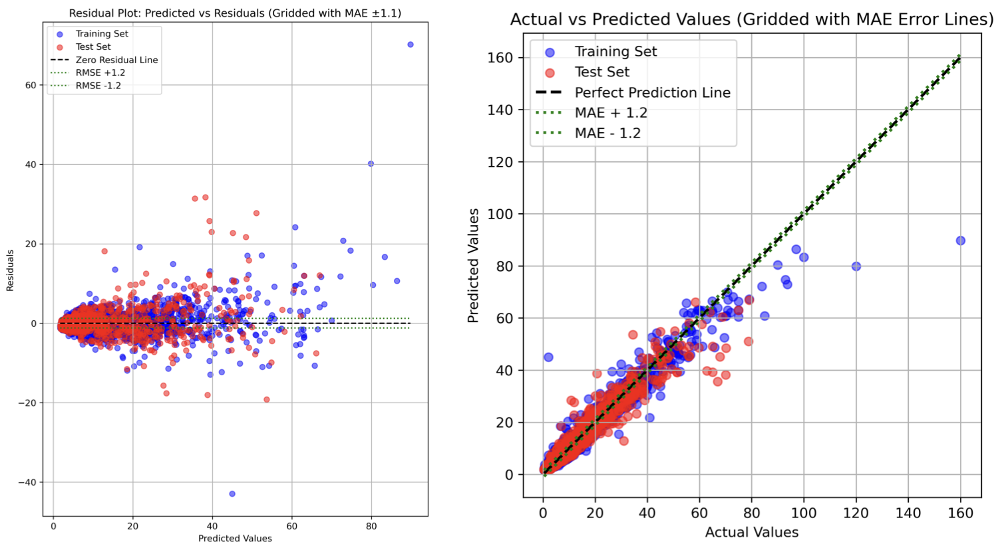

In [176]:
from IPython.display import Image, display

# Display the image
display(Image(filename='/Users/deb/Desktop/MIT_course/Capstone_project/Your_work/RF_Tuned_2_performance.png'))

The two plots demonstrate that the RF Tuned 2 model provides strong predictive performance. In the **residual plot** (left), most residuals are tightly clustered around 0, indicating minimal prediction errors, with both training (blue) and test set (red) points overlapping closely. This suggests that the model generalizes well across both datasets without overfitting. Additionally, most of the residuals lie within ±1.1 MAE bounds, showing consistent accuracy. In the **actual vs. predicted plot** (right), the points align closely along the perfect prediction line (black dashed line), indicating accurate predictions. Most values fall within the MAE error range (green dotted lines), confirming that the model makes reliable predictions. **These visualizations highlight that RF Tuned 2 handles both training and test data effectively, particularly for lower-priced cars, making it the most balanced and reliable model.**

* Below is the plot showing relative importance of features for Random Forest Tuned 2 Model.

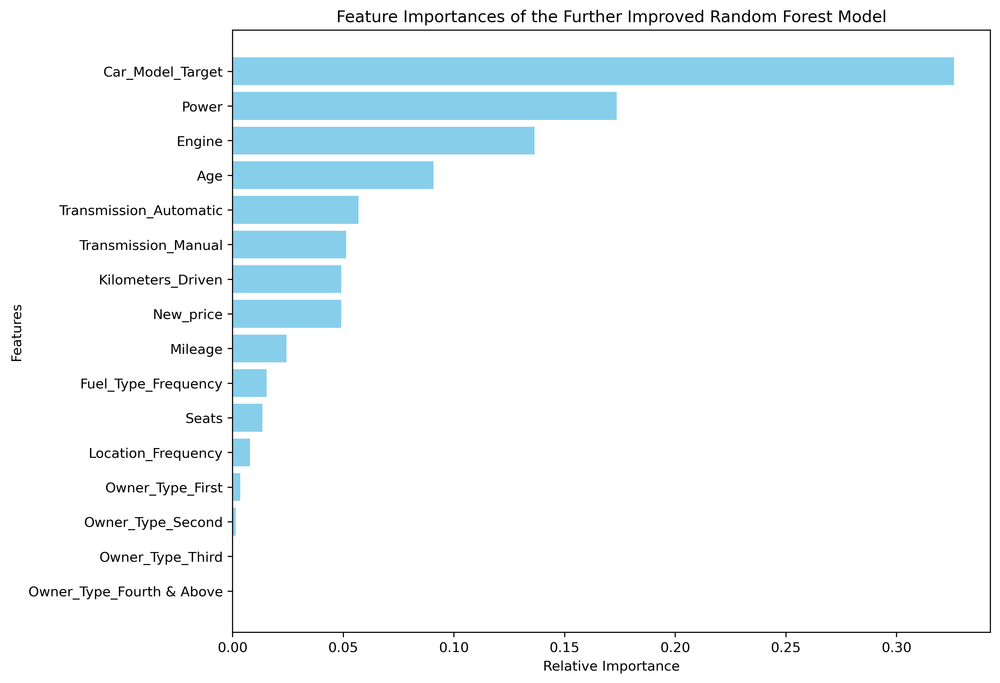

In [191]:
from IPython.display import Image, display

# Display the image
display(Image(filename='/Users/deb/Desktop/MIT_course/Capstone_project/Your_work/Feature_importance_RF_tuned_2.png'))

### **Feature Importance for Random Forest Tuned 2 Model**

* The **Car_Model_Target** feature plays the most significant role in determining car prices. This feature reflects the target encoding of car models, grouping models based on their market value and demand. Cars from popular and well-regarded models (such as Maruti Swift or Honda City) tend to retain higher resale values due to brand trust and demand in the market.

* The car's **Power**, is the second most important feature. Vehicles with more powerful engines, such as sports cars or luxury sedans, are valued higher because they offer superior performance and appeal to buyers looking for better driving experiences.

* **Engine** capacity also plays a crucial role in determining price. Cars with larger engines are often priced higher as they offer better performance, especially for SUVs and premium models. However, larger engines might reduce fuel efficiency, which could affect certain buyer preferences.

* **Age** has a strong influence on price through depreciation. As cars get older, they lose value due to wear and tear, reduced technology appeal, and lower reliability. Buyers generally prefer newer models, making older vehicles less desirable in the resale market.

* The type of **Transmission (automatic or manual)** impacts resale value. Automatic cars typically have higher prices due to their convenience and ease of driving, especially in urban areas. Manual cars, on the other hand, retain value in specific markets due to lower maintenance costs and better fuel economy.

* The **Kilometers_Driven** feature reflects the car’s usage. Higher mileage indicates more wear and tear, which decreases the car’s value. Conversely, cars with lower mileage are seen as better maintained, which makes them more attractive to buyers and commands higher prices.

* The **New_price** feature captures the new purchase price of the vehicle. New cars that are expensive typically will also have higher resale values, though the rate of depreciation varies among different categories and models.

* **Mileage**, referring to the car’s fuel efficiency (kilometers per liter), is another important factor. Fuel-efficient cars are highly desirable, especially in markets where fuel economy is prioritized, resulting in higher resale value.

* The **Fuel_Type_Frequency** feature encodes the type of fuel (petrol, diesel, or CNG). Diesel cars often have higher resale values due to their better fuel economy and longer engine life, though this varies depending on market trends and government policies.

* The **Seats** feature reflects the seating capacity of the car. Vehicles with more seats, such as SUVs and vans, tend to have higher resale prices due to their utility for larger families or businesses. Smaller cars with fewer seats usually attract different buyer segments and are priced accordingly.

* The car's resale **Location**, encoded using frequency, reflects regional variations in resale value. Cars from larger cities, where demand is higher, tend to fetch better prices. In contrast, cars from smaller towns may not have the same resale value due to lower demand.

Finally, Owner_Type indicates the number of previous owners. First-owner cars generally retain the highest value, as they are perceived to be better maintained. Cars with multiple previous owners often experience reduced resale value, as potential buyers associate them with higher wear and uncertain maintenance history.

These insights highlight the factors that most influence the resale value of used cars. The Car_Model_Target, Power, and Engine features stand out as the primary drivers, while Mileage, Transmission, and Ownership add important layers to pricing strategies.




### **Justification for Choosing the Tuned Random Forest Model:**

* **High Predictive Accuracy:** The tuned Random Forest model has demonstrated the highest performance among all the models evaluated. It has the highest Test Adjusted R² of 0.93 and the lowest Test RMSE of 2.8 lakhs, which means it explains 93% of the variance in the test data and has the least amount of error compared to other models.

* **Feature Engineering:** Several features were engineered, including car model, manufacturer, age, and categorical encodings (target and frequency encoding), to improve the model’s interpretability and performance. A total of 16 features were used to balance model complexity and performance.

* **Handling Skewed Distribution:** Although the dataset is highly skewed, with 11% of cars priced above 20 lakhs, the model was optimized to perform well across all segments. Attempts to create separate models for high-end cars did not improve results significantly. 

* **Balanced Generalization:** While some models like the initial Decision Tree had very high training accuracy, they performed poorly on test data due to overfitting. The Random Forest, however, provides a good balance between training and test performance (95% vs 93%), indicating that it generalizes well to new data.

* **Robustness and Flexibility:** Random Forest is an ensemble method that combines multiple decision trees, making it robust against noise and less prone to overfitting compared to a single decision tree.

* **Minimal Preprocessing Requirements:** Random Forest models generally do not require extensive outlier or missing value treatment, nor do they rely on transformations like log transformations, making them straightforward and efficient to use.

* **Feature Importance Analysis:** The Random Forest model provides insight into the importance of different features, helping to understand which variables have the most influence on car prices. This interpretability is crucial for business decision-making and improving the model further. 

* **Minimal Hyperparameter Tuning:** The negligible performance improvement of the Random Forest model after tuning indicates that it is effective even with default parameters. This minimizes the time and resources required for extensive hyperparameter optimization, making it a more efficient solution.

* **Scalability and Performance:** Random Forest can handle large datasets and complex feature interactions better than linear models. Given that the dataset contains a variety of features like model, age, kilometers driven, and price, the Random Forest can capture these interactions well and provide accurate predictions.

### **Implementation Plan:**

* **Model Deployment:** Deploy the tuned Random Forest model for predicting car prices. Use the best hyperparameters identified during tuning for optimal performance. The model is optimized with 400 trees, a minimum split of 5 samples, 2 samples per leaf, a minimum impurity decrease of 0.01, up to 300 leaf nodes, square root selection for features, and a maximum depth of 25.

* **Monitor and Update:** Continuously monitor the model’s performance on new data. If the model performance degrades over time, consider updating the model with new data or re-tuning the hyperparameters.

* **Interpretability and Reporting:** Use the feature importance plot and decision tree structures to explain the model’s predictions to stakeholders, ensuring transparency and trust in the model.

In summary, the tuned Random Forest model is the best solution due to its superior accuracy, robustness, and interpretability. It provides a reliable and efficient approach to predicting car prices, making it the ideal model to adopt for the final solution design. 

##   **Recommendations for Implementation**


### **Key Recommendations to Implement the Solution**

**Focus on Popular Models and Manufacturers:**  
Cars4U should prioritize sourcing cars from **popular manufacturers** such as **Maruti and Hyundai**, which dominate the resale market with high demand and better resale value. Specific models, including the **Maruti Swift, Hyundai i10, and Honda City**, have shown consistent turnover and profitability, making them ideal for inventory focus. Although **luxury brands like BMW, Audi, and Mercedes-Benz** account for a smaller portion of sales, they significantly contribute to profit margins due to **higher prices and brand prestige**. A balanced inventory of **budget-friendly models and premium cars** will ensure both **quick sales** and **higher profitability**.

**Age-Based and Mileage-Based Pricing Strategy:**  
Since the analysis shows that **car age has a strong negative impact** on resale prices, Cars4U should implement a **tiered pricing strategy**, categorizing cars into **0-3 years, 3-5 years, and 5+ years** segments. Offering **discounts for older cars** and bundling **extended warranties or service packages** will help attract buyers for older vehicles. Additionally, cars with **lower mileage**—which tend to have lower resale value—could be sold with **fuel vouchers or maintenance discounts** to enhance their appeal and offset the impact of higher running costs.

**Optimize Regional Inventory and Pricing:**  
Cars4U can optimize its **inventory and pricing strategies** by taking advantage of **regional market preferences**. For example, **automatic cars** have higher demand in **Bangalore, Mumbai and Coimbatore**, where customers prefer convenience, while **diesel cars** still perform well in **Delhi** due to their efficiency for long-distance driving. **Bangalore and Coimbatore** are ideal markets for premium cars, while **Pune, Kolkata and Chennai** exhibit lower price variations, indicating a focus on budget-friendly cars. **Localized marketing campaigns** highlighting popular models and tailored pricing strategies will further align Cars4U’s offerings with regional demand.


### **Key Actionables for Stakeholders**

**Leverage Feature Importance in Marketing and Pricing:**  
The RF Tuned 2 model reveals that **Car Model, Age, Kilometers Driven, and Engine Power** are the most influential features affecting prices. Stakeholders should incorporate these features into **price brackets** and **marketing strategies**. Promotions can emphasize **high mileage, recent models, and higher engine power** to appeal to buyers and highlight the key benefits in sales campaigns. Aligning marketing efforts with these insights will **increase buyer interest and conversion rates**.

**Adjust Pricing Based on Market-Specific Preferences:**  
Stakeholders can **refine pricing strategies** by aligning with **location-specific preferences**. For example, **premium pricing for automatic cars** in **Bangalore** or promoting **diesel vehicles in Delhi** will reflect local market demand. By **adjusting prices regionally**, Cars4U will improve its **competitiveness and overall sales performance**.

**Implement Flexible Financing for First-Time Buyers:**  
Since **first-owner cars command a premium**, promoting these vehicles with **flexible payment plans** and **special financing options** will attract first-time buyers. Marketing campaigns can highlight the **better maintenance history and lower wear-and-tear** of first-owner cars, helping justify premium pricing and driving sales.

**Strategically Manage Lower Mileage and Older Vehicles:**
Vehicles with lower mileage (less fuel efficiency) and older models tend to have lower prices due to higher running costs and aging. To improve sales for such cars, Cars4U can provide additional value through service packages, fuel vouchers, or even bundle offers with maintenance discounts, making these vehicles more appealing to potential buyers and helping offset their lower fuel efficiency.

**Promote Diesel and Automatic Cars in Certain Locations:** Diesel vehicles, despite their declining popularity, still hold better resale value in certain markets due to their efficiency for long-distance driving. Marketing these vehicles in regions with a preference for diesel could improve sales performance. Automatic transmission cars command higher prices in cities like Bangalore and Coimbatore, which indicates a preference for comfort and convenience in these urban areas. Emphasizing automatic cars in such regions could improve profitability.

**Collect additional data and Improve the Model:**
Stakeholders should **collect more data on high-end cars** to address the **under-representation of premium vehicles** in the current dataset. **Separating cars based on price** into **budget and luxury categories** and building **different models** will lead to more **accurate predictions**. Additionally, **improving data collection for the New_Price feature**, which had many missing values, will allow the model to **better capture depreciation patterns**. Automating **model retraining with fresh data** will ensure predictions remain **aligned with evolving market trends**.

**Optimize Outlier Management with Targeted Models:**
Since the **RF Tuned 2 model struggles with high-end car predictions** due to limited data, **separate models for high-end and budget cars** will not improve performance, as seen in the analysis. However, after collection of additional data on high-end cars, separate models for budget-fiendly and high-end cars would improve the price predictions. **Integrating external data sources**, such as **market trends and economic indicators**, will help the model **capture subtle factors** influencing luxury car prices, ensuring more reliable predictions.


By following these **recommendations and action steps**, Cars4U can better **meet market demands**, ensuring more **accurate pricing, smoother inventory management, and happier customers**. These efforts will help Cars4U **boost profits, speed up sales, and stay competitive in the long run**.



### **Expected Benefits of the RF Tuned 2 Model**

The RF Tuned 2 model offers significant advantages by capturing the **complex relationships** between features that affect car prices. Its ability to handle **non-linear interactions** among variables such as car model, power, and engine capacity ensures more accurate predictions across diverse car segments. Unlike linear models like OLS and Ridge, which struggle with non-linearity, the Random Forest approach can effectively capture these patterns, resulting in better generalization.

The **high Adjusted R-squared (Adj R²) values** (explaining how much of the variation in car prices the model captures) of the RF Tuned 2 model demonstrate its strong performance and ability to generalize well. With a Train Adj R² of 0.95 and Test Adj R² of 0.93, the model shows minimal overfitting, meaning it performs consistently on both seen and unseen data. Adjusted R² takes into account the number of predictors in the model, making it a more reliable metric than standard R² for evaluating complex models. This balance between training and test performance indicates that the model is capturing the essential patterns in the data without being overly complex, ensuring reliable and accurate predictions across various car segments.

The model's **low Mean Absolute Error (MAE)** of 1.28 lakh INR is particularly beneficial for skewed data, as it ensures that errors are distributed evenly across all price ranges, without large deviations skewing the predictions. This ensures fair and consistent pricing for both low-end and high-end vehicles, minimizing costly pricing errors.

With **multiple decision trees working in an ensemble**, the model achieves a balance between bias and variance, making it robust to noisy data. This means the predictions remain stable even with diverse data points, including high-priced outliers, which are often challenging to predict accurately. The **feature importance insights** generated by the model further add value by highlighting which attributes—such as car model, engine capacity, and power—drive resale prices the most, helping refine inventory and sales strategies.

Another benefit is the model’s ability to **handle missing or noisy data effectively**. Since Random Forest models can handle missing values internally without imputation, it reduces the need for extensive pre-processing. Additionally, hyperparameter tuning ensures that overfitting is minimized, allowing the model to generalize well across both training and test data.

In summary, the **RF Tuned 2 model delivers superior performance by capturing non-linear relationships, minimizing pricing errors with low MAE, and ensuring robust predictions** even for high-end cars. Its interpretability and ability to provide feature-level insights make it an indispensable tool for optimizing Cars4U’s pricing strategies and business decisions.

### **With some rational assumptions to put forward some numbers on costs and benefits for stakeholders**

The **Random Forest Tuned 2 model** offers Cars4U significant financial benefits through more accurate pricing, reducing errors associated with overpricing or underpricing vehicles. Overpriced cars tend to stay in inventory longer, incurring storage and opportunity costs, while underpriced cars sell quickly but with reduced profit margins. With better predictions, the model ensures a more balanced approach, minimizing these risks.

Based on assumptions, Cars4U sells around **5,000 used cars annually**, with most cars priced below 20 lakh INR. On average, each car incurs a **holding cost of 10,000 INR per month**, with typical inventory time being three months. By leveraging the improved accuracy of the RF Tuned 2 model, we can reasonably assume a **reduction in holding time by 0.5 months**, saving about 5,000 INR per car. This translates to **2.5 crore INR in annual savings** from reduced inventory costs alone.

Additionally, with more precise pricing, profit margins are expected to increase by **5% per car**. Assuming an average car price of 10 lakh INR, this yields an extra 50,000 INR per vehicle, amounting to **25 crore INR in increased profits annually**. Combined, the total benefit amounts to **27.5 crore INR** per year.

The operational costs of the model are relatively low, with an **initial development cost of 30 lakh INR** and annual **maintenance estimated at 15 lakh INR**. In the first year, after deducting these costs, the **net benefit stands at approximately 26 crore INR**, with subsequent years yielding around 27 crore INR annually.

In summary, the RF Tuned 2 model not only improves Cars4U’s pricing accuracy but also delivers significant financial benefits through **inventory savings and increased profits**. The relatively low investment cost makes it a highly valuable tool for the company, ensuring better generalization across price ranges and a strong return on investment.

### **Key Risks and Challenges of the Proposed Solution Design**
One of the primary challenges of the RF Tuned 2 model is its **inconsistent performance across different price ranges**, particularly for high-end cars. While the model performs exceptionally well for lower-priced cars, with low RMSE and MAE values, it struggles to predict prices accurately for **cars above 20 lakh INR**. This is reflected in the **higher residuals and RMSE for high-priced cars** (as also seen in the plot above), which impacts the overall reliability of predictions in that segment.

This performance gap can be attributed to the **smaller representation of high-end cars** in the dataset. With only **about 10-11%** of the data comprising premium cars, the model does not have sufficient examples to learn complex patterns specific to luxury vehicles, which often have unique pricing factors like brand prestige, customization, and market fluctuations.

To address this challenge, **collecting more data** on high-priced cars is essential. Increasing the sample size for luxury cars will help the model better understand the factors that influence their pricing, improving prediction accuracy for that segment. Additionally, **separate models for high-end and low-end cars** could be developed and fine-tuned independently, as luxury cars follow different depreciation and pricing patterns compared to budget cars. My approach for the separate models for high-end cars did not perform well since the representation of such cars is low in the current dataset.

Another approach is to **integrate external data sources**, such as market trends, regional demand, and economic factors, which may better capture the variability in high-end car pricing. For example, in develpong cities like Bangalore, Coimbatore the demand for automatic premium cars will keep on increasing, so factoring in regional demand trends could help the model better anticipate shifts in pricing. By accounting for such market dynamics, the model can adjust its predictions more accurately for high-end cars. For instance, premium automatic cars may retain higher resale value in these cities due to rising affluence and increasing preference for convenience. Incorporating such external data will allow the model to capture these nuanced factors and improve its performance, especially for luxury car segments. Moreover, using **ensemble techniques** that combine multiple models, such as blending Random Forest with XGBoost, could also improve performance across diverse price segments.

In summary, while the RF Tuned 2 model performs well for the majority of cars, **its limited accuracy for high-priced vehicles remains a challenge**. **Expanding the dataset for premium cars**, or using **segmented or ensemble modeling strategies**, will be crucial for further enhancing the solution’s effectiveness across all price ranges.

### Further Analysis and Problem-Specific Improvements


**Handling Data Imbalance and Collecting More Data:**  
Since high-end cars account for only 10-11% of the dataset, **oversampling premium cars** or using weighted models will reduce underfitting. Additionally, **collecting more data on high-end cars** will improve the model’s understanding of their pricing dynamics, supporting the development of a more accurate segment-specific model.

**More Data for New_Price:**  
The **New_Price feature** is strongly correlated with resale value but had many missing values, limiting its impact. **Collecting more complete data** for this feature will improve prediction accuracy by better capturing the relationship between original and resale prices, especially for high-end cars.

**Hyperparameter Tuning:**  
Further fine-tuning key hyperparameters like `max_depth`, `min_samples_split`, and `min_samples_leaf` will enhance the RF Tuned 2 model’s ability to capture patterns across both budget and high-end cars. Adjusting `n_estimators` (number of trees) and `max_features` ensures that the model detects meaningful patterns while avoiding overfitting, especially for luxury cars with more complex pricing dynamics.

**Feature Engineering:**  
Introducing interaction terms (e.g., **Power × Mileage**) could help capture relationships between performance and fuel efficiency, particularly for performance-oriented models. Additionally, polynomial features (e.g., square terms for **Power** or **Engine Capacity**) can improve detection of non-linear depreciation patterns, which are common among high-end vehicles.

**Ensemble Techniques:**  
Combining Random Forest with models like Gradient Boosting or XGBoost through **stacking or blending** can further improve predictions. XGBoost’s ability to refine weak learners helps capture subtle patterns among premium cars. This ensemble strategy ensures robustness for budget cars while boosting the model’s sensitivity for high-end segments.

**Cross-Validation Optimization:**  
Increasing the number of cross-validation folds (e.g., 10 or 15) ensures more reliable parameter tuning, especially given the diversity of car prices and outliers. This reduces the risk of overfitting to specific segments, improving generalization across the dataset.

**Outlier Handling and Segment-Specific Models:**  
While the RF Tuned 2 model manages outliers well, extreme values for high-end cars (₹20 lakh and above) still affect accuracy. Creating **separate models for high-end and low-end cars** allows better handling of the unique pricing dynamics in these segments, as luxury cars follow distinct market patterns.

**Incorporate External Data:**  
Integrating **market trends, regional demand, and economic indicators** can better capture the variability in high-end pricing. For example, in cities like **Bangalore** and **Coimbatore**, rising demand for premium automatic cars influences resale value. Incorporating these factors will improve the model’s ability to predict luxury car prices accurately.

**Automation of Model Updates:**  
Implementing an **automated retraining pipeline** will ensure the model remains accurate as market trends evolve. As new car models and technologies emerge, automation keeps the model relevant and responsive to changing conditions.

**Evaluate Model with Business Metrics:**  
Using business metrics—such as **profit margins and sales velocity**—in addition to RMSE and R² will align the model’s outputs with Cars4U’s goals. For example, maintaining steady profit margins despite fluctuations in high-end car predictions validates the model’s business impact.

These improvements will enhance the RF Tuned 2 model’s ability to deliver reliable predictions across all segments. **Collecting more high-end car data and developing segment-specific models** will address current challenges, enabling Cars4U to maintain competitive pricing strategies, operational efficiency, and long-term profitability.
